In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from os import listdir
from os.path import isfile, join

%matplotlib inline

In [2]:
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #radius of curvature of the line in some units
        self.recent_radius_of_curvature = [] 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        
        self.xbase = None

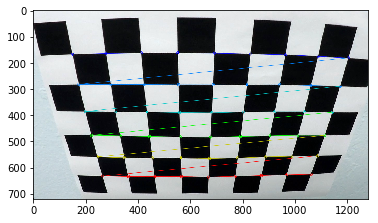

In [3]:
# prepare object points
nx = 9
ny = 6
nyx = (9, 6)

def plot_chessboard_corners(filepath):
    # Make a list of calibration images
    img = cv2.imread(filepath)
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    # If found, draw corners
    if ret == True:
        # Draw and display the corners
        cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        plt.imshow(img)
        plt.show

plot_chessboard_corners('camera_cal/calibration2.jpg')

In [4]:
def cal_undistort(img, objpoints, imgpoints):
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    return undist

#f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
#f.tight_layout()
#ax1.imshow(img)
#ax1.set_title('Original Image', fontsize=50)
#ax2.imshow(undistorted)
#ax2.set_title('Undistorted Image', fontsize=50)
#plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

./camera_cal/calibration6.jpg
./camera_cal/calibration10.jpg
./camera_cal/calibration2.jpg
./camera_cal/calibration8.jpg
./camera_cal/calibration1.jpg
./camera_cal/calibration13.jpg
./camera_cal/calibration9.jpg
./camera_cal/calibration20.jpg
./camera_cal/calibration16.jpg
./camera_cal/calibration5.jpg
./camera_cal/calibration19.jpg
./camera_cal/calibration18.jpg
./camera_cal/calibration7.jpg
./camera_cal/calibration14.jpg
./camera_cal/calibration15.jpg
./camera_cal/calibration11.jpg
./camera_cal/calibration3.jpg
./camera_cal/calibration17.jpg
./camera_cal/calibration12.jpg
./camera_cal/calibration4.jpg


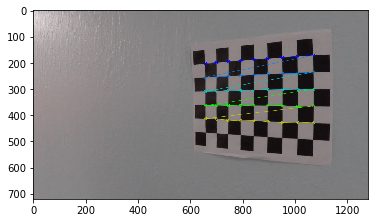

In [5]:
def extract_img_obj_points(nx, ny):
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((nx*ny,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    mypath = "./camera_cal"

    onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]

    # Step through the list and search for chessboard corners
    for file in onlyfiles:
        final_path = mypath + '/' + file
        img = cv2.imread(final_path)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
        print(final_path)
        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

            # Draw and display the corners
            cv2.drawChessboardCorners(img, (9, 5), corners, ret)
            plt.imshow(img)
    return objpoints, imgpoints

objpoints, imgpoints = extract_img_obj_points(nx, ny)

In [6]:
#undistorted = cal_undistort(img, objpoints, imgpoints)

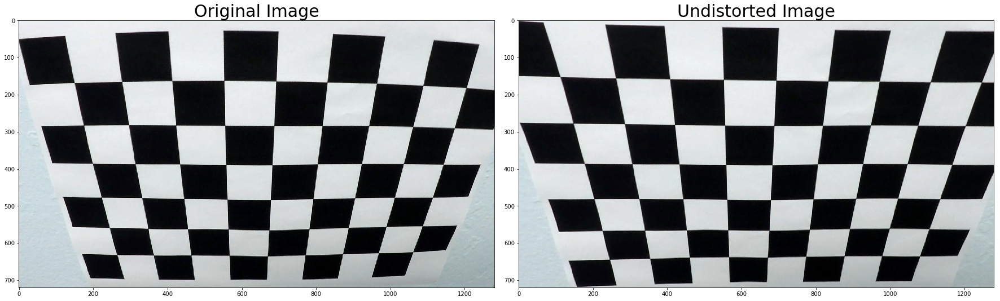

In [7]:
def plot_write_undistored_img():
    # Test undistortion on an image
    fname = 'camera_cal/calibration2.jpg'
    img = cv2.imread(fname)
    img_size = (img.shape[1], img.shape[0])

    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

    dst = cv2.undistort(img, mtx, dist, None, mtx)
    cv2.imwrite('calibration_wide/test_undist.jpg',dst)

    # Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
    dist_pickle = {}
    dist_pickle["mtx"] = mtx
    dist_pickle["dist"] = dist

    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(dst)
    ax2.set_title('Undistorted Image', fontsize=30)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    return mtx, dist
    
mtx, dist = plot_write_undistored_img()

In [8]:
def corners_unwarp(img, mtx, dist):
    # Pass in your image into this function
    # Write code to do the following steps
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    img_size = (img.shape[1], img.shape[0])
    
    offset1 = 280 # offset for dst points x value
    #[572,465],[714,465],[1035,673],[270,673]
    src = np.float32([(575,464),(707,464), (1049,682), (258,682)])
    dst = np.float32([[offset1, 0], [img_size[0]-offset1, 0], 
                      [img_size[0]-offset1, img_size[1]], [offset1, img_size[1]]])

    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped, M, Minv

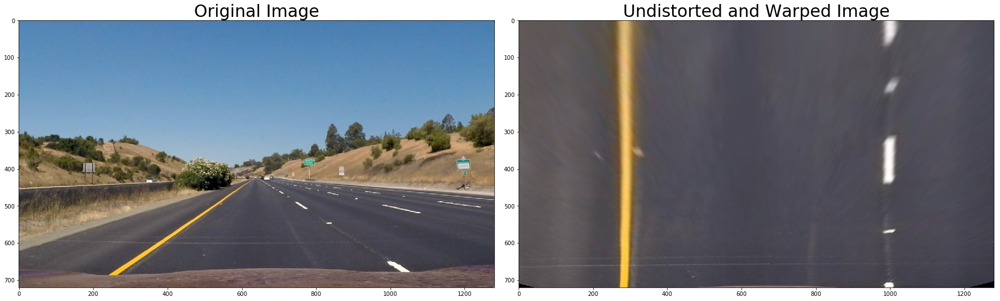

In [9]:
def plot_undistord_warp_img():
    fname = 'test_images/straight_lines1.jpg'
    img_test = cv2.imread(fname)
    rgb = cv2.cvtColor(img_test, cv2.COLOR_BGR2RGB)

    dst_test = cv2.undistort(rgb, mtx, dist, None, mtx)

    top_down, perspective_M, Minv = corners_unwarp(dst_test, mtx, dist)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(rgb)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(top_down)
    ax2.set_title('Undistorted and Warped Image', fontsize=30)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

plot_undistord_warp_img()

In [10]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # Return the result
    return binary_output


def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx ** 2 + sobely ** 2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag) / 255
    gradmag = (gradmag / scale_factor).astype(np.uint8)
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output


def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi / 2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction,
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output = np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output


def hls_select(img, thresh=(0, 255), channel=2):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    S = hls[:, :, channel]
    binary = np.zeros_like(S)
    binary[(S > thresh[0]) & (S <= thresh[1])] = 1
    return binary


def lab_bthresh(img, thresh=(190,255)):
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    lab_b = lab[:,:,2]
    if np.max(lab_b) > 175:
        lab_b = lab_b*(255/np.max(lab_b))
    binary_output = np.zeros_like(lab_b)
    binary_output[((lab_b > thresh[0]) & (lab_b <= thresh[1]))] = 1
    return binary_output

def color_thresh(img):
    HSV = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

    # For yellow
    yellow = cv2.inRange(HSV, (15, 75, 75), (50, 255, 255))

    # For white
    sensitivity_1 = 68
    white = cv2.inRange(HSV, (0,0,255-sensitivity_1), (255,20,255))

    sensitivity_2 = 60
    HSL = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    white_2 = cv2.inRange(HSL, (0,255-sensitivity_2,0), (255,255,sensitivity_2))
    white_3 = cv2.inRange(img, (200,200,200), (255,255,255))

    bit_layer = yellow | white | white_2 | white_3
    
    return bit_layer

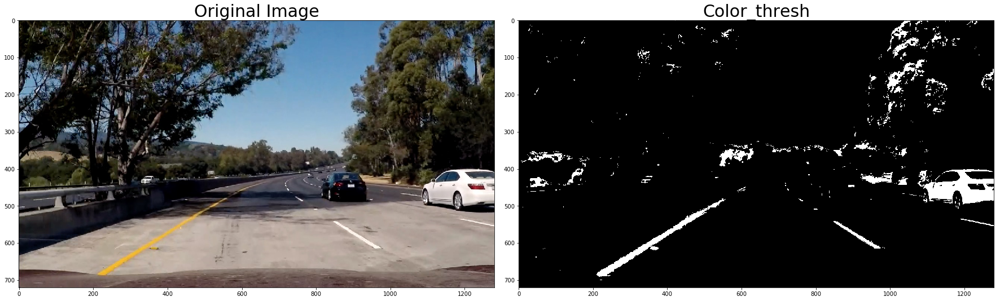

In [11]:
def plot_color_thresh():
    fname = 'test_images/test5.jpg'
    #img_test = cv2.imread(fname)
    img_test = mpimg.imread(fname) 

    res = color_thresh(img_test)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img_test)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(res, cmap='gray')
    ax2.set_title('Color_thresh', fontsize=30)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
plot_color_thresh()

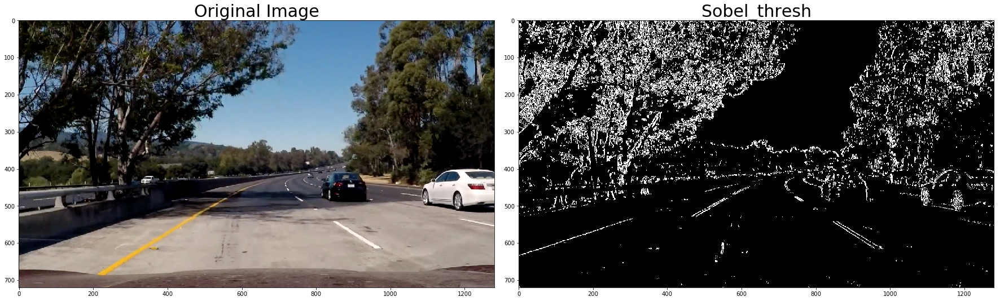

In [12]:
def plot_sobel_thresh_select():
    fname = 'test_images/test5.jpg'
    #img_test = cv2.imread(fname)
    img_test = mpimg.imread(fname) 

    res = abs_sobel_thresh(img_test, thresh=(20, 100))

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img_test)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(res, cmap='gray')
    ax2.set_title('Sobel_thresh', fontsize=30)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
plot_sobel_thresh_select()

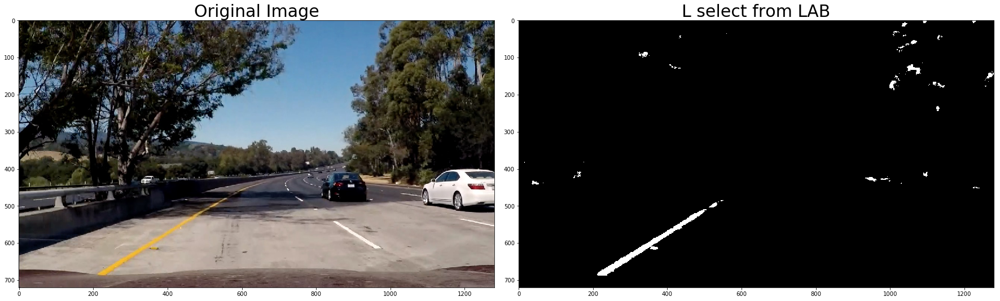

In [13]:
def plot_lab_select():
    fname = 'test_images/test5.jpg'
    #img_test = cv2.imread(fname)
    img_test = mpimg.imread(fname) 

    res = lab_bthresh(img_test, thresh=(190,255))

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img_test)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(res, cmap='gray')
    ax2.set_title('L select from LAB', fontsize=30)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
plot_lab_select()

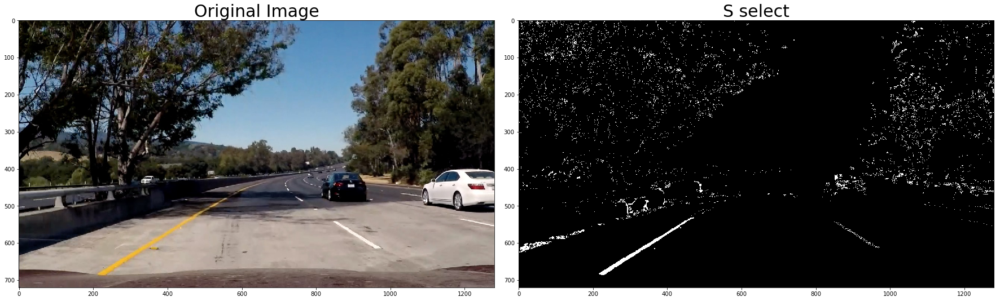

In [14]:
def plot_sls_select():
    fname = 'test_images/test5.jpg'
    #img_test = cv2.imread(fname)
    img_test = mpimg.imread(fname) 

    res = hls_select(img_test, thresh=(170, 240))

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img_test)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(res, cmap='gray')
    ax2.set_title('S select', fontsize=30)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
plot_sls_select()

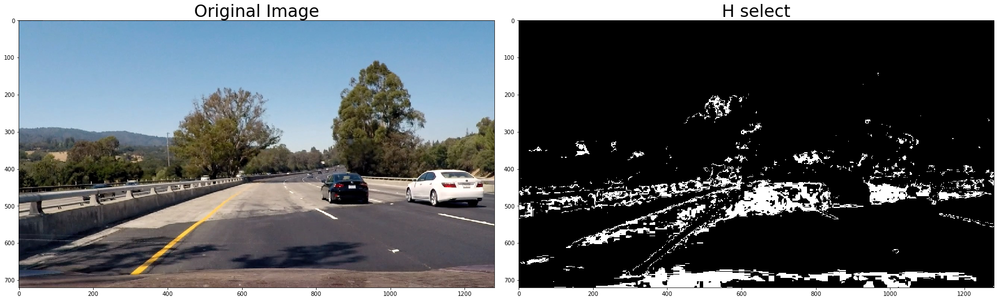

In [15]:
def plot_sls_select():
    fname = 'test_images/test4.jpg'
    #img_test = cv2.imread(fname)
    img_test = mpimg.imread(fname) 

    res = hls_select(img_test, thresh=(8,14), channel=0)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img_test)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(res, cmap='gray')
    ax2.set_title('H select', fontsize=30)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
plot_sls_select()

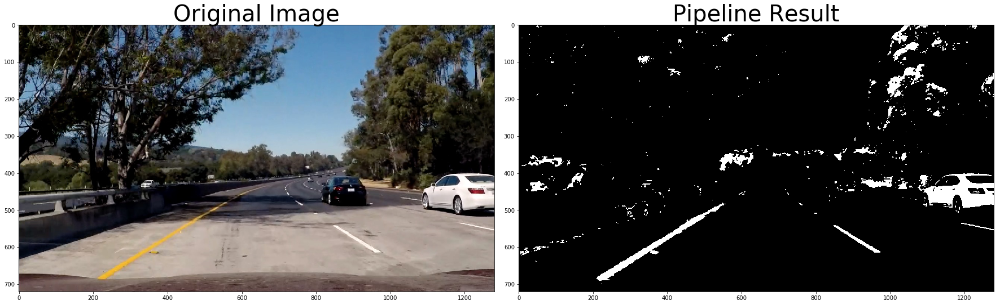

In [16]:
def pipeline(img, s_thresh=(190, 240), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]

    #sxbinary = abs_sobel_thresh(img, thresh=sx_thresh)
    s_color = color_thresh(img)
    s_binary = hls_select(img, thresh=s_thresh)
    
    bthresh = lab_bthresh(img)
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    #np.zeros_like(sxbinary)
    #color_binary = np.dstack((np.zeros_like(sxbinary), sxbinary, sxbinary))
    
    combined_binary = np.zeros_like(s_color)
    combined_binary[(s_binary == 1) | (s_color > 0)| (bthresh == 1)] = 1
    
    #combined_binary = cv2.blur(combined_binary, (1,1))
    combined_binary = cv2.medianBlur(combined_binary,3)
    #combined_binary = cv2.GaussianBlur(combined_binary, (3,3), 0)
    return combined_binary
    
def plot_combi_hls_sobel():
    fname = 'test_images/test5.jpg'
    img_test = mpimg.imread(fname) 

    result = pipeline(img_test)

    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(img_test)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(result, cmap='gray')
    ax2.set_title('Pipeline Result', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

plot_combi_hls_sobel()

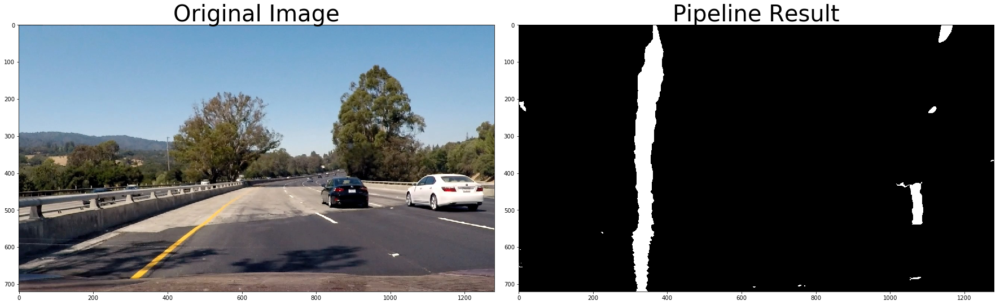

In [17]:
def alternative_pipeline_order(img):
    dst_test = cv2.undistort(img, mtx, dist, None, mtx)
    binary_warped, perspective_M, Minv = corners_unwarp(dst_test, mtx, dist)
    result = pipeline(binary_warped)
    
    return result
    
def plot_alternative_pipeline():
    fname = 'test_images/test4.jpg'
    img_test = mpimg.imread(fname) 
    result = alternative_pipeline_order(img_test)
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(img_test)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(result, cmap='gray')
    ax2.set_title('Pipeline Result', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
plot_alternative_pipeline()

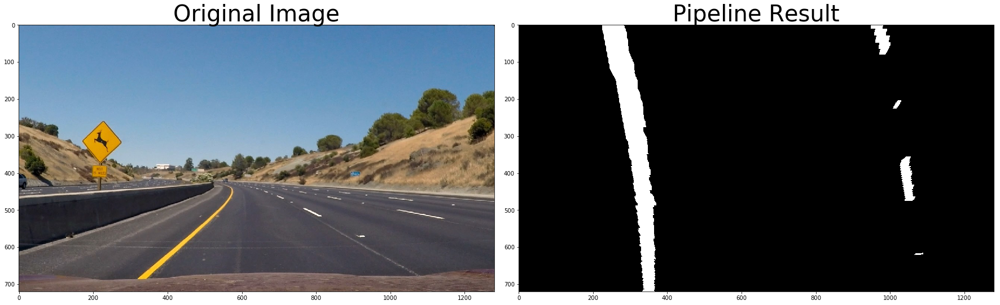

In [18]:
def pipeline_binary_warped(img):
    result = pipeline(img)
    dst_test = cv2.undistort(result, mtx, dist, None, mtx)
    binary_warped, perspective_M, Minv = corners_unwarp(dst_test, mtx, dist)
    return binary_warped, perspective_M, Minv

def plot_preprocessing_warped():
    fname = 'test_images/test2.jpg'
    img_test = mpimg.imread(fname) 

    binary_warped, perspective_M, Minv = pipeline_binary_warped(img_test)
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(img_test)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(binary_warped, cmap='gray')
    ax2.set_title('Pipeline Result', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
plot_preprocessing_warped()

In [19]:
def find_lanes(binary_warped, left_line, right_line):
    # Identify the x and y positions of all nonzero pixels in the image
    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Choose the number of sliding windows
    nwindows = 8

    # Set height of windows
    window_height = np.int(binary_warped.shape[0] / nwindows)
    
    # Current positions to be updated for each window
    leftx_current = left_line.xbase
    rightx_current = right_line.xbase
    
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        #cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        #cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
   
    return left_lane_inds, right_lane_inds, left_line, right_line

In [20]:
def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(warped):
    window_width = 50 
    window_height = 80 # Break image into 9 vertical layers since image height is 720
    margin = 70 # How much to slide left and right for searching
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(warped[int(3*warped.shape[0]/4):,:int(warped.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(warped[int(3*warped.shape[0]/4):,int(warped.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(warped.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(warped.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(warped[int(warped.shape[0]-(level+1)*window_height):int(warped.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,warped.shape[1]))
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,warped.shape[1]))
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))
        
    # If we found any window centers
    if len(window_centroids) > 0:

        # Points used to draw all the left and right windows
        l_points = np.zeros_like(warped)
        r_points = np.zeros_like(warped)

        # Go through each level and draw the windows 
        for level in range(0,len(window_centroids)):
            # Window_mask is a function to draw window areas
            l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
            r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
            # Add graphic points from window mask here to total pixels found 
            l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
            r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

        # Draw the results
        template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
        zero_channel = np.zeros_like(template) # create a zero color channel
        template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
        warpage = np.array(cv2.merge((warped,warped,warped)),np.uint8) # making the original road pixels 3 color channels
        output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results
        #output = template
        output = 1.0*(output[:,:,1] > 50)
        
    # If no window centers found, just display orginal road image
    else:
        print("not found")
        #output = np.array(cv2.merge((warped,warped,warped)),np.uint8)
        output = warped
        
    
    #binary_output = np.zeros_like(output)
    #binary_output[(output >= 0) & (output <= 255)] = 1
    
    return output

(720, 1280)


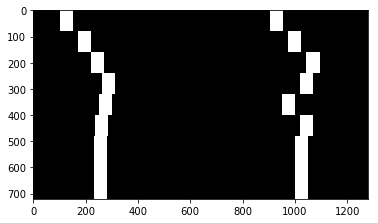

In [21]:
def plot_find_poly(filepath):
    img_test = mpimg.imread(filepath) 

    binary_warped, perspective_M, Minv = pipeline_binary_warped(img_test)
    out_img= find_window_centroids(binary_warped)
    
    print(out_img.shape)
    plt.imshow(out_img, cmap='gray')
   
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    
plot_find_poly('test_images/test5.jpg')

In [22]:
def histogram_starter(binary_warped, left_line, right_line):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    left_line.xbase = leftx_base
    right_line.xbase = rightx_base
    return left_line, right_line, out_img

In [23]:
def fit_poly(binary_warped, left_lane_inds, right_lane_inds, out_img, left_line, right_line):
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Extract left and right line pixel positions
    left_line.allx = nonzerox[left_lane_inds]
    left_line.ally = nonzeroy[left_lane_inds] 
    right_line.allx = nonzerox[right_lane_inds]
    right_line.ally = nonzeroy[right_lane_inds] 

    try:
        # Fit a second order polynomial to left_line
        left_line.current_fit = np.polyfit(left_line.ally, left_line.allx, 2)
    except Exception as e:
        left_line.current_fit = None
        
    try:
        # Fit a second order polynomial to right_line
        right_line.current_fit = np.polyfit(right_line.ally, right_line.allx, 2)
    except Exception as e:
        right_line.current_fit = None

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    #left_fitx = left_line.current_fit[0]*ploty**2 + left_line.current_fit[1]*ploty + left_line.current_fit[2]
    #right_fitx = right_line.current_fit[0]*ploty**2 + right_line.current_fit[1]*ploty + right_line.current_fit[2]

    #left_line.recent_xfitted.append(left_fitx)
    #right_line.recent_xfitted.append(right_fitx)
    #left_line.bestx = left_fitx
    #right_line.bestx = right_fitx
        
    out_img[left_line.ally, left_line.allx] = [255, 0, 0]
    out_img[right_line.ally, right_line.allx] = [0, 0, 255]
    
    return ploty, left_line, right_line, out_img

In [24]:
def sanity_check_line(line, ploty):
    nb_history = 8
    nb_diff_mean = 2
    
    if len(line.recent_xfitted) > nb_history:
        line.recent_xfitted = line.recent_xfitted[-nb_history:]
    
    if line.current_fit != None:
        # diff du current avec les history polynomes
        if len(line.recent_xfitted) > nb_diff_mean:
                line.diffs = line.current_fit - np.mean(line.recent_xfitted[-nb_diff_mean:], axis=0)
        
        tempfitx = line.current_fit[0]*ploty**2 + line.current_fit[1]*ploty + line.current_fit[2]
        ret = cv2.matchShapes(line.best_fit,
                              tempfitx,
                              1,
                              0.0)
        print("ret = {}|taken = {}, diff0 = {}|taken = {}".format(ret,
                                                                  ret < 0.045,
                                                                  line.diffs[0],
                                                                  line.diffs[0] < 0.0005))
        if ret < 0.045:
            # Use the new polygon points to write the next frame due to similarities of last successfully written polygon area
            if np.absolute(line.diffs[0]) < 0.001:
                line.recent_xfitted.append(line.current_fit)

        #TODO change that
        #if np.absolute(line.diffs[0]) < 0.0005:
        # on ajoute le current au history
        
    
    # moyenne des polynomes
    line.best_fit = np.mean(line.recent_xfitted, axis=0)
    
    # on recalcule le fitx avec le best polynome
    # TODO  basé sur le resultat du diff
    line.bestx = line.best_fit[0]*ploty**2 + line.best_fit[1]*ploty + line.best_fit[2]    
    return line

In [25]:
def sanity_check(left_line, righe_line, ploty):
    pass

In [26]:
def find_fit_poly_pipeline(binary_warped, left_line, right_line):
    left_line, right_line, out_img = histogram_starter(binary_warped, left_line, right_line)

    left_lane_inds, right_lane_inds, left_line, right_line = find_lanes(
                                                 binary_warped, left_line, right_line)

    ploty, left_line, right_line, out_img = fit_poly(binary_warped, left_lane_inds,
                                                     right_lane_inds, out_img,
                                                     left_line, right_line)
    left_line= sanity_check_line(left_line, ploty)
    right_line= sanity_check_line(right_line, ploty)
    #sanity_check(left_line, right_line, ploty)
    return ploty, left_line, right_line, out_img

ret = 0.0|taken = True, diff0 = 0.0|taken = True
ret = 0.0|taken = True, diff0 = 0.0|taken = True


/home/steve/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
  


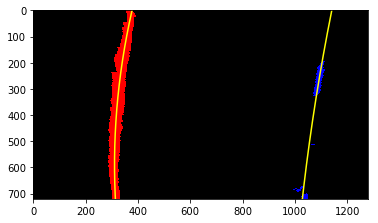

In [27]:
def plot_find_poly(filepath):
    img_test = mpimg.imread(filepath) 
    left_line = Line()
    right_line = Line()
    binary_warped, perspective_M, Minv = pipeline_binary_warped(img_test)
    
    # IN TEST
    #centroids = find_window_centroids(binary_warped)
    
    ploty, left_line, right_line, out_img = find_fit_poly_pipeline(binary_warped,
                                                                  left_line, right_line)
    
    plt.imshow(out_img)
    plt.plot(left_line.bestx, ploty, color='yellow')
    plt.plot(right_line.bestx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    
plot_find_poly('test_images/test1.jpg')

In [28]:
def find_curvature(ploty, fitx):
    y_eval = np.max(ploty)/2
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720  # meters per pixel in y dimension
    xm_per_pix = 3.7/700  # meters per pixel in x dimension
    y_eval = y_eval * ym_per_pix
    fit_cr = np.polyfit(ploty*ym_per_pix, fitx*xm_per_pix, 2)
    curverad = ((1 + (2*fit_cr[0]*y_eval + fit_cr[1])**2)**1.5) \
                                 /np.absolute(2*fit_cr[0])
    return curverad

In [29]:
def process_curvature(ploty, left_fitx, right_fitx):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Calculate the new radii of curvature
    left_curverad = find_curvature(ploty, left_fitx)
    right_curverad = find_curvature(ploty, right_fitx)
    # Now our radius of curvature is in meters
    #print(left_curverad, 'm', right_curverad, 'm')
    return left_curverad, right_curverad
    # Example values: 632.1 m    626.2 m

In [30]:
def find_position(img, left_best_fit, right_best_fit):
    pos_y = img.shape[0]
    pos_x = img.shape[1] / 2
    
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    pos_x_fit_l = left_best_fit[0]*pos_y**2 + left_best_fit[1]*pos_y + left_best_fit[2]
    pos_x_fit_r = right_best_fit[0]*pos_y**2 + right_best_fit[1]*pos_y + right_best_fit[2]
    
    lane_center = (pos_x_fit_l + pos_x_fit_r) / 2
    return (pos_x - lane_center) * xm_per_pix

In [31]:
def write_curvature_img(img, ploty, left_line, right_line):
    left_curverad, right_curverad = process_curvature(ploty, left_line.bestx, right_line.bestx)
    
    left_line.recent_radius_of_curvature.append(left_curverad)
    right_line.recent_radius_of_curvature.append(right_curverad)
    
    left_line.radius_of_curvature = np.mean(left_line.recent_radius_of_curvature[-20:])
    right_line.radius_of_curvature = np.mean(right_line.recent_radius_of_curvature[-20:])
    
    t1 = "Left curvature : {:.2f}m".format(left_line.radius_of_curvature)
    t2 = "Right curvature : {:.2f}m".format(right_line.radius_of_curvature)
    if left_line.radius_of_curvature > 2500:
        t1 = "Left curvature : {}".format("Straight")
    if right_line.radius_of_curvature > 2500:
        t2 = "Right curvature : {}".format("Straight")
    
    t3 = "Car position : {:.2f}m".format(find_position(img, left_line.best_fit, right_line.best_fit))

    cv2.putText(img,t1, (50,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
    cv2.putText(img,t2, (50,100), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
    cv2.putText(img,t3, (50,150), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
    return img

ret = 0.0|taken = True, diff0 = 0.0|taken = True
ret = 0.0|taken = True, diff0 = 0.0|taken = True
855.389815557 m 2693.16896678 m


/home/steve/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
  


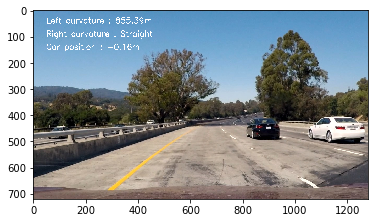

In [32]:
def print_curvature(path):
    img_test = mpimg.imread(path) 
    left_line = Line()
    right_line = Line()
    binary_warped, perspective_M, Minv = pipeline_binary_warped(img_test)
    ploty, left_line, right_line, out_img = find_fit_poly_pipeline(binary_warped,
                                                                  left_line, right_line)
    left_curverad, right_curverad = process_curvature(ploty, left_line.bestx, right_line.bestx)
    print(left_curverad, 'm', right_curverad, 'm')
    
    img_test = write_curvature_img(img_test, ploty, left_line, right_line)
    
    plt.imshow(img_test)
    
print_curvature('test_images/test1.jpg')

ret = 0.0|taken = True, diff0 = 0.0|taken = True
ret = 0.0|taken = True, diff0 = 0.0|taken = True


/home/steve/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
  


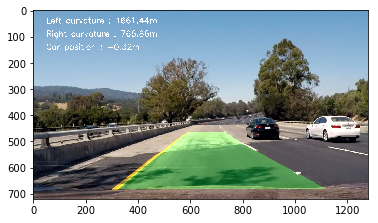

In [33]:
def global_process(img_test, left_line, right_line):
    result = pipeline(img_test)
    dst_test = cv2.undistort(result, mtx, dist, None, mtx)
    binary_warped, perspective_M, Minv = corners_unwarp(dst_test, mtx, dist)
    
    # IN TEST
    #centroids = find_window_centroids(binary_warped)
    
    
    ploty, left_line, right_line, out_img = find_fit_poly_pipeline(binary_warped,
                                                                   left_line, right_line)
    
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_line.bestx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_line.bestx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img_test.shape[1], img_test.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(img_test, 1, newwarp, 0.3, 0)
    
    result = write_curvature_img(result, ploty, left_line, right_line)
    
    #newwarp = cv2.warpPerspective(out_img, Minv, (img_test.shape[1], img_test.shape[0]))
    return result

left_line = Line()
right_line = Line()
result = global_process(mpimg.imread('test_images/test4.jpg'), left_line, right_line)
plt.imshow(result)

In [34]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [35]:
left_line = Line()
right_line = Line()
def process_image(image):
    result = global_process(image, left_line, right_line)
    return result

In [36]:
def global_pipeline_video(input_file, output):
    ## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
    ## To do so add .subclip(start_second,end_second) to the end of the line below
    ## Where start_second and end_second are integer values representing the start and end of the subclip
    ## You may also uncomment the following line for a subclip of the first 5 seconds
    ##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
    clip1 = VideoFileClip(input_file)
    white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
    %time white_clip.write_videofile(output, audio=False)

global_pipeline_video("./project_video.mp4", "./project_video_processed_met3.mp4")

ret = 0.0|taken = True, diff0 = 0.0|taken = True
ret = 0.0|taken = True, diff0 = 0.0|taken = True
[MoviePy] >>>> Building video ./project_video_processed_met2.mp4
[MoviePy] Writing video ./project_video_processed_met2.mp4


  0%|          | 1/1261 [00:00<02:49,  7.44it/s]

ret = 0.0|taken = True, diff0 = 0.0|taken = True
ret = 0.0|taken = True, diff0 = 0.0|taken = True


  0%|          | 2/1261 [00:00<02:42,  7.76it/s]

ret = 0.0|taken = True, diff0 = 0.0|taken = True
ret = 0.0|taken = True, diff0 = 0.0|taken = True


  0%|          | 3/1261 [00:00<02:38,  7.96it/s]

ret = 0.0|taken = True, diff0 = -2.107746103771144e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.6254530559302e-05|taken = True


  0%|          | 4/1261 [00:00<02:33,  8.21it/s]

ret = 0.0|taken = True, diff0 = -2.259026591315319e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.1084910860324819e-05|taken = True


  0%|          | 5/1261 [00:00<02:33,  8.18it/s]

ret = 0.0|taken = True, diff0 = -2.8000760513303947e-07|taken = True
ret = 0.0|taken = True, diff0 = -1.1013838024723493e-06|taken = True


  0%|          | 6/1261 [00:00<02:34,  8.13it/s]

ret = 0.0|taken = True, diff0 = 2.826566424660946e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.715496277963286e-05|taken = True


  1%|          | 7/1261 [00:00<02:40,  7.79it/s]

ret = 0.0|taken = True, diff0 = 1.7666053522361595e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.6840287378308766e-05|taken = True


  1%|          | 8/1261 [00:00<02:40,  7.83it/s]

ret = 0.0|taken = True, diff0 = -2.3748270716885355e-06|taken = True
ret = 0.0|taken = True, diff0 = 6.601277080426978e-05|taken = True


  1%|          | 9/1261 [00:01<02:39,  7.83it/s]

ret = 0.0|taken = True, diff0 = 1.62258034817401e-06|taken = True
ret = 0.0|taken = True, diff0 = 5.228517655712721e-05|taken = True


  1%|          | 10/1261 [00:01<02:39,  7.86it/s]

ret = 0.0|taken = True, diff0 = -1.5730849859464256e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.6925957867740585e-05|taken = True


  1%|          | 11/1261 [00:01<02:40,  7.81it/s]

ret = 0.0|taken = True, diff0 = 4.331013032395987e-06|taken = True
ret = 0.0|taken = True, diff0 = 9.857624294216987e-06|taken = True


  1%|          | 12/1261 [00:01<02:37,  7.91it/s]

ret = 0.0|taken = True, diff0 = 5.868424085882695e-06|taken = True
ret = 0.0|taken = True, diff0 = 4.237991664671488e-06|taken = True


  1%|          | 13/1261 [00:01<02:35,  8.00it/s]

ret = 0.0|taken = True, diff0 = 3.6384205180879485e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.1315519861168295e-06|taken = True


  1%|          | 14/1261 [00:01<02:36,  7.97it/s]

ret = 0.0|taken = True, diff0 = 3.1590973245230894e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.66037076090634e-06|taken = True


  1%|          | 15/1261 [00:01<02:36,  7.94it/s]

ret = 0.0|taken = True, diff0 = 3.054517934100072e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.2644212097502575e-05|taken = True


  1%|▏         | 16/1261 [00:02<02:37,  7.89it/s]

ret = 0.0|taken = True, diff0 = -1.2233334894285917e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.035779712576826e-06|taken = True


  1%|▏         | 17/1261 [00:02<02:36,  7.96it/s]

ret = 0.0|taken = True, diff0 = -9.086812450740826e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.81211342591398e-05|taken = True


  1%|▏         | 18/1261 [00:02<02:36,  7.94it/s]

ret = 0.0|taken = True, diff0 = 2.8517285366319616e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.23108827056823e-05|taken = True


  2%|▏         | 19/1261 [00:02<02:35,  7.98it/s]

ret = 0.0|taken = True, diff0 = 4.286377963273611e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.0030894610918824e-06|taken = True


  2%|▏         | 20/1261 [00:02<02:34,  8.01it/s]

ret = 0.0|taken = True, diff0 = 2.244232031921969e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.5456201290273168e-05|taken = True


  2%|▏         | 21/1261 [00:02<02:35,  7.96it/s]

ret = 0.0|taken = True, diff0 = 6.333918025093425e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.648832591218913e-05|taken = True


  2%|▏         | 22/1261 [00:02<02:37,  7.85it/s]

ret = 0.0|taken = True, diff0 = 3.0412133742787725e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.664291628564369e-06|taken = True


  2%|▏         | 23/1261 [00:02<02:46,  7.44it/s]

ret = 0.0|taken = True, diff0 = -2.7279783256082396e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.710734877756062e-05|taken = True


  2%|▏         | 24/1261 [00:03<02:56,  7.01it/s]

ret = 0.0|taken = True, diff0 = -4.303617655415762e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.545948005238405e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.8069458013115938e-06|taken = True
ret = 0.0|taken = True, diff0 = -5.498687452615107e-05|taken = True


  2%|▏         | 26/1261 [00:03<03:05,  6.64it/s]

ret = 0.0|taken = True, diff0 = -3.538902054539645e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.718833175286586e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.9585779672435035e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.654089936942027e-05|taken = True


  2%|▏         | 27/1261 [00:03<03:20,  6.15it/s]

ret = 0.0|taken = True, diff0 = -1.3966082655247279e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.878124387084685e-05|taken = True


  2%|▏         | 29/1261 [00:03<03:05,  6.63it/s]

ret = 0.0|taken = True, diff0 = -2.0333644659664474e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.2793484509515986e-07|taken = True


  2%|▏         | 31/1261 [00:04<03:34,  5.72it/s]

ret = 0.0|taken = True, diff0 = -3.4680249945927494e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.569032094595848e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.0572699354072514e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.1488630450241067e-05|taken = True


  3%|▎         | 33/1261 [00:04<02:51,  7.16it/s]

ret = 0.0|taken = True, diff0 = -2.3278243304126903e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.9981179074321232e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.3657793236635672e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.9747441323141442e-05|taken = True


  3%|▎         | 34/1261 [00:04<02:52,  7.12it/s]

ret = 0.0|taken = True, diff0 = -3.2017979967942855e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.5632162038704136e-05|taken = True


  3%|▎         | 36/1261 [00:04<03:05,  6.59it/s]

ret = 0.0|taken = True, diff0 = 7.093920872335751e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.7380784050136528e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.56438600782807e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.619637894039956e-05|taken = True


  3%|▎         | 37/1261 [00:05<03:20,  6.11it/s]

ret = 0.0|taken = True, diff0 = -2.4267004013609557e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.9148144525608006e-05|taken = True


  3%|▎         | 39/1261 [00:05<03:27,  5.89it/s]

ret = 0.0|taken = True, diff0 = -2.0183260360471172e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.1103461208952043e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.979900476539297e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.4384577297626251e-05|taken = True


  3%|▎         | 41/1261 [00:05<02:53,  7.05it/s]

ret = 0.0|taken = True, diff0 = 1.3234110539345949e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.153563393426968e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.990736375648435e-06|taken = True
ret = 0.0|taken = True, diff0 = -4.2862432788483745e-05|taken = True


  3%|▎         | 42/1261 [00:05<02:47,  7.29it/s]

ret = 0.0|taken = True, diff0 = 7.830041112819703e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.2373020833969192e-05|taken = True


  3%|▎         | 44/1261 [00:06<03:12,  6.32it/s]

ret = 0.0|taken = True, diff0 = 9.560725430337094e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.6529882381553448e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.3583151315209284e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.627481846331891e-05|taken = True


  4%|▎         | 46/1261 [00:06<03:05,  6.54it/s]

ret = 0.0|taken = True, diff0 = 1.3895441285474296e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.4689989281067026e-06|taken = True
ret = 0.0|taken = True, diff0 = 7.967464873110492e-06|taken = True
ret = 0.0|taken = True, diff0 = 4.167133300455686e-05|taken = True


  4%|▍         | 48/1261 [00:06<02:50,  7.11it/s]

ret = 0.0|taken = True, diff0 = 2.2454772534561806e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.73392921264051e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.7672917435547118e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.9746800163077894e-05|taken = True


  4%|▍         | 49/1261 [00:06<02:59,  6.77it/s]

ret = 0.0|taken = True, diff0 = 1.5085565891186174e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.4665830235399332e-05|taken = True


  4%|▍         | 51/1261 [00:07<03:03,  6.58it/s]

ret = 0.0|taken = True, diff0 = 3.4768759686213665e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.356124402416047e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.5699699042899182e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.6932826421076066e-05|taken = True


  4%|▍         | 53/1261 [00:07<02:45,  7.29it/s]

ret = 0.0|taken = True, diff0 = 4.849558236236039e-06|taken = True
ret = 0.0|taken = True, diff0 = -6.636747375869811e-05|taken = True
ret = 0.0|taken = True, diff0 = -8.475280278940765e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.196800517248435e-05|taken = True


  4%|▍         | 55/1261 [00:07<02:40,  7.53it/s]

ret = 0.0|taken = True, diff0 = 3.2508265041611184e-05|taken = True
ret = 0.0|taken = True, diff0 = 8.390351077853467e-06|taken = True
ret = 0.0|taken = True, diff0 = 4.927526007364471e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.370948025663943e-05|taken = True


  5%|▍         | 57/1261 [00:08<02:35,  7.74it/s]

ret = 0.0|taken = True, diff0 = 1.4478354860889188e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.101249475245419e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.8751092047671254e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.8170631737229718e-05|taken = True


  5%|▍         | 59/1261 [00:08<02:38,  7.57it/s]

ret = 0.0|taken = True, diff0 = 1.3512330767313565e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.7932269967952145e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.3758762625424696e-06|taken = True
ret = 0.0|taken = True, diff0 = 4.8931918722266174e-05|taken = True


  5%|▍         | 61/1261 [00:08<02:44,  7.29it/s]

ret = 0.0|taken = True, diff0 = -1.3177780788075212e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.2739186560639523e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.820152819092117e-06|taken = True
ret = 0.0|taken = True, diff0 = 6.188937040546919e-05|taken = True


  5%|▍         | 63/1261 [00:08<02:32,  7.83it/s]

ret = 0.0|taken = True, diff0 = -2.4434117691424467e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.5833551555933042e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.2233233725213963e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.569843463212868e-05|taken = True


  5%|▌         | 65/1261 [00:09<02:28,  8.04it/s]

ret = 0.0|taken = True, diff0 = -2.7229649994127593e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.3831615557618175e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.7204639576127214e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.883256896164345e-05|taken = True


  5%|▌         | 67/1261 [00:09<02:26,  8.13it/s]

ret = 0.0|taken = True, diff0 = -1.5632412335234305e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.733203350350008e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.733728304889958e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.6407789239399685e-05|taken = True


  5%|▌         | 69/1261 [00:09<02:41,  7.38it/s]

ret = 0.0|taken = True, diff0 = -3.4076744584730966e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.517751763433422e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.4943986216003864e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.0383476733478823e-05|taken = True


  6%|▌         | 71/1261 [00:09<02:45,  7.20it/s]

ret = 0.0|taken = True, diff0 = -6.059056443653453e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.3239438907745474e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.057912298910537e-06|taken = True
ret = 0.0|taken = True, diff0 = 5.447066728237745e-05|taken = True


  6%|▌         | 73/1261 [00:10<02:37,  7.53it/s]

ret = 0.0|taken = True, diff0 = 1.2382487904186932e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.803636155930937e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.428796405037586e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.734067141615162e-05|taken = True


  6%|▌         | 75/1261 [00:10<02:39,  7.42it/s]

ret = 0.0|taken = True, diff0 = 3.1171170985387257e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.4031632738722706e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.3721414126997056e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.0291236817317876e-05|taken = True


  6%|▌         | 77/1261 [00:10<02:40,  7.36it/s]

ret = 0.0|taken = True, diff0 = 4.2749668484590986e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.0038164524757033e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.171371034345081e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.549967039297738e-05|taken = True


  6%|▋         | 79/1261 [00:11<02:36,  7.58it/s]

ret = 0.0|taken = True, diff0 = 1.1866098617831022e-06|taken = True
ret = 0.0|taken = True, diff0 = -7.252765445427858e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.4552617850282349e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.5687686839527975e-05|taken = True


  6%|▋         | 81/1261 [00:11<02:36,  7.55it/s]

ret = 0.0|taken = True, diff0 = 2.4492797162480498e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.653277930154941e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.4124154084631992e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.921649683297728e-05|taken = True


  7%|▋         | 83/1261 [00:11<02:30,  7.82it/s]

ret = 0.0|taken = True, diff0 = -3.6796639115397817e-06|taken = True
ret = 0.0|taken = True, diff0 = -8.722256022695697e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.3239200788735268e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.218870388892379e-05|taken = True


  7%|▋         | 85/1261 [00:11<02:35,  7.57it/s]

ret = 0.0|taken = True, diff0 = 1.6056830810870563e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.6829187372209324e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.5377089929637134e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.1205760621539625e-05|taken = True


  7%|▋         | 87/1261 [00:12<02:42,  7.22it/s]

ret = 0.0|taken = True, diff0 = -3.481012001398244e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.0756513684373034e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.925097950151857e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.4265307882258126e-05|taken = True


  7%|▋         | 89/1261 [00:12<02:33,  7.64it/s]

ret = 0.0|taken = True, diff0 = -1.1402606864055397e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.1333225472616605e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.644873632246726e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.9172339642637984e-05|taken = True


  7%|▋         | 91/1261 [00:12<02:37,  7.44it/s]

ret = 0.0|taken = True, diff0 = -4.23802899691948e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.721985068064527e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.58565847329328e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.032852753663861e-05|taken = True


  7%|▋         | 92/1261 [00:12<02:44,  7.09it/s]

ret = 0.0|taken = True, diff0 = -1.9055077777665574e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.096974103112756e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.7006938008228158e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.821361451622506e-05|taken = True


  8%|▊         | 95/1261 [00:13<03:04,  6.33it/s]

ret = 0.0|taken = True, diff0 = 9.257938392675938e-06|taken = True
ret = 0.0|taken = True, diff0 = -5.394768611197891e-06|taken = True
ret = 0.0|taken = True, diff0 = 5.375006414870163e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.5386118777416495e-05|taken = True


  8%|▊         | 97/1261 [00:13<02:48,  6.93it/s]

ret = 0.0|taken = True, diff0 = 4.843739235688296e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.1115245990340067e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.968265453734422e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.425092292123396e-05|taken = True


  8%|▊         | 98/1261 [00:13<02:36,  7.43it/s]

ret = 0.0|taken = True, diff0 = 2.3072689983111863e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.057872153617608e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.277852475016141e-06|taken = True
ret = 0.0|taken = True, diff0 = 4.631324064210203e-06|taken = True


  8%|▊         | 101/1261 [00:14<03:02,  6.35it/s]

ret = 0.0|taken = True, diff0 = 3.169981180262143e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.6484139378163104e-06|taken = True
ret = 0.0|taken = True, diff0 = 9.52904451850261e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.465633477528753e-05|taken = True


  8%|▊         | 102/1261 [00:14<03:10,  6.08it/s]

ret = 0.0|taken = True, diff0 = -9.683249971961284e-07|taken = True
ret = 0.0|taken = True, diff0 = -8.774353452151404e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.990730524852762e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.0802160097409147e-05|taken = True


  8%|▊         | 105/1261 [00:14<03:14,  5.94it/s]

ret = 0.0|taken = True, diff0 = 1.1615992661101595e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.9099995647957e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.3174776886929943e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.6420180942537302e-05|taken = True


  8%|▊         | 107/1261 [00:15<02:46,  6.93it/s]

ret = 0.0|taken = True, diff0 = 1.543463019529695e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.1336244623100748e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.8791614780598788e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.5936592924610753e-05|taken = True


  9%|▊         | 109/1261 [00:15<02:38,  7.25it/s]

ret = 0.0|taken = True, diff0 = -2.669559208328629e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.318257666379249e-07|taken = True
ret = 0.0|taken = True, diff0 = -1.4541374207261283e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.399370882711984e-05|taken = True


  9%|▉         | 111/1261 [00:15<02:37,  7.28it/s]

ret = 0.0|taken = True, diff0 = 5.8946854526859525e-06|taken = True
ret = 0.0|taken = True, diff0 = 5.391833309238506e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.6735011254585353e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.8000153295517654e-05|taken = True


  9%|▉         | 113/1261 [00:15<02:31,  7.57it/s]

ret = 0.0|taken = True, diff0 = 4.2047974362115757e-07|taken = True
ret = 0.0|taken = True, diff0 = 3.379143625544757e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.95005926400474e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.7460009544478974e-05|taken = True


  9%|▉         | 115/1261 [00:16<02:26,  7.85it/s]

ret = 0.0|taken = True, diff0 = 2.370780072882096e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.1311367405367239e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.808563536028412e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.365771024482333e-05|taken = True


  9%|▉         | 117/1261 [00:16<02:29,  7.64it/s]

ret = 0.0|taken = True, diff0 = -4.640150546732967e-06|taken = True
ret = 0.0|taken = True, diff0 = -4.716135685872762e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.8877279681968763e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.5974897187866703e-06|taken = True


  9%|▉         | 119/1261 [00:16<02:25,  7.87it/s]

ret = 0.0|taken = True, diff0 = -2.0825077056325193e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.2870753327874233e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.059499332550903e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00014224140728379142|taken = True


 10%|▉         | 121/1261 [00:16<02:28,  7.67it/s]

ret = 0.0|taken = True, diff0 = 3.0021244481532217e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.308888951524387e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.3364160330667875e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.503722600890126e-05|taken = True


 10%|▉         | 123/1261 [00:17<02:26,  7.74it/s]

ret = 0.0|taken = True, diff0 = 3.183753387464908e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.106360740621919e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.64164031364651e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.413061333326704e-05|taken = True


 10%|▉         | 125/1261 [00:17<02:28,  7.66it/s]

ret = 0.0|taken = True, diff0 = -4.827883368476783e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.2126890316665903e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.1727962236116093e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.452388050819623e-05|taken = True


 10%|█         | 127/1261 [00:17<02:23,  7.92it/s]

ret = 0.0|taken = True, diff0 = 1.1550238794546727e-05|taken = True
ret = 0.0|taken = True, diff0 = -8.639225747646416e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.6721621681240047e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.570695600352595e-05|taken = True


 10%|█         | 129/1261 [00:18<02:30,  7.50it/s]

ret = 0.0|taken = True, diff0 = -1.3614222173968224e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.142323131839002e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.1700394998572545e-06|taken = True
ret = 0.0|taken = True, diff0 = 6.332123697414324e-06|taken = True


 10%|█         | 131/1261 [00:18<02:19,  8.11it/s]

ret = 0.0|taken = True, diff0 = 2.9030312454145414e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.530360455011243e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.95883897019311e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.0326521524906495e-05|taken = True


 11%|█         | 133/1261 [00:18<02:20,  8.04it/s]

ret = 0.0|taken = True, diff0 = 2.302735319484992e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.561298876858624e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.627404544570198e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.4315842534473164e-05|taken = True


 11%|█         | 135/1261 [00:18<02:17,  8.19it/s]

ret = 0.0|taken = True, diff0 = 5.460238519170796e-06|taken = True
ret = 0.0|taken = True, diff0 = 4.242260806501489e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.9578618714829472e-06|taken = True
ret = 0.0|taken = True, diff0 = 6.489397698770737e-06|taken = True


 11%|█         | 137/1261 [00:18<02:15,  8.31it/s]

ret = 0.0|taken = True, diff0 = 1.893980105142703e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.123282990607457e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.4062715450438246e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.3235545758744598e-05|taken = True


 11%|█         | 139/1261 [00:19<02:19,  8.07it/s]

ret = 0.0|taken = True, diff0 = 1.126781459906981e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.1813512577105059e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.9369757299305252e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.2349577177323415e-05|taken = True


 11%|█         | 141/1261 [00:19<02:23,  7.80it/s]

ret = 0.0|taken = True, diff0 = 1.6690241200450784e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.718334195092188e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.7032561102354164e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.060106209854419e-05|taken = True


 11%|█▏        | 143/1261 [00:19<02:22,  7.87it/s]

ret = 0.0|taken = True, diff0 = -1.62862178199407e-05|taken = True
ret = 0.0|taken = True, diff0 = -8.27877077472103e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.007703599852636e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.3369428901078607e-05|taken = True


 11%|█▏        | 145/1261 [00:20<02:24,  7.72it/s]

ret = 0.0|taken = True, diff0 = 4.036624259968493e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.205975550118497e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.0847796311534316e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.6386495921257255e-05|taken = True


 12%|█▏        | 147/1261 [00:20<02:23,  7.74it/s]

ret = 0.0|taken = True, diff0 = 2.0157431892506056e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.9588106251133475e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.9639452669754877e-07|taken = True
ret = 0.0|taken = True, diff0 = 6.803138251338003e-05|taken = True


 12%|█▏        | 149/1261 [00:20<02:26,  7.58it/s]

ret = 0.0|taken = True, diff0 = 1.534187403090542e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.113362256732924e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.3837560934242302e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.2695729630180898e-06|taken = True


 12%|█▏        | 151/1261 [00:20<02:26,  7.57it/s]

ret = 0.0|taken = True, diff0 = -2.814511686893354e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.0983832424446565e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.097147395671353e-06|taken = True
ret = 0.0|taken = True, diff0 = -7.616399212887148e-05|taken = True


 12%|█▏        | 153/1261 [00:21<02:26,  7.58it/s]

ret = 0.0|taken = True, diff0 = 3.1195192206126085e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.0171821817896442e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.1966333440229014e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.202742985771478e-05|taken = True


 12%|█▏        | 155/1261 [00:21<02:28,  7.46it/s]

ret = 0.0|taken = True, diff0 = -9.888086958394449e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.898813501295572e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.5068634319448149e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.743305019493983e-05|taken = True


 12%|█▏        | 156/1261 [00:21<02:30,  7.35it/s]

ret = 0.0|taken = True, diff0 = 1.445455754521103e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.3080856643477535e-05|taken = True


 13%|█▎        | 158/1261 [00:21<02:54,  6.31it/s]

ret = 0.0|taken = True, diff0 = -4.997518439549164e-06|taken = True
ret = 0.0|taken = True, diff0 = -6.622687954920705e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.760383285593527e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.141675143934479e-05|taken = True


 13%|█▎        | 159/1261 [00:22<02:44,  6.68it/s]

ret = 0.0|taken = True, diff0 = -4.3769854684743396e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.206019239000577e-05|taken = True


 13%|█▎        | 160/1261 [00:22<03:09,  5.82it/s]

ret = 0.0|taken = True, diff0 = -2.860536951158904e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.17497373994293e-05|taken = True


 13%|█▎        | 162/1261 [00:22<03:12,  5.70it/s]

ret = 0.0|taken = True, diff0 = 1.5790831851884152e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.194856443035475e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.973863663976964e-06|taken = True
ret = 0.0|taken = True, diff0 = -8.254251465172584e-06|taken = True


 13%|█▎        | 164/1261 [00:22<02:45,  6.64it/s]

ret = 0.0|taken = True, diff0 = 4.790436222750264e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.5815276091964663e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.8392927641541376e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.5087303260326559e-05|taken = True


 13%|█▎        | 166/1261 [00:23<02:35,  7.06it/s]

ret = 0.0|taken = True, diff0 = -5.328552754261281e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.1016462294338855e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.7836671156035123e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.549128617387706e-05|taken = True


 13%|█▎        | 168/1261 [00:23<02:44,  6.63it/s]

ret = 0.0|taken = True, diff0 = -1.537052248813946e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.208025683769715e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.204215511140801e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.6019097567274012e-05|taken = True


 13%|█▎        | 170/1261 [00:23<02:42,  6.72it/s]

ret = 0.0|taken = True, diff0 = 1.874723972505109e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.83562491726443e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.669157342785014e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.097645540796681e-05|taken = True


 14%|█▎        | 172/1261 [00:24<02:40,  6.78it/s]

ret = 0.0|taken = True, diff0 = 2.511331189318603e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.5677582828670002e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.798078376477336e-06|taken = True
ret = 0.0|taken = True, diff0 = -9.330819288696504e-06|taken = True


 14%|█▍        | 174/1261 [00:24<02:38,  6.87it/s]

ret = 0.0|taken = True, diff0 = 1.340455629899947e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.997581001440498e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.663093385235531e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.109337514800009e-05|taken = True


 14%|█▍        | 175/1261 [00:24<02:37,  6.88it/s]

ret = 0.0|taken = True, diff0 = 3.356364593312287e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.701986377469392e-06|taken = True
ret = 0.0|taken = True, diff0 = -7.433683403535092e-06|taken = True
ret = 0.0|taken = True, diff0 = -9.4508588749365e-05|taken = True


 14%|█▍        | 178/1261 [00:24<02:41,  6.70it/s]

ret = 0.0|taken = True, diff0 = 1.7257564357722814e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.8773722691666144e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.614315833936523e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.137545881920644e-05|taken = True


 14%|█▍        | 180/1261 [00:25<02:39,  6.80it/s]

ret = 0.0|taken = True, diff0 = -7.4656280532593125e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.2774883891336218e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.950379609081185e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.3498758390198132e-05|taken = True


 14%|█▍        | 182/1261 [00:25<02:34,  7.01it/s]

ret = 0.0|taken = True, diff0 = -4.411499140760704e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.614417463681282e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.7781964004760482e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.435533835854026e-06|taken = True


 15%|█▍        | 184/1261 [00:25<02:29,  7.22it/s]

ret = 0.0|taken = True, diff0 = -3.765434004326034e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.3257551447886755e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.577174070810841e-05|taken = True
ret = 0.0|taken = True, diff0 = 8.904834431883629e-05|taken = True


 15%|█▍        | 186/1261 [00:26<02:19,  7.71it/s]

ret = 0.0|taken = True, diff0 = -1.7989666615506766e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.3696261318805486e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.5529796941149512e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.293191755736937e-05|taken = True


 15%|█▍        | 188/1261 [00:26<02:35,  6.89it/s]

ret = 0.0|taken = True, diff0 = -2.787909494552385e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.939349172753435e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.5840090554835478e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.26368919562884e-05|taken = True


 15%|█▌        | 190/1261 [00:26<02:28,  7.24it/s]

ret = 0.0|taken = True, diff0 = -1.2067498636698817e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.1820861595373583e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.6202760177723033e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.573411327898902e-05|taken = True


 15%|█▌        | 192/1261 [00:26<02:24,  7.41it/s]

ret = 0.0|taken = True, diff0 = 1.3601686965066776e-05|taken = True
ret = 0.0|taken = True, diff0 = -8.416049657024907e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.0057307767465215e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.4120074387629607e-06|taken = True


 15%|█▌        | 194/1261 [00:27<02:28,  7.16it/s]

ret = 0.0|taken = True, diff0 = 4.559377893990576e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.0238926841029875e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.015904294699837e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.509948072913011e-06|taken = True


 16%|█▌        | 196/1261 [00:27<02:29,  7.11it/s]

ret = 0.0|taken = True, diff0 = 3.306937697469142e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.120524011038068e-06|taken = True
ret = 0.0|taken = True, diff0 = 5.12627031650165e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.309114346751506e-05|taken = True


 16%|█▌        | 198/1261 [00:27<02:22,  7.44it/s]

ret = 0.0|taken = True, diff0 = 1.8731530305726707e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.4542095121245985e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.261150328138314e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.188236297216936e-05|taken = True


 16%|█▌        | 200/1261 [00:27<02:25,  7.31it/s]

ret = 0.0|taken = True, diff0 = 1.2943934255466434e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.4950413554629572e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.609639762016048e-07|taken = True
ret = 0.0|taken = True, diff0 = -1.798646341676262e-05|taken = True


 16%|█▌        | 202/1261 [00:28<02:26,  7.24it/s]

ret = 0.0|taken = True, diff0 = 3.708548949404953e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.1356044635866175e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.0188464410793056e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.5084316821350735e-07|taken = True


 16%|█▌        | 204/1261 [00:28<02:27,  7.17it/s]

ret = 0.0|taken = True, diff0 = -1.250667162756703e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.728436099870412e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.607643235333703e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.198462217933115e-05|taken = True


 16%|█▋        | 206/1261 [00:28<02:32,  6.91it/s]

ret = 0.0|taken = True, diff0 = -2.2386439104570927e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.943043833060287e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.4330498560133668e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.629702727572293e-05|taken = True


 16%|█▋        | 208/1261 [00:29<02:32,  6.91it/s]

ret = 0.0|taken = True, diff0 = -2.2734936031121403e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.6903155815054838e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.5798054556782676e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.7262246978843256e-05|taken = True


 17%|█▋        | 209/1261 [00:29<02:49,  6.22it/s]

ret = 0.0|taken = True, diff0 = -3.4779231975987925e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.3450287778058247e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.8348129663439986e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.6838627792288994e-05|taken = True


 17%|█▋        | 212/1261 [00:29<02:38,  6.60it/s]

ret = 0.0|taken = True, diff0 = -4.244695106947379e-06|taken = True
ret = 0.0|taken = True, diff0 = -9.716600202762816e-07|taken = True
ret = 0.0|taken = True, diff0 = -1.0395564892156582e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.022458928162846e-05|taken = True


 17%|█▋        | 214/1261 [00:30<02:26,  7.16it/s]

ret = 0.0|taken = True, diff0 = -5.526485769624992e-07|taken = True
ret = 0.0|taken = True, diff0 = -6.44483301615597e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.2228752301257455e-05|taken = True
ret = 0.0|taken = True, diff0 = 8.13571421437177e-06|taken = True


 17%|█▋        | 216/1261 [00:30<02:36,  6.68it/s]

ret = 0.0|taken = True, diff0 = -2.3565074784431003e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.356096891195666e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.013119613289988e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.9480798070134497e-05|taken = True


 17%|█▋        | 218/1261 [00:30<02:27,  7.08it/s]

ret = 0.0|taken = True, diff0 = -5.300167742126633e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.186537899370291e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.95935904891549e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.91380071749914e-05|taken = True


 17%|█▋        | 220/1261 [00:30<02:24,  7.21it/s]

ret = 0.0|taken = True, diff0 = -2.3288609558274134e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.381516268927118e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.374892053201308e-06|taken = True
ret = 0.0|taken = True, diff0 = 4.94487231970774e-05|taken = True


 18%|█▊        | 222/1261 [00:31<02:17,  7.53it/s]

ret = 0.0|taken = True, diff0 = 2.5467343125495077e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.798452378933208e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.171108784159543e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.610414973345455e-05|taken = True


 18%|█▊        | 224/1261 [00:31<02:24,  7.17it/s]

ret = 0.0|taken = True, diff0 = 2.1057918379226127e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.576808706211914e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.4582597639417491e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.6466465325668813e-05|taken = True


 18%|█▊        | 226/1261 [00:31<02:16,  7.58it/s]

ret = 0.0|taken = True, diff0 = -1.4467793078389333e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.224349400483393e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.7638187467206142e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.933603503061524e-06|taken = True


 18%|█▊        | 228/1261 [00:31<02:14,  7.67it/s]

ret = 0.0|taken = True, diff0 = 8.28952179769983e-06|taken = True
ret = 0.0|taken = True, diff0 = 6.466395126333447e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.964755202385552e-06|taken = True
ret = 0.0|taken = True, diff0 = -4.320524632489089e-05|taken = True


 18%|█▊        | 230/1261 [00:32<02:11,  7.81it/s]

ret = 0.0|taken = True, diff0 = 2.3328583406640846e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.1347681440072932e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.577910510384926e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.015859746944159e-07|taken = True


 18%|█▊        | 232/1261 [00:32<02:09,  7.96it/s]

ret = 0.0|taken = True, diff0 = 8.191201468915935e-06|taken = True
ret = 0.0|taken = True, diff0 = -0.00010886776717419148|taken = True
ret = 0.0|taken = True, diff0 = 1.4184359057979975e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.805981867835789e-05|taken = True


 19%|█▊        | 234/1261 [00:32<02:02,  8.41it/s]

ret = 0.0|taken = True, diff0 = 3.2257546544728474e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.3055032935285943e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.882184954757148e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.9061986020571573e-05|taken = True


 19%|█▊        | 236/1261 [00:32<02:05,  8.17it/s]

ret = 0.0|taken = True, diff0 = 1.623703122814423e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.059814274943675e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.7063826656133244e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.948424992077483e-06|taken = True


 19%|█▉        | 238/1261 [00:33<02:22,  7.16it/s]

ret = 0.0|taken = True, diff0 = -2.313287990273388e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.379879405675506e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.9770062241217885e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.5923814117103635e-05|taken = True


 19%|█▉        | 240/1261 [00:33<02:16,  7.49it/s]

ret = 0.0|taken = True, diff0 = 1.4187716922266593e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.2435689925377337e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.181811473618667e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.691015259557051e-05|taken = True


 19%|█▉        | 242/1261 [00:33<02:27,  6.90it/s]

ret = 0.0|taken = True, diff0 = -6.873005982463318e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.3840882274630648e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.582269717256176e-07|taken = True
ret = 0.0|taken = True, diff0 = -1.0896631077016557e-05|taken = True


 19%|█▉        | 243/1261 [00:33<02:39,  6.39it/s]

ret = 0.0|taken = True, diff0 = 1.7465879475796398e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.920534863584486e-05|taken = True


 19%|█▉        | 245/1261 [00:34<02:54,  5.82it/s]

ret = 0.0|taken = True, diff0 = -1.4869152337323348e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.64479100055755e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.8455420915301838e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.527786112804987e-05|taken = True


 20%|█▉        | 247/1261 [00:34<02:43,  6.18it/s]

ret = 0.0|taken = True, diff0 = -2.7104732519711463e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.598250776829255e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.440026461181363e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.3852815535893876e-05|taken = True


 20%|█▉        | 249/1261 [00:34<02:35,  6.51it/s]

ret = 0.0|taken = True, diff0 = -3.721229018562131e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.5973391924950465e-06|taken = True
ret = 0.0|taken = True, diff0 = -7.313445441627651e-06|taken = True
ret = 0.0|taken = True, diff0 = -4.1396424610646985e-05|taken = True


 20%|█▉        | 251/1261 [00:35<02:25,  6.94it/s]

ret = 0.0|taken = True, diff0 = -1.6217587832638588e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.782222063187111e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.160327875449261e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.652626742546862e-05|taken = True


 20%|██        | 253/1261 [00:35<02:36,  6.46it/s]

ret = 0.0|taken = True, diff0 = 2.8913558532635655e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.142725010538743e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.449093536491869e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.9136142963581187e-07|taken = True


 20%|██        | 255/1261 [00:35<02:42,  6.20it/s]

ret = 0.0|taken = True, diff0 = -7.227615209591472e-06|taken = True
ret = 0.0|taken = True, diff0 = -4.757216726227609e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.982492280551453e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.5454393277460732e-05|taken = True


 20%|██        | 257/1261 [00:36<02:39,  6.31it/s]

ret = 0.0|taken = True, diff0 = -1.3381515108149575e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.1274418209870353e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.154453293675494e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.000617762892118e-05|taken = True


 20%|██        | 258/1261 [00:36<02:37,  6.37it/s]

ret = 0.0|taken = True, diff0 = 3.507650107536267e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.1435822258118675e-05|taken = True


 21%|██        | 260/1261 [00:36<02:53,  5.78it/s]

ret = 0.0|taken = True, diff0 = 2.552302121374447e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.7623579315172646e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.079778386423372e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.580884940224504e-05|taken = True


 21%|██        | 262/1261 [00:37<02:30,  6.62it/s]

ret = 0.0|taken = True, diff0 = 4.7571014601585344e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.668930351185233e-05|taken = True
ret = 0.0|taken = True, diff0 = 8.300914221698872e-07|taken = True
ret = 0.0|taken = True, diff0 = -1.600445766059431e-05|taken = True


 21%|██        | 264/1261 [00:37<02:20,  7.11it/s]

ret = 0.0|taken = True, diff0 = 3.411606213839935e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.4205352298151605e-06|taken = True
ret = 0.0|taken = True, diff0 = 5.5451989296611734e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.004563499440382e-07|taken = True


 21%|██        | 266/1261 [00:37<02:22,  7.00it/s]

ret = 0.0|taken = True, diff0 = -4.2867221977854346e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.470899120250372e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.3471618850556635e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.6452794295346588e-05|taken = True


 21%|██▏       | 268/1261 [00:37<02:26,  6.77it/s]

ret = 0.0|taken = True, diff0 = -9.325584176950597e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.524015456951143e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.5319623485902305e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.4871137247581722e-05|taken = True


 21%|██▏       | 270/1261 [00:38<02:28,  6.69it/s]

ret = 0.0|taken = True, diff0 = -4.7417951930654484e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.4568004247120138e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.537013427651887e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.4111479040525344e-05|taken = True


 22%|██▏       | 272/1261 [00:38<02:22,  6.93it/s]

ret = 0.0|taken = True, diff0 = 5.444902524097406e-07|taken = True
ret = 0.0|taken = True, diff0 = 4.63209921344038e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.5400980249337777e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.341045102547279e-06|taken = True


 22%|██▏       | 274/1261 [00:38<02:18,  7.11it/s]

ret = 0.0|taken = True, diff0 = -6.466624277287581e-06|taken = True
ret = 0.0|taken = True, diff0 = 5.8084554593930155e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.5896409040073783e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.0555336988577324e-05|taken = True


 22%|██▏       | 276/1261 [00:39<02:19,  7.05it/s]

ret = 0.0|taken = True, diff0 = 1.8032651762154656e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.616058909246816e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.768657483543182e-06|taken = True
ret = 0.0|taken = True, diff0 = 4.193452392315545e-05|taken = True


 22%|██▏       | 278/1261 [00:39<02:19,  7.03it/s]

ret = 0.0|taken = True, diff0 = 3.8038658884046014e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.4990471459995207e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.172765928314086e-06|taken = True
ret = 0.0|taken = True, diff0 = -8.648197393259789e-05|taken = True


 22%|██▏       | 280/1261 [00:39<02:21,  6.93it/s]

ret = 0.0|taken = True, diff0 = -7.31503763657423e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.5328182381801554e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.5113994779031124e-06|taken = True
ret = 0.0|taken = True, diff0 = 9.127447504337727e-06|taken = True


 22%|██▏       | 282/1261 [00:39<02:12,  7.38it/s]

ret = 0.0|taken = True, diff0 = 2.300317830819572e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.343345122602782e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.0543967479822015e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.351307748859689e-05|taken = True


 23%|██▎       | 284/1261 [00:40<02:10,  7.51it/s]

ret = 0.0|taken = True, diff0 = -8.88950091180405e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.163172321973538e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.284668116959903e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.082726179573503e-06|taken = True


 23%|██▎       | 286/1261 [00:40<02:08,  7.60it/s]

ret = 0.0|taken = True, diff0 = -4.1479103224793703e-07|taken = True
ret = 0.0|taken = True, diff0 = -2.0413883590627337e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.425988506229884e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.294750282224995e-08|taken = True


 23%|██▎       | 288/1261 [00:40<02:09,  7.50it/s]

ret = 0.0|taken = True, diff0 = 1.703722566205593e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.328111201106085e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.4740327960472035e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.381437977725073e-06|taken = True


 23%|██▎       | 290/1261 [00:40<02:09,  7.47it/s]

ret = 0.0|taken = True, diff0 = -1.7108391026684014e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.806575828600905e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.261103614382314e-05|taken = True
ret = 0.0|taken = True, diff0 = -8.216368618618692e-06|taken = True


 23%|██▎       | 292/1261 [00:41<02:09,  7.45it/s]

ret = 0.0|taken = True, diff0 = 4.2462501308839005e-06|taken = True
ret = 0.0|taken = True, diff0 = -4.3262623173372084e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.4370432207458027e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.5703817642985675e-05|taken = True


 23%|██▎       | 294/1261 [00:41<02:13,  7.27it/s]

ret = 0.0|taken = True, diff0 = 2.119129850567143e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.477285703007062e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.334342909032078e-07|taken = True
ret = 0.0|taken = True, diff0 = 5.101039440203765e-05|taken = True


 23%|██▎       | 296/1261 [00:41<02:13,  7.21it/s]

ret = 0.0|taken = True, diff0 = 6.908564986540837e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.6622001346103537e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.811158085567293e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.309240623273371e-05|taken = True


 24%|██▎       | 298/1261 [00:42<02:11,  7.33it/s]

ret = 0.0|taken = True, diff0 = 1.725506950667335e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.506289374273543e-06|taken = True
ret = 0.0|taken = True, diff0 = 6.737474251025387e-06|taken = True
ret = 0.0|taken = True, diff0 = -7.34781639798926e-06|taken = True


 24%|██▍       | 300/1261 [00:42<02:13,  7.22it/s]

ret = 0.0|taken = True, diff0 = -1.275237909621891e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.0517095602660398e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.939850744166395e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.1475725505358733e-05|taken = True


 24%|██▍       | 302/1261 [00:42<02:09,  7.39it/s]

ret = 0.0|taken = True, diff0 = -3.7854507239186465e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.0457060249784557e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.5152566068196027e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.2259264871414084e-06|taken = True


 24%|██▍       | 304/1261 [00:42<02:07,  7.53it/s]

ret = 0.0|taken = True, diff0 = 2.8090294757346295e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.009970419019571e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.5734607728026074e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.4363030772657288e-05|taken = True


 24%|██▍       | 306/1261 [00:43<02:13,  7.15it/s]

ret = 0.0|taken = True, diff0 = 1.514296341688859e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.418981790363285e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.132350228420255e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.534048276911741e-05|taken = True


 24%|██▍       | 308/1261 [00:43<02:09,  7.38it/s]

ret = 0.0|taken = True, diff0 = 4.872853083034081e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.802498250222692e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.448809623030172e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.2170805867532766e-06|taken = True


 25%|██▍       | 310/1261 [00:43<02:07,  7.48it/s]

ret = 0.0|taken = True, diff0 = -3.4355401969931874e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.4364913836774023e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.5038413532163997e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.955500622970234e-05|taken = True


 25%|██▍       | 312/1261 [00:43<02:04,  7.63it/s]

ret = 0.0|taken = True, diff0 = 4.882785896205965e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.295683325695522e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.793972055222364e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.90555993904215e-05|taken = True


 25%|██▍       | 314/1261 [00:44<02:04,  7.62it/s]

ret = 0.0|taken = True, diff0 = -9.733584090136588e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.578186939327069e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.0965248553785893e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.6464495418528823e-05|taken = True


 25%|██▌       | 316/1261 [00:44<02:04,  7.59it/s]

ret = 0.0|taken = True, diff0 = -1.9718995675448414e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.216632131191855e-06|taken = True
ret = 0.0|taken = True, diff0 = -8.183606158199732e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.0148161616077727e-05|taken = True


 25%|██▌       | 318/1261 [00:44<02:06,  7.48it/s]

ret = 0.0|taken = True, diff0 = 7.290173433276387e-06|taken = True
ret = 0.0|taken = True, diff0 = 4.761178245315501e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.864008835045501e-06|taken = True
ret = 0.0|taken = True, diff0 = 7.614546920505427e-05|taken = True


 25%|██▌       | 320/1261 [00:44<02:01,  7.75it/s]

ret = 0.0|taken = True, diff0 = 2.041428328335307e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.3103227542942468e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.5224429706622295e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.7433412792348324e-05|taken = True


 26%|██▌       | 322/1261 [00:45<01:59,  7.88it/s]

ret = 0.0|taken = True, diff0 = 2.9296467534215412e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.5293192887927787e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.6020510894265796e-06|taken = True
ret = 0.0|taken = True, diff0 = -4.660417769862779e-05|taken = True


 26%|██▌       | 324/1261 [00:45<02:00,  7.77it/s]

ret = 0.0|taken = True, diff0 = 1.9701907553995652e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.88621737452708e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.2688401514729421e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.874738421986517e-05|taken = True


 26%|██▌       | 326/1261 [00:45<02:02,  7.62it/s]

ret = 0.0|taken = True, diff0 = -3.997647746588072e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.62203724302983e-08|taken = True
ret = 0.0|taken = True, diff0 = -4.404031850538104e-07|taken = True
ret = 0.0|taken = True, diff0 = -0.00010292508490815144|taken = True


 26%|██▌       | 328/1261 [00:45<01:56,  7.98it/s]

ret = 0.0|taken = True, diff0 = 1.4032152520873576e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.173930292078752e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.928791872545686e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.5597731941831397e-05|taken = True


 26%|██▌       | 330/1261 [00:46<01:55,  8.06it/s]

ret = 0.0|taken = True, diff0 = -1.0152040103847293e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.902100341491156e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.7406742281784286e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.553059099100778e-05|taken = True


 26%|██▋       | 332/1261 [00:46<01:57,  7.93it/s]

ret = 0.0|taken = True, diff0 = -8.09668185085405e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.4833437644066943e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.703263642156057e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.930923043260573e-06|taken = True


 26%|██▋       | 334/1261 [00:46<01:57,  7.86it/s]

ret = 0.0|taken = True, diff0 = -3.2709264324807086e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.781186503216772e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.0675388678338163e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.256381678683227e-05|taken = True


 27%|██▋       | 336/1261 [00:47<01:59,  7.72it/s]

ret = 0.0|taken = True, diff0 = 1.2942290416871103e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.3994941455402055e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.6026590216042752e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.950094757076898e-05|taken = True


 27%|██▋       | 338/1261 [00:47<02:01,  7.58it/s]

ret = 0.0|taken = True, diff0 = 1.8509842901939403e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.45964241942834e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.317795361452484e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.6108715571834846e-05|taken = True


 27%|██▋       | 340/1261 [00:47<01:58,  7.80it/s]

ret = 0.0|taken = True, diff0 = 3.2238414172810635e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.3909367137693914e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.9994448946516243e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.8971816005032266e-05|taken = True


 27%|██▋       | 342/1261 [00:47<01:54,  8.06it/s]

ret = 0.0|taken = True, diff0 = -7.575463519275674e-06|taken = True
ret = 0.0|taken = True, diff0 = 9.148315259724309e-05|taken = True
ret = 0.0|taken = True, diff0 = 8.862490730003881e-06|taken = True
ret = 0.0|taken = True, diff0 = 7.545520008114806e-05|taken = True


 27%|██▋       | 344/1261 [00:48<01:56,  7.88it/s]

ret = 0.0|taken = True, diff0 = -5.7906974983645294e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.4083542292396433e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.0456054333571101e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.6040054440430248e-05|taken = True


 27%|██▋       | 346/1261 [00:48<02:00,  7.59it/s]

ret = 0.0|taken = True, diff0 = -9.386664076161024e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.977978429063735e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.3929769670468003e-06|taken = True
ret = 0.0|taken = True, diff0 = -6.0140703845419654e-06|taken = True


 28%|██▊       | 348/1261 [00:48<02:08,  7.09it/s]

ret = 0.0|taken = True, diff0 = 2.71715031096892e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.0977268271088984e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.3990650238638896e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.3218425201213751e-05|taken = True


 28%|██▊       | 350/1261 [00:48<02:07,  7.14it/s]

ret = 0.0|taken = True, diff0 = 1.2384413068672266e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.354605627562768e-06|taken = True
ret = 0.0|taken = True, diff0 = -4.251625447821499e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.284352019731985e-05|taken = True


 28%|██▊       | 352/1261 [00:49<02:09,  7.04it/s]

ret = 0.0|taken = True, diff0 = -2.231150282363023e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.163647584320824e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.531152527272297e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.2513108442068585e-05|taken = True


 28%|██▊       | 354/1261 [00:49<02:07,  7.12it/s]

ret = 0.0|taken = True, diff0 = 1.3072924468226512e-06|taken = True
ret = 0.0|taken = True, diff0 = 6.109954074830101e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.900093543043172e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.418457734717961e-05|taken = True


 28%|██▊       | 356/1261 [00:49<02:02,  7.39it/s]

ret = 0.0|taken = True, diff0 = -3.350156035561843e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.404901609636824e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.330174828545049e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.1116331750783655e-06|taken = True


 28%|██▊       | 358/1261 [00:50<02:06,  7.13it/s]

ret = 0.0|taken = True, diff0 = -2.6148588739135413e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.76569375284548e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.947487089360522e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.555091095654951e-05|taken = True


 29%|██▊       | 360/1261 [00:50<02:02,  7.33it/s]

ret = 0.0|taken = True, diff0 = 2.4875525498037278e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.717860034586841e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.5920568315119176e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.2692878419206375e-05|taken = True


 29%|██▊       | 362/1261 [00:50<02:06,  7.09it/s]

ret = 0.0|taken = True, diff0 = -6.291827992141428e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.223915911136095e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.7923643644549654e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.057226728594593e-05|taken = True


 29%|██▉       | 364/1261 [00:50<01:58,  7.57it/s]

ret = 0.0|taken = True, diff0 = 5.626633557193605e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.2389344824934502e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.398408910535061e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.172105168270823e-05|taken = True


 29%|██▉       | 366/1261 [00:51<01:58,  7.57it/s]

ret = 0.0|taken = True, diff0 = 5.411593440470199e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.4715509294227126e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.7788629069536886e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.98863099127088e-05|taken = True


 29%|██▉       | 368/1261 [00:51<01:55,  7.74it/s]

ret = 0.0|taken = True, diff0 = 9.15855727743116e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.544034033637898e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.679466366513827e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.3921030628952653e-05|taken = True


 29%|██▉       | 370/1261 [00:51<01:57,  7.57it/s]

ret = 0.0|taken = True, diff0 = 1.0415588913477176e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.488013134229344e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.0948740846227643e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.7593494872884468e-05|taken = True


 30%|██▉       | 372/1261 [00:51<01:55,  7.71it/s]

ret = 0.0|taken = True, diff0 = -4.4054793386053465e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.540489074127874e-05|taken = True
ret = 0.0|taken = True, diff0 = 8.879236827740464e-07|taken = True
ret = 0.0|taken = True, diff0 = -1.9174562899889006e-05|taken = True


 30%|██▉       | 374/1261 [00:52<01:55,  7.69it/s]

ret = 0.0|taken = True, diff0 = -1.2136130524876559e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.433099384205729e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.3639848091985822e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.339916569680601e-05|taken = True


 30%|██▉       | 376/1261 [00:52<01:55,  7.65it/s]

ret = 0.0|taken = True, diff0 = -1.3319755785869895e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.086089594124049e-06|taken = True
ret = 0.0|taken = True, diff0 = -4.7604125458094156e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.2659191255928975e-05|taken = True


 30%|██▉       | 378/1261 [00:52<01:56,  7.59it/s]

ret = 0.0|taken = True, diff0 = -2.477915229039245e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.00010765977252350531|taken = True
ret = 0.0|taken = True, diff0 = -2.740726501403246e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.9897823936872046e-05|taken = True


 30%|███       | 380/1261 [00:52<01:55,  7.66it/s]

ret = 0.0|taken = True, diff0 = -3.0321669352710933e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.540814583570815e-07|taken = True
ret = 0.0|taken = True, diff0 = -1.76901196820809e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.29098324230069e-05|taken = True


 30%|███       | 382/1261 [00:53<02:02,  7.15it/s]

ret = 0.0|taken = True, diff0 = -1.9648864462992562e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.626280601883155e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.021756497361026e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.014890984031207e-05|taken = True


 30%|███       | 384/1261 [00:53<02:02,  7.18it/s]

ret = 0.0|taken = True, diff0 = -3.374311440283042e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.7527056860670797e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.4849377493066889e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.929289934831948e-05|taken = True


 31%|███       | 386/1261 [00:53<02:06,  6.94it/s]

ret = 0.0|taken = True, diff0 = 3.76659847336533e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.825729006376581e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.237094309360116e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.8787664034464776e-06|taken = True


 31%|███       | 388/1261 [00:54<01:58,  7.39it/s]

ret = 0.0|taken = True, diff0 = -5.472684668462495e-06|taken = True
ret = 0.0|taken = True, diff0 = -6.98013992497791e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.821779742226871e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.602516800136456e-06|taken = True


 31%|███       | 390/1261 [00:54<02:02,  7.11it/s]

ret = 0.0|taken = True, diff0 = 9.718624930468807e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.8874508621699718e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.498744673544319e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.0449051857199116e-05|taken = True


 31%|███       | 392/1261 [00:54<01:58,  7.35it/s]

ret = 0.0|taken = True, diff0 = -7.76147420667464e-06|taken = True
ret = 0.0|taken = True, diff0 = 5.575397457497327e-06|taken = True
ret = 0.0|taken = True, diff0 = -4.242647032824434e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.5331902343935654e-05|taken = True


 31%|███       | 394/1261 [00:54<02:00,  7.18it/s]

ret = 0.0|taken = True, diff0 = -6.206197857557719e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.735197289338444e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.7518826386961716e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.05366986405929e-05|taken = True


 31%|███▏      | 396/1261 [00:55<01:57,  7.34it/s]

ret = 0.0|taken = True, diff0 = -2.8904566205596934e-06|taken = True
ret = 0.0|taken = True, diff0 = 6.334433812220186e-07|taken = True
ret = 0.0|taken = True, diff0 = -2.3851146104821606e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.4016096358819946e-05|taken = True


 32%|███▏      | 398/1261 [00:55<02:06,  6.85it/s]

ret = 0.0|taken = True, diff0 = -2.9685051372790446e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.7948789708698308e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.7834196714159155e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.626166922503165e-05|taken = True


 32%|███▏      | 400/1261 [00:55<01:58,  7.28it/s]

ret = 0.0|taken = True, diff0 = -2.0436801525336424e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.936582240332584e-06|taken = True
ret = 0.0|taken = True, diff0 = -7.866420322293039e-07|taken = True
ret = 0.0|taken = True, diff0 = -2.2572468070140827e-05|taken = True


 32%|███▏      | 402/1261 [00:55<02:01,  7.07it/s]

ret = 0.0|taken = True, diff0 = 6.405809419041277e-06|taken = True
ret = 0.0|taken = True, diff0 = 5.126434003397948e-06|taken = True
ret = 0.0|taken = True, diff0 = -9.103922912111423e-07|taken = True
ret = 0.0|taken = True, diff0 = 7.124801419592661e-05|taken = True


 32%|███▏      | 404/1261 [00:56<01:56,  7.36it/s]

ret = 0.0|taken = True, diff0 = 6.122318569173836e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.011064826258843e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.638130516335998e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.313690431471934e-06|taken = True


 32%|███▏      | 406/1261 [00:56<01:57,  7.27it/s]

ret = 0.0|taken = True, diff0 = -6.001587828657948e-06|taken = True
ret = 0.0|taken = True, diff0 = 8.409536735454036e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.527539146479873e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.036382684485603e-06|taken = True


 32%|███▏      | 408/1261 [00:56<01:51,  7.62it/s]

ret = 0.0|taken = True, diff0 = 4.9894495992707165e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.0009957755239487e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.327949451780521e-06|taken = True
ret = 0.0|taken = True, diff0 = 8.65160141895655e-06|taken = True


 33%|███▎      | 410/1261 [00:57<01:53,  7.53it/s]

ret = 0.0|taken = True, diff0 = -5.1469063739792014e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.011139556127041e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.5550654455734298e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.966566886438107e-06|taken = True


 33%|███▎      | 412/1261 [00:57<01:48,  7.83it/s]

ret = 0.0|taken = True, diff0 = 3.639555956831702e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.0922910473675438e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.1010989942294416e-05|taken = True
ret = 0.0|taken = True, diff0 = -8.710273567006715e-05|taken = True


 33%|███▎      | 414/1261 [00:57<01:53,  7.48it/s]

ret = 0.0|taken = True, diff0 = 1.7290937874395234e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.011244941817822e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.062067017177663e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.348756393544098e-05|taken = True


 33%|███▎      | 416/1261 [00:57<01:53,  7.45it/s]

ret = 0.0|taken = True, diff0 = -2.7600495843617444e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.781851897966737e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.995334022929236e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.5849236643856964e-05|taken = True


 33%|███▎      | 418/1261 [00:58<01:53,  7.45it/s]

ret = 0.0|taken = True, diff0 = 5.198847028384478e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.0166063361019756e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.5345040881857452e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.2250879835292837e-05|taken = True


 33%|███▎      | 420/1261 [00:58<01:49,  7.67it/s]

ret = 0.0|taken = True, diff0 = -2.5074445871516185e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.096401555704807e-06|taken = True
ret = 0.0|taken = True, diff0 = -7.164113393984179e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.135750497102991e-05|taken = True


 33%|███▎      | 422/1261 [00:58<01:46,  7.90it/s]

ret = 0.0|taken = True, diff0 = -1.4283633098862924e-06|taken = True
ret = 0.0|taken = True, diff0 = -7.882397442216741e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.1900397921039914e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.1624221090876416e-05|taken = True


 34%|███▎      | 424/1261 [00:58<01:48,  7.73it/s]

ret = 0.0|taken = True, diff0 = 1.1309179218477972e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.09304167742382e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.6142899333948264e-07|taken = True
ret = 0.0|taken = True, diff0 = -8.127607626191417e-05|taken = True


 34%|███▍      | 426/1261 [00:59<01:51,  7.48it/s]

ret = 0.0|taken = True, diff0 = -6.962486062583498e-07|taken = True
ret = 0.0|taken = True, diff0 = -6.172156215219208e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.7868171435220345e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.2330224923695646e-05|taken = True


 34%|███▍      | 428/1261 [00:59<01:56,  7.17it/s]

ret = 0.0|taken = True, diff0 = 2.4209655790898586e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.305829419076156e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.193344129311126e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.014901616723619e-05|taken = True


 34%|███▍      | 430/1261 [00:59<01:56,  7.15it/s]

ret = 0.0|taken = True, diff0 = -1.6016666449346248e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.3761316566845003e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.5931713264414277e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.945241224653067e-05|taken = True


 34%|███▍      | 432/1261 [00:59<01:53,  7.28it/s]

ret = 0.0|taken = True, diff0 = 3.823820076860185e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.7086760427876976e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.4032694428954082e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.212940328936168e-05|taken = True


 34%|███▍      | 434/1261 [01:00<01:52,  7.35it/s]

ret = 0.0|taken = True, diff0 = -5.008158486670576e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.017932135635568e-06|taken = True
ret = 0.0|taken = True, diff0 = -5.27243900898847e-07|taken = True
ret = 0.0|taken = True, diff0 = 2.9330270172835525e-06|taken = True


 35%|███▍      | 436/1261 [01:00<01:47,  7.64it/s]

ret = 0.0|taken = True, diff0 = 2.1943653611755742e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.4811675613292622e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.2214778249966728e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.313984066871054e-05|taken = True


 35%|███▍      | 438/1261 [01:00<01:56,  7.06it/s]

ret = 0.0|taken = True, diff0 = 3.489280836828432e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.05768471536644e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.3237012766472014e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.4710877184835783e-05|taken = True


 35%|███▍      | 440/1261 [01:01<01:51,  7.33it/s]

ret = 0.0|taken = True, diff0 = 1.8097749293501892e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.7168402425165524e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.568643208913605e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.714481309459405e-06|taken = True


 35%|███▌      | 442/1261 [01:01<01:51,  7.33it/s]

ret = 0.0|taken = True, diff0 = -1.8595840096259343e-06|taken = True
ret = 0.0|taken = True, diff0 = 6.451491868020838e-07|taken = True
ret = 0.0|taken = True, diff0 = -2.8306082079366087e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.385734587482659e-06|taken = True


 35%|███▌      | 444/1261 [01:01<01:47,  7.61it/s]

ret = 0.0|taken = True, diff0 = 1.0232107636932299e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.770569775369077e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.851086551189579e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.2513827482288559e-05|taken = True


 35%|███▌      | 446/1261 [01:01<01:48,  7.49it/s]

ret = 0.0|taken = True, diff0 = -1.1145076791730881e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.683418799102818e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.5247301818772413e-05|taken = True
ret = 0.0|taken = True, diff0 = 8.527563483040137e-06|taken = True


 36%|███▌      | 448/1261 [01:02<01:44,  7.78it/s]

ret = 0.0|taken = True, diff0 = 1.729495113106192e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.564252711765059e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.657227507310278e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.1706210474866071e-05|taken = True


 36%|███▌      | 450/1261 [01:02<01:51,  7.28it/s]

ret = 0.0|taken = True, diff0 = -2.4510642798399877e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.082430017088076e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.518971383445578e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.8859461010964778e-05|taken = True


 36%|███▌      | 452/1261 [01:02<01:46,  7.58it/s]

ret = 0.0|taken = True, diff0 = 1.2797353209487303e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.641509875695222e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.37640165227714e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.3970911944189206e-06|taken = True


 36%|███▌      | 454/1261 [01:02<01:53,  7.09it/s]

ret = 0.0|taken = True, diff0 = -1.1779184865035948e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.7254720548854118e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.078536142585402e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.0995462736011128e-05|taken = True


 36%|███▌      | 456/1261 [01:03<01:46,  7.58it/s]

ret = 0.0|taken = True, diff0 = -4.901133001352677e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.5106731334031441e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.6899526139516915e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.377875455989832e-06|taken = True


 36%|███▋      | 458/1261 [01:03<01:47,  7.46it/s]

ret = 0.0|taken = True, diff0 = -1.7525431417778152e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.1963274308491304e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.534493406296842e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.4252382337115081e-05|taken = True


 36%|███▋      | 460/1261 [01:03<01:45,  7.56it/s]

ret = 0.0|taken = True, diff0 = -4.512311406284519e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.697588717988264e-05|taken = True
ret = 0.0|taken = True, diff0 = 8.162609910557006e-06|taken = True
ret = 0.0|taken = True, diff0 = -9.916710042134519e-06|taken = True


 37%|███▋      | 462/1261 [01:03<01:47,  7.40it/s]

ret = 0.0|taken = True, diff0 = 2.394083181370636e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.248724977864003e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.7492520977039873e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.5179403914656768e-05|taken = True


 37%|███▋      | 464/1261 [01:04<01:45,  7.59it/s]

ret = 0.0|taken = True, diff0 = -3.668708052819164e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.087850447566583e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.3359156481410305e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.9041897189303226e-05|taken = True


 37%|███▋      | 466/1261 [01:04<01:52,  7.09it/s]

ret = 0.0|taken = True, diff0 = -9.38278738140852e-06|taken = True
ret = 0.0|taken = True, diff0 = 5.1373522091419574e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.8081662060736073e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.203677847179779e-05|taken = True


 37%|███▋      | 468/1261 [01:04<01:50,  7.21it/s]

ret = 0.0|taken = True, diff0 = -4.609245324293577e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.0341153765183895e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.893348061656021e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.8328438754541648e-05|taken = True


 37%|███▋      | 470/1261 [01:05<01:51,  7.07it/s]

ret = 0.0|taken = True, diff0 = -4.62740776396003e-06|taken = True
ret = 0.0|taken = True, diff0 = -4.0013863141399125e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.9535136745727584e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.0164888918141169e-05|taken = True


 37%|███▋      | 472/1261 [01:05<01:54,  6.91it/s]

ret = 0.0|taken = True, diff0 = -5.709433899405781e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.7026839400769407e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.3294662764048615e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.52227809581181e-06|taken = True


 38%|███▊      | 474/1261 [01:05<01:52,  6.98it/s]

ret = 0.0|taken = True, diff0 = 3.9941761693316346e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.521636556401598e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.995678019069817e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.399819650615297e-05|taken = True


 38%|███▊      | 476/1261 [01:05<01:46,  7.37it/s]

ret = 0.0|taken = True, diff0 = 1.491648302139583e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.70796229450254e-06|taken = True
ret = 0.0|taken = True, diff0 = 5.4753452504296195e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.61224539366121e-07|taken = True


 38%|███▊      | 478/1261 [01:06<01:48,  7.25it/s]

ret = 0.0|taken = True, diff0 = -6.257274865222733e-06|taken = True
ret = 0.0|taken = True, diff0 = -6.504859456391849e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.593753596756656e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.5103285945155063e-05|taken = True


 38%|███▊      | 480/1261 [01:06<01:43,  7.52it/s]

ret = 0.0|taken = True, diff0 = 2.667792690781407e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.426629400897358e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.9468308834029523e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.628659109594198e-06|taken = True


 38%|███▊      | 482/1261 [01:06<01:39,  7.85it/s]

ret = 0.0|taken = True, diff0 = -2.8847895219453014e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.298661879247939e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.13969377124289e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.996727956909885e-05|taken = True


 38%|███▊      | 484/1261 [01:06<01:36,  8.04it/s]

ret = 0.0|taken = True, diff0 = 1.8611086494132015e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.379604281040239e-06|taken = True
ret = 0.0|taken = True, diff0 = -5.963916423527549e-06|taken = True
ret = 0.0|taken = True, diff0 = 5.1263622459301185e-05|taken = True


 39%|███▊      | 486/1261 [01:07<01:36,  8.02it/s]

ret = 0.0|taken = True, diff0 = -6.184986018820988e-07|taken = True
ret = 0.0|taken = True, diff0 = -5.943319320585547e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.604325186092949e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.2973561650757175e-06|taken = True


 39%|███▊      | 488/1261 [01:07<01:36,  8.02it/s]

ret = 0.0|taken = True, diff0 = -5.121082714621302e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.424717200549222e-05|taken = True
ret = 0.0|taken = True, diff0 = 8.075507456296559e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.593042505421633e-05|taken = True


 39%|███▉      | 490/1261 [01:07<01:35,  8.08it/s]

ret = 0.0|taken = True, diff0 = 1.9212420533694048e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.331789115561577e-06|taken = True
ret = 0.0|taken = True, diff0 = 9.554102648778627e-06|taken = True
ret = 0.0|taken = True, diff0 = 4.0767601416387616e-05|taken = True


 39%|███▉      | 492/1261 [01:07<01:34,  8.18it/s]

ret = 0.0|taken = True, diff0 = -5.541215240091836e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.4240409127513002e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.686814746339395e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.659293107230765e-05|taken = True


 39%|███▉      | 494/1261 [01:08<01:35,  8.03it/s]

ret = 0.0|taken = True, diff0 = -6.377757229720456e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.9135907710918824e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.2782102681307376e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.3819685939504948e-06|taken = True


 39%|███▉      | 496/1261 [01:08<01:31,  8.33it/s]

ret = 0.0|taken = True, diff0 = -8.657014584902356e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.6095855109397156e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.572839307472671e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.845451699311065e-05|taken = True


 39%|███▉      | 498/1261 [01:08<01:33,  8.18it/s]

ret = 0.0|taken = True, diff0 = 6.685306487272757e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.1058914054415457e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.519507145578027e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.7790940710244486e-05|taken = True


 40%|███▉      | 500/1261 [01:08<01:36,  7.85it/s]

ret = 0.0|taken = True, diff0 = -1.806477707765281e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.794568884115863e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.373999458695805e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.2678766084504017e-05|taken = True


 40%|███▉      | 502/1261 [01:09<01:41,  7.51it/s]

ret = 0.0|taken = True, diff0 = -2.7836874550553675e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.5793697670778495e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.453356348251141e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.298514887904425e-05|taken = True


 40%|███▉      | 504/1261 [01:09<01:38,  7.69it/s]

ret = 0.0|taken = True, diff0 = 4.819895152665926e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.6113282676729605e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.082722810675442e-06|taken = True
ret = 0.0|taken = True, diff0 = -4.024237392834809e-05|taken = True


 40%|████      | 506/1261 [01:09<01:36,  7.84it/s]

ret = 0.0|taken = True, diff0 = -3.3338157297970546e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.5593182112993904e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.0899231194673402e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.960591235837041e-05|taken = True


 40%|████      | 508/1261 [01:10<01:37,  7.75it/s]

ret = 0.0|taken = True, diff0 = -3.107098767815593e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.274028678260373e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.531530399240208e-06|taken = True
ret = 0.0|taken = True, diff0 = 8.787582158985533e-05|taken = True


 40%|████      | 510/1261 [01:10<01:34,  7.93it/s]

ret = 0.0|taken = True, diff0 = 1.015217066831448e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.0004245356435255671|taken = True
ret = 0.0|taken = True, diff0 = 8.737026265052844e-06|taken = True
ret = 0.0|taken = True, diff0 = -0.00021579383319483942|taken = True


 41%|████      | 512/1261 [01:10<01:30,  8.28it/s]

ret = 0.0|taken = True, diff0 = 1.1626856191578243e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00018992137069302853|taken = True
ret = 0.0|taken = True, diff0 = -1.0960584536084487e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.1452316281780237e-05|taken = True


 41%|████      | 514/1261 [01:10<01:28,  8.46it/s]

ret = 0.0|taken = True, diff0 = 3.2615836044793974e-06|taken = True
ret = 0.0|taken = True, diff0 = -5.0363105457196326e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.788428865091487e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.629170205513188e-05|taken = True


 41%|████      | 516/1261 [01:10<01:25,  8.66it/s]

ret = 0.0|taken = True, diff0 = -1.0981929760857958e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.396111860923411e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.0153446784490105e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.3129462091587077e-05|taken = True


 41%|████      | 518/1261 [01:11<01:31,  8.14it/s]

ret = 0.0|taken = True, diff0 = -2.858871862954648e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.543684913926618e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.962255743941084e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.0094055328034426e-05|taken = True


 41%|████      | 520/1261 [01:11<01:29,  8.30it/s]

ret = 0.0|taken = True, diff0 = 1.2313954870431287e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.2634237924846105e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.681909222706535e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.1484554868932403e-05|taken = True


 41%|████▏     | 522/1261 [01:11<01:32,  8.03it/s]

ret = 0.0|taken = True, diff0 = 2.840792962662121e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.5715292782489304e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.4098591891159836e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.6950110821616075e-05|taken = True


 42%|████▏     | 524/1261 [01:11<01:34,  7.83it/s]

ret = 0.0|taken = True, diff0 = -2.1936246790962362e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.699502168597898e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.7419058124768786e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.278992524177411e-06|taken = True


 42%|████▏     | 526/1261 [01:12<01:39,  7.41it/s]

ret = 0.0|taken = True, diff0 = -2.4984623096698543e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.9370194591754302e-06|taken = True
ret = 0.0|taken = True, diff0 = -8.867541188638254e-06|taken = True
ret = 0.0|taken = True, diff0 = -7.345243648244479e-06|taken = True


 42%|████▏     | 528/1261 [01:12<01:40,  7.26it/s]

ret = 0.0|taken = True, diff0 = -4.500696273890662e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.467377459952707e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.1125236976263556e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.8362449165324063e-05|taken = True


 42%|████▏     | 530/1261 [01:12<01:41,  7.19it/s]

ret = 0.0|taken = True, diff0 = -8.586404592822118e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.12632071292967e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.1152183250287453e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.618292140060588e-05|taken = True


 42%|████▏     | 532/1261 [01:13<01:37,  7.45it/s]

ret = 0.0|taken = True, diff0 = 3.067394305167418e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.022144109777585e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.3304844069160564e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.5107821411601954e-05|taken = True


 42%|████▏     | 534/1261 [01:13<01:37,  7.48it/s]

ret = 0.0|taken = True, diff0 = 1.3777683704331276e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.2799628086452547e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.114395813892646e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.517187023033191e-05|taken = True


 43%|████▎     | 536/1261 [01:13<01:35,  7.60it/s]

ret = 0.0|taken = True, diff0 = -5.366434309834125e-06|taken = True
ret = 0.0|taken = True, diff0 = 6.190946716921195e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.017220680644905e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.1043032837375394e-05|taken = True


 43%|████▎     | 538/1261 [01:13<01:37,  7.41it/s]

ret = 0.0|taken = True, diff0 = 2.1187312219203642e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.376154130451708e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.783112606381026e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.580085368150277e-07|taken = True


 43%|████▎     | 540/1261 [01:14<01:35,  7.57it/s]

ret = 0.0|taken = True, diff0 = 4.868656582279944e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.8582816735634786e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.343454775444329e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.790337063163624e-06|taken = True


 43%|████▎     | 542/1261 [01:14<01:45,  6.84it/s]

ret = 0.0|taken = True, diff0 = -5.026202583374367e-06|taken = True
ret = 0.0|taken = True, diff0 = 6.258086776623922e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.835375511366326e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.88897379139373e-05|taken = True


 43%|████▎     | 544/1261 [01:14<01:48,  6.61it/s]

ret = 0.0|taken = True, diff0 = -1.3819954615793997e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.0400448214901874e-05|taken = True
ret = 0.0|taken = True, diff0 = -8.072582725977778e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.2518282140325972e-05|taken = True


 43%|████▎     | 546/1261 [01:15<01:45,  6.80it/s]

ret = 0.0|taken = True, diff0 = -4.194445429234973e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.981392788637362e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.9792429983294822e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.641501213680196e-05|taken = True


 43%|████▎     | 548/1261 [01:15<01:42,  6.94it/s]

ret = 0.0|taken = True, diff0 = -2.489919041232029e-06|taken = True
ret = 0.0|taken = True, diff0 = -8.672815455221239e-06|taken = True
ret = 0.0|taken = True, diff0 = 8.373104033624907e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.227023843674749e-05|taken = True


 44%|████▎     | 550/1261 [01:15<01:48,  6.56it/s]

ret = 0.0|taken = True, diff0 = 0.00010579450533031657|taken = True
ret = 0.0|taken = True, diff0 = 1.1655869310579206e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.851852397215318e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.6011023309826095e-06|taken = True


 44%|████▍     | 552/1261 [01:15<01:45,  6.73it/s]

ret = 0.0|taken = True, diff0 = -3.0059762483876884e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.846616533792763e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.4910638775519276e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.567488219849763e-05|taken = True


 44%|████▍     | 554/1261 [01:16<01:35,  7.43it/s]

ret = 0.0|taken = True, diff0 = -8.135196653746738e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.0711588232307426e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.1909907854095562e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.0001554063985571726|taken = True


 44%|████▍     | 556/1261 [01:16<01:31,  7.68it/s]

ret = 0.0|taken = True, diff0 = -9.668362160820121e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.8264488909304505e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.6968663352395904e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.311780025300391e-06|taken = True


 44%|████▍     | 558/1261 [01:16<01:29,  7.88it/s]

ret = 0.0|taken = True, diff0 = -1.952488070516213e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.66586893288124e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.2989967268696753e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.3060096137628657e-06|taken = True


 44%|████▍     | 560/1261 [01:16<01:32,  7.57it/s]

ret = 0.0|taken = True, diff0 = 3.1692915021973184e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.0665887788547597e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.664032825104949e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.693750375200444e-05|taken = True


 45%|████▍     | 562/1261 [01:17<01:40,  6.98it/s]

ret = 0.0|taken = True, diff0 = 2.3033897749552182e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.175933303887862e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.2981054127753328e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.963908835687534e-07|taken = True


 45%|████▍     | 564/1261 [01:17<01:39,  7.04it/s]

ret = 0.0|taken = True, diff0 = -2.3364753394003433e-06|taken = True
ret = 0.0|taken = True, diff0 = -4.1789819944127104e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.9565330768471917e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.99593115954406e-05|taken = True


 45%|████▍     | 566/1261 [01:17<01:34,  7.39it/s]

ret = 0.0|taken = True, diff0 = 1.3160775793609672e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00010806087544595856|taken = True
ret = 0.0|taken = True, diff0 = 3.442276385124334e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.5509641087727285e-05|taken = True


 45%|████▌     | 568/1261 [01:18<01:32,  7.53it/s]

ret = 0.0|taken = True, diff0 = -2.7321361044491265e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.703872454289897e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.14754286616967e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.174338255597879e-06|taken = True


 45%|████▌     | 570/1261 [01:18<01:32,  7.44it/s]

ret = 0.0|taken = True, diff0 = 5.337967860501752e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.7707017801905998e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.146171526429315e-06|taken = True
ret = 0.0|taken = True, diff0 = -5.631811464287367e-05|taken = True


 45%|████▌     | 572/1261 [01:18<01:35,  7.21it/s]

ret = 0.0|taken = True, diff0 = 4.040104739567334e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.4824808222299244e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.0413049386313928e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.9071741116607646e-05|taken = True


 46%|████▌     | 574/1261 [01:18<01:31,  7.47it/s]

ret = 0.0|taken = True, diff0 = -2.872777540905568e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.3346397789213034e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.944175514236542e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.2279446557050981e-05|taken = True


 46%|████▌     | 576/1261 [01:19<01:35,  7.16it/s]

ret = 0.0|taken = True, diff0 = 3.08506693887963e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.7960624760859103e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.0003284789753928004|taken = True
ret = 0.0|taken = True, diff0 = -0.00010551202038523431|taken = True


 46%|████▌     | 578/1261 [01:19<01:32,  7.38it/s]

ret = 0.0|taken = True, diff0 = -0.00018994925575274555|taken = True
ret = 0.0|taken = True, diff0 = -3.82175450424969e-06|taken = True
ret = 0.0|taken = True, diff0 = 0.0003733960957123005|taken = True
ret = 0.0|taken = True, diff0 = 7.461185787258057e-05|taken = True


 46%|████▌     | 580/1261 [01:19<01:33,  7.29it/s]

ret = 0.0|taken = True, diff0 = -6.127599025724815e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.157306573817359e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.2281921519005606e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.858341131196247e-06|taken = True


 46%|████▌     | 582/1261 [01:20<01:34,  7.16it/s]

ret = 0.0|taken = True, diff0 = 0.000108073290203595|taken = True
ret = 0.0|taken = True, diff0 = 4.019797302255382e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.436764224974776e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.974333594488755e-05|taken = True


 46%|████▋     | 584/1261 [01:20<01:35,  7.12it/s]

ret = 0.0|taken = True, diff0 = 1.0294191474639478e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.3572656742839891e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.9691575572277987e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.9547883941672034e-05|taken = True


 46%|████▋     | 586/1261 [01:20<01:30,  7.46it/s]

ret = 0.0|taken = True, diff0 = -5.692274444489215e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.2974787808088779e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.830315308452101e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.5855861957775513e-05|taken = True


 47%|████▋     | 588/1261 [01:20<01:28,  7.58it/s]

ret = 0.0|taken = True, diff0 = -2.7070117467676492e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.730568428207292e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.708110722378568e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.493060618372365e-05|taken = True


 47%|████▋     | 590/1261 [01:21<01:32,  7.27it/s]

ret = 0.0|taken = True, diff0 = 9.316706037021237e-06|taken = True
ret = 0.0|taken = True, diff0 = 7.431246809670844e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.9785976360817702e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.556037842934902e-05|taken = True


 47%|████▋     | 592/1261 [01:21<01:36,  6.93it/s]

ret = 0.0|taken = True, diff0 = 2.2314467701560047e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.562026992709134e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.3555376889938475e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.0138224118732364e-05|taken = True


 47%|████▋     | 594/1261 [01:21<01:32,  7.22it/s]

ret = 0.0|taken = True, diff0 = -2.7604093227405642e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.3193212859098666e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.5127620564924052e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.2123400870906747e-05|taken = True


 47%|████▋     | 596/1261 [01:21<01:34,  7.04it/s]

ret = 0.0|taken = True, diff0 = 1.1214501796028847e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.1263109521536998e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.0073363618331756e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.683424360552427e-05|taken = True


 47%|████▋     | 598/1261 [01:22<01:31,  7.26it/s]

ret = 0.0|taken = True, diff0 = -1.9789959909569457e-07|taken = True
ret = 0.0|taken = True, diff0 = 9.884219113200283e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.4978589390694363e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.4624639509328476e-05|taken = True


 48%|████▊     | 600/1261 [01:22<01:29,  7.41it/s]

ret = 0.0|taken = True, diff0 = 6.52501628058892e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.4435005426327497e-06|taken = True
ret = 0.0|taken = True, diff0 = 5.1884558611305196e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.954365120603157e-05|taken = True


 48%|████▊     | 602/1261 [01:22<01:28,  7.41it/s]

ret = 0.0|taken = True, diff0 = 9.664770177989133e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.712617493271353e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.473577409224339e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.888102616076722e-05|taken = True


 48%|████▊     | 604/1261 [01:23<01:27,  7.55it/s]

ret = 0.0|taken = True, diff0 = -1.1272203171920799e-05|taken = True
ret = 0.0|taken = True, diff0 = -8.968109241138555e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.692245203913387e-05|taken = True
ret = 0.0|taken = True, diff0 = -8.490924044820392e-06|taken = True


 48%|████▊     | 606/1261 [01:23<01:26,  7.54it/s]

ret = 0.0|taken = True, diff0 = -5.2740583632789124e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.0003696140021978961|taken = True
ret = 0.0|taken = True, diff0 = 0.00014049524798280283|taken = True
ret = 0.0|taken = True, diff0 = -9.87572338651564e-05|taken = True


 48%|████▊     | 608/1261 [01:23<01:24,  7.73it/s]

ret = 0.0|taken = True, diff0 = 0.00018767641832042294|taken = True
ret = 0.0|taken = True, diff0 = -5.722053188942576e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.344967305854158e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.920284202294392e-05|taken = True


 48%|████▊     | 610/1261 [01:23<01:25,  7.61it/s]

ret = 0.0|taken = True, diff0 = -5.1482493094764096e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.3042562474565163e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.098574468983706e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.7791307806160326e-05|taken = True


 49%|████▊     | 612/1261 [01:24<01:26,  7.50it/s]

ret = 0.0|taken = True, diff0 = 1.2101631687109967e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.340551873241208e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.2858726676136668e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.6367101930739984e-05|taken = True


 49%|████▊     | 614/1261 [01:24<01:26,  7.45it/s]

ret = 0.0|taken = True, diff0 = -3.100831714648438e-05|taken = True
ret = 0.0|taken = True, diff0 = 8.134678729012534e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.6299286782060634e-05|taken = True
ret = 0.0|taken = True, diff0 = 8.04152345941183e-05|taken = True


 49%|████▉     | 616/1261 [01:24<01:26,  7.44it/s]

ret = 0.0|taken = True, diff0 = -5.6454426294823957e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.4780884426498064e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.884011604652767e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00018513058556072573|taken = True


 49%|████▉     | 618/1261 [01:24<01:25,  7.48it/s]

ret = 0.0|taken = True, diff0 = 2.2752443691023173e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.881008635921626e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.6337903971110236e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.9031894388899286e-06|taken = True


 49%|████▉     | 620/1261 [01:25<01:24,  7.57it/s]

ret = 0.0|taken = True, diff0 = 0.00011644771319565194|taken = True
ret = 0.0|taken = True, diff0 = 1.4524158642696905e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.179016824394922e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.3095282695119398e-06|taken = True


 49%|████▉     | 622/1261 [01:25<01:32,  6.88it/s]

ret = 0.0|taken = True, diff0 = 1.8859836357147414e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.746946000475875e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.211639749119746e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.969978452147553e-05|taken = True


 49%|████▉     | 624/1261 [01:25<01:31,  6.94it/s]

ret = 0.0|taken = True, diff0 = -4.828123060060676e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.9917284441839026e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.927312829747468e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.704716257643448e-05|taken = True


 50%|████▉     | 626/1261 [01:26<01:30,  7.01it/s]

ret = 0.0|taken = True, diff0 = 9.678627356300213e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.312705899495646e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.7960060705446797e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.480371923744895e-05|taken = True


 50%|████▉     | 628/1261 [01:26<01:27,  7.21it/s]

ret = 0.0|taken = True, diff0 = -1.9221540887249633e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.4643185141907151e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.335115679324485e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.8753645639363223e-05|taken = True


 50%|████▉     | 630/1261 [01:26<01:30,  6.95it/s]

ret = 0.0|taken = True, diff0 = -4.4448197267058095e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.22656566733012e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.693642664185794e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.129334957441702e-05|taken = True


 50%|█████     | 632/1261 [01:26<01:27,  7.19it/s]

ret = 0.0|taken = True, diff0 = -6.472448799921132e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.574838254669839e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.246015256544859e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.8111957484288812e-05|taken = True


 50%|█████     | 634/1261 [01:27<01:25,  7.30it/s]

ret = 0.0|taken = True, diff0 = -3.4771753391904224e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.6885872390808097e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.0884085829230197e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.754382723743154e-05|taken = True


 50%|█████     | 636/1261 [01:27<01:24,  7.39it/s]

ret = 0.0|taken = True, diff0 = -1.046478288939448e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.477472949792412e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.1836127011666306e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.162121956913264e-05|taken = True


 51%|█████     | 638/1261 [01:27<01:28,  7.07it/s]

ret = 0.0|taken = True, diff0 = 2.9179906617764776e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.44024149836618e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.97565448068384e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.4261049146457497e-05|taken = True


 51%|█████     | 640/1261 [01:28<01:36,  6.45it/s]

ret = 0.0|taken = True, diff0 = 1.4582170938710822e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.759620778057926e-06|taken = True
ret = 0.0|taken = True, diff0 = -7.72388148442025e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.9977890248659392e-05|taken = True


 51%|█████     | 641/1261 [01:28<01:42,  6.04it/s]

ret = 0.0|taken = True, diff0 = -3.337474847840939e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.1874379845123034e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.68351779769578e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.1862016487895456e-05|taken = True


 51%|█████     | 643/1261 [01:28<01:52,  5.48it/s]

ret = 0.0|taken = True, diff0 = 5.588622073937231e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.4371596227275235e-05|taken = True


 51%|█████     | 644/1261 [01:28<01:57,  5.24it/s]

ret = 0.0|taken = True, diff0 = 8.342276509656395e-06|taken = True
ret = 0.0|taken = True, diff0 = 4.5019695359810785e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.0363797931750764e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.9722232772984357e-05|taken = True


 51%|█████▏    | 647/1261 [01:29<01:38,  6.21it/s]

ret = 0.0|taken = True, diff0 = -3.0035599347929583e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.1737757512663734e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.651081200512026e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.6053186719308285e-05|taken = True


 51%|█████▏    | 649/1261 [01:29<01:32,  6.62it/s]

ret = 0.0|taken = True, diff0 = -8.663046416347025e-06|taken = True
ret = 0.0|taken = True, diff0 = -6.287668753445175e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.3588940867214615e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.1470005815699074e-05|taken = True


 52%|█████▏    | 651/1261 [01:29<01:33,  6.52it/s]

ret = 0.0|taken = True, diff0 = -7.94515094039814e-06|taken = True
ret = 0.0|taken = True, diff0 = -4.667514312295973e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.1698086996514643e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.2777631380020697e-05|taken = True


 52%|█████▏    | 653/1261 [01:30<01:31,  6.63it/s]

ret = 0.0|taken = True, diff0 = 3.972712566859698e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.788048915726665e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.2921960496369703e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.2300016117489097e-06|taken = True


 52%|█████▏    | 655/1261 [01:30<01:27,  6.95it/s]

ret = 0.0|taken = True, diff0 = -1.7793347325032678e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.845840027621463e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.670870931172317e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.062473218864227e-05|taken = True


 52%|█████▏    | 657/1261 [01:30<01:23,  7.27it/s]

ret = 0.0|taken = True, diff0 = 5.196937156661286e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.3531155804957508e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.0323783001874154e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.633851306333722e-06|taken = True


 52%|█████▏    | 659/1261 [01:31<01:24,  7.13it/s]

ret = 0.0|taken = True, diff0 = -5.414011529458675e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.3997955994680493e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.616710800142338e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.445009403403867e-05|taken = True


 52%|█████▏    | 661/1261 [01:31<01:29,  6.72it/s]

ret = 0.0|taken = True, diff0 = -5.434745439831596e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.933649413697467e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.3274846010799466e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.892502780936992e-05|taken = True


 52%|█████▏    | 662/1261 [01:31<01:36,  6.18it/s]

ret = 0.0|taken = True, diff0 = 3.213565279034538e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.3903684318252623e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.6067815010392568e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.373641238709819e-05|taken = True


 53%|█████▎    | 664/1261 [01:31<01:52,  5.31it/s]

ret = 0.0|taken = True, diff0 = -1.5909077277602462e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.386556601907932e-05|taken = True


 53%|█████▎    | 666/1261 [01:32<01:54,  5.20it/s]

ret = 0.0|taken = True, diff0 = -1.0098690862731874e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.3896165616699364e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.339904336713753e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.558222452755452e-05|taken = True


 53%|█████▎    | 668/1261 [01:32<01:39,  5.94it/s]

ret = 0.0|taken = True, diff0 = -6.471964359973132e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.633898972236316e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.188748833342331e-07|taken = True
ret = 0.0|taken = True, diff0 = 2.449682551328844e-05|taken = True


 53%|█████▎    | 670/1261 [01:32<01:24,  6.96it/s]

ret = 0.0|taken = True, diff0 = -2.378859064520837e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.742190230778707e-07|taken = True
ret = 0.0|taken = True, diff0 = 1.6027788970155322e-06|taken = True
ret = 0.0|taken = True, diff0 = -4.567824253363855e-05|taken = True


 53%|█████▎    | 672/1261 [01:33<01:24,  6.98it/s]

ret = 0.0|taken = True, diff0 = -3.3579884931478517e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.5124611059382657e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.6989411475106695e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.783463147180978e-06|taken = True


 53%|█████▎    | 673/1261 [01:33<01:26,  6.83it/s]

ret = 0.0|taken = True, diff0 = -2.2977196027016648e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.8182020748327327e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.956018706406154e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.5023781830474447e-05|taken = True


 54%|█████▎    | 676/1261 [01:33<01:28,  6.61it/s]

ret = 0.0|taken = True, diff0 = -2.5548762199379465e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.140787085485888e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.226907607660976e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.157278910399466e-05|taken = True


 54%|█████▍    | 678/1261 [01:34<01:19,  7.33it/s]

ret = 0.0|taken = True, diff0 = 2.6358804713388434e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.2324022249378242e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.8914997591780343e-07|taken = True
ret = 0.0|taken = True, diff0 = 2.712221487593744e-05|taken = True


 54%|█████▍    | 680/1261 [01:34<01:19,  7.28it/s]

ret = 0.0|taken = True, diff0 = -1.609501878297565e-06|taken = True
ret = 0.0|taken = True, diff0 = 4.6066473624308e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.888477983952855e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.199549252035945e-06|taken = True


 54%|█████▍    | 682/1261 [01:34<01:24,  6.84it/s]

ret = 0.0|taken = True, diff0 = -2.895437718868348e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.719144883878678e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.1170729713832735e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.0534151723562266e-05|taken = True


 54%|█████▍    | 684/1261 [01:34<01:23,  6.92it/s]

ret = 0.0|taken = True, diff0 = -2.1974004466057586e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.659641416400969e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.787520274651287e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.077054816129216e-05|taken = True


 54%|█████▍    | 686/1261 [01:35<01:23,  6.92it/s]

ret = 0.0|taken = True, diff0 = 5.4136509820031906e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.768171168432667e-06|taken = True
ret = 0.0|taken = True, diff0 = -5.259707112106592e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.617084662399059e-05|taken = True


 55%|█████▍    | 688/1261 [01:35<01:16,  7.53it/s]

ret = 0.0|taken = True, diff0 = -2.1514949953779008e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.520110846719489e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.8082350984393586e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.1425800445008391e-05|taken = True


 55%|█████▍    | 690/1261 [01:35<01:16,  7.47it/s]

ret = 0.0|taken = True, diff0 = 1.5354210358514898e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.605375544029485e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.1963165349167308e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.8680985718214196e-05|taken = True


 55%|█████▍    | 692/1261 [01:36<01:14,  7.62it/s]

ret = 0.0|taken = True, diff0 = 2.5871493235792687e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.770395490899224e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.737705578457572e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.627308945267069e-05|taken = True


 55%|█████▌    | 694/1261 [01:36<01:14,  7.60it/s]

ret = 0.0|taken = True, diff0 = 2.803761813684606e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.8663051156537672e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.2929401389507335e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.973364221060625e-05|taken = True


 55%|█████▌    | 696/1261 [01:36<01:11,  7.86it/s]

ret = 0.0|taken = True, diff0 = 1.665334460005779e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.3040491132519985e-06|taken = True
ret = 0.0|taken = True, diff0 = -8.96312139107093e-06|taken = True
ret = 0.0|taken = True, diff0 = -4.394866705390775e-05|taken = True


 55%|█████▌    | 698/1261 [01:36<01:12,  7.77it/s]

ret = 0.0|taken = True, diff0 = 5.13665351847077e-07|taken = True
ret = 0.0|taken = True, diff0 = -2.2185699532314878e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.101108127333998e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.0614192351030981e-05|taken = True


 56%|█████▌    | 700/1261 [01:37<01:09,  8.04it/s]

ret = 0.0|taken = True, diff0 = 3.5324907053524565e-06|taken = True
ret = 0.0|taken = True, diff0 = 5.4070790363499395e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.2544027034851104e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.4799467954420552e-05|taken = True


 56%|█████▌    | 702/1261 [01:37<01:07,  8.28it/s]

ret = 0.0|taken = True, diff0 = 8.473140546351953e-06|taken = True
ret = 0.0|taken = True, diff0 = -6.550070494270276e-07|taken = True
ret = 0.0|taken = True, diff0 = 9.379043378055738e-06|taken = True
ret = 0.0|taken = True, diff0 = 8.838129012286747e-06|taken = True


 56%|█████▌    | 704/1261 [01:37<01:08,  8.16it/s]

ret = 0.0|taken = True, diff0 = -1.1441148372716675e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.6881829982562688e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.8412134760830356e-05|taken = True
ret = 0.0|taken = True, diff0 = 8.951167752135634e-05|taken = True


 56%|█████▌    | 706/1261 [01:37<01:08,  8.06it/s]

ret = 0.0|taken = True, diff0 = -2.409590772853201e-07|taken = True
ret = 0.0|taken = True, diff0 = 3.264065856827862e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.841305966259054e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.2149363801018394e-06|taken = True


 56%|█████▌    | 708/1261 [01:38<01:10,  7.88it/s]

ret = 0.0|taken = True, diff0 = -1.6640138199402283e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.2847953681505857e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.324520057474488e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.2288716711662974e-05|taken = True


 56%|█████▋    | 710/1261 [01:38<01:10,  7.81it/s]

ret = 0.0|taken = True, diff0 = 1.8332955226656563e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.968621860922508e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.961340828341004e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.8683955217814592e-05|taken = True


 56%|█████▋    | 712/1261 [01:38<01:11,  7.69it/s]

ret = 0.0|taken = True, diff0 = -1.9950675294245866e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.3887138962991013e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.3280491855224334e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.56535742553102e-05|taken = True


 57%|█████▋    | 714/1261 [01:38<01:09,  7.85it/s]

ret = 0.0|taken = True, diff0 = -1.4932162010529855e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.1747231429197848e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.677140657370822e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.5833988782294956e-05|taken = True


 57%|█████▋    | 716/1261 [01:39<01:11,  7.62it/s]

ret = 0.0|taken = True, diff0 = -8.314866691173787e-07|taken = True
ret = 0.0|taken = True, diff0 = 2.0190004685398426e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.500976884835463e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.6488035467842495e-05|taken = True


 57%|█████▋    | 718/1261 [01:39<01:09,  7.80it/s]

ret = 0.0|taken = True, diff0 = -1.175557601770013e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.086191309632178e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.5313272745339233e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.6312420216001497e-05|taken = True


 57%|█████▋    | 720/1261 [01:39<01:06,  8.18it/s]

ret = 0.0|taken = True, diff0 = -1.427405056605741e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.0425099837487584e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.797954693920134e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.0098259865682272e-05|taken = True


 57%|█████▋    | 722/1261 [01:39<01:07,  7.95it/s]

ret = 0.0|taken = True, diff0 = 1.7530822863600612e-05|taken = True
ret = 0.0|taken = True, diff0 = 8.380516788574768e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.0201096394618056e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.780749167197703e-05|taken = True


 57%|█████▋    | 724/1261 [01:40<01:08,  7.83it/s]

ret = 0.0|taken = True, diff0 = -3.120640191914167e-05|taken = True
ret = 0.0|taken = True, diff0 = 8.99722672922709e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.0784714898993123e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.707231268102541e-05|taken = True


 58%|█████▊    | 726/1261 [01:40<01:08,  7.78it/s]

ret = 0.0|taken = True, diff0 = 2.2870040316592895e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.3443192137343116e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.2732246109862442e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.9859741364025804e-05|taken = True


 58%|█████▊    | 728/1261 [01:40<01:12,  7.36it/s]

ret = 0.0|taken = True, diff0 = 1.8405018006187074e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.859177732429755e-07|taken = True
ret = 0.0|taken = True, diff0 = -3.6403987679081435e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.695841105214059e-05|taken = True


 58%|█████▊    | 730/1261 [01:40<01:08,  7.73it/s]

ret = 0.0|taken = True, diff0 = 9.695985442262725e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.7837588985794854e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.4517842510833337e-07|taken = True
ret = 0.0|taken = True, diff0 = 1.6278087392159802e-06|taken = True


 58%|█████▊    | 732/1261 [01:41<01:08,  7.77it/s]

ret = 0.0|taken = True, diff0 = 1.8649862664872076e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.0782643936444158e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.4888316393221664e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.829696587065039e-05|taken = True


 58%|█████▊    | 734/1261 [01:41<01:07,  7.79it/s]

ret = 0.0|taken = True, diff0 = 4.2069989719714814e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.85606296713355e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.633675969910442e-05|taken = True
ret = 0.0|taken = True, diff0 = 8.4070203895441e-06|taken = True


 58%|█████▊    | 736/1261 [01:41<01:07,  7.81it/s]

ret = 0.0|taken = True, diff0 = -8.07234740778559e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.7716553718540506e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.1653120426757818e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.856429293142263e-06|taken = True


 59%|█████▊    | 738/1261 [01:41<01:07,  7.80it/s]

ret = 0.0|taken = True, diff0 = -1.3686156757475114e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.318106518758414e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.4280459992952505e-05|taken = True
ret = 0.0|taken = True, diff0 = 8.797548687654641e-06|taken = True


 59%|█████▊    | 740/1261 [01:42<01:06,  7.79it/s]

ret = 0.0|taken = True, diff0 = -1.3254173745642093e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.0662105320272238e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.621843655597943e-06|taken = True
ret = 0.0|taken = True, diff0 = 7.834055605255422e-05|taken = True


 59%|█████▉    | 742/1261 [01:42<01:08,  7.57it/s]

ret = 0.0|taken = True, diff0 = -2.9455870011137794e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.801663982180072e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.3715736019764693e-05|taken = True
ret = 0.0|taken = True, diff0 = 8.872159382016529e-06|taken = True


 59%|█████▉    | 744/1261 [01:42<01:12,  7.18it/s]

ret = 0.0|taken = True, diff0 = -3.0634447972643984e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.401960917634499e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.1230505201490003e-07|taken = True
ret = 0.0|taken = True, diff0 = -2.8947247097633105e-05|taken = True


 59%|█████▉    | 746/1261 [01:43<01:12,  7.13it/s]

ret = 0.0|taken = True, diff0 = 1.8781031282507477e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.8769090677259832e-06|taken = True
ret = 0.0|taken = True, diff0 = -5.6531891793813564e-06|taken = True
ret = 0.0|taken = True, diff0 = 5.520101436264993e-05|taken = True


 59%|█████▉    | 748/1261 [01:43<01:11,  7.13it/s]

ret = 0.0|taken = True, diff0 = -3.210725571754311e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.640340296363605e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.6416537929400947e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.921817129495892e-05|taken = True


 59%|█████▉    | 750/1261 [01:43<01:11,  7.17it/s]

ret = 0.0|taken = True, diff0 = -2.712861697079505e-07|taken = True
ret = 0.0|taken = True, diff0 = 4.8817551781435176e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.6375917096017513e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.706681868798973e-05|taken = True


 60%|█████▉    | 752/1261 [01:43<01:12,  7.03it/s]

ret = 0.0|taken = True, diff0 = -1.3221178864215839e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.024521447678359e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.195433932842988e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.2692043878430422e-05|taken = True


 60%|█████▉    | 754/1261 [01:44<01:15,  6.72it/s]

ret = 0.0|taken = True, diff0 = -1.3897277112600654e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.729950268000631e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.4571209564076683e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.116034009895995e-05|taken = True


 60%|█████▉    | 756/1261 [01:44<01:14,  6.74it/s]

ret = 0.0|taken = True, diff0 = 1.3668936661273193e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.953389108735306e-08|taken = True
ret = 0.0|taken = True, diff0 = 8.331952202617982e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.1882277237110417e-05|taken = True


 60%|██████    | 758/1261 [01:44<01:14,  6.71it/s]

ret = 0.0|taken = True, diff0 = -2.0974418916243375e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.005683620378919e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.609672163781979e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.88950275622309e-05|taken = True


 60%|██████    | 760/1261 [01:45<01:11,  7.00it/s]

ret = 0.0|taken = True, diff0 = -3.120825936796775e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.7908270290133336e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.0801899046874064e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.1138443691503027e-05|taken = True


 60%|██████    | 762/1261 [01:45<01:11,  7.02it/s]

ret = 0.0|taken = True, diff0 = 2.143744060495647e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.660659067009154e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.9907082987624474e-05|taken = True
ret = 0.0|taken = True, diff0 = -8.86121589946776e-05|taken = True


 61%|██████    | 764/1261 [01:45<01:10,  7.05it/s]

ret = 0.0|taken = True, diff0 = 1.765073064963484e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.6613477926024014e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.0878111907127933e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.9707086455835946e-05|taken = True


 61%|██████    | 766/1261 [01:45<01:05,  7.51it/s]

ret = 0.0|taken = True, diff0 = 3.03891339094978e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.1752626474639515e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.1761947250206845e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.716382285783476e-05|taken = True


 61%|██████    | 768/1261 [01:46<01:05,  7.57it/s]

ret = 0.0|taken = True, diff0 = 2.5765890360684345e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.9788343785780203e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.588390967742904e-06|taken = True
ret = 0.0|taken = True, diff0 = -5.1654650524338706e-05|taken = True


 61%|██████    | 770/1261 [01:46<01:04,  7.64it/s]

ret = 0.0|taken = True, diff0 = -9.504057765934718e-06|taken = True
ret = 0.0|taken = True, diff0 = -6.38372643030287e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.5011059564208216e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.59926108151717e-06|taken = True


 61%|██████    | 772/1261 [01:46<01:05,  7.49it/s]

ret = 0.0|taken = True, diff0 = -9.068897817798095e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.426976625641778e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.833402954898547e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.3026437112378838e-05|taken = True


 61%|██████▏   | 774/1261 [01:46<01:07,  7.26it/s]

ret = 0.0|taken = True, diff0 = 1.0437249267935525e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.909065226576544e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.905762883946856e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.963032452145688e-05|taken = True


 62%|██████▏   | 776/1261 [01:47<01:06,  7.27it/s]

ret = 0.0|taken = True, diff0 = -1.8817251728627438e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.88818338617881e-06|taken = True
ret = 0.0|taken = True, diff0 = -9.836779342308345e-07|taken = True
ret = 0.0|taken = True, diff0 = 5.541860391842135e-05|taken = True


 62%|██████▏   | 778/1261 [01:47<01:06,  7.25it/s]

ret = 0.0|taken = True, diff0 = 1.537074757710719e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.2108994986847727e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.2443967760053194e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.890945483971163e-06|taken = True


 62%|██████▏   | 780/1261 [01:47<01:04,  7.47it/s]

ret = 0.0|taken = True, diff0 = -2.8238686528152886e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.2304547680184606e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.664465636743033e-06|taken = True
ret = 0.0|taken = True, diff0 = 5.296969218393692e-05|taken = True


 62%|██████▏   | 782/1261 [01:48<01:10,  6.82it/s]

ret = 0.0|taken = True, diff0 = 8.541577144005315e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.737342978589903e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.252342633936787e-06|taken = True
ret = 0.0|taken = True, diff0 = -9.946317385581022e-06|taken = True


 62%|██████▏   | 784/1261 [01:48<01:07,  7.03it/s]

ret = 0.0|taken = True, diff0 = 1.5884909870210695e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.7338276540353756e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.9592037148742276e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.172536227658744e-06|taken = True


 62%|██████▏   | 786/1261 [01:48<01:03,  7.53it/s]

ret = 0.0|taken = True, diff0 = -4.5190126993322575e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.2540945923546613e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.7989176515589544e-06|taken = True
ret = 0.0|taken = True, diff0 = -4.198825966748599e-05|taken = True


 62%|██████▏   | 788/1261 [01:48<01:02,  7.58it/s]

ret = 0.0|taken = True, diff0 = -3.4744647735168675e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.8717816895909035e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.95711031658548e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.419279048428445e-05|taken = True


 63%|██████▎   | 790/1261 [01:49<01:07,  7.00it/s]

ret = 0.0|taken = True, diff0 = 6.22328471133653e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.364567483135898e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.6936251049892166e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.825766902871715e-05|taken = True


 63%|██████▎   | 792/1261 [01:49<01:04,  7.23it/s]

ret = 0.0|taken = True, diff0 = -1.1879232791495891e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.0460663036248954e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.5205842044221175e-05|taken = True
ret = 0.0|taken = True, diff0 = 8.803908403386574e-06|taken = True


 63%|██████▎   | 794/1261 [01:49<01:02,  7.46it/s]

ret = 0.0|taken = True, diff0 = -1.5166497422025143e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.659503112198362e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.4933146553663505e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.3187719077802112e-05|taken = True


 63%|██████▎   | 796/1261 [01:49<01:01,  7.52it/s]

ret = 0.0|taken = True, diff0 = -1.6224153172051796e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.205873733216032e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.742661404156218e-06|taken = True
ret = 0.0|taken = True, diff0 = -0.000134919134814426|taken = True


 63%|██████▎   | 798/1261 [01:50<01:01,  7.58it/s]

ret = 0.0|taken = True, diff0 = -3.9172623803131265e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.047749322095347e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.2397763325004682e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.4223773161246278e-05|taken = True


 63%|██████▎   | 800/1261 [01:50<01:00,  7.59it/s]

ret = 0.0|taken = True, diff0 = -4.924390489050548e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.4059450246253091e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.9315569575397183e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.7722947970503545e-05|taken = True


 64%|██████▎   | 802/1261 [01:50<00:59,  7.76it/s]

ret = 0.0|taken = True, diff0 = 3.272614032685696e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.0239281946295908e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.398400902932045e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.1826816538014319e-05|taken = True


 64%|██████▍   | 804/1261 [01:51<00:57,  7.90it/s]

ret = 0.0|taken = True, diff0 = -3.3535728492578304e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.6127258074455662e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.5026212433888866e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.9176739850413038e-05|taken = True


 64%|██████▍   | 806/1261 [01:51<00:57,  7.95it/s]

ret = 0.0|taken = True, diff0 = 2.0245636318550633e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.117444426263114e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.7440726183490864e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.060754075778603e-05|taken = True


 64%|██████▍   | 808/1261 [01:51<01:00,  7.54it/s]

ret = 0.0|taken = True, diff0 = 1.2510753194471203e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.791984303327939e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.3984157161823317e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.544668232462987e-05|taken = True


 64%|██████▍   | 810/1261 [01:51<00:58,  7.65it/s]

ret = 0.0|taken = True, diff0 = 4.5066551972803664e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.162880923338052e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.4222739278599776e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.1544845484651227e-05|taken = True


 64%|██████▍   | 812/1261 [01:52<00:56,  7.96it/s]

ret = 0.0|taken = True, diff0 = 2.503618371675425e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.3162525187260684e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.6950207304204922e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.7650433322541286e-05|taken = True


 65%|██████▍   | 814/1261 [01:52<00:58,  7.69it/s]

ret = 0.0|taken = True, diff0 = 2.701589743959212e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.9695854832565037e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.2279316444214252e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.724514817365665e-05|taken = True


 65%|██████▍   | 816/1261 [01:52<00:57,  7.76it/s]

ret = 0.0|taken = True, diff0 = 2.3439631115836312e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.0242463567900443e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.2847050656516814e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.8649610282930776e-05|taken = True


 65%|██████▍   | 818/1261 [01:52<00:57,  7.74it/s]

ret = 0.0|taken = True, diff0 = -1.5174674917853498e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.2187198069945924e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.6436934177565018e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.8109635535883725e-05|taken = True


 65%|██████▌   | 820/1261 [01:53<00:59,  7.40it/s]

ret = 0.0|taken = True, diff0 = -1.4426929428128563e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.7105037919489845e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.4276743008818287e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.197304138114815e-05|taken = True


 65%|██████▌   | 822/1261 [01:53<01:00,  7.24it/s]

ret = 0.0|taken = True, diff0 = -2.6292747453124566e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.4114609244803825e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.55074058377061e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.985188509275214e-05|taken = True


 65%|██████▌   | 824/1261 [01:53<00:58,  7.49it/s]

ret = 0.0|taken = True, diff0 = -4.763643307601514e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.299546987226655e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.581107760078186e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.0235609669987874e-05|taken = True


 66%|██████▌   | 826/1261 [01:53<00:59,  7.34it/s]

ret = 0.0|taken = True, diff0 = 8.739494069820428e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.9215420537754167e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.3978853907902225e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.088680428330886e-05|taken = True


 66%|██████▌   | 828/1261 [01:54<00:56,  7.60it/s]

ret = 0.0|taken = True, diff0 = -1.3322076707115925e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.009392624187725e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.3955148011030836e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.356268431063314e-05|taken = True


 66%|██████▌   | 830/1261 [01:54<00:57,  7.50it/s]

ret = 0.0|taken = True, diff0 = 5.827159882643864e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.539532204668984e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.2563569330131916e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.5971418698787703e-05|taken = True


 66%|██████▌   | 832/1261 [01:54<00:55,  7.70it/s]

ret = 0.0|taken = True, diff0 = 7.190107687059347e-06|taken = True
ret = 0.0|taken = True, diff0 = -4.7993038604120036e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.967393802773784e-05|taken = True
ret = 0.0|taken = True, diff0 = 8.998703038937773e-06|taken = True


 66%|██████▌   | 834/1261 [01:54<00:55,  7.64it/s]

ret = 0.0|taken = True, diff0 = 2.712854792389128e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.358364491029818e-06|taken = True
ret = 0.0|taken = True, diff0 = -5.191878090677474e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.1283968490409294e-05|taken = True


 66%|██████▋   | 836/1261 [01:55<00:52,  8.08it/s]

ret = 0.0|taken = True, diff0 = -5.102700323700937e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.3592065155125152e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.118790254526214e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.159682532255501e-05|taken = True


 66%|██████▋   | 838/1261 [01:55<00:53,  7.92it/s]

ret = 0.0|taken = True, diff0 = -2.720287090344188e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.727750513955039e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.3961563491009355e-05|taken = True
ret = 0.0|taken = True, diff0 = 8.343926395850017e-06|taken = True


 67%|██████▋   | 840/1261 [01:55<00:54,  7.78it/s]

ret = 0.0|taken = True, diff0 = 2.9865070366245884e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.169151080859199e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.823580998122319e-07|taken = True
ret = 0.0|taken = True, diff0 = -2.6910870229348216e-05|taken = True


 67%|██████▋   | 842/1261 [01:55<00:54,  7.73it/s]

ret = 0.0|taken = True, diff0 = 1.311808569750449e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.24680023411591e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.6788596293302876e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.375840443957264e-06|taken = True


 67%|██████▋   | 844/1261 [01:56<00:53,  7.73it/s]

ret = 0.0|taken = True, diff0 = -7.74027054116299e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.3657763708041856e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.07440266415178e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.362157993294683e-06|taken = True


 67%|██████▋   | 846/1261 [01:56<00:53,  7.82it/s]

ret = 0.0|taken = True, diff0 = 1.8990864030050015e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.2228042232137443e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.2396986734648193e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.3251457633140353e-05|taken = True


 67%|██████▋   | 847/1261 [01:56<01:01,  6.73it/s]

ret = 0.0|taken = True, diff0 = -1.4301637929681448e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.738185512079818e-05|taken = True


 67%|██████▋   | 849/1261 [01:56<00:59,  6.92it/s]

ret = 0.0|taken = True, diff0 = -9.958675822021679e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.267286604422925e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.301442550455503e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.686961548839647e-05|taken = True


 67%|██████▋   | 851/1261 [01:57<00:54,  7.53it/s]

ret = 0.0|taken = True, diff0 = 4.3980422899144654e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.606005171026631e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.7286051066025496e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.787841444997082e-07|taken = True


 68%|██████▊   | 853/1261 [01:57<00:52,  7.72it/s]

ret = 0.0|taken = True, diff0 = -1.1644238410817481e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.3334893110785024e-06|taken = True
ret = 0.0|taken = True, diff0 = -6.369676477577401e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.1423927569642422e-05|taken = True


 68%|██████▊   | 855/1261 [01:57<00:51,  7.81it/s]

ret = 0.0|taken = True, diff0 = -9.116954680823366e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.203781279237173e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.5287356024970198e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.1182129510975758e-05|taken = True


 68%|██████▊   | 857/1261 [01:57<00:49,  8.10it/s]

ret = 0.0|taken = True, diff0 = -1.1581740528189492e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.5831981767993133e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.187842998326798e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.2093965701991484e-05|taken = True


 68%|██████▊   | 859/1261 [01:58<00:51,  7.84it/s]

ret = 0.0|taken = True, diff0 = 6.266173241966424e-06|taken = True
ret = 0.0|taken = True, diff0 = 5.209700586314036e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.642049451593656e-06|taken = True
ret = 0.0|taken = True, diff0 = 7.43644870466079e-06|taken = True


 68%|██████▊   | 861/1261 [01:58<00:47,  8.36it/s]

ret = 0.0|taken = True, diff0 = 2.950342329178203e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.964423249763657e-07|taken = True
ret = 0.0|taken = True, diff0 = 1.839695063726588e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.297889473991751e-05|taken = True


 68%|██████▊   | 863/1261 [01:58<00:50,  7.82it/s]

ret = 0.0|taken = True, diff0 = 2.5097804547267655e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.201648786498203e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.00405759822502e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.8062217767393124e-05|taken = True


 69%|██████▊   | 865/1261 [01:59<00:50,  7.79it/s]

ret = 0.0|taken = True, diff0 = -2.2374644054349606e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.8123099202900956e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.973867588821908e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.5537980184701454e-05|taken = True


 69%|██████▉   | 867/1261 [01:59<00:55,  7.15it/s]

ret = 0.0|taken = True, diff0 = 6.634582373701148e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.1562018229668272e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.803058077031937e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.0055746737105443e-05|taken = True


 69%|██████▉   | 869/1261 [01:59<00:54,  7.18it/s]

ret = 0.0|taken = True, diff0 = -1.2877898601083428e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.088595874856285e-06|taken = True
ret = 0.0|taken = True, diff0 = -4.3405326358198335e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.724020891644465e-05|taken = True


 69%|██████▉   | 870/1261 [01:59<00:59,  6.61it/s]

ret = 0.0|taken = True, diff0 = -2.0450157936487262e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.9416021713594536e-05|taken = True


 69%|██████▉   | 872/1261 [02:00<01:01,  6.34it/s]

ret = 0.0|taken = True, diff0 = 1.7941227846353367e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00011190706012867579|taken = True
ret = 0.0|taken = True, diff0 = 2.2287745051410255e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.380287801315011e-05|taken = True


 69%|██████▉   | 874/1261 [02:00<00:57,  6.77it/s]

ret = 0.0|taken = True, diff0 = 1.4502456097674783e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.962191625550719e-06|taken = True
ret = 0.0|taken = True, diff0 = 8.455366588099516e-06|taken = True
ret = 0.0|taken = True, diff0 = 5.650889965904847e-06|taken = True


 69%|██████▉   | 876/1261 [02:00<00:51,  7.45it/s]

ret = 0.0|taken = True, diff0 = 7.948865621235728e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.7992077247610692e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.0359989413728423e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.0530442524144736e-05|taken = True


 70%|██████▉   | 878/1261 [02:00<00:50,  7.59it/s]

ret = 0.0|taken = True, diff0 = 2.2445444631580746e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.2738416802083338e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.907627247258047e-06|taken = True
ret = 0.0|taken = True, diff0 = 4.679901365011737e-06|taken = True


 70%|██████▉   | 880/1261 [02:01<00:49,  7.67it/s]

ret = 0.0|taken = True, diff0 = 7.925446388438328e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.8668730569212024e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.8242855725085266e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.457072425531202e-05|taken = True


 70%|██████▉   | 881/1261 [02:01<00:49,  7.61it/s]

ret = 0.0|taken = True, diff0 = -5.196760920496363e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.259318606862126e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.0736274182819284e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.00022013862055953636|taken = True


 70%|███████   | 883/1261 [02:01<01:06,  5.65it/s]

ret = 0.0|taken = True, diff0 = 2.9170110348732695e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00017483765412822533|taken = True


 70%|███████   | 885/1261 [02:02<01:11,  5.25it/s]

ret = 0.0|taken = True, diff0 = 3.607186280462409e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00017557708521168146|taken = True
ret = 0.0|taken = True, diff0 = -2.4623839103081382e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.8497819262776564e-05|taken = True


 70%|███████   | 886/1261 [02:02<01:07,  5.52it/s]

ret = 0.0|taken = True, diff0 = -9.77592710440481e-06|taken = True
ret = 0.0|taken = True, diff0 = 7.147143370472995e-05|taken = True


 70%|███████   | 887/1261 [02:02<01:15,  4.93it/s]

ret = 0.0|taken = True, diff0 = -2.810062822491658e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.201443945342921e-05|taken = True


 70%|███████   | 889/1261 [02:02<01:09,  5.33it/s]

ret = 0.0|taken = True, diff0 = -3.255902034570266e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.3763137271770851e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.8470778643473134e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.0933901854476432e-05|taken = True


 71%|███████   | 890/1261 [02:03<01:03,  5.80it/s]

ret = 0.0|taken = True, diff0 = -3.1427466973592494e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.574101632026813e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.665145432785539e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.9934595113730717e-05|taken = True


 71%|███████   | 893/1261 [02:03<00:57,  6.36it/s]

ret = 0.0|taken = True, diff0 = -2.7113533918532422e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.6654601176998214e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.5671314402983363e-05|taken = True
ret = 0.0|taken = True, diff0 = 8.62730144388515e-05|taken = True


 71%|███████   | 895/1261 [02:03<00:54,  6.66it/s]

ret = 0.0|taken = True, diff0 = 9.104399339920215e-06|taken = True
ret = 0.0|taken = True, diff0 = 0.00033663157519085447|taken = True
ret = 0.0|taken = True, diff0 = -1.590960944768838e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00028583901505871493|taken = True


 71%|███████   | 897/1261 [02:04<00:52,  6.91it/s]

ret = 0.0|taken = True, diff0 = 3.6743151883899335e-06|taken = True
ret = 0.0|taken = True, diff0 = -0.00018812963783549082|taken = True
ret = 0.0|taken = True, diff0 = 4.208239842668561e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.2591479851819034e-05|taken = True


 71%|███████▏  | 899/1261 [02:04<00:47,  7.59it/s]

ret = 0.0|taken = True, diff0 = -1.3247247784705742e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.676605110379561e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.0068583085094476e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.30401254350122e-05|taken = True


 71%|███████▏  | 901/1261 [02:04<00:46,  7.77it/s]

ret = 0.0|taken = True, diff0 = 2.9409077488251874e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.4561486126237854e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.01556816525642e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.1666487662136658e-07|taken = True


 72%|███████▏  | 903/1261 [02:04<00:44,  8.05it/s]

ret = 0.0|taken = True, diff0 = -6.506260839138817e-07|taken = True
ret = 0.0|taken = True, diff0 = -2.6984035014250923e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.947466149541885e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.0419261911959807e-05|taken = True


 72%|███████▏  | 905/1261 [02:05<00:46,  7.64it/s]

ret = 0.0|taken = True, diff0 = -6.975678556374304e-06|taken = True
ret = 0.0|taken = True, diff0 = 5.580112413575379e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.856697386856308e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.765563679554928e-05|taken = True


 72%|███████▏  | 907/1261 [02:05<00:47,  7.47it/s]

ret = 0.0|taken = True, diff0 = -6.55056905699232e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.0282549346380416e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.5597243993210733e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.217703647327266e-05|taken = True


 72%|███████▏  | 909/1261 [02:05<00:45,  7.74it/s]

ret = 0.0|taken = True, diff0 = 4.593999406032759e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.727835089931296e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.6124145405208525e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.082986240277475e-05|taken = True


 72%|███████▏  | 911/1261 [02:05<00:46,  7.47it/s]

ret = 0.0|taken = True, diff0 = 4.2703104046557314e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.448376079239035e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.4847281082028138e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.056204194936847e-05|taken = True


 72%|███████▏  | 913/1261 [02:06<00:46,  7.49it/s]

ret = 0.0|taken = True, diff0 = 2.5604748493202132e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.4515437046852178e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.360819794033728e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.417965302445172e-05|taken = True


 73%|███████▎  | 915/1261 [02:06<00:48,  7.20it/s]

ret = 0.0|taken = True, diff0 = -2.5641394517615524e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.647828414441427e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.9739951566268254e-06|taken = True
ret = 0.0|taken = True, diff0 = 4.266720029195303e-05|taken = True


 73%|███████▎  | 917/1261 [02:06<00:47,  7.17it/s]

ret = 0.0|taken = True, diff0 = 4.379229885571851e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.75630477786462e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.4636799213823864e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.6283606083365427e-05|taken = True


 73%|███████▎  | 919/1261 [02:07<00:48,  7.03it/s]

ret = 0.0|taken = True, diff0 = 1.257585360379314e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00015517312705842366|taken = True
ret = 0.0|taken = True, diff0 = 2.4374909489346215e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.702719112122797e-05|taken = True


 73%|███████▎  | 921/1261 [02:07<00:48,  7.07it/s]

ret = 0.0|taken = True, diff0 = -2.716130395669268e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.1636342993077334e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.3341067846595874e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.6467386115216666e-05|taken = True


 73%|███████▎  | 923/1261 [02:07<00:49,  6.87it/s]

ret = 0.0|taken = True, diff0 = 2.7990679428931066e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.5689033463791272e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.874799177395029e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.1779707184623072e-06|taken = True


 73%|███████▎  | 925/1261 [02:07<00:51,  6.51it/s]

ret = 0.0|taken = True, diff0 = -1.5198793101870405e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.3431435469974398e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.289659592948832e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.021624851625682e-05|taken = True


 74%|███████▎  | 927/1261 [02:08<00:48,  6.91it/s]

ret = 0.0|taken = True, diff0 = -2.221424127959632e-05|taken = True
ret = 0.0|taken = True, diff0 = -8.717454515137703e-06|taken = True
ret = 0.0|taken = True, diff0 = -5.976515081863241e-06|taken = True
ret = 0.0|taken = True, diff0 = 6.495606422965661e-06|taken = True


 74%|███████▎  | 929/1261 [02:08<00:51,  6.50it/s]

ret = 0.0|taken = True, diff0 = -2.7803706791757572e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.6800973460635126e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.357851985650258e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.694155576928584e-05|taken = True


 74%|███████▍  | 931/1261 [02:08<00:49,  6.73it/s]

ret = 0.0|taken = True, diff0 = -7.5620028451656515e-06|taken = True
ret = 0.0|taken = True, diff0 = -7.666119962857726e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.748183405124234e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.953391150968388e-05|taken = True


 74%|███████▍  | 933/1261 [02:09<00:45,  7.24it/s]

ret = 0.0|taken = True, diff0 = 6.735657902718099e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.9197464984928774e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.181873320575362e-06|taken = True
ret = 0.0|taken = True, diff0 = 9.922101429647983e-06|taken = True


 74%|███████▍  | 935/1261 [02:09<00:41,  7.93it/s]

ret = 0.0|taken = True, diff0 = -5.447103844083998e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.4486566848411929e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.754741341156968e-07|taken = True
ret = 0.0|taken = True, diff0 = 1.0928519082749631e-05|taken = True


 74%|███████▍  | 937/1261 [02:09<00:41,  7.76it/s]

ret = 0.0|taken = True, diff0 = 1.4199020290733534e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.0873460759980898e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.2327468864321248e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.3196975635479726e-05|taken = True


 74%|███████▍  | 939/1261 [02:09<00:44,  7.19it/s]

ret = 0.0|taken = True, diff0 = 3.5922611638833046e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.8819422824717863e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.9155917295200925e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.34200111543295e-05|taken = True


 75%|███████▍  | 941/1261 [02:10<00:47,  6.81it/s]

ret = 0.0|taken = True, diff0 = 4.353681362327978e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.8223291655435173e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.6169853748420715e-06|taken = True
ret = 0.0|taken = True, diff0 = 5.394350336261427e-05|taken = True


 75%|███████▍  | 943/1261 [02:10<00:48,  6.62it/s]

ret = 0.0|taken = True, diff0 = 1.3667537736770263e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.3745451201762704e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.4296217753397467e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.1059711005707222e-06|taken = True


 75%|███████▍  | 945/1261 [02:10<00:49,  6.44it/s]

ret = 0.0|taken = True, diff0 = 1.8087618206691857e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.262754336105946e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.889069775340825e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.534796450066621e-06|taken = True


 75%|███████▌  | 947/1261 [02:11<00:48,  6.47it/s]

ret = 0.0|taken = True, diff0 = 1.6680929788552367e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.972241446466193e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.0296967687907152e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.610116320942384e-05|taken = True


 75%|███████▌  | 949/1261 [02:11<00:46,  6.75it/s]

ret = 0.0|taken = True, diff0 = -6.715543397802626e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.675934628678817e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.8843894862437075e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.128535258929102e-06|taken = True


 75%|███████▌  | 951/1261 [02:11<00:42,  7.30it/s]

ret = 0.0|taken = True, diff0 = -1.131614391364352e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.8247289009107244e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.6134519387401636e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.4107259248089134e-05|taken = True


 76%|███████▌  | 953/1261 [02:11<00:45,  6.81it/s]

ret = 0.0|taken = True, diff0 = 3.826310140736349e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.108718249034861e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.048977176480285e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00010890614637527922|taken = True


 76%|███████▌  | 955/1261 [02:12<00:45,  6.77it/s]

ret = 0.0|taken = True, diff0 = 2.261155115106217e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.006414349055825e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.038515445494546e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.4920932186239196e-06|taken = True


 76%|███████▌  | 957/1261 [02:12<00:42,  7.09it/s]

ret = 0.0|taken = True, diff0 = -4.39503893531718e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.3416700422961148e-06|taken = True
ret = 0.0|taken = True, diff0 = 7.96547351970543e-06|taken = True
ret = 0.0|taken = True, diff0 = -6.231969704719585e-05|taken = True


 76%|███████▌  | 959/1261 [02:12<00:43,  6.94it/s]

ret = 0.0|taken = True, diff0 = 1.364442129498053e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.738985876212156e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.855070079458736e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.1403260784962417e-05|taken = True


 76%|███████▌  | 961/1261 [02:13<00:40,  7.38it/s]

ret = 0.0|taken = True, diff0 = 8.53090297544889e-06|taken = True
ret = 0.0|taken = True, diff0 = -7.153053574805661e-06|taken = True
ret = 0.0|taken = True, diff0 = 4.668554814993025e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.2858698018924838e-06|taken = True


 76%|███████▋  | 963/1261 [02:13<00:40,  7.29it/s]

ret = 0.0|taken = True, diff0 = 1.4708577464014888e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.913513134670896e-06|taken = True
ret = 0.0|taken = True, diff0 = -7.983747736727361e-06|taken = True
ret = 0.0|taken = True, diff0 = 4.3332726140481225e-05|taken = True


 77%|███████▋  | 965/1261 [02:13<00:40,  7.28it/s]

ret = 0.0|taken = True, diff0 = -3.9906801692378926e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.139676451447113e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.887308703105373e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.9102540744949802e-05|taken = True


 77%|███████▋  | 967/1261 [02:13<00:39,  7.48it/s]

ret = 0.0|taken = True, diff0 = 8.533336506872153e-06|taken = True
ret = 0.0|taken = True, diff0 = 5.965626234686274e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.8641055787701592e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.852673365222032e-05|taken = True


 77%|███████▋  | 969/1261 [02:14<00:38,  7.67it/s]

ret = 0.0|taken = True, diff0 = -2.3605180886818696e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.1764685815932328e-07|taken = True
ret = 0.0|taken = True, diff0 = -2.2356346556579997e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.389552851392605e-06|taken = True


 77%|███████▋  | 971/1261 [02:14<00:37,  7.84it/s]

ret = 0.0|taken = True, diff0 = -1.8083091813191242e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.1309889329369623e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.313234870176248e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.324741011335471e-05|taken = True


 77%|███████▋  | 973/1261 [02:14<00:37,  7.58it/s]

ret = 0.0|taken = True, diff0 = 2.790426726813782e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.0170678541398e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.1644535155046822e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.52385434502112e-05|taken = True


 77%|███████▋  | 975/1261 [02:14<00:38,  7.48it/s]

ret = 0.0|taken = True, diff0 = -6.051451929552066e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.0775563263515016e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.047890186375008e-06|taken = True
ret = 0.0|taken = True, diff0 = 4.684867093828729e-05|taken = True


 77%|███████▋  | 977/1261 [02:15<00:37,  7.66it/s]

ret = 0.0|taken = True, diff0 = 8.36550436583181e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.0001776604904693422|taken = True
ret = 0.0|taken = True, diff0 = 7.732075571997305e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.953252129119781e-05|taken = True


 78%|███████▊  | 979/1261 [02:15<00:37,  7.43it/s]

ret = 0.0|taken = True, diff0 = -1.1415359010950822e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.310932623802231e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.5039449558962732e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.2704155517626836e-05|taken = True


 78%|███████▊  | 981/1261 [02:15<00:36,  7.76it/s]

ret = 0.0|taken = True, diff0 = 4.10107148418431e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.68284168197066e-06|taken = True
ret = 0.0|taken = True, diff0 = -8.187724361035002e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.251202981762035e-05|taken = True


 78%|███████▊  | 983/1261 [02:16<00:39,  7.05it/s]

ret = 0.0|taken = True, diff0 = -0.00012253619906893242|taken = True
ret = 0.0|taken = True, diff0 = -0.00016743927755362472|taken = True
ret = 0.0|taken = True, diff0 = -5.183228647911115e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.6690626696543608e-05|taken = True


 78%|███████▊  | 985/1261 [02:16<00:35,  7.69it/s]

ret = 0.0|taken = True, diff0 = 2.4463338532334475e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.499567198079925e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.1460495958380659e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.5427908917020274e-06|taken = True


 78%|███████▊  | 987/1261 [02:16<00:33,  8.27it/s]

ret = 0.0|taken = True, diff0 = 4.497843110606781e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.746142876708623e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.0836029918015915e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.497868220581419e-05|taken = True


 78%|███████▊  | 989/1261 [02:16<00:32,  8.43it/s]

ret = 0.0|taken = True, diff0 = 4.1370263586416154e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.629300524464784e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.004997991796411e-06|taken = True
ret = 0.0|taken = True, diff0 = -0.00014140949637228586|taken = True


 79%|███████▊  | 991/1261 [02:17<00:32,  8.30it/s]

ret = 0.0|taken = True, diff0 = -6.040321027584178e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00021157333849491824|taken = True
ret = 0.0|taken = True, diff0 = -1.542505862044889e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.0005191748260555558|taken = False


 79%|███████▊  | 993/1261 [02:17<00:34,  7.81it/s]

ret = 0.0|taken = True, diff0 = 4.863686705106879e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.00029419024201006043|taken = True
ret = 0.0|taken = True, diff0 = 3.54597783034977e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.1151646644911296e-05|taken = True


 79%|███████▉  | 995/1261 [02:17<00:34,  7.76it/s]

ret = 0.0|taken = True, diff0 = -2.6086322982586986e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.1005875090939805e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.436879365534094e-06|taken = True
ret = 0.0|taken = True, diff0 = -9.113391700338083e-05|taken = True


 79%|███████▉  | 997/1261 [02:17<00:35,  7.34it/s]

ret = 0.0|taken = True, diff0 = 5.9191325307440094e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.8189108656623274e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.00011162061930546064|taken = True
ret = 0.0|taken = True, diff0 = -1.2195946204093756e-05|taken = True


 79%|███████▉  | 999/1261 [02:18<00:36,  7.28it/s]

ret = 0.0|taken = True, diff0 = -2.177898247145553e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.5296767627606074e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.497129206517677e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00010111825767595282|taken = True


 79%|███████▉  | 1001/1261 [02:18<00:34,  7.63it/s]

ret = 0.0|taken = True, diff0 = -2.3008879468821615e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00013610430523372708|taken = True
ret = 0.0|taken = True, diff0 = 4.302986402904263e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.591737340993909e-05|taken = True


 80%|███████▉  | 1003/1261 [02:18<00:35,  7.26it/s]

ret = 0.0|taken = True, diff0 = -4.636954805421455e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.00028911466259997677|taken = True
ret = 0.0|taken = True, diff0 = -4.7481831578821186e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.915927317828347e-05|taken = True


 80%|███████▉  | 1005/1261 [02:18<00:34,  7.37it/s]

ret = 0.0|taken = True, diff0 = -4.172228976925235e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.167026427398946e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.685901511317195e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.633722746723298e-05|taken = True


 80%|███████▉  | 1007/1261 [02:19<00:36,  6.97it/s]

ret = 0.0|taken = True, diff0 = -3.5766521104121384e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.3529482047104596e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00010379260844014413|taken = True
ret = 0.0|taken = True, diff0 = 3.609759296223272e-05|taken = True


 80%|████████  | 1009/1261 [02:19<00:35,  7.16it/s]

ret = 0.0|taken = True, diff0 = 6.562161829698664e-05|taken = True
ret = 0.0|taken = True, diff0 = 8.193310404585512e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.2623766398234144e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.895710655792709e-05|taken = True


 80%|████████  | 1010/1261 [02:19<00:34,  7.18it/s]

ret = 0.0|taken = True, diff0 = 1.7570458062174152e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.962210722348043e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.331314572696234e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.485248168049349e-05|taken = True


 80%|████████  | 1013/1261 [02:20<00:35,  6.93it/s]

ret = 0.0|taken = True, diff0 = -2.1666060040163012e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.0437152156667334e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.074310835431388e-06|taken = True
ret = 0.0|taken = True, diff0 = 5.434280202619684e-05|taken = True


 80%|████████  | 1015/1261 [02:20<00:34,  7.11it/s]

ret = 0.0|taken = True, diff0 = -4.2779091272909774e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.9658921884910944e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.3633103285092143e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.00018625961813777754|taken = True


 81%|████████  | 1017/1261 [02:20<00:31,  7.79it/s]

ret = 0.0|taken = True, diff0 = 2.2346315653911635e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.448095105752237e-05|taken = True
ret = 0.0|taken = True, diff0 = 8.067738492800412e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00028042292491056904|taken = True


 81%|████████  | 1018/1261 [02:20<00:32,  7.51it/s]

ret = 0.0|taken = True, diff0 = -2.3608067903411093e-06|taken = True
ret = 0.0|taken = True, diff0 = -7.904285164418099e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.1842261367253205e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.9391163814006377e-05|taken = True


 81%|████████  | 1021/1261 [02:21<00:35,  6.72it/s]

ret = 0.0|taken = True, diff0 = 3.658013387290606e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.9198533829001973e-06|taken = True
ret = 0.0|taken = True, diff0 = -9.139154436442861e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.0663073050852127e-05|taken = True


 81%|████████  | 1023/1261 [02:21<00:32,  7.37it/s]

ret = 0.0|taken = True, diff0 = -7.244057389092136e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.937813828885726e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.441242727915539e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.966217437682606e-05|taken = True


 81%|████████▏ | 1025/1261 [02:21<00:31,  7.48it/s]

ret = 0.0|taken = True, diff0 = 6.599388769833005e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.0243584730625603e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.726080282758477e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.3573283688156272e-05|taken = True


 81%|████████▏ | 1027/1261 [02:22<00:31,  7.40it/s]

ret = 0.0|taken = True, diff0 = 0.00010970784985386194|taken = True
ret = 0.0|taken = True, diff0 = 3.804487541809654e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.120107172699274e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.986020044384883e-05|taken = True


 82%|████████▏ | 1029/1261 [02:22<00:32,  7.12it/s]

ret = 0.0|taken = True, diff0 = -1.2981062116071093e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.2877480174638582e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.05764743395549e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.1912592805145186e-05|taken = True


 82%|████████▏ | 1031/1261 [02:22<00:32,  7.02it/s]

ret = 0.0|taken = True, diff0 = 2.1027005492900934e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.3684543562547498e-05|taken = True
ret = 0.0|taken = True, diff0 = 8.488486513727808e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.3866795396839e-05|taken = True


 82%|████████▏ | 1033/1261 [02:22<00:32,  7.00it/s]

ret = 0.0|taken = True, diff0 = 1.2205495026440896e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.4622152341784312e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.973595129695402e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.7506941493428444e-05|taken = True


 82%|████████▏ | 1035/1261 [02:23<00:31,  7.14it/s]

ret = 0.0|taken = True, diff0 = -0.0012051349074755444|taken = True
ret = 0.0|taken = True, diff0 = -9.98812933213246e-06|taken = True
ret = 0.0|taken = True, diff0 = -0.001312088915199473|taken = True
ret = 0.0|taken = True, diff0 = -2.6149317060631347e-05|taken = True


 82%|████████▏ | 1037/1261 [02:23<00:29,  7.59it/s]

ret = 0.0|taken = True, diff0 = -0.0015033680000923245|taken = True
ret = 0.0|taken = True, diff0 = -0.0012157274699729987|taken = True
ret = 0.0|taken = True, diff0 = -0.0004904197247530798|taken = True
ret = 0.0|taken = True, diff0 = -0.0005817356915627527|taken = True


 82%|████████▏ | 1039/1261 [02:23<00:29,  7.51it/s]

ret = 0.0|taken = True, diff0 = 0.00014164323271232033|taken = True
ret = 0.0|taken = True, diff0 = 0.0010034026163550415|taken = False
ret = 0.0|taken = True, diff0 = -0.000152478222198943|taken = True
ret = 0.0|taken = True, diff0 = -0.0030386460772481136|taken = True


 83%|████████▎ | 1041/1261 [02:23<00:28,  7.70it/s]

ret = 0.0|taken = True, diff0 = 1.945430153078469e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00081283813860621|taken = True
ret = 0.0|taken = True, diff0 = 0.00017340594935865745|taken = True
ret = 0.0|taken = True, diff0 = -0.0008525585432507589|taken = True


 83%|████████▎ | 1043/1261 [02:24<00:29,  7.37it/s]

ret = 0.0|taken = True, diff0 = 0.0001858335585193333|taken = True
ret = 0.0|taken = True, diff0 = 0.002532622614101838|taken = False
ret = 0.0|taken = True, diff0 = 9.860896484099936e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.0008204148327770064|taken = False


 83%|████████▎ | 1045/1261 [02:24<00:29,  7.32it/s]

ret = 0.0|taken = True, diff0 = 5.3858315413895196e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.0006978611632605355|taken = False
ret = 0.0|taken = True, diff0 = -5.761221070708808e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.0002852992833603062|taken = True


 83%|████████▎ | 1047/1261 [02:24<00:28,  7.63it/s]

ret = 0.0|taken = True, diff0 = 4.585011672595329e-06|taken = True
ret = 0.0|taken = True, diff0 = -0.0016892945699997883|taken = True
ret = 0.0|taken = True, diff0 = -3.9655051320342465e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.0014324420597900955|taken = False


 83%|████████▎ | 1049/1261 [02:25<00:27,  7.67it/s]

ret = 0.0|taken = True, diff0 = -8.976954609844572e-07|taken = True
ret = 0.0|taken = True, diff0 = 0.007728049366710357|taken = False
ret = 0.0|taken = True, diff0 = 8.735382582056669e-06|taken = True
ret = 0.0|taken = True, diff0 = 0.0015038270458295883|taken = False


 83%|████████▎ | 1051/1261 [02:25<00:25,  8.32it/s]

ret = 0.0|taken = True, diff0 = 3.754113760860283e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.0002531428292428314|taken = True
ret = 0.0|taken = True, diff0 = -4.2823459052927635e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.0018605360455061413|taken = True


 84%|████████▎ | 1053/1261 [02:25<00:26,  7.94it/s]

ret = 0.0|taken = True, diff0 = -6.36649639156433e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.0005030928081440518|taken = False
ret = 0.0|taken = True, diff0 = -7.146280318222203e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.063874261189955e-05|taken = True


 84%|████████▎ | 1055/1261 [02:25<00:26,  7.87it/s]

ret = 0.0|taken = True, diff0 = -2.3521397780645425e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00022987385367529963|taken = True
ret = 0.0|taken = True, diff0 = -3.116934306184705e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.08721382571933e-05|taken = True


 84%|████████▍ | 1057/1261 [02:26<00:27,  7.47it/s]

ret = 0.0|taken = True, diff0 = -2.3115866896056735e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.1533504834883356e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.1073533302899474e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.5750241107903134e-05|taken = True


 84%|████████▍ | 1058/1261 [02:26<00:32,  6.32it/s]

ret = 0.0|taken = True, diff0 = -2.0697025964753532e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.122334734531249e-05|taken = True


 84%|████████▍ | 1060/1261 [02:26<00:33,  6.01it/s]

ret = 0.0|taken = True, diff0 = 6.45267934991188e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.0205690631418902e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.4416543701115235e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.923352202732822e-05|taken = True


 84%|████████▍ | 1062/1261 [02:26<00:31,  6.24it/s]

ret = 0.0|taken = True, diff0 = 2.393270382156364e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.6829822169998554e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.16816167694506e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.90352234718345e-06|taken = True


 84%|████████▍ | 1063/1261 [02:27<00:33,  6.00it/s]

ret = 0.0|taken = True, diff0 = -4.842983859720438e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.0845340052428755e-05|taken = True


 84%|████████▍ | 1064/1261 [02:27<00:36,  5.36it/s]

ret = 0.0|taken = True, diff0 = -1.3252530593102144e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.6696430641115204e-05|taken = True


 85%|████████▍ | 1066/1261 [02:27<00:35,  5.49it/s]

ret = 0.0|taken = True, diff0 = -1.834980192677936e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.762639203526378e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.49583425777375e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.7719717584829634e-05|taken = True


 85%|████████▍ | 1068/1261 [02:28<00:33,  5.74it/s]

ret = 0.0|taken = True, diff0 = 1.841334760047347e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.55771415024768e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.8829816367282442e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.6910319124880544e-05|taken = True


 85%|████████▍ | 1070/1261 [02:28<00:31,  6.00it/s]

ret = 0.0|taken = True, diff0 = 3.305352324466218e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.7476583189312046e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.145268207309842e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.540835292261237e-05|taken = True


 85%|████████▌ | 1072/1261 [02:28<00:28,  6.63it/s]

ret = 0.0|taken = True, diff0 = -6.225107398821997e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.709933535540687e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.6571412959130494e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.071194575812746e-05|taken = True


 85%|████████▌ | 1074/1261 [02:28<00:27,  6.81it/s]

ret = 0.0|taken = True, diff0 = -2.1843054812843643e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.963789218536554e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.6778009632852043e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.0623543822983034e-05|taken = True


 85%|████████▌ | 1076/1261 [02:29<00:28,  6.58it/s]

ret = 0.0|taken = True, diff0 = 6.904488763484885e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.329832091040653e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.0023696393023795e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.238528028492268e-05|taken = True


 85%|████████▌ | 1078/1261 [02:29<00:28,  6.39it/s]

ret = 0.0|taken = True, diff0 = 5.040203484001878e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.0206969667097202e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.4058964063090318e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.2264473313895405e-05|taken = True


 86%|████████▌ | 1080/1261 [02:29<00:28,  6.38it/s]

ret = 0.0|taken = True, diff0 = 1.049417529072963e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.405389851353222e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.583366052295245e-07|taken = True
ret = 0.0|taken = True, diff0 = -4.302018031418507e-05|taken = True


 86%|████████▌ | 1081/1261 [02:30<00:28,  6.34it/s]

ret = 0.0|taken = True, diff0 = 4.2052854671482075e-05|taken = True
ret = 0.0|taken = True, diff0 = -8.4751849852388e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.2312888766236983e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.495771344019265e-05|taken = True


 86%|████████▌ | 1083/1261 [02:30<00:29,  5.94it/s]

ret = 0.0|taken = True, diff0 = -1.426346020688273e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.0004175293745319962|taken = True


 86%|████████▌ | 1084/1261 [02:30<00:32,  5.53it/s]

ret = 0.0|taken = True, diff0 = 1.708891149122658e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00018500630876123672|taken = True
ret = 0.0|taken = True, diff0 = -2.4194734235552463e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.0001835516736377499|taken = True


 86%|████████▌ | 1087/1261 [02:31<00:25,  6.71it/s]

ret = 0.0|taken = True, diff0 = 4.042188222205955e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.0224891628985327e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.313653398181145e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.943074691276299e-06|taken = True


 86%|████████▋ | 1089/1261 [02:31<00:23,  7.24it/s]

ret = 0.0|taken = True, diff0 = -1.3558781229274327e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.920247794351412e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.751909604373563e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.543041682139872e-06|taken = True


 87%|████████▋ | 1091/1261 [02:31<00:23,  7.16it/s]

ret = 0.0|taken = True, diff0 = -7.981832611958482e-06|taken = True
ret = 0.0|taken = True, diff0 = 8.589399806221558e-06|taken = True
ret = 0.0|taken = True, diff0 = -9.364068082312371e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.720217587822175e-05|taken = True


 87%|████████▋ | 1092/1261 [02:31<00:27,  6.25it/s]

ret = 0.0|taken = True, diff0 = -5.929639034498891e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.635189794603573e-05|taken = True


 87%|████████▋ | 1094/1261 [02:32<00:24,  6.83it/s]

ret = 0.0|taken = True, diff0 = 6.41574088376116e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.360566865504442e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.3022278387687345e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.2806534102852165e-05|taken = True


 87%|████████▋ | 1096/1261 [02:32<00:22,  7.20it/s]

ret = 0.0|taken = True, diff0 = -3.794895489369371e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.226963250900223e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.8323365492887074e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.5006606192392207e-05|taken = True


 87%|████████▋ | 1098/1261 [02:32<00:21,  7.74it/s]

ret = 0.0|taken = True, diff0 = 6.337043103810049e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.3036728464032193e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.0358513213824665e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.8905787546137674e-05|taken = True


 87%|████████▋ | 1100/1261 [02:32<00:20,  7.74it/s]

ret = 0.0|taken = True, diff0 = -3.056329968650783e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.418381531473786e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.7685237854323583e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.876708446381908e-05|taken = True


 87%|████████▋ | 1102/1261 [02:33<00:21,  7.41it/s]

ret = 0.0|taken = True, diff0 = -2.6310494578669882e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.1658671123051815e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.3370003628143392e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.0446651874584825e-06|taken = True


 88%|████████▊ | 1104/1261 [02:33<00:22,  7.00it/s]

ret = 0.0|taken = True, diff0 = -2.3553936757545915e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.804749247484626e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.699810626814236e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.719172515158494e-05|taken = True


 88%|████████▊ | 1106/1261 [02:33<00:20,  7.49it/s]

ret = 0.0|taken = True, diff0 = 3.926527399206085e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.237112928074876e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.494943935380971e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.647564856453715e-05|taken = True


 88%|████████▊ | 1108/1261 [02:33<00:19,  7.92it/s]

ret = 0.0|taken = True, diff0 = 1.0028767997312982e-06|taken = True
ret = 0.0|taken = True, diff0 = -7.77842795762442e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.479921966266868e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.682200981935447e-07|taken = True


 88%|████████▊ | 1110/1261 [02:34<00:18,  8.04it/s]

ret = 0.0|taken = True, diff0 = 4.979649188667539e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.994114054177626e-05|taken = True
ret = 0.0|taken = True, diff0 = -8.360670898321742e-06|taken = True
ret = 0.0|taken = True, diff0 = 6.650739466579552e-05|taken = True


 88%|████████▊ | 1112/1261 [02:34<00:18,  8.07it/s]

ret = 0.0|taken = True, diff0 = -2.6054316723513374e-05|taken = True
ret = 0.0|taken = True, diff0 = 8.236416494175261e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.935180254132514e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.0914728634591083e-05|taken = True


 88%|████████▊ | 1114/1261 [02:34<00:18,  8.12it/s]

ret = 0.0|taken = True, diff0 = -1.5928031439719928e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.135765049767068e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.326633690473801e-05|taken = True
ret = 0.0|taken = True, diff0 = 8.33122637545412e-06|taken = True


 89%|████████▊ | 1116/1261 [02:34<00:18,  7.83it/s]

ret = 0.0|taken = True, diff0 = 1.8588357676340374e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.193038685198369e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.7900722574563653e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.007623754310511e-05|taken = True


 89%|████████▊ | 1118/1261 [02:35<00:17,  8.03it/s]

ret = 0.0|taken = True, diff0 = -2.7028708031026874e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.0589218921457597e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.533841895728807e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.2707774106460097e-05|taken = True


 89%|████████▉ | 1120/1261 [02:35<00:17,  7.95it/s]

ret = 0.0|taken = True, diff0 = 2.7939874849797963e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.242443756933398e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.9681711570568293e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.7907661232401e-05|taken = True


 89%|████████▉ | 1122/1261 [02:35<00:17,  8.02it/s]

ret = 0.0|taken = True, diff0 = -2.3400571564660814e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.8545274759479293e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.787813173684197e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.97674889769409e-05|taken = True


 89%|████████▉ | 1124/1261 [02:35<00:17,  7.72it/s]

ret = 0.0|taken = True, diff0 = -9.078533436135775e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.3693183932473885e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.0015948403882984e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.7720596180736924e-06|taken = True


 89%|████████▉ | 1126/1261 [02:36<00:16,  8.00it/s]

ret = 0.0|taken = True, diff0 = 5.8013560304022446e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.190894687438777e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.1908583858245193e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.79867486980158e-06|taken = True


 89%|████████▉ | 1128/1261 [02:36<00:16,  8.03it/s]

ret = 0.0|taken = True, diff0 = 2.042182421537851e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.83680257830586e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.362227261178773e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.8554749985953466e-06|taken = True


 90%|████████▉ | 1130/1261 [02:36<00:15,  8.40it/s]

ret = 0.0|taken = True, diff0 = 2.7233359763757727e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.00027635481418447584|taken = True
ret = 0.0|taken = True, diff0 = 1.5660634040696677e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00018210979106168766|taken = True


 90%|████████▉ | 1131/1261 [02:36<00:15,  8.23it/s]

ret = 0.0|taken = True, diff0 = -1.986507168521328e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00011638269493465157|taken = True
ret = 0.0|taken = True, diff0 = 6.17848606730654e-05|taken = True
ret = 0.0|taken = True, diff0 = -8.707487108367093e-06|taken = True


 90%|████████▉ | 1134/1261 [02:37<00:17,  7.41it/s]

ret = 0.0|taken = True, diff0 = 1.3366592312397216e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.1456442620766744e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.9745953324468136e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.7056409833970764e-05|taken = True


 90%|█████████ | 1136/1261 [02:37<00:15,  8.07it/s]

ret = 0.0|taken = True, diff0 = -3.720943334058045e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.4077537285870044e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.8071042809342453e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.5691614135507608e-05|taken = True


 90%|█████████ | 1138/1261 [02:37<00:14,  8.22it/s]

ret = 0.0|taken = True, diff0 = -1.0630721789560763e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.7572456329179616e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.2798516224144683e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.6190931100979866e-06|taken = True


 90%|█████████ | 1140/1261 [02:37<00:15,  7.60it/s]

ret = 0.0|taken = True, diff0 = -2.2858420016597122e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.515183733943355e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.154352744257742e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.4883151156610216e-05|taken = True


 91%|█████████ | 1142/1261 [02:38<00:14,  8.10it/s]

ret = 0.0|taken = True, diff0 = -2.598134952168552e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.374078187327653e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.1591405070079202e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.071372322725403e-05|taken = True


 91%|█████████ | 1144/1261 [02:38<00:14,  8.11it/s]

ret = 0.0|taken = True, diff0 = 2.2246278601223312e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.0564081672716945e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.0321168552111956e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.871669575814725e-05|taken = True


 91%|█████████ | 1146/1261 [02:38<00:14,  8.18it/s]

ret = 0.0|taken = True, diff0 = -4.5597965014143455e-06|taken = True
ret = 0.0|taken = True, diff0 = -8.519809379930717e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.008530023663977e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.0785879685053667e-05|taken = True


 91%|█████████ | 1148/1261 [02:38<00:14,  7.79it/s]

ret = 0.0|taken = True, diff0 = 3.732821011186567e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.057552798476848e-06|taken = True
ret = 0.0|taken = True, diff0 = 6.522348143393739e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.9000817760223037e-05|taken = True


 91%|█████████ | 1150/1261 [02:39<00:13,  8.05it/s]

ret = 0.0|taken = True, diff0 = 4.085365364811741e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.1230744582886354e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.5941341735724355e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.090159400438711e-05|taken = True


 91%|█████████▏| 1152/1261 [02:39<00:14,  7.73it/s]

ret = 0.0|taken = True, diff0 = -2.2927714749359707e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.0696629957065385e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.5373380280343297e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.001977013544505e-05|taken = True


 92%|█████████▏| 1154/1261 [02:39<00:13,  7.87it/s]

ret = 0.0|taken = True, diff0 = -3.5221269776767285e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.568056924513387e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.097814535889231e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.172846144011091e-06|taken = True


 92%|█████████▏| 1156/1261 [02:39<00:13,  7.63it/s]

ret = 0.0|taken = True, diff0 = 2.2709660667081588e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.7183195305937398e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.2908120171698702e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.5213202367127157e-05|taken = True


 92%|█████████▏| 1158/1261 [02:40<00:13,  7.82it/s]

ret = 0.0|taken = True, diff0 = 1.66448861568023e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.30542121867324e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.995524058028626e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.4190814603711333e-05|taken = True


 92%|█████████▏| 1160/1261 [02:40<00:14,  7.09it/s]

ret = 0.0|taken = True, diff0 = 3.7391311857875944e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.3059703196515175e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.4929081501653196e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.5614914246352536e-05|taken = True


 92%|█████████▏| 1162/1261 [02:40<00:13,  7.48it/s]

ret = 0.0|taken = True, diff0 = -1.231822408882062e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.969386698568763e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.2742943408142765e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.204267651209838e-05|taken = True


 92%|█████████▏| 1164/1261 [02:41<00:13,  7.38it/s]

ret = 0.0|taken = True, diff0 = 7.076072182094611e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.8903008490766403e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.198991665000669e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.074922475831116e-06|taken = True


 92%|█████████▏| 1166/1261 [02:41<00:12,  7.64it/s]

ret = 0.0|taken = True, diff0 = -1.0057560571271235e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.9870398202925018e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.3159209579245153e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.365157488559902e-06|taken = True


 93%|█████████▎| 1168/1261 [02:41<00:11,  7.77it/s]

ret = 0.0|taken = True, diff0 = -8.505077541855844e-06|taken = True
ret = 0.0|taken = True, diff0 = 7.594651842895018e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.0686432190438018e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.1125128521830344e-05|taken = True


 93%|█████████▎| 1170/1261 [02:41<00:11,  7.95it/s]

ret = 0.0|taken = True, diff0 = -2.423550954474708e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.4809707277212396e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.6515285986218742e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.932590830597036e-06|taken = True


 93%|█████████▎| 1172/1261 [02:42<00:11,  7.66it/s]

ret = 0.0|taken = True, diff0 = -1.8111040739974657e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.0587578048506141e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.5056657331735917e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.0846880332311263e-06|taken = True


 93%|█████████▎| 1174/1261 [02:42<00:10,  8.08it/s]

ret = 0.0|taken = True, diff0 = -5.401200209323171e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.903580337944354e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.522585413131421e-05|taken = True
ret = 0.0|taken = True, diff0 = -8.560585757252397e-05|taken = True


 93%|█████████▎| 1176/1261 [02:42<00:10,  8.07it/s]

ret = 0.0|taken = True, diff0 = -1.2902860999685664e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.630993303709251e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.060180016535121e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.827231299334381e-05|taken = True


 93%|█████████▎| 1178/1261 [02:42<00:11,  7.18it/s]

ret = 0.0|taken = True, diff0 = 2.2871821772197882e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.603118454259389e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.623775249686552e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.4485335526537876e-06|taken = True


 94%|█████████▎| 1180/1261 [02:43<00:11,  6.96it/s]

ret = 0.0|taken = True, diff0 = 1.0429425030916391e-06|taken = True
ret = 0.0|taken = True, diff0 = 4.41470798787605e-06|taken = True
ret = 0.0|taken = True, diff0 = -9.122996282169595e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.4198526983995505e-05|taken = True


 94%|█████████▎| 1182/1261 [02:43<00:11,  7.10it/s]

ret = 0.0|taken = True, diff0 = -3.448758077419797e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.6719868029657728e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.962233818091903e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.0697570708831127e-05|taken = True


 94%|█████████▍| 1184/1261 [02:43<00:10,  7.24it/s]

ret = 0.0|taken = True, diff0 = -1.435755409823367e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.9358408095794435e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.9735358745428075e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.093900331066475e-05|taken = True


 94%|█████████▍| 1186/1261 [02:43<00:09,  8.13it/s]

ret = 0.0|taken = True, diff0 = 2.888458861786268e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.387350946266622e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.044157562926997e-06|taken = True
ret = 0.0|taken = True, diff0 = 6.234139799230734e-05|taken = True


 94%|█████████▍| 1188/1261 [02:44<00:08,  8.14it/s]

ret = 0.0|taken = True, diff0 = -1.8886225864584938e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.8841451445426957e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.7333507808285115e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.2297825014373123e-06|taken = True


 94%|█████████▍| 1190/1261 [02:44<00:08,  8.30it/s]

ret = 0.0|taken = True, diff0 = 6.878121857729952e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.2892231989988822e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.8171493568122028e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.0805727999241933e-05|taken = True


 95%|█████████▍| 1192/1261 [02:44<00:09,  7.54it/s]

ret = 0.0|taken = True, diff0 = 1.8509703597122454e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.0722259315170394e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.4070526869318484e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.3995095503235437e-05|taken = True


 95%|█████████▍| 1194/1261 [02:44<00:08,  7.68it/s]

ret = 0.0|taken = True, diff0 = 2.9280125827853593e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.913394641601379e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.071065417684003e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.913594772173926e-05|taken = True


 95%|█████████▍| 1195/1261 [02:45<00:08,  7.81it/s]

ret = 0.0|taken = True, diff0 = 5.425219286599888e-06|taken = True
ret = 0.0|taken = True, diff0 = 4.728751312299957e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.736915231600645e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00012274723674159243|taken = True
ret = 0.0|taken = True, diff0 = -1.568932503981469e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.8748882351054785e-05|taken = True


 95%|█████████▌| 1199/1261 [02:45<00:08,  7.70it/s]

ret = 0.0|taken = True, diff0 = 1.4798686153288216e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.8031363304073827e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.027829109630972e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.6305867778370633e-07|taken = True


 95%|█████████▌| 1201/1261 [02:45<00:07,  8.35it/s]

ret = 0.0|taken = True, diff0 = -6.4244273513557645e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.0995497249663766e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.3890801406000605e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.0199669442737669e-05|taken = True


 95%|█████████▌| 1203/1261 [02:46<00:07,  8.19it/s]

ret = 0.0|taken = True, diff0 = -5.251323159962281e-05|taken = True
ret = 0.0|taken = True, diff0 = 8.620695088605625e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.135592917228683e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.2011640143934176e-05|taken = True


 96%|█████████▌| 1205/1261 [02:46<00:07,  7.83it/s]

ret = 0.0|taken = True, diff0 = -1.8134219589168652e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.007682179373224e-06|taken = True
ret = 0.0|taken = True, diff0 = -7.698724020339179e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.6603606888796992e-05|taken = True


 96%|█████████▌| 1207/1261 [02:46<00:06,  7.81it/s]

ret = 0.0|taken = True, diff0 = 5.9894811498213265e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.214196796154511e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.640227575584648e-06|taken = True
ret = 0.0|taken = True, diff0 = 7.218158725630572e-05|taken = True


 96%|█████████▌| 1209/1261 [02:46<00:06,  7.62it/s]

ret = 0.0|taken = True, diff0 = 3.27937390299193e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.1148518288801056e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.4511161523971966e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.271274136024764e-05|taken = True


 96%|█████████▌| 1211/1261 [02:47<00:06,  7.56it/s]

ret = 0.0|taken = True, diff0 = -4.256631623900976e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.0533310779732422e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.4691046530820889e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.46465228321601e-06|taken = True


 96%|█████████▌| 1213/1261 [02:47<00:06,  7.33it/s]

ret = 0.0|taken = True, diff0 = 8.335200218224874e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.695068511613432e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.485520679856775e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.8835919245948055e-06|taken = True


 96%|█████████▋| 1215/1261 [02:47<00:06,  7.50it/s]

ret = 0.0|taken = True, diff0 = -4.2621077333372085e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.249671837564989e-06|taken = True
ret = 0.0|taken = True, diff0 = 5.4651590506947934e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.5969608092445926e-05|taken = True


 97%|█████████▋| 1217/1261 [02:47<00:05,  7.71it/s]

ret = 0.0|taken = True, diff0 = 5.343260861115023e-06|taken = True
ret = 0.0|taken = True, diff0 = -9.14545885592451e-07|taken = True
ret = 0.0|taken = True, diff0 = -2.934953965616171e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.426742623988409e-05|taken = True


 97%|█████████▋| 1219/1261 [02:48<00:05,  7.65it/s]

ret = 0.0|taken = True, diff0 = -2.2858854691383806e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.0127732326806204e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.1763289007435743e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.2377064425246978e-05|taken = True


 97%|█████████▋| 1221/1261 [02:48<00:05,  7.74it/s]

ret = 0.0|taken = True, diff0 = -3.8952584189892725e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.120540651668684e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.6385212292358604e-06|taken = True
ret = 0.0|taken = True, diff0 = -4.653666452432789e-05|taken = True


 97%|█████████▋| 1223/1261 [02:48<00:04,  7.61it/s]

ret = 0.0|taken = True, diff0 = 3.541561816210572e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.485854589504801e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.0997508084069e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.8247537340200885e-05|taken = True


 97%|█████████▋| 1225/1261 [02:48<00:04,  7.81it/s]

ret = 0.0|taken = True, diff0 = 1.2117332842979286e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.6302681507553806e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.254002509729632e-06|taken = True
ret = 0.0|taken = True, diff0 = -5.095448921390165e-05|taken = True


 97%|█████████▋| 1227/1261 [02:49<00:04,  7.24it/s]

ret = 0.0|taken = True, diff0 = -2.476098415340894e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.242587186770343e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.671472456907852e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.7454362920466925e-05|taken = True


 97%|█████████▋| 1229/1261 [02:49<00:04,  7.78it/s]

ret = 0.0|taken = True, diff0 = 2.2138517925648465e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.921029510852147e-06|taken = True
ret = 0.0|taken = True, diff0 = -9.643087767464929e-06|taken = True
ret = 0.0|taken = True, diff0 = 5.638069628359808e-05|taken = True


 98%|█████████▊| 1231/1261 [02:49<00:03,  7.90it/s]

ret = 0.0|taken = True, diff0 = -1.1863524493802663e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.600302229134626e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.361703133845912e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.2844169001237754e-05|taken = True


 98%|█████████▊| 1233/1261 [02:49<00:03,  7.98it/s]

ret = 0.0|taken = True, diff0 = 3.536625501677812e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.764993769904312e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.53416843198148e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.64844364065359e-05|taken = True


 98%|█████████▊| 1235/1261 [02:50<00:03,  7.58it/s]

ret = 0.0|taken = True, diff0 = -5.267567240902919e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.3736780857132838e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.5291112769987045e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.448496645078746e-05|taken = True


 98%|█████████▊| 1236/1261 [02:50<00:03,  6.97it/s]

ret = 0.0|taken = True, diff0 = -3.466456508933669e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.6873102565583955e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.833452545826048e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.3209943396222226e-05|taken = True


 98%|█████████▊| 1239/1261 [02:50<00:03,  6.99it/s]

ret = 0.0|taken = True, diff0 = -5.8567060881695935e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.4262851657475398e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.3277928873421153e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.994750690300052e-06|taken = True


 98%|█████████▊| 1241/1261 [02:51<00:02,  7.41it/s]

ret = 0.0|taken = True, diff0 = 2.1762581402190226e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.919090794273243e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.741575159398395e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.9327917728431e-05|taken = True


 99%|█████████▊| 1243/1261 [02:51<00:02,  7.49it/s]

ret = 0.0|taken = True, diff0 = 2.1289763152726115e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.4653853659571385e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.6598268804389527e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.147384841451162e-07|taken = True


 99%|█████████▊| 1245/1261 [02:51<00:02,  7.47it/s]

ret = 0.0|taken = True, diff0 = 2.4781435395505855e-06|taken = True
ret = 0.0|taken = True, diff0 = 7.410515423745512e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.55709290513481e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.244648170426622e-05|taken = True


 99%|█████████▉| 1247/1261 [02:51<00:01,  7.76it/s]

ret = 0.0|taken = True, diff0 = 7.254962038061666e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.0225988228723466e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.1949492664865335e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.0192447156981294e-05|taken = True


 99%|█████████▉| 1249/1261 [02:52<00:01,  7.93it/s]

ret = 0.0|taken = True, diff0 = -1.1695994844854068e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.893920080982608e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.3685116285315173e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.6481754820874416e-06|taken = True


 99%|█████████▉| 1251/1261 [02:52<00:01,  7.24it/s]

ret = 0.0|taken = True, diff0 = 1.905327081648463e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.8389935955101795e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.2270878698588165e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.243923184133881e-06|taken = True


 99%|█████████▉| 1253/1261 [02:52<00:01,  7.44it/s]

ret = 0.0|taken = True, diff0 = 9.62638821407189e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.5338742023117505e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.4348938195703555e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.144818237857982e-05|taken = True


100%|█████████▉| 1255/1261 [02:52<00:00,  7.58it/s]

ret = 0.0|taken = True, diff0 = -2.5318801160736538e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.6810645712793275e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.0478946601328955e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.2661711036312895e-05|taken = True


100%|█████████▉| 1257/1261 [02:53<00:00,  7.90it/s]

ret = 0.0|taken = True, diff0 = 1.5350000767324488e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.2475654590051934e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.9235275491984665e-05|taken = True
ret = 0.0|taken = True, diff0 = -8.581620601790835e-06|taken = True


100%|█████████▉| 1259/1261 [02:53<00:00,  7.73it/s]

ret = 0.0|taken = True, diff0 = -7.9922933889009e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.2028329367717203e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.9146889577435e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.5464366639230355e-05|taken = True


100%|█████████▉| 1260/1261 [02:53<00:00,  7.89it/s]


ret = 0.0|taken = True, diff0 = 4.246309645482307e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.0106993464776117e-05|taken = True
[MoviePy] Done.
[MoviePy] >>>> Video ready: ./project_video_processed_met2.mp4 

CPU times: user 8min 40s, sys: 28.1 s, total: 9min 8s
Wall time: 2min 54s


In [ ]:
global_pipeline_video("./challenge_video.mp4", "./challenge_video_processed_met3.mp4")

ret = 0.0|taken = True, diff0 = 0.0002871875247513712|taken = True
ret = 0.0|taken = True, diff0 = 0.0007059042049281|taken = False
[MoviePy] >>>> Building video ./challenge_video_processed_met3.mp4
[MoviePy] Writing video ./challenge_video_processed_met3.mp4


  0%|          | 1/485 [00:00<00:51,  9.38it/s]

ret = 0.0|taken = True, diff0 = 0.00013756165133651559|taken = True
ret = 0.0|taken = True, diff0 = 0.00035260121876678303|taken = True


  0%|          | 2/485 [00:00<00:52,  9.17it/s]

ret = 0.0|taken = True, diff0 = 2.2556536418736977e-06|taken = True
ret = 0.0|taken = True, diff0 = -0.0005950623205950153|taken = True


  1%|          | 3/485 [00:00<00:52,  9.16it/s]

ret = 0.0|taken = True, diff0 = -2.8638338463531527e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.0003102158405326355|taken = True


  1%|          | 4/485 [00:00<00:52,  9.18it/s]

ret = 0.0|taken = True, diff0 = 1.849531096960932e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.113088693423106e-05|taken = True


  1%|          | 5/485 [00:00<00:53,  9.03it/s]

ret = 0.0|taken = True, diff0 = 7.286006913122804e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.30498663448835e-05|taken = True


  1%|          | 6/485 [00:00<01:01,  7.83it/s]

ret = 0.0|taken = True, diff0 = 2.847222920134213e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.00027526181406302105|taken = True


  2%|▏         | 8/485 [00:01<01:12,  6.55it/s]

ret = 0.0|taken = True, diff0 = -0.00014853021364254196|taken = True
ret = 0.0|taken = True, diff0 = 0.000768519051415413|taken = False
ret = 0.0|taken = True, diff0 = -0.00016934189430022658|taken = True
ret = 0.0|taken = True, diff0 = -0.000597070240381162|taken = True


  2%|▏         | 10/485 [00:01<01:05,  7.20it/s]

ret = 0.0|taken = True, diff0 = 2.4004994647700326e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00047980653961862273|taken = True
ret = 0.0|taken = True, diff0 = 3.4875921748365264e-06|taken = True
ret = 0.0|taken = True, diff0 = 0.0009309814323356969|taken = False


  2%|▏         | 12/485 [00:01<01:03,  7.51it/s]

ret = 0.0|taken = True, diff0 = 5.9753794160409616e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.0004350030022119691|taken = True
ret = 0.0|taken = True, diff0 = 6.349173840997256e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.000473010116169879|taken = True


  3%|▎         | 14/485 [00:01<01:04,  7.33it/s]

ret = 0.0|taken = True, diff0 = -6.670799675378606e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.891309309079569e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.343419447767075e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.4622555994348431e-05|taken = True


  3%|▎         | 16/485 [00:02<01:01,  7.57it/s]

ret = 0.0|taken = True, diff0 = 3.118100032533833e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.1506004543045107e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00012233793715666963|taken = True
ret = 0.0|taken = True, diff0 = 9.577874195086715e-06|taken = True


  4%|▎         | 18/485 [00:02<01:09,  6.73it/s]

ret = 0.0|taken = True, diff0 = -4.219892049109161e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.04551403485119e-09|taken = True
ret = 0.0|taken = True, diff0 = 6.630263892994677e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.1229115032637628e-05|taken = True


  4%|▍         | 20/485 [00:02<01:03,  7.35it/s]

ret = 0.0|taken = True, diff0 = -7.321599420399784e-07|taken = True
ret = 0.0|taken = True, diff0 = -1.361091724241543e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.2556495227491075e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.0712686354653247e-07|taken = True


  5%|▍         | 22/485 [00:02<01:03,  7.28it/s]

ret = 0.0|taken = True, diff0 = -8.719214056402503e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.622261718856244e-06|taken = True
ret = 0.0|taken = True, diff0 = -7.084895139819846e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.3562227526168076e-05|taken = True


  5%|▍         | 24/485 [00:03<01:04,  7.20it/s]

ret = 0.0|taken = True, diff0 = -2.4595761707379067e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.77657050425414e-07|taken = True
ret = 0.0|taken = True, diff0 = -3.3658382537065354e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.6253906761357685e-05|taken = True


  5%|▌         | 26/485 [00:03<01:03,  7.25it/s]

ret = 0.0|taken = True, diff0 = 6.494641799961354e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.5503716596275606e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.622393656778194e-05|taken = True
ret = 0.0|taken = True, diff0 = 8.931633212540252e-05|taken = True


  6%|▌         | 28/485 [00:03<00:59,  7.73it/s]

ret = 0.0|taken = True, diff0 = -6.78087061102649e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.005241039497975e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.1748851796768497e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.2147959800112004e-05|taken = True


  6%|▌         | 30/485 [00:04<00:59,  7.63it/s]

ret = 0.0|taken = True, diff0 = 0.00010029528506395776|taken = True
ret = 0.0|taken = True, diff0 = -2.257005757355551e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.466617103151643e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.8594611216460966e-05|taken = True


  7%|▋         | 32/485 [00:04<01:00,  7.53it/s]

ret = 0.0|taken = True, diff0 = -6.526158372226795e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.188079440640299e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.197702389259233e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.126050624993552e-06|taken = True


  7%|▋         | 34/485 [00:04<00:57,  7.79it/s]

ret = 0.0|taken = True, diff0 = -9.890418153840142e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.0693219982114705e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.3644776004549725e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.709914662973815e-06|taken = True


  7%|▋         | 36/485 [00:04<00:56,  7.90it/s]

ret = 0.0|taken = True, diff0 = 0.0003036356599734768|taken = True
ret = 0.0|taken = True, diff0 = 5.861365548480516e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.63774026563886e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.842602889716454e-05|taken = True


  8%|▊         | 38/485 [00:05<00:57,  7.80it/s]

ret = 0.0|taken = True, diff0 = 2.7534312382549418e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.699049811102832e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.88683816188053e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.513696293414392e-05|taken = True


  8%|▊         | 40/485 [00:05<00:58,  7.64it/s]

ret = 0.0|taken = True, diff0 = -2.1623548932454904e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.0003577839751489094|taken = True
ret = 0.0|taken = True, diff0 = -1.642160094566115e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.00030777297558583005|taken = True


  9%|▊         | 42/485 [00:05<00:58,  7.60it/s]

ret = 0.0|taken = True, diff0 = -7.497561990701458e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.3827777687249777e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.53102252282443e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.6445691282638928e-05|taken = True


  9%|▉         | 43/485 [00:05<00:58,  7.54it/s]

ret = 0.0|taken = True, diff0 = -3.945750094884313e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.8356939185556146e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.2235069679779993e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.3768433402731395e-05|taken = True


  9%|▉         | 46/485 [00:06<00:56,  7.74it/s]

ret = 0.0|taken = True, diff0 = -4.449399223507399e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.327767026663618e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.571643228349684e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.0176492100364152e-05|taken = True


 10%|▉         | 48/485 [00:06<00:55,  7.85it/s]

ret = 0.0|taken = True, diff0 = -3.060885304996693e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.701434594708254e-06|taken = True
ret = 0.0|taken = True, diff0 = 0.00012631115463016023|taken = True
ret = 0.0|taken = True, diff0 = -1.3958091332513713e-05|taken = True


 10%|█         | 50/485 [00:06<00:51,  8.39it/s]

ret = 0.0|taken = True, diff0 = 6.875328544446988e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.0695550962572157e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.816244027410987e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.0581509434236205e-05|taken = True


 11%|█         | 52/485 [00:06<00:50,  8.52it/s]

ret = 0.0|taken = True, diff0 = 0.00012892710808649888|taken = True
ret = 0.0|taken = True, diff0 = 7.252089675843093e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.481280268875862e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.0990732260412355e-05|taken = True


 11%|█         | 54/485 [00:07<00:48,  8.85it/s]

ret = 0.0|taken = True, diff0 = -9.644612548435991e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.9011519572623516e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.383058347379439e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.1718234028664258e-05|taken = True


 12%|█▏        | 56/485 [00:07<00:49,  8.60it/s]

ret = 0.0|taken = True, diff0 = -0.00023839648104471818|taken = True
ret = 0.0|taken = True, diff0 = -1.847693746934414e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.940764006510702e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.2927822801359983e-05|taken = True


 12%|█▏        | 58/485 [00:07<00:47,  8.92it/s]

ret = 0.0|taken = True, diff0 = -0.00019445787529055687|taken = True
ret = 0.0|taken = True, diff0 = 5.888297174466467e-06|taken = True
ret = 0.0|taken = True, diff0 = -0.0003841370050312134|taken = True
ret = 0.0|taken = True, diff0 = -8.214865684958925e-06|taken = True


 12%|█▏        | 60/485 [00:07<00:48,  8.75it/s]

ret = 0.0|taken = True, diff0 = -0.00023317747354985685|taken = True
ret = 0.0|taken = True, diff0 = -2.7554143265228295e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.0003298501745567752|taken = True
ret = 0.0|taken = True, diff0 = -3.77493690110459e-05|taken = True


 13%|█▎        | 62/485 [00:07<00:48,  8.78it/s]

ret = 0.0|taken = True, diff0 = 0.0005704174191254106|taken = False
ret = 0.0|taken = True, diff0 = -5.136711400030277e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.000312762184010596|taken = True
ret = 0.0|taken = True, diff0 = -3.0652431881059334e-05|taken = True


 13%|█▎        | 64/485 [00:08<00:52,  8.05it/s]

ret = 0.0|taken = True, diff0 = -7.48767125803982e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.010487293725867e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.691285198042046e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.9322407266952532e-05|taken = True


 14%|█▎        | 66/485 [00:08<00:49,  8.52it/s]

ret = 0.0|taken = True, diff0 = -0.00011086305712682166|taken = True
ret = 0.0|taken = True, diff0 = 2.095831680157148e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.00019881688120595628|taken = True
ret = 0.0|taken = True, diff0 = -3.930601747221472e-05|taken = True


 14%|█▍        | 68/485 [00:08<00:50,  8.28it/s]

ret = 0.0|taken = True, diff0 = 0.00010269652457119843|taken = True
ret = 0.0|taken = True, diff0 = 0.0001605938996917587|taken = True
ret = 0.0|taken = True, diff0 = -0.00017259545947872872|taken = True
ret = 0.0|taken = True, diff0 = 9.369405661117437e-05|taken = True


 14%|█▍        | 70/485 [00:08<00:51,  8.12it/s]

ret = 0.0|taken = True, diff0 = -0.00011779367703069826|taken = True
ret = 0.0|taken = True, diff0 = 0.0001217715905318025|taken = True
ret = 0.0|taken = True, diff0 = -0.00019233959383519768|taken = True
ret = 0.0|taken = True, diff0 = 1.9566623066678162e-05|taken = True


 15%|█▍        | 72/485 [00:09<00:53,  7.69it/s]

ret = 0.0|taken = True, diff0 = -0.0004360760053242114|taken = True
ret = 0.0|taken = True, diff0 = -2.9531759420318906e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.00012755046860363673|taken = True
ret = 0.0|taken = True, diff0 = -5.4780693093655426e-05|taken = True


 15%|█▌        | 74/485 [00:09<00:51,  7.99it/s]

ret = 0.0|taken = True, diff0 = 0.0001755818800955346|taken = True
ret = 0.0|taken = True, diff0 = -5.593497062195694e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.482302574733272e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.353772593080349e-05|taken = True


 16%|█▌        | 76/485 [00:09<00:48,  8.36it/s]

ret = 0.0|taken = True, diff0 = -0.0003625342009057909|taken = True
ret = 0.0|taken = True, diff0 = -2.1752152595146145e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.1985083293948833e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.778926206173653e-06|taken = True


 16%|█▌        | 78/485 [00:09<00:49,  8.15it/s]

ret = 0.0|taken = True, diff0 = 0.0006470001586122126|taken = False
ret = 0.0|taken = True, diff0 = -3.0296307773324915e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.7624319036411915e-06|taken = True
ret = 0.0|taken = True, diff0 = -0.0001535200586158609|taken = True


 16%|█▋        | 80/485 [00:10<00:46,  8.62it/s]

ret = 0.0|taken = True, diff0 = -0.00024337033720263595|taken = True
ret = 0.0|taken = True, diff0 = -2.3985612100563887e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00015383947944512581|taken = True
ret = 0.0|taken = True, diff0 = -5.015886036969738e-06|taken = True


 17%|█▋        | 82/485 [00:10<00:48,  8.33it/s]

ret = 0.0|taken = True, diff0 = 3.869585138355626e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.431489916363439e-08|taken = True
ret = 0.0|taken = True, diff0 = 5.3896792317133235e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.5931385352583563e-05|taken = True


 17%|█▋        | 84/485 [00:10<00:47,  8.44it/s]

ret = 0.0|taken = True, diff0 = -5.213180723229486e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00011576855996336575|taken = True
ret = 0.0|taken = True, diff0 = 0.00026710898745352396|taken = True
ret = 0.0|taken = True, diff0 = -4.240461063499641e-05|taken = True


 18%|█▊        | 86/485 [00:10<00:46,  8.65it/s]

ret = 0.0|taken = True, diff0 = 7.243341425064806e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.5629157182980166e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.0002876837688589498|taken = True
ret = 0.0|taken = True, diff0 = 2.6069622478870136e-05|taken = True


 18%|█▊        | 88/485 [00:11<00:43,  9.04it/s]

ret = 0.0|taken = True, diff0 = -0.00032609497222371204|taken = True
ret = 0.0|taken = True, diff0 = 7.172584766580758e-06|taken = True
ret = 0.0|taken = True, diff0 = 0.0001907941255518777|taken = True
ret = 0.0|taken = True, diff0 = 3.628674507587606e-05|taken = True


 19%|█▊        | 90/485 [00:11<00:47,  8.39it/s]

ret = 0.0|taken = True, diff0 = 0.0001152856825024966|taken = True
ret = 0.0|taken = True, diff0 = -8.086060076168897e-06|taken = True
ret = 0.0|taken = True, diff0 = -8.801756503745283e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.260850010856548e-05|taken = True


 19%|█▉        | 92/485 [00:11<00:44,  8.78it/s]

ret = 0.0|taken = True, diff0 = 6.133674061737634e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.2390835032577595e-06|taken = True
ret = 0.0|taken = True, diff0 = 0.0002322060562685175|taken = True
ret = 0.0|taken = True, diff0 = 2.939192445088973e-05|taken = True


 19%|█▉        | 94/485 [00:11<00:44,  8.82it/s]

ret = 0.0|taken = True, diff0 = 0.00015382402280440658|taken = True
ret = 0.0|taken = True, diff0 = -2.9163114663481365e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.053440261087769e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.9632608471537184e-05|taken = True


 20%|█▉        | 96/485 [00:12<00:44,  8.68it/s]

ret = 0.0|taken = True, diff0 = -0.00012467696888745458|taken = True
ret = 0.0|taken = True, diff0 = 3.7297640350176684e-05|taken = True
ret = 0.0|taken = True, diff0 = -8.718426981142084e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.8194264973834534e-05|taken = True


 20%|██        | 98/485 [00:12<00:43,  8.84it/s]

ret = 0.0|taken = True, diff0 = -0.00033995661278943756|taken = True
ret = 0.0|taken = True, diff0 = 3.590326000102971e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.0002533301659607686|taken = True
ret = 0.0|taken = True, diff0 = 3.087987541256187e-05|taken = True


 21%|██        | 100/485 [00:12<00:45,  8.52it/s]

ret = 0.0|taken = True, diff0 = -2.307528959853634e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.7639919682014367e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.963906502683922e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.6285734470754855e-05|taken = True


 21%|██        | 102/485 [00:12<00:44,  8.66it/s]

ret = 0.0|taken = True, diff0 = 0.00017795513490657697|taken = True
ret = 0.0|taken = True, diff0 = -5.788782993454764e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.3536253328925245e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.456952457823217e-05|taken = True


 21%|██▏       | 104/485 [00:12<00:42,  8.90it/s]

ret = 0.0|taken = True, diff0 = -6.370292897292366e-06|taken = True
ret = 0.0|taken = True, diff0 = -7.488425546951728e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.1423970084933704e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.337100675522667e-05|taken = True


 22%|██▏       | 106/485 [00:13<00:42,  8.92it/s]

ret = 0.0|taken = True, diff0 = -4.066863018743693e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.6178238258068594e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.3110694241691545e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.716968174820491e-05|taken = True


 22%|██▏       | 108/485 [00:13<00:42,  8.97it/s]

ret = 0.0|taken = True, diff0 = 3.965744857394783e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.6377849234048842e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.0001855049848438468|taken = True
ret = 0.0|taken = True, diff0 = -6.5717542341836555e-06|taken = True


 23%|██▎       | 110/485 [00:13<00:47,  7.87it/s]

ret = 0.0|taken = True, diff0 = 4.724506035845241e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.962478575483008e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00031463358176238776|taken = True
ret = 0.0|taken = True, diff0 = -7.328971803007825e-06|taken = True


 23%|██▎       | 112/485 [00:13<00:48,  7.69it/s]

ret = 0.0|taken = True, diff0 = -0.00017288557308388548|taken = True
ret = 0.0|taken = True, diff0 = 2.9993527771444734e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.3227682743717113e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.2913557855795846e-05|taken = True


 24%|██▎       | 114/485 [00:14<00:46,  7.99it/s]

ret = 0.0|taken = True, diff0 = -6.471597945636624e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.9114642628172986e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.9950012116991487e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.148930670679683e-06|taken = True


 24%|██▍       | 116/485 [00:14<00:46,  8.02it/s]

ret = 0.0|taken = True, diff0 = -5.0859291172271693e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.8740694252070247e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00012206648976734888|taken = True
ret = 0.0|taken = True, diff0 = 4.9022190315118177e-05|taken = True


 24%|██▍       | 118/485 [00:14<00:43,  8.39it/s]

ret = 0.0|taken = True, diff0 = 0.00013493630728695835|taken = True
ret = 0.0|taken = True, diff0 = 7.859802615026634e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.0002637129865130233|taken = True
ret = 0.0|taken = True, diff0 = -2.018859212904445e-06|taken = True


 25%|██▍       | 120/485 [00:14<00:43,  8.32it/s]

ret = 0.0|taken = True, diff0 = -0.0001566480120232413|taken = True
ret = 0.0|taken = True, diff0 = -2.6055241218885124e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.554087787420171e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.00015505195608869039|taken = True


 25%|██▌       | 122/485 [00:15<00:42,  8.46it/s]

ret = 0.0|taken = True, diff0 = 0.00029852541287694444|taken = True
ret = 0.0|taken = True, diff0 = 0.0007049897915882108|taken = False
ret = 0.0|taken = True, diff0 = 0.00016772046324950804|taken = True
ret = 0.0|taken = True, diff0 = 0.0016957283442474087|taken = False


 26%|██▌       | 124/485 [00:15<00:42,  8.49it/s]

ret = 0.0|taken = True, diff0 = 0.00010058793681257398|taken = True
ret = 0.0|taken = True, diff0 = 0.0003591053566598455|taken = True
ret = 0.0|taken = True, diff0 = 0.00025221630940637816|taken = True
ret = 0.0|taken = True, diff0 = -0.00032403932847767966|taken = True


 26%|██▌       | 126/485 [00:15<00:42,  8.38it/s]

ret = 0.0|taken = True, diff0 = 0.00023097433755686094|taken = True
ret = 0.0|taken = True, diff0 = 0.006210114244646323|taken = False
ret = 0.0|taken = True, diff0 = 8.359715188954893e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.0029521180188024727|taken = True


 26%|██▋       | 128/485 [00:15<00:42,  8.50it/s]

ret = 0.0|taken = True, diff0 = -0.00023418758052598022|taken = True
ret = 0.0|taken = True, diff0 = -0.0008163292478912225|taken = True
ret = 0.0|taken = True, diff0 = -0.0003485275516774139|taken = True
ret = 0.0|taken = True, diff0 = -0.0002876691007300694|taken = True


 27%|██▋       | 130/485 [00:16<00:46,  7.60it/s]

ret = 0.0|taken = True, diff0 = -0.000902712852452217|taken = True
ret = 0.0|taken = True, diff0 = -2.5542091909982806e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.0038046755260888795|taken = True
ret = 0.0|taken = True, diff0 = -4.006435833772272e-05|taken = True


 27%|██▋       | 132/485 [00:16<00:41,  8.47it/s]

ret = 0.0|taken = True, diff0 = 0.07801345595663525|taken = False
ret = 0.0|taken = True, diff0 = 0.00029868464560704695|taken = True
ret = 0.0|taken = True, diff0 = -0.04172816216435262|taken = True
ret = 0.0|taken = True, diff0 = 0.0001797210437344284|taken = True


 28%|██▊       | 134/485 [00:16<00:42,  8.29it/s]

ret = 0.0|taken = True, diff0 = -0.04105501310744276|taken = True


 28%|██▊       | 138/485 [00:17<00:45,  7.70it/s]

ret = 0.0|taken = True, diff0 = 0.051936115263751095|taken = False
ret = 0.0|taken = True, diff0 = 0.06675212315713953|taken = False
ret = 0.0|taken = True, diff0 = 0.00036535435552879003|taken = True


 29%|██▉       | 140/485 [00:17<00:47,  7.23it/s]

ret = 0.0|taken = True, diff0 = -0.06328617489920202|taken = True
ret = 0.0|taken = True, diff0 = 0.00035635511318684427|taken = True
ret = 0.0|taken = True, diff0 = 0.8826695926673347|taken = False
ret = 0.0|taken = True, diff0 = -0.00091201231281749|taken = True


 29%|██▉       | 142/485 [00:17<00:46,  7.38it/s]

ret = 0.0|taken = True, diff0 = -0.29246336344568175|taken = True
ret = 0.0|taken = True, diff0 = -0.0004896901312465547|taken = True
ret = 0.0|taken = True, diff0 = 0.0002844293076040083|taken = True
ret = 0.0|taken = True, diff0 = -5.537307381934581e-05|taken = True


 30%|██▉       | 144/485 [00:17<00:48,  7.02it/s]

ret = 0.0|taken = True, diff0 = 0.00014749182995885856|taken = True
ret = 0.0|taken = True, diff0 = 0.00020784646919032375|taken = True


 30%|███       | 146/485 [00:18<00:49,  6.83it/s]

ret = 0.0|taken = True, diff0 = -0.00012130628918848267|taken = True
ret = 0.0|taken = True, diff0 = -0.00016245172809650874|taken = True


 31%|███       | 148/485 [00:18<00:49,  6.85it/s]

ret = 0.0|taken = True, diff0 = -0.00019667416277300347|taken = True
ret = 0.0|taken = True, diff0 = 3.110079156204032e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00024275094151498917|taken = True
ret = 0.0|taken = True, diff0 = 4.5018948148960124e-05|taken = True


 31%|███       | 150/485 [00:18<00:49,  6.77it/s]

ret = 0.0|taken = True, diff0 = 0.001829623024064097|taken = False
ret = 0.0|taken = True, diff0 = 3.821419135972029e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.0011969389112227874|taken = False
ret = 0.0|taken = True, diff0 = -3.59640372575506e-05|taken = True


 31%|███▏      | 152/485 [00:19<00:46,  7.12it/s]

ret = 0.0|taken = True, diff0 = 6.552840473298961e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.7162991795693813e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.69127097111409e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.6745551788122302e-06|taken = True


 32%|███▏      | 154/485 [00:19<00:47,  6.94it/s]

ret = 0.0|taken = True, diff0 = 0.00031226934961837386|taken = True
ret = 0.0|taken = True, diff0 = 4.87018035153961e-07|taken = True
ret = 0.0|taken = True, diff0 = -0.00017263287439484042|taken = True
ret = 0.0|taken = True, diff0 = 4.1146306210231e-05|taken = True


 32%|███▏      | 155/485 [00:19<00:53,  6.17it/s]

ret = 0.0|taken = True, diff0 = -0.00016462618980720296|taken = True
ret = 0.0|taken = True, diff0 = 0.0001267087725288304|taken = True
ret = 0.0|taken = True, diff0 = 3.358286600907903e-05|taken = True

 32%|███▏      | 157/485 [00:20<00:56,  5.85it/s]


ret = 0.0|taken = True, diff0 = 7.514746228529887e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.00043799605369914535|taken = True
ret = 0.0|taken = True, diff0 = 0.0001485824805009162|taken = True


 33%|███▎      | 159/485 [00:20<00:53,  6.09it/s]

ret = 0.0|taken = True, diff0 = -0.00030955265046694186|taken = True
ret = 0.0|taken = True, diff0 = 3.367135725937311e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00044879086540869465|taken = True
ret = 0.0|taken = True, diff0 = -3.1377680121490994e-05|taken = True


 33%|███▎      | 161/485 [00:20<00:52,  6.14it/s]

ret = 0.0|taken = True, diff0 = -0.00021092110854382116|taken = True
ret = 0.0|taken = True, diff0 = -0.00016861570901487242|taken = True
ret = 0.0|taken = True, diff0 = 0.0007403512149414623|taken = False
ret = 0.0|taken = True, diff0 = -6.565180284300121e-05|taken = True


 34%|███▎      | 163/485 [00:20<00:47,  6.80it/s]

ret = 0.0|taken = True, diff0 = 0.0004957405269551364|taken = True
ret = 0.0|taken = True, diff0 = 2.4201593499142255e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.520884603907477e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.138816432749281e-05|taken = True


 34%|███▍      | 165/485 [00:21<00:46,  6.94it/s]

ret = 0.0|taken = True, diff0 = -5.001115211546083e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.118488723806564e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.352095493275929e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.1317676982941032e-05|taken = True


 34%|███▍      | 167/485 [00:21<00:43,  7.38it/s]

ret = 0.0|taken = True, diff0 = 5.824391778130926e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.910559936801298e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.9733396177266226e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.6536254053632236e-05|taken = True


 35%|███▍      | 169/485 [00:21<00:40,  7.75it/s]

ret = 0.0|taken = True, diff0 = -0.0011161104248229724|taken = True
ret = 0.0|taken = True, diff0 = 0.00010457278261584625|taken = True
ret = 0.0|taken = True, diff0 = 5.38424109723336e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.3112522178440752e-05|taken = True


 35%|███▌      | 171/485 [00:21<00:42,  7.47it/s]

ret = 0.0|taken = True, diff0 = 3.535576408915598e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.1636937192269193e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.00020159330458336728|taken = True
ret = 0.0|taken = True, diff0 = 1.834805327507815e-05|taken = True


 36%|███▌      | 173/485 [00:22<00:42,  7.37it/s]

ret = 0.0|taken = True, diff0 = 0.00014417124729061226|taken = True
ret = 0.0|taken = True, diff0 = 4.438473184403965e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.0003671254029614375|taken = True
ret = 0.0|taken = True, diff0 = 1.0951774823051352e-05|taken = True


 36%|███▌      | 175/485 [00:22<00:43,  7.16it/s]

ret = 0.0|taken = True, diff0 = 0.00033808326841508604|taken = True
ret = 0.0|taken = True, diff0 = -5.576147054893839e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.0008856607197759105|taken = True
ret = 0.0|taken = True, diff0 = -0.00014135489955529462|taken = True


 36%|███▋      | 177/485 [00:22<00:42,  7.24it/s]

ret = 0.0|taken = True, diff0 = -0.0006920136317082593|taken = True
ret = 0.0|taken = True, diff0 = 7.701125688434039e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.5970297635174776e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.115709455952652e-05|taken = True


 37%|███▋      | 179/485 [00:23<00:44,  6.82it/s]

ret = 0.0|taken = True, diff0 = 0.00012769761674608372|taken = True
ret = 0.0|taken = True, diff0 = 1.5975722062414413e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.719318980535055e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.1171083265861686e-07|taken = True


 37%|███▋      | 181/485 [00:23<00:42,  7.11it/s]

ret = 0.0|taken = True, diff0 = -6.770259931515363e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.6389064584588445e-07|taken = True
ret = 0.0|taken = True, diff0 = 8.871749411605556e-06|taken = True
ret = 0.0|taken = True, diff0 = -7.264342234931465e-06|taken = True


 38%|███▊      | 183/485 [00:23<00:40,  7.50it/s]

ret = 0.0|taken = True, diff0 = 7.98653098513689e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.0405449560349457e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.212146743600442e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.2866729590484455e-05|taken = True


 38%|███▊      | 185/485 [00:23<00:42,  7.08it/s]

ret = 0.0|taken = True, diff0 = 2.6524300001226327e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.585206374329352e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.0382160534574888e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.7456725785031362e-07|taken = True


 39%|███▊      | 187/485 [00:24<00:40,  7.41it/s]

ret = 0.0|taken = True, diff0 = 3.9004364614316774e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.79805308702055e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.3250690671773594e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.322764588920693e-05|taken = True


 39%|███▉      | 189/485 [00:24<00:37,  7.93it/s]

ret = 0.0|taken = True, diff0 = -1.891655620312599e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.00010249779977227364|taken = True
ret = 0.0|taken = True, diff0 = -1.0038911178940189e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.915114330510115e-05|taken = True


 39%|███▉      | 191/485 [00:24<00:38,  7.73it/s]

ret = 0.0|taken = True, diff0 = -5.212262260910556e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.2405827365907069e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.304690164727836e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.5776487063657365e-06|taken = True


 40%|███▉      | 193/485 [00:24<00:36,  7.97it/s]

ret = 0.0|taken = True, diff0 = 7.594012971343729e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.890491343730041e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.2830188483224114e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.080047067053219e-05|taken = True


 40%|████      | 195/485 [00:25<00:36,  7.84it/s]

ret = 0.0|taken = True, diff0 = -5.4865311538772424e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.854310778008039e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.619764497180835e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.2777846789962968e-05|taken = True


 41%|████      | 197/485 [00:25<00:36,  7.93it/s]

ret = 0.0|taken = True, diff0 = 4.140714080788294e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.0316136566661043e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.827267597967594e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.603353599005479e-05|taken = True


 41%|████      | 199/485 [00:25<00:36,  7.78it/s]

ret = 0.0|taken = True, diff0 = 3.279398080957484e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.74181147846663e-07|taken = True
ret = 0.0|taken = True, diff0 = 9.781929383736684e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.6653136994373248e-05|taken = True


 41%|████▏     | 201/485 [00:26<00:37,  7.56it/s]

ret = 0.0|taken = True, diff0 = 4.8689936388364235e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.2730193380450401e-08|taken = True
ret = 0.0|taken = True, diff0 = -7.052907476625623e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.733163923814832e-06|taken = True


 42%|████▏     | 203/485 [00:26<00:36,  7.71it/s]

ret = 0.0|taken = True, diff0 = -3.9389069522794285e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.959531030797573e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.00015946787003583856|taken = True
ret = 0.0|taken = True, diff0 = 2.3352066935829956e-05|taken = True


 42%|████▏     | 205/485 [00:26<00:37,  7.52it/s]

ret = 0.0|taken = True, diff0 = -4.5077720258664724e-05|taken = True
ret = 0.0|taken = True, diff0 = -8.18320458188782e-06|taken = True
ret = 0.0|taken = True, diff0 = -7.587306683563957e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.303135608226799e-05|taken = True


 43%|████▎     | 207/485 [00:26<00:34,  8.04it/s]

ret = 0.0|taken = True, diff0 = -1.9757798128140313e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.0069348928846457e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.7324612727789363e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.323495523057762e-06|taken = True


 43%|████▎     | 209/485 [00:27<00:34,  8.09it/s]

ret = 0.0|taken = True, diff0 = -3.0440349421189425e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.001901464184654e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.00010511787944204176|taken = True
ret = 0.0|taken = True, diff0 = -5.613731579812224e-05|taken = True


 43%|████▎     | 210/485 [00:27<00:39,  7.01it/s]

ret = 0.0|taken = True, diff0 = 9.518994646660878e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.897705546455384e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.4594600001055094e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.5187875419450962e-05|taken = True


 44%|████▍     | 213/485 [00:27<00:39,  6.96it/s]

ret = 0.0|taken = True, diff0 = 0.00011802695314159801|taken = True
ret = 0.0|taken = True, diff0 = 1.9350050902096837e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.00013886147104887433|taken = True
ret = 0.0|taken = True, diff0 = -1.3169760445438548e-05|taken = True


 44%|████▍     | 214/485 [00:27<00:37,  7.14it/s]

ret = 0.0|taken = True, diff0 = 0.00011800996028571979|taken = True
ret = 0.0|taken = True, diff0 = -1.8338062286801435e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00018976952510045325|taken = True
ret = 0.0|taken = True, diff0 = 4.0895559852796766e-05|taken = True


 45%|████▍     | 217/485 [00:28<00:37,  7.07it/s]

ret = 0.0|taken = True, diff0 = -2.3494922404966524e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.426180599370101e-05|taken = True
ret = 0.0|taken = True, diff0 = -8.663032427268832e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.0026758661607876e-05|taken = True


 45%|████▌     | 219/485 [00:28<00:37,  7.18it/s]

ret = 0.0|taken = True, diff0 = 0.00013126821371000117|taken = True
ret = 0.0|taken = True, diff0 = -1.5888987095903423e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.222330600595577e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.216092448548327e-07|taken = True


 46%|████▌     | 221/485 [00:28<00:37,  7.11it/s]

ret = 0.0|taken = True, diff0 = -3.107618645334549e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.78156895307599e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00019895290397487202|taken = True
ret = 0.0|taken = True, diff0 = 3.8985099306480635e-06|taken = True


 46%|████▌     | 222/485 [00:28<00:36,  7.15it/s]

ret = 0.0|taken = True, diff0 = -2.4002177585833183e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.2997685131568664e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.274153368377358e-06|taken = True
ret = 0.0|taken = True, diff0 = -5.043694521712696e-06|taken = True


 46%|████▋     | 225/485 [00:29<00:37,  6.90it/s]

ret = 0.0|taken = True, diff0 = 3.64907651302856e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.1371568201631994e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.9939659788615357e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.1829163547432604e-06|taken = True


 47%|████▋     | 227/485 [00:29<00:36,  7.06it/s]

ret = 0.0|taken = True, diff0 = -5.2681138752200165e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.8294216165114208e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.461293941623268e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.945847974030751e-05|taken = True


 47%|████▋     | 229/485 [00:29<00:36,  7.08it/s]

ret = 0.0|taken = True, diff0 = 9.5308534534612e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.2359628710662423e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.0003758683231659596|taken = True
ret = 0.0|taken = True, diff0 = 4.769438483860058e-05|taken = True


 47%|████▋     | 230/485 [00:30<00:35,  7.15it/s]

ret = 0.0|taken = True, diff0 = -0.00014836175129804793|taken = True
ret = 0.0|taken = True, diff0 = -3.5287601995559036e-06|taken = True
ret = 0.0|taken = True, diff0 = -0.0001626247506680821|taken = True
ret = 0.0|taken = True, diff0 = 4.7111318451604025e-06|taken = True


 48%|████▊     | 233/485 [00:30<00:37,  6.75it/s]

ret = 0.0|taken = True, diff0 = -3.06607429010663e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.49774161411008e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.106783491742398e-05|taken = True
ret = 0.0|taken = True, diff0 = -8.049897774679079e-06|taken = True


 48%|████▊     | 235/485 [00:30<00:33,  7.51it/s]

ret = 0.0|taken = True, diff0 = -0.00010020865415360231|taken = True
ret = 0.0|taken = True, diff0 = 1.6784157765165346e-06|taken = True
ret = 0.0|taken = True, diff0 = -9.274945346145034e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.95425029260529e-06|taken = True


 49%|████▉     | 237/485 [00:31<00:33,  7.31it/s]

ret = 0.0|taken = True, diff0 = -7.665571843682128e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.361500321434464e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.81292837010193e-06|taken = True
ret = 0.0|taken = True, diff0 = 6.4692519035030975e-06|taken = True


 49%|████▉     | 239/485 [00:31<00:34,  7.08it/s]

ret = 0.0|taken = True, diff0 = 0.00016064688571500779|taken = True
ret = 0.0|taken = True, diff0 = 8.380929841506849e-06|taken = True
ret = 0.0|taken = True, diff0 = 5.384508338108116e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.004501728097103e-06|taken = True


 50%|████▉     | 241/485 [00:31<00:35,  6.93it/s]

ret = 0.0|taken = True, diff0 = 0.00014150518881196958|taken = True
ret = 0.0|taken = True, diff0 = -2.4569004265929896e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.00015139979120088452|taken = True
ret = 0.0|taken = True, diff0 = -9.083272344054163e-06|taken = True


 50%|█████     | 243/485 [00:32<00:36,  6.55it/s]

ret = 0.0|taken = True, diff0 = 3.926145248632474e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.9129025278491105e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00016616811014039682|taken = True
ret = 0.0|taken = True, diff0 = 5.770116934579163e-05|taken = True


 51%|█████     | 245/485 [00:32<00:35,  6.79it/s]

ret = 0.0|taken = True, diff0 = -0.00023325240205261365|taken = True
ret = 0.0|taken = True, diff0 = 1.5942833763685443e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.073210698077767e-05|taken = True
ret = 0.0|taken = True, diff0 = -8.116567705876611e-05|taken = True


 51%|█████     | 247/485 [00:32<00:35,  6.66it/s]

ret = 0.0|taken = True, diff0 = -7.453081887665962e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.983427106248906e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.0068259873219986e-06|taken = True
ret = 0.0|taken = True, diff0 = 7.825228267852144e-06|taken = True


 51%|█████▏    | 249/485 [00:32<00:35,  6.72it/s]

ret = 0.0|taken = True, diff0 = -9.129716460661645e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.4712033395404446e-05|taken = True
ret = 0.0|taken = True, diff0 = -8.333999190319212e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.590765429071157e-05|taken = True


 52%|█████▏    | 251/485 [00:33<00:32,  7.19it/s]

ret = 0.0|taken = True, diff0 = 0.00012279929208147174|taken = True
ret = 0.0|taken = True, diff0 = -9.341850553760674e-06|taken = True
ret = 0.0|taken = True, diff0 = 0.00015677087282158362|taken = True
ret = 0.0|taken = True, diff0 = 1.724072137912106e-05|taken = True


 52%|█████▏    | 253/485 [00:33<00:33,  6.91it/s]

ret = 0.0|taken = True, diff0 = 3.882913411634958e-06|taken = True
ret = 0.0|taken = True, diff0 = -7.195372305717981e-06|taken = True
ret = 0.0|taken = True, diff0 = 6.56689143902147e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.2079546583308308e-05|taken = True


 53%|█████▎    | 255/485 [00:33<00:34,  6.64it/s]

ret = 0.0|taken = True, diff0 = 0.00012489799712497542|taken = True
ret = 0.0|taken = True, diff0 = -1.4863373522895065e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.216317524687838e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.589570616244442e-05|taken = True


 53%|█████▎    | 257/485 [00:34<00:32,  7.11it/s]

ret = 0.0|taken = True, diff0 = -7.683471496990041e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.423295021971626e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.682545292042557e-06|taken = True
ret = 0.0|taken = True, diff0 = 5.509407180314871e-05|taken = True


 53%|█████▎    | 259/485 [00:34<00:28,  7.91it/s]

ret = 0.0|taken = True, diff0 = 9.893250694836386e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.4864923873527958e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.4307053397707855e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.0001564716680580904|taken = True


 54%|█████▍    | 261/485 [00:34<00:30,  7.35it/s]

ret = 0.0|taken = True, diff0 = 7.932812495922508e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.742714465397882e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.560603518719708e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.555609139261039e-05|taken = True


 54%|█████▍    | 263/485 [00:34<00:30,  7.32it/s]

ret = 0.0|taken = True, diff0 = -0.00011700214159463036|taken = True
ret = 0.0|taken = True, diff0 = 8.298995162312394e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.683043010727659e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.9482411046330003e-05|taken = True


 55%|█████▍    | 265/485 [00:35<00:29,  7.39it/s]

ret = 0.0|taken = True, diff0 = -2.3253201773956825e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.45200430583026e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.073325646224382e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.050581333947553e-05|taken = True


 55%|█████▌    | 267/485 [00:35<00:28,  7.59it/s]

ret = 0.0|taken = True, diff0 = 0.0001098057071533482|taken = True
ret = 0.0|taken = True, diff0 = -4.276294582887801e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.647633076699563e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.0278896509026397e-05|taken = True


 55%|█████▌    | 269/485 [00:35<00:27,  7.73it/s]

ret = 0.0|taken = True, diff0 = 0.00023524529880900502|taken = True
ret = 0.0|taken = True, diff0 = -9.276378411137776e-06|taken = True
ret = 0.0|taken = True, diff0 = 0.0003007013379058254|taken = True
ret = 0.0|taken = True, diff0 = -3.570710244709969e-05|taken = True


 56%|█████▌    | 271/485 [00:35<00:28,  7.53it/s]

ret = 0.0|taken = True, diff0 = -7.851076896833145e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.8700187307241487e-05|taken = True
ret = 0.0|taken = True, diff0 = -8.815427324805597e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.798852095801436e-05|taken = True


 56%|█████▋    | 273/485 [00:36<00:27,  7.73it/s]

ret = 0.0|taken = True, diff0 = 6.488244921430523e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.2130889324646023e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.001439276240718e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.0462459644195246e-05|taken = True


 57%|█████▋    | 275/485 [00:36<00:26,  7.84it/s]

ret = 0.0|taken = True, diff0 = 6.127223525805606e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.560625185718391e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.000201882511302998|taken = True
ret = 0.0|taken = True, diff0 = -2.206405242556657e-05|taken = True


 57%|█████▋    | 277/485 [00:36<00:26,  7.87it/s]

ret = 0.0|taken = True, diff0 = -0.00028032021449264145|taken = True
ret = 0.0|taken = True, diff0 = -1.5168908569073792e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.5927304520107912e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.0532964437065691e-05|taken = True


 58%|█████▊    | 279/485 [00:36<00:26,  7.91it/s]

ret = 0.0|taken = True, diff0 = -4.504126782779979e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.200808665805501e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.033991056754538e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.967902816454815e-05|taken = True


 58%|█████▊    | 281/485 [00:37<00:29,  6.92it/s]

ret = 0.0|taken = True, diff0 = 5.9012785576597774e-05|taken = True
ret = 0.0|taken = True, diff0 = 8.223719846754327e-06|taken = True
ret = 0.0|taken = True, diff0 = 0.00022239753931945354|taken = True
ret = 0.0|taken = True, diff0 = -1.522304201731137e-06|taken = True


 58%|█████▊    | 283/485 [00:37<00:27,  7.24it/s]

ret = 0.0|taken = True, diff0 = 0.00027274171635570534|taken = True
ret = 0.0|taken = True, diff0 = 7.479867633718412e-06|taken = True
ret = 0.0|taken = True, diff0 = 6.673720554857998e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.5781405389601367e-05|taken = True


 59%|█████▉    | 285/485 [00:37<00:27,  7.29it/s]

ret = 0.0|taken = True, diff0 = -0.00023081784799093243|taken = True
ret = 0.0|taken = True, diff0 = 5.0884592422650984e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.648508049322487e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.3072638395355877e-06|taken = True


 59%|█████▉    | 287/485 [00:38<00:27,  7.23it/s]

ret = 0.0|taken = True, diff0 = 4.384958216884866e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.0613201328515815e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.237293479883423e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.1571713105717259e-05|taken = True


 60%|█████▉    | 289/485 [00:38<00:26,  7.42it/s]

ret = 0.0|taken = True, diff0 = -7.33705167372004e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.280642211353854e-06|taken = True
ret = 0.0|taken = True, diff0 = -6.516441830568608e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.8477476404773438e-05|taken = True


 60%|██████    | 291/485 [00:38<00:25,  7.70it/s]

ret = 0.0|taken = True, diff0 = -0.00026637937005852876|taken = True
ret = 0.0|taken = True, diff0 = 2.1765297278897604e-05|taken = True
ret = 0.0|taken = True, diff0 = -8.82776511564891e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.93246513434578e-06|taken = True


 60%|██████    | 293/485 [00:38<00:25,  7.48it/s]

ret = 0.0|taken = True, diff0 = -0.00011077682487015125|taken = True
ret = 0.0|taken = True, diff0 = -1.487745908544918e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.00024554538639173556|taken = True
ret = 0.0|taken = True, diff0 = 2.5638922874827855e-05|taken = True


 61%|██████    | 295/485 [00:39<00:25,  7.43it/s]

ret = 0.0|taken = True, diff0 = 0.0002046989769852728|taken = True
ret = 0.0|taken = True, diff0 = -1.2299643986081216e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.619794497842542e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.8765808971162913e-05|taken = True


 61%|██████    | 297/485 [00:39<00:26,  7.11it/s]

ret = 0.0|taken = True, diff0 = 0.00017066231092584185|taken = True
ret = 0.0|taken = True, diff0 = -5.538562121819605e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.9560680029263675e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.957493660528401e-05|taken = True


 62%|██████▏   | 299/485 [00:39<00:25,  7.29it/s]

ret = 0.0|taken = True, diff0 = -9.650830384831948e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.719796009289705e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.762672337720752e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.038724202676581e-05|taken = True


 62%|██████▏   | 301/485 [00:39<00:24,  7.43it/s]

ret = 0.0|taken = True, diff0 = -0.00010872177862583516|taken = True
ret = 0.0|taken = True, diff0 = -2.7000499856723564e-05|taken = True
ret = 0.0|taken = True, diff0 = -8.991191372912771e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.460033068245405e-06|taken = True


 62%|██████▏   | 303/485 [00:40<00:23,  7.62it/s]

ret = 0.0|taken = True, diff0 = 2.934500439943371e-05|taken = True
ret = 0.0|taken = True, diff0 = -8.703115112887417e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.5175474674885555e-05|taken = True
ret = 0.0|taken = True, diff0 = -8.942559154744055e-06|taken = True


 63%|██████▎   | 305/485 [00:40<00:24,  7.43it/s]

ret = 0.0|taken = True, diff0 = -0.00011129736181913372|taken = True
ret = 0.0|taken = True, diff0 = 2.1799932968218875e-05|taken = True
ret = 0.0|taken = True, diff0 = -8.356465019662273e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.793633170550526e-07|taken = True


 63%|██████▎   | 307/485 [00:40<00:23,  7.60it/s]

ret = 0.0|taken = True, diff0 = -4.684700675373373e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.65576052330319e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.1229553950666445e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.563754194455717e-06|taken = True


 64%|██████▎   | 309/485 [00:41<00:23,  7.34it/s]

ret = 0.0|taken = True, diff0 = 0.00013707335764734832|taken = True
ret = 0.0|taken = True, diff0 = 7.160511076777665e-07|taken = True
ret = 0.0|taken = True, diff0 = 7.707437124052308e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.1313125554402939e-05|taken = True


 64%|██████▍   | 311/485 [00:41<00:23,  7.27it/s]

ret = 0.0|taken = True, diff0 = 0.00010871608431266427|taken = True
ret = 0.0|taken = True, diff0 = -1.1578623809880748e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.527656944007186e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.1205024513688467e-05|taken = True


 65%|██████▍   | 313/485 [00:41<00:24,  6.99it/s]

ret = 0.0|taken = True, diff0 = -6.616566983509549e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.98927852093482e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.0001223565263302372|taken = True
ret = 0.0|taken = True, diff0 = -2.8924578634305506e-05|taken = True


 65%|██████▍   | 315/485 [00:41<00:22,  7.40it/s]

ret = 0.0|taken = True, diff0 = -2.390855860848895e-05|taken = True
ret = 0.0|taken = True, diff0 = 8.874994729877268e-06|taken = True
ret = 0.0|taken = True, diff0 = -9.091721602932598e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.7319265154188306e-05|taken = True


 65%|██████▌   | 317/485 [00:42<00:23,  7.25it/s]

ret = 0.0|taken = True, diff0 = 1.0032211410802752e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.339569057135791e-06|taken = True
ret = 0.0|taken = True, diff0 = 4.607022008551112e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.9004537449046973e-05|taken = True


 66%|██████▌   | 319/485 [00:42<00:22,  7.30it/s]

ret = 0.0|taken = True, diff0 = -0.00010344134492690373|taken = True
ret = 0.0|taken = True, diff0 = 3.031796046893217e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.4302519957581615e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.9896230397608666e-05|taken = True


 66%|██████▌   | 321/485 [00:42<00:22,  7.44it/s]

ret = 0.0|taken = True, diff0 = 9.5974769497807e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.429383664782065e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.268185442249346e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.0841502209238604e-05|taken = True


 67%|██████▋   | 323/485 [00:42<00:22,  7.11it/s]

ret = 0.0|taken = True, diff0 = 2.510533003512698e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.380993337984118e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.0001632499095619209|taken = True
ret = 0.0|taken = True, diff0 = -1.2236570470169986e-05|taken = True


 67%|██████▋   | 325/485 [00:43<00:22,  7.15it/s]

ret = 0.0|taken = True, diff0 = 5.244624791737835e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.2712157779200915e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00022808764606423862|taken = True
ret = 0.0|taken = True, diff0 = -1.3394844306463625e-05|taken = True


 67%|██████▋   | 327/485 [00:43<00:22,  7.10it/s]

ret = 0.0|taken = True, diff0 = -0.00021110217352048434|taken = True
ret = 0.0|taken = True, diff0 = 3.385260377864995e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.609519531426831e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.243489671292265e-05|taken = True


 68%|██████▊   | 329/485 [00:43<00:21,  7.15it/s]

ret = 0.0|taken = True, diff0 = -3.6458866675161497e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.94091872806459e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.5921430116378205e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.096127011067682e-05|taken = True


 68%|██████▊   | 331/485 [00:44<00:20,  7.53it/s]

ret = 0.0|taken = True, diff0 = 1.2087596317345324e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.69760060868072e-07|taken = True
ret = 0.0|taken = True, diff0 = 2.3086815650952177e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.1461726499410927e-05|taken = True


 69%|██████▊   | 333/485 [00:44<00:20,  7.42it/s]

ret = 0.0|taken = True, diff0 = -5.6815526541431635e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.8459387437198e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.863234481797791e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.919976965910946e-06|taken = True


 69%|██████▉   | 335/485 [00:44<00:19,  7.54it/s]

ret = 0.0|taken = True, diff0 = -4.18740782539164e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.1832159307156595e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.3382654379931997e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.21005978534306e-06|taken = True


 69%|██████▉   | 337/485 [00:44<00:20,  7.28it/s]

ret = 0.0|taken = True, diff0 = -1.307891688224423e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.8501029340356348e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.009736164522494e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.205067398722662e-06|taken = True


 70%|██████▉   | 339/485 [00:45<00:20,  7.07it/s]

ret = 0.0|taken = True, diff0 = 9.640924045302302e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.979307991259248e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.9677069448980306e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.0003570249879437041|taken = True


 70%|███████   | 341/485 [00:45<00:20,  6.91it/s]

ret = 0.0|taken = True, diff0 = -3.014030231922916e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.0002809989142232189|taken = True
ret = 0.0|taken = True, diff0 = -1.2721250251564617e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.00018593881372298908|taken = True


 71%|███████   | 343/485 [00:45<00:19,  7.15it/s]

ret = 0.0|taken = True, diff0 = -1.301185790813974e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.224109428122781e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.617136235328101e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.7969751608305925e-07|taken = True


 71%|███████   | 345/485 [00:45<00:17,  7.78it/s]

ret = 0.0|taken = True, diff0 = 3.891219658726294e-06|taken = True
ret = 0.0|taken = True, diff0 = -8.397991624697249e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.9541172831867648e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.687639024886469e-05|taken = True


 72%|███████▏  | 347/485 [00:46<00:17,  7.85it/s]

ret = 0.0|taken = True, diff0 = -2.4625218181565648e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.278655698029642e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.6122884393535773e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.05334369174307e-05|taken = True


 72%|███████▏  | 349/485 [00:46<00:17,  7.80it/s]

ret = 0.0|taken = True, diff0 = 3.467685497230097e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.0495889326585654e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.2365664943212895e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.701697903261769e-05|taken = True


 72%|███████▏  | 351/485 [00:46<00:18,  7.09it/s]

ret = 0.0|taken = True, diff0 = -1.0819687652663611e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.818630316301196e-06|taken = True
ret = 0.0|taken = True, diff0 = 4.459050817001429e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.554593550732695e-06|taken = True


 73%|███████▎  | 353/485 [00:47<00:18,  7.15it/s]

ret = 0.0|taken = True, diff0 = 4.743489057572485e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.615478937716582e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.165612665222038e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.6104064845716134e-05|taken = True


 73%|███████▎  | 355/485 [00:47<00:17,  7.45it/s]

ret = 0.0|taken = True, diff0 = -6.47809148098461e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.0005821669689799934|taken = False
ret = 0.0|taken = True, diff0 = -4.861155404013622e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.0002510030345549547|taken = True


 74%|███████▎  | 357/485 [00:47<00:16,  7.68it/s]

ret = 0.0|taken = True, diff0 = 3.48966383960001e-06|taken = True
ret = 0.0|taken = True, diff0 = -0.00029585054517054077|taken = True
ret = 0.0|taken = True, diff0 = 3.639796762077055e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.9836416129835998e-05|taken = True


 74%|███████▍  | 359/485 [00:47<00:17,  7.30it/s]

ret = 0.0|taken = True, diff0 = 5.212834766174442e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.7524235224092635e-05|taken = True
ret = 0.0|taken = True, diff0 = -8.474999537452956e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.57770119924519e-05|taken = True


 74%|███████▍  | 361/485 [00:48<00:17,  7.01it/s]

ret = 0.0|taken = True, diff0 = -1.0783206419092399e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.4384380418977775e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.272643736980842e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.2394224241671254e-05|taken = True


 75%|███████▍  | 363/485 [00:48<00:17,  6.99it/s]

ret = 0.0|taken = True, diff0 = 2.2237553695483334e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.398318283638681e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.3954339743804842e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.4238316351290007e-06|taken = True


 75%|███████▌  | 365/485 [00:48<00:16,  7.49it/s]

ret = 0.0|taken = True, diff0 = -1.560415684001614e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.963942285438687e-06|taken = True
ret = 0.0|taken = True, diff0 = 3.4093804083238524e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.00032595381959859426|taken = True


 76%|███████▌  | 367/485 [00:48<00:15,  7.65it/s]

ret = 0.0|taken = True, diff0 = 6.879433241995447e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00014699140379697008|taken = True
ret = 0.0|taken = True, diff0 = -9.789539259780492e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00015607011827714216|taken = True


 76%|███████▌  | 369/485 [00:49<00:15,  7.58it/s]

ret = 0.0|taken = True, diff0 = -8.140202081378869e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00017784345785274065|taken = True
ret = 0.0|taken = True, diff0 = -2.9837871159034104e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.500470563982965e-05|taken = True


 76%|███████▋  | 371/485 [00:49<00:14,  7.67it/s]

ret = 0.0|taken = True, diff0 = -1.8030943559618983e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.0002055414161174034|taken = True
ret = 0.0|taken = True, diff0 = -3.6578433592905478e-06|taken = True
ret = 0.0|taken = True, diff0 = 9.133070765679927e-05|taken = True


 77%|███████▋  | 373/485 [00:49<00:14,  7.84it/s]

ret = 0.0|taken = True, diff0 = 1.3928101063971109e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.570833740066759e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.2786399240053005e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.164476476479587e-05|taken = True


 77%|███████▋  | 375/485 [00:49<00:13,  7.95it/s]

ret = 0.0|taken = True, diff0 = -1.7329842920066702e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.0969036979557946e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.653260018238107e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.112054687477554e-06|taken = True


 78%|███████▊  | 377/485 [00:50<00:14,  7.48it/s]

ret = 0.0|taken = True, diff0 = 1.9154122533366357e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.9947634919788054e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.8727434575314176e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.0058039473388402e-05|taken = True


 78%|███████▊  | 379/485 [00:50<00:14,  7.34it/s]

ret = 0.0|taken = True, diff0 = 1.5106647862055142e-05|taken = True
ret = 0.0|taken = True, diff0 = -8.802646777814887e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.6904452314948767e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.8857813871207813e-05|taken = True


 79%|███████▊  | 381/485 [00:50<00:14,  7.18it/s]

ret = 0.0|taken = True, diff0 = 1.2199051904550065e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.845491547063793e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.39917123575452e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.400871153008846e-05|taken = True


 79%|███████▉  | 383/485 [00:51<00:14,  6.86it/s]

ret = 0.0|taken = True, diff0 = 4.477352715304139e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.806250705793134e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.3170292683599104e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.0708177857904e-05|taken = True


 79%|███████▉  | 385/485 [00:51<00:14,  7.01it/s]

ret = 0.0|taken = True, diff0 = -1.93182568481371e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00011535625244767866|taken = True
ret = 0.0|taken = True, diff0 = 3.0416557753288503e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.00011434721517852064|taken = True


 80%|███████▉  | 387/485 [00:51<00:14,  6.88it/s]

ret = 0.0|taken = True, diff0 = -1.8231228720781947e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.163937008436146e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.6425421214540496e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.291078299133397e-05|taken = True


 80%|████████  | 389/485 [00:52<00:13,  7.31it/s]

ret = 0.0|taken = True, diff0 = 9.324348270496529e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.1753596928693412e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.628412443521778e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.5831014070584085e-05|taken = True


 81%|████████  | 391/485 [00:52<00:12,  7.71it/s]

ret = 0.0|taken = True, diff0 = 7.165654421530897e-05|taken = True
ret = 0.0|taken = True, diff0 = -8.442156557416768e-06|taken = True
ret = 0.0|taken = True, diff0 = 5.09471228220616e-06|taken = True
ret = 0.0|taken = True, diff0 = -2.2403148862834788e-05|taken = True


 81%|████████  | 393/485 [00:52<00:11,  8.08it/s]

ret = 0.0|taken = True, diff0 = -0.0001046014885064866|taken = True
ret = 0.0|taken = True, diff0 = -1.0922880500811112e-06|taken = True
ret = 0.0|taken = True, diff0 = 8.741544806207754e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.430653680983828e-06|taken = True


 81%|████████▏ | 395/485 [00:52<00:10,  8.27it/s]

ret = 0.0|taken = True, diff0 = 5.180555848435631e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.5246074589592514e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.720249053824524e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.175933420085565e-05|taken = True


 82%|████████▏ | 397/485 [00:52<00:11,  7.98it/s]

ret = 0.0|taken = True, diff0 = -1.0344798216937881e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.374614090352975e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.1313312978532445e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.221518191742647e-05|taken = True


 82%|████████▏ | 399/485 [00:53<00:12,  7.03it/s]

ret = 0.0|taken = True, diff0 = -8.157492432458766e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.124500497541234e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.412644221366966e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.676456884621322e-05|taken = True


 83%|████████▎ | 401/485 [00:53<00:11,  7.28it/s]

ret = 0.0|taken = True, diff0 = -6.915424303818885e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.279839280301112e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.727838247116447e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.495609557212647e-05|taken = True


 83%|████████▎ | 403/485 [00:53<00:10,  7.75it/s]

ret = 0.0|taken = True, diff0 = -4.448214767995308e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.0032497553298076e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.770722736338012e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.11472474842312e-06|taken = True


 84%|████████▎ | 405/485 [00:54<00:09,  8.05it/s]

ret = 0.0|taken = True, diff0 = 0.00010873267415702697|taken = True
ret = 0.0|taken = True, diff0 = 2.3992814006147613e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.432327722187591e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.0290986251009054e-05|taken = True


 84%|████████▍ | 407/485 [00:54<00:09,  8.10it/s]

ret = 0.0|taken = True, diff0 = 2.710868113188756e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.00014902316718650767|taken = True
ret = 0.0|taken = True, diff0 = 2.0554653118796194e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.8206976457256704e-05|taken = True


 84%|████████▍ | 409/485 [00:54<00:09,  8.28it/s]

ret = 0.0|taken = True, diff0 = 0.00011774830728788033|taken = True
ret = 0.0|taken = True, diff0 = -7.099664562142264e-05|taken = True
ret = 0.0|taken = True, diff0 = -7.506568222934612e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.092350579854512e-05|taken = True


 85%|████████▍ | 411/485 [00:54<00:09,  7.85it/s]

ret = 0.0|taken = True, diff0 = -3.4397593023363166e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.739873596682556e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.899728001489952e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.184136257218708e-05|taken = True


 85%|████████▌ | 413/485 [00:55<00:09,  7.24it/s]

ret = 0.0|taken = True, diff0 = 2.7015406831646765e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.1982822292150154e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.2798224630011726e-06|taken = True
ret = 0.0|taken = True, diff0 = -3.971820045856327e-05|taken = True


 86%|████████▌ | 415/485 [00:55<00:09,  7.14it/s]

ret = 0.0|taken = True, diff0 = 6.545944380477917e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.0630978351657295e-06|taken = True
ret = 0.0|taken = True, diff0 = -4.0518499789004474e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.2909712657351066e-07|taken = True


 86%|████████▌ | 417/485 [00:55<00:09,  7.24it/s]

ret = 0.0|taken = True, diff0 = -0.00014670165990625017|taken = True
ret = 0.0|taken = True, diff0 = 1.9098306671621588e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.666061131482424e-05|taken = True
ret = 0.0|taken = True, diff0 = 8.147734083925974e-06|taken = True


 86%|████████▋ | 419/485 [00:55<00:08,  7.34it/s]

ret = 0.0|taken = True, diff0 = 0.00017385394245620245|taken = True
ret = 0.0|taken = True, diff0 = -1.7061144785946485e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.365115794550168e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.1834513411136885e-06|taken = True


 87%|████████▋ | 421/485 [00:56<00:08,  7.18it/s]

ret = 0.0|taken = True, diff0 = -2.6284971102150632e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.07421949381137e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.152598487134799e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.0638237054790521e-05|taken = True


 87%|████████▋ | 423/485 [00:56<00:08,  7.25it/s]

ret = 0.0|taken = True, diff0 = -0.00011195772758428648|taken = True
ret = 0.0|taken = True, diff0 = 2.2824547597244266e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00014738932121827067|taken = True
ret = 0.0|taken = True, diff0 = 7.600493581649507e-05|taken = True


 88%|████████▊ | 425/485 [00:56<00:07,  7.66it/s]

ret = 0.0|taken = True, diff0 = 6.552569515702228e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.779663245285296e-06|taken = True
ret = 0.0|taken = True, diff0 = -0.00014854751442378508|taken = True
ret = 0.0|taken = True, diff0 = -1.104733673208053e-05|taken = True


 88%|████████▊ | 427/485 [00:56<00:07,  7.65it/s]

ret = 0.0|taken = True, diff0 = 0.00011812218251863513|taken = True
ret = 0.0|taken = True, diff0 = 3.6888964225313407e-06|taken = True
ret = 0.0|taken = True, diff0 = 0.00022858701202647344|taken = True
ret = 0.0|taken = True, diff0 = -3.643773631365091e-05|taken = True


 88%|████████▊ | 429/485 [00:57<00:07,  7.06it/s]

ret = 0.0|taken = True, diff0 = 9.350847227386502e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.990827639755755e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.0001117397623445136|taken = True
ret = 0.0|taken = True, diff0 = 1.5167727306645698e-05|taken = True


 89%|████████▉ | 431/485 [00:57<00:07,  7.40it/s]

ret = 0.0|taken = True, diff0 = -7.277795814686304e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.087777299769881e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.1943977957754251e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.4170036498873968e-05|taken = True


 89%|████████▉ | 433/485 [00:57<00:07,  7.20it/s]

ret = 0.0|taken = True, diff0 = -0.00012224385210779843|taken = True
ret = 0.0|taken = True, diff0 = 5.819426331027718e-06|taken = True
ret = 0.0|taken = True, diff0 = -0.00015318681877194215|taken = True
ret = 0.0|taken = True, diff0 = 5.728588045257348e-07|taken = True


 90%|████████▉ | 435/485 [00:58<00:06,  7.53it/s]

ret = 0.0|taken = True, diff0 = 5.27714195443344e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.2243480984966865e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.720782381111444e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.088334820967218e-06|taken = True


 90%|█████████ | 437/485 [00:58<00:06,  7.53it/s]

ret = 0.0|taken = True, diff0 = -2.203864914132024e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.4628606778444679e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.4106713336725832e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.072937383428964e-05|taken = True


 91%|█████████ | 439/485 [00:58<00:06,  7.59it/s]

ret = 0.0|taken = True, diff0 = -4.384186202064158e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.954184366360421e-05|taken = True
ret = 0.0|taken = True, diff0 = 7.55619190989718e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.913893120086642e-06|taken = True


 91%|█████████ | 441/485 [00:58<00:05,  7.50it/s]

ret = 0.0|taken = True, diff0 = 7.344679553278018e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.616274581000197e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.762433109822885e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.1599657577295318e-05|taken = True


 91%|█████████▏| 443/485 [00:59<00:05,  7.39it/s]

ret = 0.0|taken = True, diff0 = 3.5424699039683985e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.1304668692790971e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.925451590671306e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.708375717999436e-05|taken = True


 92%|█████████▏| 445/485 [00:59<00:05,  7.63it/s]

ret = 0.0|taken = True, diff0 = 1.6973169968054945e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.3427386194239583e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.2749939315745716e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.08479943855028e-05|taken = True


 92%|█████████▏| 447/485 [00:59<00:05,  7.35it/s]

ret = 0.0|taken = True, diff0 = -0.00019300668140227856|taken = True
ret = 0.0|taken = True, diff0 = -6.474784509227945e-06|taken = True
ret = 0.0|taken = True, diff0 = -6.633009072398846e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.052393860131304e-05|taken = True


 93%|█████████▎| 449/485 [00:59<00:04,  7.93it/s]

ret = 0.0|taken = True, diff0 = 7.518667477313958e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.5800748791829503e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.0158169696470544e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.9014136857926065e-06|taken = True


 93%|█████████▎| 451/485 [01:00<00:04,  8.45it/s]

ret = 0.0|taken = True, diff0 = -9.072012271780052e-06|taken = True
ret = 0.0|taken = True, diff0 = 5.568319738501244e-06|taken = True
ret = 0.0|taken = True, diff0 = 4.046380163962458e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.727676824102373e-05|taken = True


 93%|█████████▎| 453/485 [01:00<00:03,  8.72it/s]

ret = 0.0|taken = True, diff0 = 2.7651930123979854e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.1267663541765505e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.4958193382769624e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.9918604534776094e-05|taken = True


 94%|█████████▍| 455/485 [01:00<00:03,  8.81it/s]

ret = 0.0|taken = True, diff0 = -5.855858246542008e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.8619438894515877e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.1786512102241957e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.2747756388817952e-05|taken = True


 94%|█████████▍| 457/485 [01:00<00:03,  8.67it/s]

ret = 0.0|taken = True, diff0 = 1.357666348674831e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.610124246041281e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.6675917713509064e-06|taken = True
ret = 0.0|taken = True, diff0 = 5.600614641661854e-06|taken = True


 95%|█████████▍| 459/485 [01:01<00:03,  7.94it/s]

ret = 0.0|taken = True, diff0 = -4.398695592961805e-06|taken = True
ret = 0.0|taken = True, diff0 = -1.6111622547160614e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.0640436357285462e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.881111388316591e-05|taken = True


 95%|█████████▌| 461/485 [01:01<00:03,  7.75it/s]

ret = 0.0|taken = True, diff0 = -5.0633805240435625e-05|taken = True
ret = 0.0|taken = True, diff0 = 6.898419789188168e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.53207574379559e-07|taken = True
ret = 0.0|taken = True, diff0 = -1.5144635021134373e-05|taken = True


 95%|█████████▌| 463/485 [01:01<00:02,  7.46it/s]

ret = 0.0|taken = True, diff0 = 2.3288171658598873e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.243969705686186e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.3981533090522288e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00010807407506924621|taken = True


 96%|█████████▌| 465/485 [01:01<00:02,  7.56it/s]

ret = 0.0|taken = True, diff0 = -3.352856971150137e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.301782807465123e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.2691819113653184e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.00011231127627277002|taken = True


 96%|█████████▋| 467/485 [01:02<00:02,  7.22it/s]

ret = 0.0|taken = True, diff0 = -3.4267394337790926e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.0038290865241566e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.833073346755394e-07|taken = True
ret = 0.0|taken = True, diff0 = -8.756684573939828e-06|taken = True


 97%|█████████▋| 469/485 [01:02<00:02,  7.16it/s]

ret = 0.0|taken = True, diff0 = 8.358320427179883e-06|taken = True
ret = 0.0|taken = True, diff0 = 1.5276360015618392e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.199550505876607e-05|taken = True
ret = 0.0|taken = True, diff0 = 1.2775216504567623e-05|taken = True


 97%|█████████▋| 471/485 [01:02<00:01,  7.25it/s]

ret = 0.0|taken = True, diff0 = -2.0192482682677233e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.4026821065834993e-07|taken = True
ret = 0.0|taken = True, diff0 = 1.2847968019750073e-05|taken = True
ret = 0.0|taken = True, diff0 = 4.6224733784988924e-05|taken = True


 98%|█████████▊| 473/485 [01:03<00:01,  7.11it/s]

ret = 0.0|taken = True, diff0 = 1.3961345611157203e-06|taken = True
ret = 0.0|taken = True, diff0 = 2.624910611700412e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.110995285921295e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00010259799679778457|taken = True


 98%|█████████▊| 475/485 [01:03<00:01,  6.68it/s]

ret = 0.0|taken = True, diff0 = 6.0178230743211165e-05|taken = True
ret = 0.0|taken = True, diff0 = 5.864271090096846e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.455194407874289e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.4605805080800647e-05|taken = True


 98%|█████████▊| 477/485 [01:03<00:01,  6.97it/s]

ret = 0.0|taken = True, diff0 = 1.6520540722706178e-05|taken = True
ret = 0.0|taken = True, diff0 = -5.445438007892513e-05|taken = True
ret = 0.0|taken = True, diff0 = 3.0193783056664677e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.612458332324464e-06|taken = True


 99%|█████████▉| 479/485 [01:03<00:00,  6.91it/s]

ret = 0.0|taken = True, diff0 = -2.390932645238611e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.1138750216893885e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.9471924467433923e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.3428579145247254e-05|taken = True


 99%|█████████▉| 481/485 [01:04<00:00,  6.67it/s]

ret = 0.0|taken = True, diff0 = 5.529092694369458e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.479631152709805e-05|taken = True
ret = 0.0|taken = True, diff0 = -6.500802594118193e-05|taken = True
ret = 0.0|taken = True, diff0 = 8.664845457358064e-05|taken = True


100%|█████████▉| 483/485 [01:04<00:00,  6.71it/s]

ret = 0.0|taken = True, diff0 = 2.8854915160490228e-06|taken = True
ret = 0.0|taken = True, diff0 = 5.230738644127995e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.957491885860317e-06|taken = True
ret = 0.0|taken = True, diff0 = -4.089833164722551e-06|taken = True


100%|██████████| 485/485 [01:04<00:00,  6.80it/s]

ret = 0.0|taken = True, diff0 = -1.2193764518183701e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.2835668302553361e-05|taken = True
ret = 0.0|taken = True, diff0 = -2.247661081548262e-06|taken = True
ret = 0.0|taken = True, diff0 = -6.6282603907371484e-06|taken = True


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./challenge_video_processed_met3.mp4 

CPU times: user 3min 9s, sys: 15.6 s, total: 3min 24s
Wall time: 1min 5s


In [ ]:
global_pipeline_video("./harder_challenge_video.mp4", "./harder_challenge_video_processed_met3.mp4")

ret = 0.0|taken = True, diff0 = -0.00042747553356707406|taken = True
ret = 0.0|taken = True, diff0 = -0.00019745701332055988|taken = True
[MoviePy] >>>> Building video ./harder_challenge_video_processed_met3.mp4
[MoviePy] Writing video ./harder_challenge_video_processed_met3.mp4


  0%|          | 1/1200 [00:00<02:52,  6.94it/s]

ret = 0.0|taken = True, diff0 = -0.00021373776678353703|taken = True
ret = 0.0|taken = True, diff0 = -9.872850666027994e-05|taken = True


  0%|          | 2/1200 [00:00<03:01,  6.59it/s]

ret = 0.0|taken = True, diff0 = 6.486112279993292e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.00011602343197871412|taken = True


  0%|          | 3/1200 [00:00<03:01,  6.59it/s]

ret = 0.0|taken = True, diff0 = 5.36465903109907e-05|taken = True
ret = 0.0|taken = True, diff0 = -3.0407137283929486e-05|taken = True


  0%|          | 4/1200 [00:00<03:03,  6.51it/s]

ret = 0.0|taken = True, diff0 = -1.477175540970702e-06|taken = True
ret = 0.0|taken = True, diff0 = -0.00012126100284016883|taken = True


  0%|          | 5/1200 [00:00<03:06,  6.42it/s]

ret = 0.0|taken = True, diff0 = -5.7486405865540976e-06|taken = True
ret = 0.0|taken = True, diff0 = -0.0001646434167500878|taken = True


  0%|          | 6/1200 [00:00<03:14,  6.13it/s]

ret = 1.4829189651277375|taken = False, diff0 = 2.9108875532431514e-06|taken = True
ret = 0.0|taken = True, diff0 = -7.004657000379496e-05|taken = True


  1%|          | 7/1200 [00:01<03:15,  6.10it/s]

ret = 1.4456101058559938|taken = False, diff0 = -2.6602844484838314e-05|taken = True
ret = 0.0|taken = True, diff0 = -1.7504296686396696e-05|taken = True


  1%|          | 8/1200 [00:01<03:13,  6.15it/s]

ret = 1.4039668609039346|taken = False, diff0 = -7.03202825823564e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.0004825518649017027|taken = True


  1%|          | 9/1200 [00:01<03:20,  5.95it/s]

ret = 1.3186560676530326|taken = False, diff0 = -0.0001765397023984766|taken = True
ret = 0.0|taken = True, diff0 = 0.00012214001518219826|taken = True
ret = 1.361848673607307|taken = False, diff0 = -0.00010473972154972076|taken = True
ret = 0.0|taken = True, diff0 = -6.022327331744322e-05|taken = True


  1%|          | 11/1200 [00:01<03:18,  6.00it/s]

ret = 1.3235883428945039|taken = False, diff0 = -0.00012066400239232574|taken = True
ret = 0.0|taken = True, diff0 = -2.6333326090229248e-05|taken = True


  1%|          | 12/1200 [00:01<03:16,  6.06it/s]

ret = 1.2662063810021806|taken = False, diff0 = -0.000150114759085083|taken = True
ret = 0.0|taken = True, diff0 = -3.4883503458731774e-05|taken = True
ret = 1.232862062154778|taken = False, diff0 = -0.00011885649300672754|taken = True
ret = 0.0|taken = True, diff0 = -1.5009762436727785e-05|taken = True


  1%|▏         | 15/1200 [00:02<03:26,  5.74it/s]

ret = 1.213840305903345|taken = False, diff0 = -0.00010414868292632734|taken = True
ret = 0.0|taken = True, diff0 = 2.790248133752003e-05|taken = True
ret = 1.1633801311988718|taken = False, diff0 = -0.00012032889100663149|taken = True
ret = 0.0|taken = True, diff0 = 7.394973656808016e-05|taken = True


  1%|▏         | 17/1200 [00:02<03:09,  6.23it/s]

ret = 1.0110701353139282|taken = False, diff0 = -0.00018547984125412962|taken = True
ret = 0.0|taken = True, diff0 = 4.012284534977631e-05|taken = True
ret = 0.7767449034378995|taken = False, diff0 = -0.00026427414776234955|taken = True
ret = 0.0|taken = True, diff0 = 1.9882091995500245e-05|taken = True


  2%|▏         | 19/1200 [00:03<03:10,  6.19it/s]

ret = 0.5966813515284819|taken = False, diff0 = -0.0002877161272326973|taken = True
ret = 0.0|taken = True, diff0 = -6.270409260453045e-05|taken = True
ret = 0.8581426568269878|taken = False, diff0 = -0.0003742421884806911|taken = True
ret = 0.0|taken = True, diff0 = -9.789462923193794e-06|taken = True


  2%|▏         | 21/1200 [00:03<03:07,  6.27it/s]

ret = 1.7044752783332042|taken = False, diff0 = -0.00048792267847864415|taken = True
ret = 0.0|taken = True, diff0 = 5.5097804570638904e-05|taken = True
ret = 2.9074792022758635|taken = False, diff0 = -0.0005219844262337889|taken = True
ret = 0.0|taken = True, diff0 = -8.458186811135878e-05|taken = True


  2%|▏         | 22/1200 [00:03<03:12,  6.12it/s]

ret = 4.3441026582517654|taken = False, diff0 = -0.0005176139136083451|taken = True
ret = 0.0|taken = True, diff0 = -0.0001535515147180098|taken = True
ret = 9.637099814716887|taken = False, diff0 = -0.0004958532977852724|taken = True
ret = 0.0|taken = True, diff0 = 1.6129816797386977e-05|taken = True


  2%|▏         | 25/1200 [00:04<03:20,  5.86it/s]

ret = 16.042813647262335|taken = False, diff0 = -0.0004868912567558354|taken = True
ret = 0.0|taken = True, diff0 = 1.2534632347664925e-05|taken = True
ret = 6.956057037417915|taken = False, diff0 = -0.0004546333933534828|taken = True
ret = 0.0|taken = True, diff0 = 4.2679383523132255e-05|taken = True


  2%|▏         | 26/1200 [00:04<03:35,  5.45it/s]

ret = 3.926021457088485|taken = False, diff0 = -0.00045267038948775256|taken = True
ret = 0.0|taken = True, diff0 = 0.00010657071279369691|taken = True
ret = 2.921539248731409|taken = False, diff0 = -0.00042278004590622943|taken = True
ret = 0.0|taken = True, diff0 = 3.939375170062509e-05|taken = True


  2%|▏         | 29/1200 [00:04<03:17,  5.91it/s]

ret = 2.414564938381209|taken = False, diff0 = -0.0004035793873761815|taken = True
ret = 0.0|taken = True, diff0 = 1.454656342908253e-05|taken = True
ret = 1.9681955361073846|taken = False, diff0 = -0.0004194609727456415|taken = True
ret = 0.0|taken = True, diff0 = 2.42651249229187e-05|taken = True


  3%|▎         | 31/1200 [00:05<03:13,  6.04it/s]

ret = 1.7863781405462362|taken = False, diff0 = -0.00039674554217105946|taken = True
ret = 0.0|taken = True, diff0 = 4.329436313941224e-05|taken = True
ret = 1.5549739088124366|taken = False, diff0 = -0.0004138157365436683|taken = True
ret = 0.0|taken = True, diff0 = -1.0841339668848454e-06|taken = True


  3%|▎         | 33/1200 [00:05<03:09,  6.14it/s]

ret = 1.3458402155886022|taken = False, diff0 = -0.00041846195067876354|taken = True
ret = 0.0|taken = True, diff0 = 2.872887779937346e-05|taken = True
ret = 1.1716649902089489|taken = False, diff0 = -0.0004394197585802967|taken = True
ret = 0.0|taken = True, diff0 = 3.4786897542979624e-05|taken = True


  3%|▎         | 35/1200 [00:05<03:06,  6.25it/s]

ret = 1.0810620984084722|taken = False, diff0 = -0.00046539099832444003|taken = True
ret = 0.0|taken = True, diff0 = 1.5260880243086455e-06|taken = True
ret = 0.8664820470023301|taken = False, diff0 = -0.0005964593833411321|taken = True
ret = 0.0|taken = True, diff0 = 1.881993258072829e-05|taken = True


  3%|▎         | 37/1200 [00:06<03:06,  6.22it/s]

ret = 0.7005183308257812|taken = False, diff0 = -0.0007418002673927401|taken = True
ret = 0.0|taken = True, diff0 = 2.451446932569486e-05|taken = True
ret = 0.5375345724246668|taken = False, diff0 = -0.0008825877965238038|taken = True
ret = 0.0|taken = True, diff0 = 1.9842681891285198e-05|taken = True


  3%|▎         | 39/1200 [00:06<03:03,  6.33it/s]

ret = 0.4359584338446727|taken = False, diff0 = -0.0010218774478452939|taken = True
ret = 0.0|taken = True, diff0 = 1.2148022029342353e-05|taken = True
ret = 0.32542215328771396|taken = False, diff0 = -0.0011600166204523811|taken = True
ret = 0.0|taken = True, diff0 = -1.396755881476276e-05|taken = True


  3%|▎         | 41/1200 [00:06<03:02,  6.36it/s]

ret = 1.2142111004367675|taken = False, diff0 = 0.00031693294840998197|taken = True
ret = 0.0|taken = True, diff0 = 0.00010787557846833586|taken = True
ret = 1.574833754094617|taken = False, diff0 = 0.0004358831144009848|taken = True
ret = 0.0|taken = True, diff0 = 0.0001364153010289912|taken = True


  4%|▎         | 43/1200 [00:07<03:05,  6.22it/s]

ret = 1.6510427775504641|taken = False, diff0 = 0.00047909690446385395|taken = True
ret = 0.0|taken = True, diff0 = 0.00017268316573089036|taken = True
ret = 1.6158862958013025|taken = False, diff0 = 0.0004729281900320088|taken = True
ret = 0.0|taken = True, diff0 = -5.709414998340519e-05|taken = True


  4%|▍         | 45/1200 [00:07<03:03,  6.29it/s]

ret = 1.6629003525336759|taken = False, diff0 = 0.0005028788085658978|taken = False
ret = 0.0|taken = True, diff0 = -7.800788767096183e-05|taken = True
ret = 1.65342502103869|taken = False, diff0 = 0.000536195844024202|taken = False
ret = 0.0|taken = True, diff0 = 8.222882127521195e-05|taken = True


  4%|▍         | 47/1200 [00:07<02:59,  6.44it/s]

ret = 1.6834719393745914|taken = False, diff0 = 0.000593477460659264|taken = False
ret = 0.0|taken = True, diff0 = -1.1533640954427432e-05|taken = True
ret = 1.7444200730077883|taken = False, diff0 = 0.0006661567966014333|taken = False
ret = 0.0|taken = True, diff0 = -5.776582401125532e-05|taken = True


  4%|▍         | 49/1200 [00:08<03:13,  5.96it/s]

ret = 1.746916951892012|taken = False, diff0 = 0.0006811896126158871|taken = False
ret = 0.0|taken = True, diff0 = -0.0002270203391711631|taken = True
ret = 2.0166734031725024|taken = False, diff0 = 0.000909985363118115|taken = False
ret = 0.0|taken = True, diff0 = -0.00011234693404705289|taken = True


  4%|▍         | 51/1200 [00:08<03:07,  6.12it/s]

ret = 1.7219933318180762|taken = False, diff0 = 0.0007212109491186636|taken = False
ret = 0.0|taken = True, diff0 = 0.00016923047613074372|taken = True
ret = 1.7936011614842158|taken = False, diff0 = 0.0007997089202466405|taken = False
ret = 0.0|taken = True, diff0 = -0.00010340574519018627|taken = True


  4%|▍         | 52/1200 [00:08<03:03,  6.27it/s]

ret = 1.7593746592389707|taken = False, diff0 = 0.0008860122202125284|taken = False
ret = 0.0|taken = True, diff0 = 2.2059700470170745e-06|taken = True
ret = 2.083926992993119|taken = False, diff0 = 0.0010182613616447431|taken = False
ret = 0.0|taken = True, diff0 = -2.7307772824848338e-05|taken = True


  5%|▍         | 55/1200 [00:09<03:17,  5.80it/s]

ret = 2.0908006658457037|taken = False, diff0 = 0.0010209901058476644|taken = False
ret = 0.0|taken = True, diff0 = -4.390415208497933e-05|taken = True
ret = 2.0763769373684675|taken = False, diff0 = 0.0010207289711781763|taken = False
ret = 0.0|taken = True, diff0 = -1.057135553940173e-05|taken = True


  5%|▍         | 57/1200 [00:09<03:19,  5.73it/s]

ret = 1.9186874864203378|taken = False, diff0 = 0.0008930867924569579|taken = False
ret = 0.0|taken = True, diff0 = 8.040735706881803e-06|taken = True
ret = 1.980502105822868|taken = False, diff0 = 0.0009088342498092582|taken = False
ret = 0.0|taken = True, diff0 = 6.453035872199431e-06|taken = True


  5%|▍         | 59/1200 [00:09<03:15,  5.85it/s]

ret = 1.9288171885234633|taken = False, diff0 = 0.0008310474144485474|taken = False
ret = 0.0|taken = True, diff0 = -1.1087964585559348e-05|taken = True
ret = 1.9977103800378593|taken = False, diff0 = 0.0009168841756140233|taken = False
ret = 0.0|taken = True, diff0 = 8.557275873661315e-06|taken = True


  5%|▌         | 61/1200 [00:10<03:06,  6.12it/s]

ret = 1.9858471691403914|taken = False, diff0 = 0.0009037042378287712|taken = False
ret = 0.0|taken = True, diff0 = -1.249215862589498e-05|taken = True
ret = 1.9360974628583085|taken = False, diff0 = 0.0008350973895388615|taken = False
ret = 0.0|taken = True, diff0 = 0.00012401692698643158|taken = True


  5%|▌         | 63/1200 [00:10<02:53,  6.55it/s]

ret = 2.0129759833994|taken = False, diff0 = 0.0009547452151000434|taken = False
ret = 0.0|taken = True, diff0 = 0.00016299424554949466|taken = True
ret = 1.9912271720304175|taken = False, diff0 = 0.0009486564240465111|taken = False
ret = 0.0|taken = True, diff0 = -1.7458035127363754e-05|taken = True


  5%|▌         | 65/1200 [00:10<02:50,  6.66it/s]

ret = 1.9962702768004548|taken = False, diff0 = 0.0009827602354544932|taken = False
ret = 0.0|taken = True, diff0 = 0.00013590408768026637|taken = True
ret = 1.931472646046789|taken = False, diff0 = 0.0009245300630930521|taken = False
ret = 0.0|taken = True, diff0 = 0.00016507512226249992|taken = True


  6%|▌         | 67/1200 [00:11<02:47,  6.76it/s]

ret = 1.92117343491576|taken = False, diff0 = 0.0009598067655159534|taken = False
ret = 0.0|taken = True, diff0 = 0.00016464774419649943|taken = True
ret = 1.938491652266433|taken = False, diff0 = 0.0009921599005358463|taken = False
ret = 0.0|taken = True, diff0 = -4.091886555515823e-05|taken = True


  6%|▌         | 69/1200 [00:11<02:46,  6.77it/s]

ret = 1.9288910699315072|taken = False, diff0 = 0.001009092402965828|taken = False
ret = 0.0|taken = True, diff0 = -0.00025791708824018787|taken = True
ret = 1.9234473467389297|taken = False, diff0 = 0.0010371244562261458|taken = False
ret = 0.0|taken = True, diff0 = -0.00022115805751206342|taken = True


  6%|▌         | 71/1200 [00:11<02:50,  6.62it/s]

ret = 1.9035207277603423|taken = False, diff0 = 0.0010109698610406227|taken = False
ret = 0.0|taken = True, diff0 = -0.0001411434253811982|taken = True
ret = 1.8950320627866166|taken = False, diff0 = 0.001002166068615691|taken = False
ret = 0.0|taken = True, diff0 = -4.457341252106677e-05|taken = True


  6%|▌         | 73/1200 [00:11<02:43,  6.89it/s]

ret = 1.895838473799529|taken = False, diff0 = 0.0010117046063152929|taken = False
ret = 0.0|taken = True, diff0 = 0.00016054925458838126|taken = True
ret = 1.8676298734264194|taken = False, diff0 = 0.000979675546952764|taken = False
ret = 0.0|taken = True, diff0 = 0.00011939700022160225|taken = True


  6%|▋         | 75/1200 [00:12<02:41,  6.95it/s]

ret = 2.941574677288198|taken = False, diff0 = 0.00011736790557948337|taken = True
ret = 0.0|taken = True, diff0 = 1.2818922601663603e-05|taken = True
ret = 12.594290847522194|taken = False, diff0 = 0.0004514594114094106|taken = True
ret = 0.0|taken = True, diff0 = -5.73242725598961e-05|taken = True


  6%|▋         | 77/1200 [00:12<02:27,  7.62it/s]

ret = 11.742490736381304|taken = False, diff0 = 0.0004890770528884627|taken = True
ret = 0.0|taken = True, diff0 = -0.00013826593867421555|taken = True
ret = 9.484451022327919|taken = False, diff0 = 0.0005695551032610887|taken = False
ret = 0.0|taken = True, diff0 = -4.139189531791884e-05|taken = True


  7%|▋         | 79/1200 [00:12<02:25,  7.72it/s]

ret = 4.938941678271587|taken = False, diff0 = 0.0009491745367675527|taken = False
ret = 0.0|taken = True, diff0 = -9.978723612754221e-05|taken = True
ret = 10.491058755303733|taken = False, diff0 = 0.0006697275038450641|taken = False
ret = 0.0|taken = True, diff0 = -0.0003806843062740199|taken = True


  7%|▋         | 80/1200 [00:12<02:35,  7.20it/s]

ret = 1.6786231291315403|taken = False, diff0 = 0.0009728116099358219|taken = False
ret = 0.0|taken = True, diff0 = -0.00030173131432435286|taken = True
ret = 1.6603974085335071|taken = False, diff0 = 0.0009998474159037217|taken = False
ret = 0.0|taken = True, diff0 = -5.192966680407814e-06|taken = True


  7%|▋         | 83/1200 [00:13<02:31,  7.40it/s]

ret = 2.0273113712307254|taken = False, diff0 = 0.0012696462664046565|taken = False
ret = 0.0|taken = True, diff0 = 5.904903786647811e-05|taken = True
ret = 2.146180322542663|taken = False, diff0 = 0.0014140965772165407|taken = False
ret = 0.0|taken = True, diff0 = 0.00015094423603451357|taken = True


  7%|▋         | 85/1200 [00:13<02:23,  7.78it/s]

ret = 1.6443273495911868|taken = False, diff0 = 0.0010842727828208748|taken = False
ret = 0.0|taken = True, diff0 = 0.00016504537910357053|taken = True
ret = 2.585587476513836|taken = False, diff0 = 0.0016303045702578097|taken = False
ret = 0.0|taken = True, diff0 = 2.2275226679065234e-05|taken = True


  7%|▋         | 87/1200 [00:13<02:21,  7.84it/s]

ret = 2.418515197710755|taken = False, diff0 = 0.001454740357723624|taken = False
ret = 0.0|taken = True, diff0 = -0.00015208592112997567|taken = True
ret = 10.323194864307014|taken = False, diff0 = 0.0002868368348489885|taken = True
ret = 0.0|taken = True, diff0 = -0.00016249815774596257|taken = True


  7%|▋         | 89/1200 [00:14<02:24,  7.67it/s]

ret = 20.048445828325214|taken = False, diff0 = 0.0006285622824953959|taken = False
ret = 0.0|taken = True, diff0 = -0.0001903195393902641|taken = True
ret = 9.866016125019152|taken = False, diff0 = 0.0008625483603599813|taken = False
ret = 0.0|taken = True, diff0 = -0.0001827439302962856|taken = True


  8%|▊         | 91/1200 [00:14<02:23,  7.73it/s]

ret = 3.8029926085818344|taken = False, diff0 = 0.0008317193297657175|taken = False
ret = 0.0|taken = True, diff0 = 0.0004973793341480934|taken = True
ret = 4.0330185309747435|taken = False, diff0 = 0.001320030313918251|taken = False
ret = 0.0|taken = True, diff0 = 0.0007274894784059524|taken = False


  8%|▊         | 93/1200 [00:14<02:24,  7.65it/s]

ret = 0.8895348628697294|taken = False, diff0 = -0.0014095406216937606|taken = True
ret = 0.0|taken = True, diff0 = 0.00024372386328664616|taken = True
ret = 1.322126946590907|taken = False, diff0 = 6.720656595793172e-05|taken = True
ret = 0.0|taken = True, diff0 = 9.37937788749597e-05|taken = True


  8%|▊         | 95/1200 [00:14<02:23,  7.68it/s]

ret = 13.16674765935884|taken = False, diff0 = 0.00039514128425635766|taken = True
ret = 0.0|taken = True, diff0 = -0.0001057783325326356|taken = True
ret = 0.5925098361888066|taken = False, diff0 = -0.0008523679235372285|taken = True
ret = 0.0|taken = True, diff0 = 0.0008076344997081481|taken = False


  8%|▊         | 97/1200 [00:15<02:26,  7.55it/s]

ret = 3.7194013028313853|taken = False, diff0 = -0.0015453347825223384|taken = True
ret = 0.0|taken = True, diff0 = 0.0006539250308140411|taken = False
ret = 0.7705840675247575|taken = False, diff0 = -0.003198270901979264|taken = True
ret = 0.0|taken = True, diff0 = 0.0002876417381549865|taken = True


  8%|▊         | 99/1200 [00:15<02:24,  7.62it/s]

ret = 0.35827007420650414|taken = False, diff0 = -0.004423119053841101|taken = True
ret = 0.0|taken = True, diff0 = 0.00016119375338247187|taken = True
ret = 0.44620208213894175|taken = False, diff0 = -0.00407016597283774|taken = True
ret = 0.0|taken = True, diff0 = 0.0002327252896734105|taken = True


  8%|▊         | 101/1200 [00:15<02:19,  7.90it/s]

ret = 0.40737303290961047|taken = False, diff0 = -0.004133779504112119|taken = True
ret = 0.0|taken = True, diff0 = -0.0004587493733151412|taken = True
ret = 0.3648782197038031|taken = False, diff0 = -0.004430990888021946|taken = True
ret = 0.0|taken = True, diff0 = -2.2740913967164147e-05|taken = True


  9%|▊         | 103/1200 [00:15<02:20,  7.81it/s]

ret = 0.4640085899098483|taken = False, diff0 = -0.004122293806379863|taken = True
ret = 0.0|taken = True, diff0 = -0.0014299443149839715|taken = True
ret = 0.4509239369446061|taken = False, diff0 = -0.004208665576504046|taken = True
ret = 0.0|taken = True, diff0 = -0.001492991949158202|taken = True


  9%|▉         | 105/1200 [00:16<02:20,  7.78it/s]

ret = 0.31355821200835454|taken = False, diff0 = -0.004631914746404181|taken = True
ret = 0.0|taken = True, diff0 = -0.0014434122183521912|taken = True
ret = 0.34540471274483797|taken = False, diff0 = -0.004489421668573742|taken = True
ret = 0.0|taken = True, diff0 = -0.0014109583828955333|taken = True


  9%|▉         | 106/1200 [00:16<03:03,  5.97it/s]

ret = 0.5137950184177785|taken = False, diff0 = -0.004102712812007395|taken = True
ret = 0.0|taken = True, diff0 = -0.0015514237929515676|taken = True


  9%|▉         | 108/1200 [00:16<02:52,  6.32it/s]

ret = 0.6598746366183289|taken = False, diff0 = -0.0037669270714153526|taken = True
ret = 0.0|taken = True, diff0 = -0.0017024538204976304|taken = True
ret = 0.7417211421463137|taken = False, diff0 = 0.0002828354561344717|taken = True
ret = 0.0|taken = True, diff0 = -0.001648008113925987|taken = True


  9%|▉         | 110/1200 [00:16<02:35,  7.00it/s]

ret = 6.242996143198313|taken = False, diff0 = 0.0004327681813057011|taken = True
ret = 0.0|taken = True, diff0 = -0.0018057022490286408|taken = True
ret = 28.889263287074446|taken = False, diff0 = 0.0005899374699927435|taken = False
ret = 0.0|taken = True, diff0 = -0.001715220626812863|taken = True


  9%|▉         | 112/1200 [00:17<02:37,  6.91it/s]

ret = 14.550975422457624|taken = False, diff0 = 0.0006041562262070038|taken = False
ret = 0.0|taken = True, diff0 = -0.0018057307865537748|taken = True
ret = 17.370291563554154|taken = False, diff0 = 0.0007816163746251241|taken = False
ret = 0.0|taken = True, diff0 = -0.0017562335219090653|taken = True


 10%|▉         | 114/1200 [00:17<02:38,  6.85it/s]

ret = 17.458836535042828|taken = False, diff0 = 0.0010026705005041921|taken = False
ret = 0.0|taken = True, diff0 = -0.0015334296216871347|taken = True
ret = 1.649352583502437|taken = False, diff0 = -0.0018612448153943113|taken = True
ret = 0.0|taken = True, diff0 = -0.0013657027407526635|taken = True


 10%|▉         | 116/1200 [00:17<02:38,  6.86it/s]

ret = 0.05613192606788278|taken = False, diff0 = -0.0007353109636582513|taken = True
ret = 0.0|taken = True, diff0 = -0.0015338563356415134|taken = True
ret = 1.5327577190539547|taken = False, diff0 = 0.00019178755504279982|taken = True
ret = 0.0|taken = True, diff0 = -0.0015550383406412877|taken = True


 10%|▉         | 118/1200 [00:18<02:32,  7.11it/s]

ret = 3.0428301793274866|taken = False, diff0 = 0.0008201907789082178|taken = False
ret = 0.0|taken = True, diff0 = -0.0015390837777856181|taken = True
ret = 2.9304987443981125|taken = False, diff0 = 0.0013287933203186726|taken = False
ret = 0.0|taken = True, diff0 = -0.001537836937420603|taken = True


 10%|█         | 120/1200 [00:18<02:22,  7.58it/s]

ret = 2.7304861638011775|taken = False, diff0 = 0.0016833355992395761|taken = False
ret = 0.0|taken = True, diff0 = -0.0011541477280983714|taken = True
ret = 2.4001000299037405|taken = False, diff0 = 0.0014425681071434477|taken = False
ret = 0.0|taken = True, diff0 = -0.00018410135947891592|taken = True


 10%|█         | 122/1200 [00:18<02:20,  7.65it/s]

ret = 2.009531556578465|taken = False, diff0 = 0.0019532352677402|taken = False
ret = 0.0|taken = True, diff0 = -0.00037138372005572466|taken = True
ret = 1.73687133160967|taken = False, diff0 = 0.00185097165059913|taken = False
ret = 0.0|taken = True, diff0 = -0.00017981153117851729|taken = True


 10%|█         | 123/1200 [00:18<02:33,  7.01it/s]

ret = 1.5767873026803403|taken = False, diff0 = 0.0017357782871511938|taken = False
ret = 0.0|taken = True, diff0 = -5.990124385240377e-05|taken = True
ret = 1.421113096063002|taken = False, diff0 = 0.001959822899958264|taken = False
ret = 0.0|taken = True, diff0 = -2.1238790523249213e-05|taken = True


 10%|█         | 126/1200 [00:19<02:36,  6.87it/s]

ret = 1.2988466626629118|taken = False, diff0 = 0.002046972938559139|taken = False
ret = 0.0|taken = True, diff0 = -8.549103190069296e-05|taken = True
ret = 1.241804949717434|taken = False, diff0 = 0.001967872595792489|taken = False
ret = 0.0|taken = True, diff0 = -0.0004991835353228072|taken = True


 11%|█         | 128/1200 [00:19<02:25,  7.34it/s]

ret = 1.1857462167903148|taken = False, diff0 = 0.00190917560129457|taken = False
ret = 0.0|taken = True, diff0 = -0.0002098686857601914|taken = True
ret = 1.1153748089349014|taken = False, diff0 = 0.002100150929138521|taken = False
ret = 0.0|taken = True, diff0 = -0.00029494296504356586|taken = True


 11%|█         | 130/1200 [00:19<02:26,  7.28it/s]

ret = 1.0786206364752273|taken = False, diff0 = 0.001976539527204673|taken = False
ret = 0.0|taken = True, diff0 = -0.0002450721750896983|taken = True
ret = 1.014551197557741|taken = False, diff0 = 0.0021705522029189916|taken = False
ret = 0.0|taken = True, diff0 = -5.456277928514504e-05|taken = True


 11%|█         | 132/1200 [00:20<02:26,  7.29it/s]

ret = 0.9708415463383343|taken = False, diff0 = 0.00217347839630775|taken = False
ret = 0.0|taken = True, diff0 = 7.883955362079163e-05|taken = True
ret = 0.9461363091555904|taken = False, diff0 = 0.0021010539831719777|taken = False
ret = 0.0|taken = True, diff0 = 8.051583063717192e-05|taken = True


 11%|█         | 134/1200 [00:20<02:25,  7.32it/s]

ret = 0.8919074953992466|taken = False, diff0 = 0.0023356530039675186|taken = False
ret = 0.0|taken = True, diff0 = -0.0005080769063825948|taken = True
ret = 0.8505989301254474|taken = False, diff0 = 0.0024177519906060986|taken = False
ret = 0.0|taken = True, diff0 = -0.00025962153297648323|taken = True


 11%|█▏        | 136/1200 [00:20<02:20,  7.57it/s]

ret = 0.8284262154875713|taken = False, diff0 = 0.0025595516019182646|taken = False
ret = 0.0|taken = True, diff0 = -0.00033950793225088333|taken = True
ret = 0.8280989684374657|taken = False, diff0 = 0.0023709179796012688|taken = False
ret = 0.0|taken = True, diff0 = -0.0003367550247727444|taken = True


 12%|█▏        | 138/1200 [00:20<02:26,  7.26it/s]

ret = 0.8049982928473064|taken = False, diff0 = 0.0025026289974739995|taken = False
ret = 0.0|taken = True, diff0 = -0.00019485094813355473|taken = True
ret = 0.7838964384346626|taken = False, diff0 = 0.002587043286590091|taken = False
ret = 0.0|taken = True, diff0 = -0.00019863942932673933|taken = True


 12%|█▏        | 140/1200 [00:21<02:35,  6.82it/s]

ret = 0.7556449375885186|taken = False, diff0 = 0.002818949648901416|taken = False
ret = 0.0|taken = True, diff0 = -0.00015722548117725558|taken = True
ret = 0.7555626777317331|taken = False, diff0 = 0.0026992175271448315|taken = False
ret = 0.0|taken = True, diff0 = 2.996355392287267e-05|taken = True


 12%|█▏        | 142/1200 [00:21<02:34,  6.86it/s]

ret = 0.7097347831217368|taken = False, diff0 = 0.0032122787578245777|taken = False
ret = 0.0|taken = True, diff0 = -0.00022133956165963729|taken = True
ret = 0.8836857381338808|taken = False, diff0 = 0.00048827811401126856|taken = True
ret = 0.0|taken = True, diff0 = -0.00036402751281629274|taken = True


 12%|█▏        | 143/1200 [00:21<03:01,  5.83it/s]

ret = 0.9277469267291977|taken = False, diff0 = 0.00011313811924724417|taken = True
ret = 0.0|taken = True, diff0 = 0.0012470275358279518|taken = False
ret = 0.9356800682858505|taken = False, diff0 = 0.00012138040790287509|taken = True
ret = 0.0|taken = True, diff0 = 0.0007354143211879926|taken = False


 12%|█▏        | 146/1200 [00:22<03:09,  5.56it/s]

ret = 0.6319295010926742|taken = False, diff0 = 0.004131365393026474|taken = False
ret = 0.0|taken = True, diff0 = 0.0016043479630557112|taken = False
ret = 0.6215172056807644|taken = False, diff0 = 0.00428827349458205|taken = False
ret = 0.0|taken = True, diff0 = 0.0012850986074343877|taken = False


 12%|█▏        | 147/1200 [00:22<03:23,  5.17it/s]

ret = 0.9703105658042993|taken = False, diff0 = -0.00015763414058564645|taken = True
ret = 0.0|taken = True, diff0 = 0.0013461075349224918|taken = False


 12%|█▏        | 148/1200 [00:22<03:28,  5.05it/s]

ret = 0.983235057906212|taken = False, diff0 = -0.00011690858556930148|taken = True
ret = 0.0|taken = True, diff0 = 0.006505793674263155|taken = False


 12%|█▎        | 150/1200 [00:23<03:04,  5.70it/s]

ret = 0.9638506847148035|taken = False, diff0 = -4.9841868381797255e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.00802899159446837|taken = False
ret = 0.6018792455882673|taken = False, diff0 = 0.004366557822800158|taken = False
ret = 0.0|taken = True, diff0 = 0.007500555814476683|taken = False


 13%|█▎        | 151/1200 [00:23<02:45,  6.33it/s]

ret = 0.6262010643725823|taken = False, diff0 = 0.003746889263179528|taken = False
ret = 0.0|taken = True, diff0 = 0.0013979269707579012|taken = False


 13%|█▎        | 153/1200 [00:23<03:09,  5.51it/s]

ret = 0.6164216335984077|taken = False, diff0 = 0.0038595096723205964|taken = False
ret = 0.0|taken = True, diff0 = 0.008203706832704697|taken = False
ret = 0.6244984365183028|taken = False, diff0 = 0.003644774269606584|taken = False
ret = 0.0|taken = True, diff0 = 0.011173128580360231|taken = False


 13%|█▎        | 155/1200 [00:23<02:37,  6.63it/s]

ret = 0.629774383331482|taken = False, diff0 = 0.003441300825807332|taken = False
ret = 0.0|taken = True, diff0 = 0.013113914059940746|taken = False
ret = 0.644244103304412|taken = False, diff0 = 0.0031065613341660827|taken = False
ret = 0.0|taken = True, diff0 = 0.013782943339402996|taken = False


 13%|█▎        | 157/1200 [00:24<02:21,  7.35it/s]

ret = 0.6555384564624963|taken = False, diff0 = 0.0026897387172856923|taken = False
ret = 0.0|taken = True, diff0 = 0.005237747900923972|taken = False
ret = 0.6478524116745168|taken = False, diff0 = 0.0026185333191489743|taken = False
ret = 0.0|taken = True, diff0 = 0.005402337197356487|taken = False


 13%|█▎        | 159/1200 [00:24<02:17,  7.55it/s]

ret = 0.6784765639526152|taken = False, diff0 = 0.0021683881657930944|taken = False
ret = 0.0|taken = True, diff0 = 0.005817830675492661|taken = False
ret = 0.7729241210011079|taken = False, diff0 = 0.0009382732753544247|taken = False
ret = 0.0|taken = True, diff0 = 0.013115087677171117|taken = False


 13%|█▎        | 161/1200 [00:24<02:18,  7.53it/s]

ret = 14.757311671174154|taken = False, diff0 = 0.0010315630289418575|taken = False
ret = 0.0|taken = True, diff0 = 0.012199746242099565|taken = False
ret = 0.8975577755948837|taken = False, diff0 = -0.0015929585435517308|taken = True
ret = 0.0|taken = True, diff0 = 0.012607761646836444|taken = False


 14%|█▎        | 162/1200 [00:24<02:17,  7.57it/s]

ret = 0.39627713453776026|taken = False, diff0 = -0.0021314641646611636|taken = True
ret = 0.0|taken = True, diff0 = 0.0107434943835881|taken = False
ret = 0.0391094423381759|taken = True, diff0 = -0.0001638866474842044|taken = True
ret = 0.0|taken = True, diff0 = 0.005752993778788016|taken = False


 14%|█▎        | 164/1200 [00:25<02:43,  6.34it/s]

ret = 1.1234266397113435|taken = False, diff0 = -0.0004293379990859852|taken = True
ret = 0.0|taken = True, diff0 = 0.006129951395605527|taken = False


 14%|█▍        | 165/1200 [00:25<03:15,  5.31it/s]

ret = 8.53342878814444|taken = False, diff0 = -0.001133715562517952|taken = True
ret = 0.0|taken = True, diff0 = 0.006475994961944065|taken = False


 14%|█▍        | 167/1200 [00:25<02:43,  6.33it/s]

ret = 0.7053572874446445|taken = False, diff0 = -0.00418576437098566|taken = True
ret = 0.0|taken = True, diff0 = 0.0060079215096165255|taken = False
ret = 0.7241107148916934|taken = False, diff0 = -0.0031941846298114704|taken = True
ret = 0.0|taken = True, diff0 = 0.005970153945436525|taken = False


 14%|█▍        | 169/1200 [00:25<02:27,  6.98it/s]

ret = 2.0890263070346236|taken = False, diff0 = 0.001010169080206878|taken = False
ret = 0.0|taken = True, diff0 = 0.0063996421227721645|taken = False
ret = 1.336785287329508|taken = False, diff0 = 0.001417935569452446|taken = False
ret = 0.0|taken = True, diff0 = 0.005504400216858064|taken = False


 14%|█▍        | 171/1200 [00:26<02:19,  7.37it/s]

ret = 6.704696044186221|taken = False, diff0 = 8.782238533084908e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.005857341608516109|taken = False
ret = 7.417262750832734|taken = False, diff0 = 9.235612236354875e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.006079570712333648|taken = False


 14%|█▍        | 173/1200 [00:26<02:20,  7.31it/s]

ret = 5.168293701705067|taken = False, diff0 = -0.0011612619632895222|taken = True
ret = 0.0|taken = True, diff0 = 0.01316229993207211|taken = False
ret = 1.4220411212481152|taken = False, diff0 = 0.001133576700400988|taken = False
ret = 0.0|taken = True, diff0 = 0.01913542033517304|taken = False


 15%|█▍        | 175/1200 [00:26<02:42,  6.29it/s]

ret = 0.8870331609617413|taken = False, diff0 = -0.0010232032527713638|taken = True
ret = 0.0|taken = True, diff0 = 0.023755560041284027|taken = False
ret = 0.6885940499621306|taken = False, diff0 = 0.0007469864268302603|taken = False
ret = 0.0|taken = True, diff0 = 0.01863369431848381|taken = False


 15%|█▍        | 177/1200 [00:26<02:21,  7.22it/s]

ret = 0.6192233688066581|taken = False, diff0 = 0.0013627333337823304|taken = False
ret = 0.0|taken = True, diff0 = 0.02305146797920818|taken = False
ret = 0.5982087924046934|taken = False, diff0 = 0.00152359972583774|taken = False
ret = 0.0|taken = True, diff0 = 0.029148926472656794|taken = False


 15%|█▍        | 179/1200 [00:27<02:30,  6.79it/s]

ret = 0.577888801322832|taken = False, diff0 = 0.001760586225736325|taken = False
ret = 0.0|taken = True, diff0 = 0.021988345301520138|taken = False
ret = 0.558847718228199|taken = False, diff0 = 0.002087066277755992|taken = False
ret = 0.0|taken = True, diff0 = 0.01970018388967251|taken = False


 15%|█▌        | 180/1200 [00:27<02:40,  6.37it/s]

ret = 0.5531999482765446|taken = False, diff0 = 0.002094558047398167|taken = False
ret = 0.0|taken = True, diff0 = 0.031614850722743996|taken = False
ret = 0.5950528472100469|taken = False, diff0 = 0.001420673172464716|taken = False
ret = 0.0|taken = True, diff0 = -0.0008362821507290788|taken = True


 15%|█▌        | 183/1200 [00:27<02:48,  6.04it/s]

ret = 0.5447016080054521|taken = False, diff0 = 0.00220734651548579|taken = False
ret = 0.0|taken = True, diff0 = 0.001698949866455148|taken = False
ret = 0.8372422232149396|taken = False, diff0 = -0.0008035780066182232|taken = True
ret = 0.0|taken = True, diff0 = 0.0027081116495774045|taken = False


 15%|█▌        | 184/1200 [00:28<03:10,  5.33it/s]

ret = 0.8845842032319476|taken = False, diff0 = -0.0011531217501520637|taken = True
ret = 0.0|taken = True, diff0 = 0.00294968476516194|taken = False
ret = 0.6148476566801123|taken = False, diff0 = 0.0011644916599421904|taken = False
ret = 0.0|taken = True, diff0 = 0.0032721892564695834|taken = False


 16%|█▌        | 187/1200 [00:28<02:43,  6.19it/s]

ret = 0.5056497540362873|taken = False, diff0 = 0.0026161188132782804|taken = False
ret = 0.0|taken = True, diff0 = 0.003291357139715482|taken = False
ret = 2.045665161918474|taken = False, diff0 = -0.00676061710573352|taken = True
ret = 0.0|taken = True, diff0 = 0.0028151446764330024|taken = False


 16%|█▌        | 189/1200 [00:28<02:25,  6.96it/s]

ret = 0.7485371722635216|taken = False, diff0 = -0.0007175011571742683|taken = True
ret = 0.0|taken = True, diff0 = 0.0017662761699539136|taken = False
ret = 0.8634671942147915|taken = False, diff0 = -0.0012426253796919808|taken = True
ret = 0.0|taken = True, diff0 = 0.0023018794639611795|taken = False


 16%|█▌        | 191/1200 [00:29<02:21,  7.11it/s]

ret = 1.0038642610646789|taken = False, diff0 = 0.0004293377109592855|taken = True
ret = 0.0|taken = True, diff0 = 0.001559238472725301|taken = False
ret = 0.814533368651298|taken = False, diff0 = 0.0002912220120602113|taken = True
ret = 0.0|taken = True, diff0 = 0.0047226642641833745|taken = False


 16%|█▌        | 192/1200 [00:29<02:34,  6.51it/s]

ret = 0.622351558012636|taken = False, diff0 = 0.002934686745955449|taken = False
ret = 0.0|taken = True, diff0 = 0.004601628351457458|taken = False
ret = 0.6336296362986046|taken = False, diff0 = 0.002929989709706299|taken = False
ret = 0.0|taken = True, diff0 = 0.0043378240873710285|taken = False


 16%|█▋        | 195/1200 [00:29<02:43,  6.17it/s]

ret = 0.6165141774905395|taken = False, diff0 = 0.003675718618188238|taken = False
ret = 0.0|taken = True, diff0 = 0.0046683383443294|taken = False
ret = 0.6170490810065371|taken = False, diff0 = 0.0038584495787649794|taken = False
ret = 0.0|taken = True, diff0 = 0.0048308641015284755|taken = False


 16%|█▋        | 197/1200 [00:30<02:35,  6.43it/s]

ret = 0.6519482726891878|taken = False, diff0 = 2.3572132773377278e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.0010045048029960295|taken = False
ret = 0.655777641026198|taken = False, diff0 = -0.0002799227771151275|taken = True
ret = 0.0|taken = True, diff0 = 0.0006623737223094852|taken = False


 17%|█▋        | 199/1200 [00:30<02:35,  6.44it/s]

ret = 0.6655114235039711|taken = False, diff0 = -0.0006395048155838077|taken = True
ret = 0.0|taken = True, diff0 = 0.00015427389305271502|taken = True
ret = 0.6712555351434405|taken = False, diff0 = -0.00107503533429301|taken = True
ret = 0.0|taken = True, diff0 = -0.008271366889826494|taken = True


 17%|█▋        | 201/1200 [00:30<02:19,  7.18it/s]

ret = 0.6944190874685396|taken = False, diff0 = -0.001197611498260642|taken = True
ret = 0.0|taken = True, diff0 = -0.003921636955569084|taken = True
ret = 6.5753795661006365|taken = False, diff0 = -0.0034545141313352687|taken = True
ret = 0.0|taken = True, diff0 = -0.00017384166360377164|taken = True


 17%|█▋        | 203/1200 [00:30<02:15,  7.36it/s]

ret = 1.256909738537106|taken = False, diff0 = 0.008823563140197638|taken = False
ret = 0.0|taken = True, diff0 = 0.0002937340415675243|taken = True
ret = 0.7775520578364511|taken = False, diff0 = -0.00152927898320639|taken = True
ret = 0.0|taken = True, diff0 = 0.0005383210582845996|taken = False


 17%|█▋        | 205/1200 [00:31<02:10,  7.62it/s]

ret = 0.8182950002679324|taken = False, diff0 = -0.0011513050181615728|taken = True
ret = 0.0|taken = True, diff0 = 0.0004936828716810466|taken = True
ret = 0.8588931491083608|taken = False, diff0 = -0.0009105547175609786|taken = True
ret = 0.0|taken = True, diff0 = 0.00015463752461821834|taken = True


 17%|█▋        | 207/1200 [00:31<02:22,  6.95it/s]

ret = 0.9007449634896249|taken = False, diff0 = -0.0005633832131350209|taken = True
ret = 0.0|taken = True, diff0 = 0.00011198051319225157|taken = True
ret = 0.823614743111193|taken = False, diff0 = -0.001938892366411203|taken = True
ret = 0.0|taken = True, diff0 = 0.0002628437200300331|taken = True


 17%|█▋        | 208/1200 [00:31<03:05,  5.34it/s]

ret = 0.7727830830544103|taken = False, diff0 = -0.0019076287981777717|taken = True
ret = 0.0|taken = True, diff0 = 0.0003822569906788731|taken = True


 18%|█▊        | 210/1200 [00:32<03:00,  5.47it/s]

ret = 0.473189630125907|taken = False, diff0 = -0.0020303726390597096|taken = True
ret = 0.0|taken = True, diff0 = 0.0003748870221479589|taken = True
ret = 1.0386500437532793|taken = False, diff0 = -0.0005793187661767339|taken = True
ret = 0.0|taken = True, diff0 = 0.00015626378351636162|taken = True


 18%|█▊        | 212/1200 [00:32<02:41,  6.10it/s]

ret = 0.3332848609750326|taken = False, diff0 = -0.0014528117632151315|taken = True
ret = 0.0|taken = True, diff0 = 7.64787195279453e-06|taken = True
ret = 1.1437409037817199|taken = False, diff0 = -6.429831272713516e-05|taken = True
ret = 0.0|taken = True, diff0 = -4.162487805205921e-05|taken = True


 18%|█▊        | 214/1200 [00:32<02:38,  6.23it/s]

ret = 1.1737467780848925|taken = False, diff0 = 0.0003364711435489534|taken = True
ret = 0.0|taken = True, diff0 = -2.5078469494833194e-06|taken = True
ret = 1.2686326178959546|taken = False, diff0 = 0.0007130200350885674|taken = False
ret = 0.0|taken = True, diff0 = -0.0003377812529177322|taken = True


 18%|█▊        | 215/1200 [00:32<02:46,  5.90it/s]

ret = 1.3068360099631184|taken = False, diff0 = 0.0006458832443214954|taken = False
ret = 0.0|taken = True, diff0 = -0.00012632198215598568|taken = True
ret = 1.34352535567412|taken = False, diff0 = 0.000483184833086924|taken = True
ret = 0.0|taken = True, diff0 = 5.917159551532182e-05|taken = True


 18%|█▊        | 218/1200 [00:33<02:50,  5.76it/s]

ret = 1.423829322372082|taken = False, diff0 = 0.0005795248663486974|taken = False
ret = 0.0|taken = True, diff0 = 0.00021846275124598794|taken = True
ret = 1.5419693152852538|taken = False, diff0 = 0.000842470451635302|taken = False
ret = 0.0|taken = True, diff0 = -0.00020188284059978305|taken = True


 18%|█▊        | 220/1200 [00:33<02:48,  5.81it/s]

ret = 1.649437146547224|taken = False, diff0 = 0.0015448957648846007|taken = False
ret = 0.0|taken = True, diff0 = -0.0001454241551699357|taken = True
ret = 1.7993499319393336|taken = False, diff0 = 0.0015065528793490562|taken = False
ret = 0.0|taken = True, diff0 = -3.3324131974644315e-05|taken = True


 18%|█▊        | 221/1200 [00:34<02:59,  5.46it/s]

ret = 11.144910848584626|taken = False, diff0 = 0.00016926822735406464|taken = True
ret = 0.0|taken = True, diff0 = 9.564230921748056e-05|taken = True


 19%|█▊        | 223/1200 [00:34<03:11,  5.11it/s]

ret = 1.61923132654415|taken = False, diff0 = 0.0010665320871084928|taken = False
ret = 0.0|taken = True, diff0 = 2.377432587238564e-05|taken = True
ret = 1.6813089965590855|taken = False, diff0 = 0.0010983851301085697|taken = False
ret = 0.0|taken = True, diff0 = -1.4814844965853102e-05|taken = True


 19%|█▉        | 225/1200 [00:34<03:06,  5.23it/s]

ret = 1.6132863903151828|taken = False, diff0 = 0.0008539566037671488|taken = False
ret = 0.0|taken = True, diff0 = -7.264009540677215e-05|taken = True
ret = 3.3439399178112637|taken = False, diff0 = -0.0018930395647608117|taken = True
ret = 0.0|taken = True, diff0 = -9.095591651275951e-05|taken = True


 19%|█▉        | 226/1200 [00:35<03:05,  5.24it/s]

ret = 1.7761882584952158|taken = False, diff0 = 0.0011032907510941502|taken = False
ret = 0.0|taken = True, diff0 = -0.00010213092802527455|taken = True
ret = 1.7729895395802742|taken = False, diff0 = 0.0010663514225010282|taken = False
ret = 0.0|taken = True, diff0 = -3.6992420917930286e-05|taken = True


 19%|█▉        | 228/1200 [00:35<03:09,  5.12it/s]

ret = 4.808625242091385|taken = False, diff0 = 0.00012485721123152942|taken = True
ret = 0.0|taken = True, diff0 = 0.0007486210507633569|taken = False
ret = 5.330315806815154|taken = False, diff0 = -0.0021129202466892765|taken = True
ret = 0.0|taken = True, diff0 = 3.4468056677100685e-05|taken = True


 19%|█▉        | 231/1200 [00:36<02:58,  5.43it/s]

ret = 0.6811161447879328|taken = False, diff0 = 0.0007197533550407224|taken = False
ret = 0.0|taken = True, diff0 = -1.9502905171690983e-05|taken = True
ret = 1.0404513040318744|taken = False, diff0 = 0.0009259545566190846|taken = False
ret = 0.0|taken = True, diff0 = 7.025457576105272e-05|taken = True


 19%|█▉        | 233/1200 [00:36<02:47,  5.77it/s]

ret = 1.2098752642078745|taken = False, diff0 = -0.00021795369979140636|taken = True
ret = 0.0|taken = True, diff0 = 0.00021197026232214948|taken = True
ret = 1.2728830102444784|taken = False, diff0 = 0.00098981649140777|taken = False
ret = 0.0|taken = True, diff0 = -0.00048926330846933|taken = True


 20%|█▉        | 235/1200 [00:36<02:41,  5.97it/s]

ret = 114.15837902984173|taken = False, diff0 = 0.0007353628770915761|taken = False
ret = 0.0|taken = True, diff0 = -0.0007817442065167972|taken = True
ret = 5.651437369974656|taken = False, diff0 = -0.0016783149365807435|taken = True
ret = 0.0|taken = True, diff0 = -0.000300524759224482|taken = True


 20%|█▉        | 237/1200 [00:37<02:42,  5.93it/s]

ret = 4.275662092504299|taken = False, diff0 = -7.445780841483605e-05|taken = True
ret = 0.0|taken = True, diff0 = -9.306796018149492e-05|taken = True
ret = 4.412502853840285|taken = False, diff0 = -2.1093448029165657e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.00011912856365019165|taken = True


 20%|█▉        | 238/1200 [00:37<02:52,  5.59it/s]

ret = 10.015847040562585|taken = False, diff0 = -0.0014554103795088962|taken = True
ret = 0.0|taken = True, diff0 = -3.3185201407798237e-06|taken = True


 20%|██        | 240/1200 [00:37<02:43,  5.88it/s]

ret = 14.413773234848868|taken = False, diff0 = -0.0013811920676285259|taken = True
ret = 0.0|taken = True, diff0 = -6.183877606779075e-05|taken = True
ret = 138.07385101113323|taken = False, diff0 = -0.0013821631213321863|taken = True
ret = 0.0|taken = True, diff0 = 9.354487689800645e-05|taken = True


 20%|██        | 242/1200 [00:37<02:33,  6.26it/s]

ret = 29.591954708295127|taken = False, diff0 = -0.0013421834663733924|taken = True
ret = 0.0|taken = True, diff0 = -5.001790595610329e-05|taken = True
ret = 92.86586997463603|taken = False, diff0 = -0.0012015332012030833|taken = True
ret = 0.0|taken = True, diff0 = 0.0007326638660758325|taken = False


 20%|██        | 244/1200 [00:38<02:31,  6.30it/s]

ret = 48.66261601094744|taken = False, diff0 = -0.0011251924545357984|taken = True
ret = 0.0|taken = True, diff0 = -0.0002407867831564523|taken = True
ret = 0.7664593718932858|taken = False, diff0 = -0.0032745303525691565|taken = True
ret = 0.0|taken = True, diff0 = -0.00024249518730592437|taken = True


 20%|██        | 245/1200 [00:38<02:32,  6.26it/s]

ret = 0.7567393152613636|taken = False, diff0 = -0.0034445102677054945|taken = True
ret = 0.0|taken = True, diff0 = 0.00010302364221065773|taken = True
ret = 0.5708222731317758|taken = False, diff0 = -0.004183430215113461|taken = True
ret = 0.0|taken = True, diff0 = -0.00021234250742050613|taken = True


 21%|██        | 248/1200 [00:38<02:45,  5.76it/s]

ret = 8.455986844488896|taken = False, diff0 = -0.0006642230539287625|taken = True
ret = 0.0|taken = True, diff0 = 0.0005902538485301512|taken = False
ret = 0.5463984932752878|taken = False, diff0 = -0.003608106518845561|taken = True
ret = 0.0|taken = True, diff0 = 0.00021221067100632746|taken = True


 21%|██        | 250/1200 [00:39<02:37,  6.04it/s]

ret = 0.5645953274789632|taken = False, diff0 = -0.0035987503670261937|taken = True
ret = 0.0|taken = True, diff0 = -0.00025524313761758404|taken = True
ret = 0.6541569264361845|taken = False, diff0 = -0.00344864663339412|taken = True
ret = 0.0|taken = True, diff0 = -0.00043294573243088125|taken = True


 21%|██        | 252/1200 [00:39<02:41,  5.87it/s]

ret = 0.6790378501320646|taken = False, diff0 = -0.0034694957832045216|taken = True
ret = 0.0|taken = True, diff0 = -0.00031462778715794955|taken = True
ret = 0.6351544223693263|taken = False, diff0 = -0.005953987389913115|taken = True
ret = 0.0|taken = True, diff0 = 0.0002790067358693271|taken = True


 21%|██        | 254/1200 [00:39<02:39,  5.93it/s]

ret = 0.7636864706572737|taken = False, diff0 = -0.006866478754461654|taken = True
ret = 0.0|taken = True, diff0 = 0.00043951900289548233|taken = True
ret = 0.0807648839923254|taken = False, diff0 = -0.005081025499262934|taken = True
ret = 0.0|taken = True, diff0 = 0.00037618533446556507|taken = True


 21%|██▏       | 256/1200 [00:40<02:39,  5.93it/s]

ret = 21.23113605970147|taken = False, diff0 = 0.00032834398423676743|taken = True
ret = 0.0|taken = True, diff0 = 1.815200927910099e-05|taken = True
ret = 45.18219626359794|taken = False, diff0 = 0.0003279551480294447|taken = True
ret = 0.0|taken = True, diff0 = -0.0001352684035424889|taken = True


 22%|██▏       | 258/1200 [00:40<02:31,  6.22it/s]

ret = 15.278335095488043|taken = False, diff0 = 0.0004632484713215907|taken = True
ret = 0.0|taken = True, diff0 = 7.684825731199308e-05|taken = True
ret = 10.841630332958616|taken = False, diff0 = 0.0006350439210477201|taken = False
ret = 0.0|taken = True, diff0 = 0.00031145940094046745|taken = True


 22%|██▏       | 260/1200 [00:40<02:28,  6.31it/s]

ret = 5.59411322205027|taken = False, diff0 = -0.0015309453417766815|taken = True
ret = 0.0|taken = True, diff0 = 0.00012059914525205343|taken = True
ret = 0.3635400221433899|taken = False, diff0 = -0.003927631829661396|taken = True
ret = 0.0|taken = True, diff0 = -7.667369673798239e-05|taken = True


 22%|██▏       | 261/1200 [00:41<02:43,  5.74it/s]

ret = 0.7254715297434482|taken = False, diff0 = -0.003088168478290027|taken = True
ret = 0.0|taken = True, diff0 = -0.0006457234599792895|taken = True


 22%|██▏       | 263/1200 [00:41<02:40,  5.83it/s]

ret = 0.5347163231032794|taken = False, diff0 = -0.0038748358336849736|taken = True
ret = 0.0|taken = True, diff0 = 0.0002622500480993512|taken = True
ret = 0.3868584646198129|taken = False, diff0 = -0.004882599067228121|taken = True
ret = 0.0|taken = True, diff0 = 0.000620613426444433|taken = False


 22%|██▏       | 265/1200 [00:41<02:30,  6.20it/s]

ret = 0.6098665156360026|taken = False, diff0 = -0.0046634083892891|taken = True
ret = 0.0|taken = True, diff0 = -0.0006169943826586431|taken = True
ret = 0.8293058596851591|taken = False, diff0 = -0.004065979067499761|taken = True
ret = 0.0|taken = True, diff0 = -0.0009918211298226645|taken = True


 22%|██▏       | 267/1200 [00:41<02:21,  6.59it/s]

ret = 1.235695110795339|taken = False, diff0 = -0.0033628018801421487|taken = True
ret = 0.0|taken = True, diff0 = 3.238870555133657e-05|taken = True
ret = 1.1317531709320048|taken = False, diff0 = -0.0038850653474961526|taken = True
ret = 0.0|taken = True, diff0 = 0.00033326362460785305|taken = True


 22%|██▏       | 269/1200 [00:42<02:22,  6.55it/s]

ret = 1.2322425097445042|taken = False, diff0 = -0.0002582808439052618|taken = True
ret = 0.0|taken = True, diff0 = 0.00034270717722325813|taken = True
ret = 0.9556893853630002|taken = False, diff0 = -0.00020114035015521444|taken = True
ret = 0.0|taken = True, diff0 = 0.00017595692336841746|taken = True


 23%|██▎       | 271/1200 [00:42<02:17,  6.75it/s]

ret = 1.0659361447721853|taken = False, diff0 = -0.0005498566793714907|taken = True
ret = 0.0|taken = True, diff0 = -5.273328347662348e-07|taken = True
ret = 1.2521008601449792|taken = False, diff0 = -0.0011086576419979852|taken = True
ret = 0.0|taken = True, diff0 = -0.0018508480434213962|taken = True


 23%|██▎       | 273/1200 [00:42<02:12,  6.99it/s]

ret = 0.6047290040006414|taken = False, diff0 = -0.00019455646735436086|taken = True
ret = 0.0|taken = True, diff0 = -0.0015333947493185913|taken = True
ret = 0.356296447140247|taken = False, diff0 = -0.00014790313334819838|taken = True
ret = 0.0|taken = True, diff0 = 7.37977304503511e-05|taken = True


 23%|██▎       | 275/1200 [00:43<02:12,  6.99it/s]

ret = 0.12674908569280957|taken = False, diff0 = -5.504687776099421e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.0013322113608381894|taken = True
ret = 0.1459160244452138|taken = False, diff0 = -0.00019846330772964685|taken = True
ret = 0.0|taken = True, diff0 = -0.001375944100752001|taken = True


 23%|██▎       | 276/1200 [00:43<02:17,  6.73it/s]

ret = 0.5543756518449061|taken = False, diff0 = 3.5278647963874095e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.002098441347968803|taken = True
ret = 1.5926717728319892|taken = False, diff0 = 0.0002059948571666941|taken = True
ret = 0.0|taken = True, diff0 = -0.001992595501440752|taken = True


 23%|██▎       | 278/1200 [00:43<03:06,  4.93it/s]

ret = 0.12397545465500737|taken = False, diff0 = -0.0010903623889379967|taken = True
ret = 0.0|taken = True, diff0 = 0.00032725259237346895|taken = True


 23%|██▎       | 279/1200 [00:44<03:10,  4.83it/s]

ret = 0.5867932369632657|taken = False, diff0 = -0.001800049386769772|taken = True
ret = 0.0|taken = True, diff0 = 3.336183371268481e-05|taken = True
ret = 1.881660643380879|taken = False, diff0 = 0.0013540965737941575|taken = False
ret = 0.0|taken = True, diff0 = 0.0003112063818304276|taken = True


 23%|██▎       | 281/1200 [00:44<02:48,  5.47it/s]

ret = 1.6203079499326538|taken = False, diff0 = 0.00015313932386762998|taken = True
ret = 0.0|taken = True, diff0 = -0.001055123250868143|taken = True


 24%|██▎       | 283/1200 [00:44<02:44,  5.56it/s]

ret = 1.7873350165142452|taken = False, diff0 = 0.00133782562146684|taken = False
ret = 0.0|taken = True, diff0 = 0.00015131281320327004|taken = True
ret = 1.6793861401465446|taken = False, diff0 = 0.0014474011384838477|taken = False
ret = 0.0|taken = True, diff0 = -0.0006181121758066948|taken = True


 24%|██▎       | 284/1200 [00:44<02:48,  5.45it/s]

ret = 1.6751458729287485|taken = False, diff0 = 0.0013545341148973153|taken = False
ret = 0.0|taken = True, diff0 = -0.003013643743477002|taken = True
ret = 1.6058273279111739|taken = False, diff0 = 0.001310553792014631|taken = False
ret = 0.0|taken = True, diff0 = -0.0027798741926691292|taken = True


 24%|██▍       | 287/1200 [00:45<02:42,  5.63it/s]

ret = 1.647815049566443|taken = False, diff0 = 0.001374491300421311|taken = False
ret = 0.0|taken = True, diff0 = 0.0005108238711664494|taken = False
ret = 1.5413006132676652|taken = False, diff0 = 0.001168124843818159|taken = False
ret = 0.0|taken = True, diff0 = 0.0003784022367387919|taken = True


 24%|██▍       | 289/1200 [00:45<02:37,  5.78it/s]

ret = 1.440406483358271|taken = False, diff0 = 0.0005058899577161317|taken = False
ret = 0.0|taken = True, diff0 = -3.41078042601548e-05|taken = True
ret = 0.6642904831828548|taken = False, diff0 = -9.465039845554509e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.3800290657342632e-05|taken = True


 24%|██▍       | 291/1200 [00:46<02:34,  5.90it/s]

ret = 0.41575413296064234|taken = False, diff0 = -0.00020060101076244336|taken = True
ret = 0.0|taken = True, diff0 = 6.039778610881152e-05|taken = True
ret = 0.9265229046527844|taken = False, diff0 = -6.090334717357088e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.0028077057142033516|taken = False


 24%|██▍       | 293/1200 [00:46<02:23,  6.34it/s]

ret = 0.9569745782661586|taken = False, diff0 = -4.6202469026397e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.003712540329879617|taken = False
ret = 1.152323722960222|taken = False, diff0 = 9.424519601605372e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.0016630277543891198|taken = True


 25%|██▍       | 295/1200 [00:46<02:10,  6.91it/s]

ret = 1.3539326901012796|taken = False, diff0 = 0.0003104081708792607|taken = True
ret = 0.0|taken = True, diff0 = -0.0011167881418475386|taken = True
ret = 1.392563864550922|taken = False, diff0 = 0.00038097764183978673|taken = True
ret = 0.0|taken = True, diff0 = -0.0008157750166920125|taken = True


 25%|██▍       | 297/1200 [00:46<02:03,  7.30it/s]

ret = 1.2987698393604292|taken = False, diff0 = 0.00024282238226266078|taken = True
ret = 0.0|taken = True, diff0 = -0.0011012105617083318|taken = True
ret = 1.411913635877351|taken = False, diff0 = 0.00046357239718167436|taken = True
ret = 0.0|taken = True, diff0 = -0.0008665061977238754|taken = True


 25%|██▍       | 298/1200 [00:47<02:18,  6.53it/s]

ret = 1.4175773996136742|taken = False, diff0 = 0.0005874994586341755|taken = False
ret = 0.0|taken = True, diff0 = -5.532469760140152e-05|taken = True


 25%|██▌       | 300/1200 [00:47<02:22,  6.29it/s]

ret = 1.38739353125793|taken = False, diff0 = 0.0006032151531048065|taken = False
ret = 0.0|taken = True, diff0 = 0.003201414025015846|taken = False
ret = 1.3489258937766397|taken = False, diff0 = 0.0008330216157685271|taken = False
ret = 0.0|taken = True, diff0 = 0.0038594269299384626|taken = False


 25%|██▌       | 302/1200 [00:47<02:11,  6.82it/s]

ret = 1.3333456829368635|taken = False, diff0 = 0.0006123045752917068|taken = False
ret = 0.0|taken = True, diff0 = 0.00031084775878884393|taken = True
ret = 1.3147171261819044|taken = False, diff0 = 0.0006718011502419874|taken = False
ret = 0.0|taken = True, diff0 = 0.0006137328413518093|taken = False


 25%|██▌       | 304/1200 [00:48<02:07,  7.03it/s]

ret = 1.3090393901073876|taken = False, diff0 = 0.0006280584592910539|taken = False
ret = 0.0|taken = True, diff0 = -0.0013354999316093428|taken = True
ret = 1.2850358747390218|taken = False, diff0 = 0.0006831246128304476|taken = False
ret = 0.0|taken = True, diff0 = -0.002440175585294414|taken = True


 26%|██▌       | 306/1200 [00:48<02:02,  7.32it/s]

ret = 1.245768957769024|taken = False, diff0 = 0.0006668570372835058|taken = False
ret = 0.0|taken = True, diff0 = -0.002085876525005607|taken = True
ret = 1.1988883857821238|taken = False, diff0 = 0.0007508090702254906|taken = False
ret = 0.0|taken = True, diff0 = -0.002279235819185775|taken = True


 26%|██▌       | 308/1200 [00:48<01:59,  7.49it/s]

ret = 1.1501449705363718|taken = False, diff0 = 0.0007549487630068282|taken = False
ret = 0.0|taken = True, diff0 = -0.003442617743447403|taken = True
ret = 1.0971231553236858|taken = False, diff0 = 0.0009152836611727635|taken = False
ret = 0.0|taken = True, diff0 = -0.004685891751978672|taken = True


 26%|██▌       | 310/1200 [00:48<01:55,  7.71it/s]

ret = 1.0731615254479672|taken = False, diff0 = 0.0009041299271466173|taken = False
ret = 0.0|taken = True, diff0 = -0.006153075159759447|taken = True
ret = 1.0747451757756497|taken = False, diff0 = 0.0007865592602475083|taken = False
ret = 0.0|taken = True, diff0 = 0.003546552215124379|taken = False


 26%|██▌       | 312/1200 [00:49<01:58,  7.47it/s]

ret = 1.0420934526029986|taken = False, diff0 = 0.000885578555428793|taken = False
ret = 0.0|taken = True, diff0 = 0.015562981014444977|taken = False
ret = 0.999513580512973|taken = False, diff0 = 0.0010571857188320117|taken = False
ret = 0.0|taken = True, diff0 = 0.00023273953251064298|taken = True


 26%|██▌       | 314/1200 [00:49<01:55,  7.66it/s]

ret = 0.9772482793491829|taken = False, diff0 = 0.0011546902927884871|taken = False
ret = 0.0|taken = True, diff0 = 0.0006235906904243483|taken = False
ret = 0.9099119992895789|taken = False, diff0 = 0.00161831103432695|taken = False
ret = 0.0|taken = True, diff0 = 0.00035560544758221537|taken = True


 26%|██▋       | 316/1200 [00:49<01:56,  7.58it/s]

ret = 0.9144029580741136|taken = False, diff0 = 0.0014617363527572374|taken = False
ret = 0.0|taken = True, diff0 = -0.00687982123537305|taken = True
ret = 0.9133306115617962|taken = False, diff0 = 0.0013337703068066684|taken = False
ret = 0.0|taken = True, diff0 = -0.0012628609703762305|taken = True


 26%|██▋       | 318/1200 [00:49<01:53,  7.74it/s]

ret = 0.9276815341070749|taken = False, diff0 = 0.0012450922435562374|taken = False
ret = 0.0|taken = True, diff0 = -0.007482090610616452|taken = True
ret = 0.8921840611563915|taken = False, diff0 = 0.0013119054147181983|taken = False
ret = 0.0|taken = True, diff0 = -0.001564359226927327|taken = True


 27%|██▋       | 320/1200 [00:50<01:59,  7.36it/s]

ret = 0.8681579676394963|taken = False, diff0 = 0.0012135383802334657|taken = False
ret = 0.0|taken = True, diff0 = -0.001965873793152298|taken = True
ret = 0.857691023669617|taken = False, diff0 = 0.0012037238651738042|taken = False
ret = 0.0|taken = True, diff0 = -0.0018960732564939796|taken = True


 27%|██▋       | 322/1200 [00:50<02:02,  7.18it/s]

ret = 0.8492902800656784|taken = False, diff0 = 0.0011395068955872667|taken = False
ret = 0.0|taken = True, diff0 = -0.0013540092459135094|taken = True
ret = 0.8288124728384106|taken = False, diff0 = 0.0011606810721516495|taken = False
ret = 0.0|taken = True, diff0 = -0.0016936756904216948|taken = True


 27%|██▋       | 324/1200 [00:50<02:04,  7.04it/s]

ret = 0.813301556956367|taken = False, diff0 = 0.0011752703929102902|taken = False
ret = 0.0|taken = True, diff0 = -0.002123886651949249|taken = True
ret = 0.8078414799968213|taken = False, diff0 = 0.0010806623573944283|taken = False
ret = 0.0|taken = True, diff0 = -0.0025272111913162646|taken = True


 27%|██▋       | 326/1200 [00:51<02:11,  6.65it/s]

ret = 0.7913960041392717|taken = False, diff0 = 0.0011083658799018957|taken = False
ret = 0.0|taken = True, diff0 = -0.002950315452405393|taken = True
ret = 0.8059786527338827|taken = False, diff0 = 0.0009261874661264844|taken = False
ret = 0.0|taken = True, diff0 = -0.0024451975260171505|taken = True


 27%|██▋       | 328/1200 [00:51<02:08,  6.80it/s]

ret = 0.7994266458516398|taken = False, diff0 = 0.000913089280377458|taken = False
ret = 0.0|taken = True, diff0 = -0.002138052662382354|taken = True
ret = 0.8178756103556625|taken = False, diff0 = 0.0007229923796046753|taken = False
ret = 0.0|taken = True, diff0 = -0.0018677537913438496|taken = True


 28%|██▊       | 330/1200 [00:51<01:54,  7.61it/s]

ret = 0.8383838131463784|taken = False, diff0 = 0.0004938314803373393|taken = True
ret = 0.0|taken = True, diff0 = -0.0019857613655074957|taken = True
ret = 0.8314767346743827|taken = False, diff0 = 0.0005070100859891215|taken = False
ret = 0.0|taken = True, diff0 = -0.0030828312844021055|taken = True


 28%|██▊       | 332/1200 [00:51<01:54,  7.59it/s]

ret = 0.7708359151423597|taken = False, diff0 = 0.0009647634144154354|taken = False
ret = 0.0|taken = True, diff0 = -0.001795393708840048|taken = True
ret = 0.7834985948000251|taken = False, diff0 = 0.0008187813013638774|taken = False
ret = 0.0|taken = True, diff0 = -0.0016327481046340814|taken = True


 28%|██▊       | 334/1200 [00:52<02:02,  7.09it/s]

ret = 0.8349128086310181|taken = False, diff0 = 0.00037158912910778726|taken = True
ret = 0.0|taken = True, diff0 = -0.001837884411118968|taken = True
ret = 0.838839751667413|taken = False, diff0 = 0.00045704761049841433|taken = True
ret = 0.0|taken = True, diff0 = -0.0020397205130304134|taken = True


 28%|██▊       | 336/1200 [00:52<02:06,  6.80it/s]

ret = 0.8090110388993575|taken = False, diff0 = 0.0007286218209715303|taken = False
ret = 0.0|taken = True, diff0 = -0.001992688094267704|taken = True
ret = 0.666052856182529|taken = False, diff0 = 0.0020558284523686304|taken = False
ret = 0.0|taken = True, diff0 = -0.002216638479979105|taken = True


 28%|██▊       | 338/1200 [00:52<02:02,  7.03it/s]

ret = 0.7230479910990064|taken = False, diff0 = 0.0015416414350234084|taken = False
ret = 0.0|taken = True, diff0 = -0.001765320106203189|taken = True
ret = 0.5146774099487437|taken = False, diff0 = 0.004131377881759917|taken = False
ret = 0.0|taken = True, diff0 = -0.002040715640385782|taken = True


 28%|██▊       | 340/1200 [00:53<01:58,  7.23it/s]

ret = 0.8533158762743073|taken = False, diff0 = 0.0005643865478147139|taken = False
ret = 0.0|taken = True, diff0 = -0.002330789660274237|taken = True
ret = 0.08439125602385533|taken = False, diff0 = -0.002201449619253451|taken = True
ret = 0.0|taken = True, diff0 = -0.0012644024779560987|taken = True


 28%|██▊       | 342/1200 [00:53<02:03,  6.92it/s]

ret = 0.7914878392101737|taken = False, diff0 = 0.0015767767893850517|taken = False
ret = 0.0|taken = True, diff0 = -0.0012786594529955071|taken = True
ret = 0.8022672530611866|taken = False, diff0 = 0.0010117941473552685|taken = False
ret = 0.0|taken = True, diff0 = -0.0010383020041449535|taken = True


 29%|██▊       | 344/1200 [00:53<02:00,  7.08it/s]

ret = 0.8107584556464468|taken = False, diff0 = 0.0002811494962255163|taken = True
ret = 0.0|taken = True, diff0 = -0.0002501252400851409|taken = True
ret = 0.8007089959391925|taken = False, diff0 = 0.0006988786960653521|taken = False
ret = 0.0|taken = True, diff0 = -0.0012601580677694011|taken = True


 29%|██▉       | 346/1200 [00:53<02:00,  7.09it/s]

ret = 0.7831766862642145|taken = False, diff0 = 0.0012920068078148032|taken = False
ret = 0.0|taken = True, diff0 = -0.0022188591158977134|taken = True
ret = 0.8297794591032993|taken = False, diff0 = -0.0013109280251654236|taken = True
ret = 0.0|taken = True, diff0 = -0.001032586756062615|taken = True


 29%|██▉       | 348/1200 [00:54<02:00,  7.09it/s]

ret = 0.6778513509565995|taken = False, diff0 = 0.0005114888261634215|taken = False
ret = 0.0|taken = True, diff0 = -0.0017503986298102537|taken = True
ret = 0.8884606576512782|taken = False, diff0 = 0.00016725697402899473|taken = True
ret = 0.0|taken = True, diff0 = -0.0042313581644955415|taken = True


 29%|██▉       | 350/1200 [00:54<02:00,  7.06it/s]

ret = 3.8997380904541394|taken = False, diff0 = -0.0033399391920441055|taken = True
ret = 0.0|taken = True, diff0 = -0.005423342363632167|taken = True
ret = 0.7530877040066165|taken = False, diff0 = 0.0016726490970204828|taken = False
ret = 0.0|taken = True, diff0 = -0.006681611434748637|taken = True


 29%|██▉       | 351/1200 [00:54<02:07,  6.65it/s]

ret = 0.6782130093750673|taken = False, diff0 = 0.0026088082642900896|taken = False
ret = 0.0|taken = True, diff0 = -0.0011908764776614976|taken = True
ret = 0.6913431125150886|taken = False, diff0 = -0.0006438237407269465|taken = True
ret = 0.0|taken = True, diff0 = 0.0007367103649464515|taken = False


 29%|██▉       | 353/1200 [00:55<02:38,  5.34it/s]

ret = 0.37310696111429864|taken = False, diff0 = 0.011575433473760718|taken = False
ret = 0.0|taken = True, diff0 = 0.002062982593468508|taken = False


 30%|██▉       | 355/1200 [00:55<02:19,  6.04it/s]

ret = 0.6693470197895315|taken = False, diff0 = 0.00021148338468455845|taken = True
ret = 0.0|taken = True, diff0 = -0.0013323948398294453|taken = True
ret = 0.795388085187606|taken = False, diff0 = -0.007581994235823894|taken = True
ret = 0.0|taken = True, diff0 = -0.0010847443776317248|taken = True


 30%|██▉       | 357/1200 [00:55<02:10,  6.44it/s]

ret = 0.6788116233438798|taken = False, diff0 = 0.0005555437203920549|taken = False
ret = 0.0|taken = True, diff0 = -0.0009849761573376636|taken = True
ret = 0.6980440431933858|taken = False, diff0 = 0.0008447100224243599|taken = False
ret = 0.0|taken = True, diff0 = -0.0015536792122365969|taken = True


 30%|██▉       | 359/1200 [00:55<02:01,  6.92it/s]

ret = 0.7154481427784808|taken = False, diff0 = 0.001282388741770512|taken = False
ret = 0.0|taken = True, diff0 = -0.0014974486407765347|taken = True
ret = 0.7199287022696556|taken = False, diff0 = 0.0015132447560813405|taken = False
ret = 0.0|taken = True, diff0 = -0.0014716743627292595|taken = True


 30%|███       | 361/1200 [00:56<02:02,  6.85it/s]

ret = 0.7131152244271316|taken = False, diff0 = 0.0015363226774602558|taken = False
ret = 0.0|taken = True, diff0 = -0.0010815856253183584|taken = True
ret = 0.7367820485017063|taken = False, diff0 = 0.0018534347165948398|taken = False
ret = 0.0|taken = True, diff0 = -0.00116801999225945|taken = True


 30%|███       | 363/1200 [00:56<02:05,  6.68it/s]

ret = 0.7350527907616128|taken = False, diff0 = 0.00181709074112888|taken = False
ret = 0.0|taken = True, diff0 = -0.0012525839655776355|taken = True
ret = 0.7422026798920968|taken = False, diff0 = 0.0015364795328507918|taken = False
ret = 0.0|taken = True, diff0 = -0.0012070925215756012|taken = True


 30%|███       | 364/1200 [00:56<02:09,  6.44it/s]

ret = 0.7618787402033759|taken = False, diff0 = 0.0013366412472689219|taken = False
ret = 0.0|taken = True, diff0 = -0.0010538949525965334|taken = True
ret = 0.7644988482717349|taken = False, diff0 = 0.0010742962439630652|taken = False
ret = 0.0|taken = True, diff0 = -0.0011533298545098537|taken = True


 31%|███       | 367/1200 [00:57<02:20,  5.93it/s]

ret = 0.7668198250463368|taken = False, diff0 = 0.001340166411012651|taken = False
ret = 0.0|taken = True, diff0 = -0.0010404501518175278|taken = True
ret = 0.7677778214546452|taken = False, diff0 = 0.0006390556844053393|taken = False
ret = 0.0|taken = True, diff0 = -0.00111885814046077|taken = True


 31%|███       | 369/1200 [00:57<02:23,  5.79it/s]

ret = 0.7286477314385789|taken = False, diff0 = 0.0010424651383752841|taken = False
ret = 0.0|taken = True, diff0 = -0.0010667668097520478|taken = True
ret = 0.7494968302407145|taken = False, diff0 = 0.0007848981958567252|taken = False
ret = 0.0|taken = True, diff0 = -0.0012150119943073884|taken = True


 31%|███       | 370/1200 [00:57<02:35,  5.35it/s]

ret = 0.6755604011116346|taken = False, diff0 = 0.00032890015073366185|taken = True
ret = 0.0|taken = True, diff0 = -0.0011216213079749764|taken = True


 31%|███       | 372/1200 [00:58<02:33,  5.38it/s]

ret = 0.6711745133319478|taken = False, diff0 = 0.00027148825758545753|taken = True
ret = 0.0|taken = True, diff0 = -0.001073540683848789|taken = True
ret = 0.6871739675399468|taken = False, diff0 = 0.0003036165089595438|taken = True
ret = 0.0|taken = True, diff0 = -0.0010645225300753524|taken = True


 31%|███       | 373/1200 [00:58<02:36,  5.29it/s]

ret = 0.6831908767039634|taken = False, diff0 = 0.00042108607825241197|taken = True
ret = 0.0|taken = True, diff0 = -0.001154619134500158|taken = True


 31%|███       | 374/1200 [00:58<02:51,  4.83it/s]

ret = 0.6874730525359606|taken = False, diff0 = 0.000366153976209758|taken = True
ret = 0.0|taken = True, diff0 = -0.0012214386128900755|taken = True


 31%|███▏      | 375/1200 [00:58<02:49,  4.86it/s]

ret = 0.6949235304605305|taken = False, diff0 = 0.0004398183387252602|taken = True
ret = 0.0|taken = True, diff0 = -0.0012018364240368414|taken = True


 31%|███▏      | 376/1200 [00:59<02:51,  4.82it/s]

ret = 0.702688510013193|taken = False, diff0 = 0.0005076852249845698|taken = False
ret = 0.0|taken = True, diff0 = -0.0011889374776350525|taken = True
ret = 0.7099531729554444|taken = False, diff0 = 0.0005098223992774858|taken = False
ret = 0.0|taken = True, diff0 = -0.001236792957075548|taken = True


 32%|███▏      | 379/1200 [00:59<02:37,  5.22it/s]

ret = 0.710218176650322|taken = False, diff0 = 0.0005635506755157787|taken = False
ret = 0.0|taken = True, diff0 = -0.001250180375293447|taken = True
ret = 0.7056978806267896|taken = False, diff0 = 0.0005860066385124204|taken = False
ret = 0.0|taken = True, diff0 = -0.0012928315488808257|taken = True


 32%|███▏      | 381/1200 [00:59<02:26,  5.60it/s]

ret = 0.7101257963051048|taken = False, diff0 = 0.0005873714283890326|taken = False
ret = 0.0|taken = True, diff0 = -0.0010082085493398987|taken = True
ret = 0.7062873174382356|taken = False, diff0 = 0.0005754344850868215|taken = False
ret = 0.0|taken = True, diff0 = -0.001016948995383041|taken = True


 32%|███▏      | 382/1200 [01:00<02:35,  5.28it/s]

ret = 0.7212741704832902|taken = False, diff0 = 0.000576019255878003|taken = False
ret = 0.0|taken = True, diff0 = -0.001307713485341231|taken = True


 32%|███▏      | 383/1200 [01:00<02:55,  4.65it/s]

ret = 0.7281557052143224|taken = False, diff0 = 0.0005529663918528568|taken = False
ret = 0.0|taken = True, diff0 = -0.0012755563374977487|taken = True


 32%|███▏      | 384/1200 [01:00<02:51,  4.76it/s]

ret = 0.7350136217113397|taken = False, diff0 = 0.0005438387344437655|taken = False
ret = 0.0|taken = True, diff0 = -0.001243949237296992|taken = True


 32%|███▏      | 385/1200 [01:00<02:53,  4.69it/s]

ret = 0.7341720952110969|taken = False, diff0 = 0.0005311836326137284|taken = False
ret = 0.0|taken = True, diff0 = -0.0012436969435851543|taken = True


 32%|███▏      | 386/1200 [01:01<02:53,  4.69it/s]

ret = 1.0670884244145573|taken = False, diff0 = 0.00021565577478473684|taken = True
ret = 0.0|taken = True, diff0 = -0.0012280227752428047|taken = True


 32%|███▏      | 388/1200 [01:01<02:49,  4.80it/s]

ret = 0.717652376442168|taken = False, diff0 = 0.0005047288751229272|taken = False
ret = 0.0|taken = True, diff0 = -0.001225557129434809|taken = True
ret = 1.1040350770189327|taken = False, diff0 = 0.00048546121652995|taken = True
ret = 0.0|taken = True, diff0 = -0.0012153191638707523|taken = True


 32%|███▏      | 389/1200 [01:01<02:39,  5.09it/s]

ret = 0.7096358109202391|taken = False, diff0 = 0.0004965274658326703|taken = True
ret = 0.0|taken = True, diff0 = -0.0012239921330051019|taken = True
ret = 0.7141866416841325|taken = False, diff0 = 0.000500678564815253|taken = False
ret = 0.0|taken = True, diff0 = -0.001226415991862199|taken = True


 33%|███▎      | 392/1200 [01:02<02:34,  5.25it/s]

ret = 0.7109486022909457|taken = False, diff0 = 0.0004608931385253911|taken = True
ret = 0.0|taken = True, diff0 = -0.001219270343789756|taken = True
ret = 0.7143141357940113|taken = False, diff0 = 0.0004556019588418016|taken = True
ret = 0.0|taken = True, diff0 = -0.0012184169244527801|taken = True


 33%|███▎      | 394/1200 [01:02<02:31,  5.33it/s]

ret = 0.7165207791864787|taken = False, diff0 = 0.00045483050325291117|taken = True
ret = 0.0|taken = True, diff0 = -0.0012140346638798637|taken = True
ret = 0.7151576401973729|taken = False, diff0 = 0.0004651347708827521|taken = True
ret = 0.0|taken = True, diff0 = -0.0012164023815218964|taken = True


 33%|███▎      | 395/1200 [01:02<02:27,  5.45it/s]

ret = 0.7132953401885582|taken = False, diff0 = 0.0004726420664264927|taken = True
ret = 0.0|taken = True, diff0 = -0.0012218056979976097|taken = True
ret = 0.7096078926184706|taken = False, diff0 = 0.00047763374725418874|taken = True
ret = 0.0|taken = True, diff0 = -0.001234769156958685|taken = True


 33%|███▎      | 397/1200 [01:03<02:55,  4.59it/s]

ret = 0.7096216198718167|taken = False, diff0 = 0.0004551064915824821|taken = True
ret = 0.0|taken = True, diff0 = -0.0012219849413911516|taken = True
ret = 0.7082915159987823|taken = False, diff0 = 0.000461057136406753|taken = True
ret = 0.0|taken = True, diff0 = -0.0012060063654401783|taken = True


 33%|███▎      | 400/1200 [01:03<02:35,  5.15it/s]

ret = 0.70601098263403|taken = False, diff0 = 0.000465039630790591|taken = True
ret = 0.0|taken = True, diff0 = -0.0012022659019630983|taken = True
ret = 0.7051244118092745|taken = False, diff0 = 0.0003504415812536979|taken = True
ret = 0.0|taken = True, diff0 = -0.0011466258739474466|taken = True


 34%|███▎      | 402/1200 [01:04<02:23,  5.58it/s]

ret = 0.7032048950065496|taken = False, diff0 = 0.0004236662594624514|taken = True
ret = 0.0|taken = True, diff0 = -0.0012094622622344957|taken = True
ret = 0.70332370683119|taken = False, diff0 = 0.00042685137059754344|taken = True
ret = 0.0|taken = True, diff0 = -0.001248649242609695|taken = True


 34%|███▎      | 404/1200 [01:04<02:24,  5.51it/s]

ret = 0.7032749212512241|taken = False, diff0 = 0.0004429580611067447|taken = True
ret = 0.0|taken = True, diff0 = -0.0011943230571363384|taken = True
ret = 0.7025056535371179|taken = False, diff0 = 0.0004406694098470955|taken = True
ret = 0.0|taken = True, diff0 = -0.0012154589245779147|taken = True


 34%|███▍      | 406/1200 [01:04<02:22,  5.58it/s]

ret = 0.7075474472695426|taken = False, diff0 = 0.0004302381817874278|taken = True
ret = 0.0|taken = True, diff0 = -0.001240104823542162|taken = True
ret = 0.7048397949307332|taken = False, diff0 = 0.0004309483917171714|taken = True
ret = 0.0|taken = True, diff0 = -0.0012821790442449153|taken = True


 34%|███▍      | 408/1200 [01:05<02:18,  5.73it/s]

ret = 0.7131948683823535|taken = False, diff0 = 0.0003991876066211502|taken = True
ret = 0.0|taken = True, diff0 = -0.0012812466812883404|taken = True
ret = 0.7040559390363962|taken = False, diff0 = 0.0004041924749390111|taken = True
ret = 0.0|taken = True, diff0 = -0.0012848712052829709|taken = True


 34%|███▍      | 409/1200 [01:05<02:18,  5.69it/s]

ret = 0.7149308424290683|taken = False, diff0 = 0.000374146906262069|taken = True
ret = 0.0|taken = True, diff0 = -0.0012981878987716141|taken = True
ret = 0.710659671911624|taken = False, diff0 = 0.0003611481367370576|taken = True
ret = 0.0|taken = True, diff0 = -0.0013559545480275636|taken = True


 34%|███▍      | 411/1200 [01:05<02:48,  4.67it/s]

ret = 0.701756159572705|taken = False, diff0 = 0.00032740626879233716|taken = True
ret = 0.0|taken = True, diff0 = -0.0012246996418682956|taken = True


 34%|███▍      | 412/1200 [01:06<03:04,  4.27it/s]

ret = 0.6899973473237024|taken = False, diff0 = 0.0002912087746598627|taken = True
ret = 0.0|taken = True, diff0 = -0.0012218895119877273|taken = True


 34%|███▍      | 413/1200 [01:06<03:14,  4.04it/s]

ret = 0.6896042799002156|taken = False, diff0 = 0.0002989631540975576|taken = True
ret = 0.0|taken = True, diff0 = -0.0010704928744116947|taken = True


 34%|███▍      | 414/1200 [01:06<03:15,  4.03it/s]

ret = 0.6971402416936903|taken = False, diff0 = 0.00039172291982572487|taken = True
ret = 0.0|taken = True, diff0 = -0.0009908004738443466|taken = True


 35%|███▍      | 415/1200 [01:06<03:10,  4.13it/s]

ret = 0.7106386204605447|taken = False, diff0 = 0.00042199721849351583|taken = True
ret = 0.0|taken = True, diff0 = -0.0003829311236588921|taken = True
ret = 0.7062611250212846|taken = False, diff0 = 0.0004522253602283127|taken = True
ret = 0.0|taken = True, diff0 = -2.463084017191964e-05|taken = True


 35%|███▍      | 417/1200 [01:07<02:58,  4.39it/s]

ret = 0.6893593409959358|taken = False, diff0 = 0.00029509525168229625|taken = True
ret = 0.0|taken = True, diff0 = 4.67870396299737e-05|taken = True
ret = 0.6905888541800494|taken = False, diff0 = 0.00017540826894764947|taken = True
ret = 0.0|taken = True, diff0 = -5.913806235200126e-05|taken = True


 35%|███▍      | 419/1200 [01:07<02:43,  4.77it/s]

ret = 0.6834311776068783|taken = False, diff0 = 0.0002267727977438055|taken = True
ret = 0.0|taken = True, diff0 = -4.6658565268853575e-05|taken = True
ret = 0.6905186035738224|taken = False, diff0 = 0.00022472537561307905|taken = True
ret = 0.0|taken = True, diff0 = -3.71882857430634e-06|taken = True


 35%|███▌      | 421/1200 [01:08<02:37,  4.95it/s]

ret = 0.7017968112970319|taken = False, diff0 = 0.0005837724665833831|taken = False
ret = 0.0|taken = True, diff0 = -6.211905953230121e-05|taken = True
ret = 0.700267680106584|taken = False, diff0 = 0.00034150116979029534|taken = True
ret = 0.0|taken = True, diff0 = 0.00011769481866622306|taken = True


 35%|███▌      | 423/1200 [01:08<02:37,  4.93it/s]

ret = 1.5341108080437293|taken = False, diff0 = 0.0005429818404316753|taken = False
ret = 0.0|taken = True, diff0 = -3.167285850765096e-05|taken = True


 35%|███▌      | 424/1200 [01:08<02:45,  4.69it/s]

ret = 1.5335940402761188|taken = False, diff0 = 0.0005365564071414653|taken = False
ret = 0.0|taken = True, diff0 = -4.788274399952053e-05|taken = True
ret = 1.5337622713688295|taken = False, diff0 = 0.0005320599544710534|taken = False

 35%|███▌      | 425/1200 [01:08<02:44,  4.72it/s]


ret = 0.0|taken = True, diff0 = 5.729024486451946e-06|taken = True


 36%|███▌      | 426/1200 [01:09<02:49,  4.57it/s]

ret = 1.5470698668756442|taken = False, diff0 = 0.0005369408049328093|taken = False
ret = 0.0|taken = True, diff0 = 7.36021408460536e-06|taken = True
ret = 1.5213731877241865|taken = False, diff0 = 0.000533927306684522|taken = False
ret = 0.0|taken = True, diff0 = 7.826943139085872e-06|taken = True


 36%|███▌      | 428/1200 [01:09<02:52,  4.47it/s]

ret = 1.4289580895133467|taken = False, diff0 = 0.0005289834930237812|taken = False
ret = 0.0|taken = True, diff0 = 4.371859678824129e-05|taken = True


 36%|███▌      | 429/1200 [01:09<02:57,  4.35it/s]

ret = 1.3696848463979987|taken = False, diff0 = 0.0005296405835789667|taken = False
ret = 0.0|taken = True, diff0 = -2.208762118090227e-05|taken = True


 36%|███▌      | 430/1200 [01:10<03:13,  3.99it/s]

ret = 1.3150013724031857|taken = False, diff0 = 0.0005055040337554762|taken = False
ret = 0.0|taken = True, diff0 = -2.087535481173356e-05|taken = True


 36%|███▌      | 431/1200 [01:10<03:07,  4.09it/s]

ret = 1.4244093553614086|taken = False, diff0 = 0.00047089476546726696|taken = True
ret = 0.0|taken = True, diff0 = -2.978257278458377e-06|taken = True


 36%|███▌      | 432/1200 [01:10<03:08,  4.08it/s]

ret = 1.4438055490790918|taken = False, diff0 = 0.00051219042989138|taken = False
ret = 0.0|taken = True, diff0 = -9.079111871694255e-06|taken = True


 36%|███▌      | 433/1200 [01:10<03:17,  3.88it/s]

ret = 1.2080238553289822|taken = False, diff0 = 0.0004594708164934723|taken = True
ret = 0.0|taken = True, diff0 = -7.374711339616553e-05|taken = True


 36%|███▋      | 435/1200 [01:11<02:54,  4.38it/s]

ret = 1.2884715303332444|taken = False, diff0 = 0.0003508866467010599|taken = True
ret = 0.0|taken = True, diff0 = 8.745178024425092e-06|taken = True
ret = 1.3175178359639101|taken = False, diff0 = 0.0002586785407791645|taken = True
ret = 0.0|taken = True, diff0 = 0.00035899182681417265|taken = True


 36%|███▋      | 437/1200 [01:11<02:28,  5.15it/s]

ret = 4.683851399064968|taken = False, diff0 = 0.000410914618636311|taken = True
ret = 0.0|taken = True, diff0 = 0.0002469477794414671|taken = True
ret = 1.3843595132590094|taken = False, diff0 = 0.0002841927453991081|taken = True
ret = 0.0|taken = True, diff0 = -0.00031755035235097597|taken = True


 37%|███▋      | 439/1200 [01:12<02:17,  5.52it/s]

ret = 1.4777142473658609|taken = False, diff0 = 0.000313210711026137|taken = True
ret = 0.0|taken = True, diff0 = -0.0015515059798726352|taken = True
ret = 4.346434389484899|taken = False, diff0 = 0.00017621670741980062|taken = True
ret = 0.0|taken = True, diff0 = 0.0006352087000845005|taken = False


 37%|███▋      | 440/1200 [01:12<02:38,  4.78it/s]

ret = 4.703761656153167|taken = False, diff0 = 0.00026235679648367133|taken = True
ret = 0.0|taken = True, diff0 = -0.00030819175792028716|taken = True


 37%|███▋      | 441/1200 [01:12<02:32,  4.99it/s]

ret = 5.270542489099651|taken = False, diff0 = 0.0003473280462734412|taken = True
ret = 0.0|taken = True, diff0 = -0.00028214102704280123|taken = True


 37%|███▋      | 442/1200 [01:12<02:34,  4.90it/s]

ret = 3.0335036828160784|taken = False, diff0 = 0.00048306207281112294|taken = True
ret = 0.0|taken = True, diff0 = -0.000216732676905579|taken = True


 37%|███▋      | 443/1200 [01:12<02:40,  4.73it/s]

ret = 4.960386216095853|taken = False, diff0 = 0.00046233137684841447|taken = True
ret = 0.0|taken = True, diff0 = -0.00014198039957484922|taken = True
ret = 4.632717399319144|taken = False, diff0 = 0.00046436603455633513|taken = True
ret = 0.0|taken = True, diff0 = 1.4450396652561977e-07|taken = True


 37%|███▋      | 446/1200 [01:13<02:23,  5.26it/s]

ret = 4.419242048972129|taken = False, diff0 = 0.0005180324376935089|taken = False
ret = 0.0|taken = True, diff0 = 0.00034059403269693473|taken = True
ret = 3.1578529593030473|taken = False, diff0 = 0.0006620307492942997|taken = False
ret = 0.0|taken = True, diff0 = 8.889047424661829e-05|taken = True


 37%|███▋      | 448/1200 [01:13<02:14,  5.60it/s]

ret = 3.5005722612824886|taken = False, diff0 = 0.0006614351208257915|taken = False
ret = 0.0|taken = True, diff0 = 0.0002718079332729126|taken = True
ret = 2.1474089409894046|taken = False, diff0 = 1.1655115231936253e-05|taken = True
ret = 0.0|taken = True, diff0 = 2.7367309229552484e-05|taken = True


 37%|███▋      | 449/1200 [01:14<02:23,  5.25it/s]

ret = 2.1956381885492853|taken = False, diff0 = 1.7309127656599016e-05|taken = True
ret = 0.0|taken = True, diff0 = -0.00024494889923050553|taken = True


 38%|███▊      | 451/1200 [01:14<02:10,  5.73it/s]

ret = 4.268337696233031|taken = False, diff0 = 0.0002544346785003896|taken = True
ret = 0.0|taken = True, diff0 = -0.0008039680540997547|taken = True
ret = 2.225266379935708|taken = False, diff0 = 6.85677710951618e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.00026529341723209316|taken = True


 38%|███▊      | 453/1200 [01:14<01:59,  6.24it/s]

ret = 2.604070322223159|taken = False, diff0 = 0.00029415691253088013|taken = True
ret = 0.0|taken = True, diff0 = -0.0065845952871642285|taken = True
ret = 5.957070576548852|taken = False, diff0 = 0.00032788508643962264|taken = True
ret = 0.0|taken = True, diff0 = -0.0036285255425643746|taken = True


 38%|███▊      | 455/1200 [01:14<01:52,  6.65it/s]

ret = 5.687388909037989|taken = False, diff0 = 0.0004635262694495476|taken = True
ret = 0.0|taken = True, diff0 = 0.004840461020669227|taken = False
ret = 5.378995562523389|taken = False, diff0 = 0.0004125150526241674|taken = True
ret = 0.0|taken = True, diff0 = -0.007030538322222457|taken = True


 38%|███▊      | 456/1200 [01:15<01:51,  6.66it/s]

ret = 5.394598383082777|taken = False, diff0 = 0.00047501125364505766|taken = True
ret = 0.0|taken = True, diff0 = -0.007572488410161609|taken = True
ret = 5.2372886262437275|taken = False, diff0 = 0.0006204931456757028|taken = False
ret = 0.0|taken = True, diff0 = 0.0030115239103963797|taken = False


 38%|███▊      | 459/1200 [01:15<01:56,  6.38it/s]

ret = 5.527112356329377|taken = False, diff0 = 0.0005435124144562551|taken = False
ret = 0.0|taken = True, diff0 = 0.00023130598048153584|taken = True
ret = 5.590595023343787|taken = False, diff0 = 0.0004703622019345247|taken = True
ret = 0.0|taken = True, diff0 = -0.00021867323027037252|taken = True


 38%|███▊      | 461/1200 [01:15<01:50,  6.69it/s]

ret = 5.458835695674463|taken = False, diff0 = 0.0004103689497110158|taken = True
ret = 0.0|taken = True, diff0 = 0.0002901303909682367|taken = True
ret = 4.745817265094678|taken = False, diff0 = 0.00023857349391300057|taken = True
ret = 0.0|taken = True, diff0 = -0.00029179312202921355|taken = True


 39%|███▊      | 463/1200 [01:16<01:46,  6.94it/s]

ret = 5.0988536856434035|taken = False, diff0 = 0.0002500354551502163|taken = True
ret = 0.0|taken = True, diff0 = -9.295104819163011e-05|taken = True
ret = 5.687554850244821|taken = False, diff0 = 0.0002708075027877467|taken = True
ret = 0.0|taken = True, diff0 = 6.219664431047424e-05|taken = True


 39%|███▉      | 465/1200 [01:16<01:56,  6.32it/s]

ret = 6.7968434464229865|taken = False, diff0 = 0.00032892576056910166|taken = True
ret = 0.0|taken = True, diff0 = -5.279064229619742e-05|taken = True
ret = 8.022243613975121|taken = False, diff0 = 0.00030039262875578476|taken = True
ret = 0.0|taken = True, diff0 = 0.00016889940388993487|taken = True


 39%|███▉      | 467/1200 [01:16<01:54,  6.43it/s]

ret = 14.1966524458494|taken = False, diff0 = 0.000390927810980326|taken = True
ret = 0.0|taken = True, diff0 = 0.00017863053583795077|taken = True
ret = 11.155622910625228|taken = False, diff0 = 0.00037797204738381743|taken = True
ret = 0.0|taken = True, diff0 = -0.00012119419670236058|taken = True


 39%|███▉      | 469/1200 [01:17<01:50,  6.60it/s]

ret = 13.326859248463139|taken = False, diff0 = 0.0003659329829867231|taken = True
ret = 0.0|taken = True, diff0 = -0.00017390295459813744|taken = True
ret = 12.600874081977176|taken = False, diff0 = 0.0003333555804894046|taken = True
ret = 0.0|taken = True, diff0 = 3.424970035021384e-05|taken = True


 39%|███▉      | 470/1200 [01:17<01:52,  6.50it/s]

ret = 18.81884874136833|taken = False, diff0 = 0.000382037234748964|taken = True
ret = 0.0|taken = True, diff0 = 0.00017350335211019856|taken = True
ret = 17.30928217620932|taken = False, diff0 = 0.00038872437177212075|taken = True

 39%|███▉      | 472/1200 [01:17<02:02,  5.93it/s]


ret = 0.0|taken = True, diff0 = 0.0001525172999557845|taken = True
ret = 23.1805829795711|taken = False, diff0 = 0.00043436159670972603|taken = True
ret = 0.0|taken = True, diff0 = 1.7868913375240552e-05|taken = True


 39%|███▉      | 473/1200 [01:17<02:22,  5.11it/s]

ret = 20.208905303855197|taken = False, diff0 = 0.00043577101187381356|taken = True
ret = 0.0|taken = True, diff0 = -0.0012877043751267606|taken = True


 40%|███▉      | 475/1200 [01:18<02:10,  5.57it/s]

ret = 12.771303785485614|taken = False, diff0 = 0.0004991686941862165|taken = True
ret = 0.0|taken = True, diff0 = -0.0036860175101341144|taken = True
ret = 17.077037057698963|taken = False, diff0 = 0.00048279597946796534|taken = True
ret = 0.0|taken = True, diff0 = -0.0019021931299869335|taken = True


 40%|███▉      | 476/1200 [01:18<02:12,  5.48it/s]

ret = 23.984913363691042|taken = False, diff0 = 0.000521165338557431|taken = False
ret = 0.0|taken = True, diff0 = -0.0031940520152604164|taken = True
ret = 14.097639338447483|taken = False, diff0 = 0.00047285805496926297|taken = True
ret = 0.0|taken = True, diff0 = -0.0030524928882812302|taken = True


 40%|███▉      | 478/1200 [01:18<02:12,  5.43it/s]

ret = 3.4700258086754343|taken = False, diff0 = 0.0003122673273579709|taken = True
ret = 0.0|taken = True, diff0 = -0.0029623913089592913|taken = True
ret = 4.1624324258153855|taken = False, diff0 = 0.00042928962139037987|taken = True
ret = 0.0|taken = True, diff0 = -0.0025929963348329853|taken = True


 40%|████      | 481/1200 [01:19<02:07,  5.63it/s]

ret = 4.1930918701136894|taken = False, diff0 = 0.000556272575067149|taken = False
ret = 0.0|taken = True, diff0 = -0.002354443418888423|taken = True
ret = 2.625153302665524|taken = False, diff0 = 0.0008393786374496612|taken = False
ret = 0.0|taken = True, diff0 = -0.0024338744869882183|taken = True


 40%|████      | 483/1200 [01:19<01:59,  6.02it/s]

ret = 2.6819148282597687|taken = False, diff0 = 0.0009263309032475383|taken = False
ret = 0.0|taken = True, diff0 = -0.0017549853117659385|taken = True
ret = 2.5587405141788637|taken = False, diff0 = 0.0009176615066379695|taken = False
ret = 0.0|taken = True, diff0 = -0.00200965376315961|taken = True


 40%|████      | 485/1200 [01:19<01:59,  6.01it/s]

ret = 2.603005888907801|taken = False, diff0 = 0.000867524965287107|taken = False
ret = 0.0|taken = True, diff0 = -0.0016759339611291417|taken = True
ret = 2.500750132563097|taken = False, diff0 = 0.0007992403305518484|taken = False
ret = 0.0|taken = True, diff0 = -0.0013438140604780054|taken = True


 40%|████      | 486/1200 [01:20<01:55,  6.20it/s]

ret = 16.108669564514454|taken = False, diff0 = 2.781455886631881e-05|taken = True
ret = 0.0|taken = True, diff0 = 0.0005420138480350717|taken = False
ret = 1.6743873648828451|taken = False, diff0 = 0.0011510746187758315|taken = False
ret = 0.0|taken = True, diff0 = 0.0004330133647688541|taken = True


 41%|████      | 488/1200 [01:20<02:05,  5.65it/s]

ret = 1.542057476428735|taken = False, diff0 = 0.0002644827524438236|taken = True
ret = 0.0|taken = True, diff0 = -0.0008403126769548038|taken = True


 41%|████      | 490/1200 [01:20<02:07,  5.57it/s]

ret = 1.3485870504968096|taken = False, diff0 = 0.0017983013533143975|taken = False
ret = 0.0|taken = True, diff0 = -0.001024146211389321|taken = True
ret = 1.4583030295874755|taken = False, diff0 = 0.0016724992170862078|taken = False
ret = 0.0|taken = True, diff0 = -0.000950487509042709|taken = True


 41%|████      | 492/1200 [01:21<01:55,  6.13it/s]

ret = 0.7935372207591466|taken = False, diff0 = 0.003307679650756546|taken = False
ret = 0.0|taken = True, diff0 = -0.00035921128037644376|taken = True
ret = 2.1735690284085973|taken = False, diff0 = 0.0009577900633146409|taken = False
ret = 0.0|taken = True, diff0 = -7.896937518687335e-05|taken = True


 41%|████      | 493/1200 [01:21<02:05,  5.64it/s]

ret = 2.2128068717224267|taken = False, diff0 = 0.0009566511608459791|taken = False
ret = 0.0|taken = True, diff0 = 0.00012251786922959026|taken = True


 41%|████▏     | 495/1200 [01:21<01:53,  6.23it/s]

ret = 2.1525519115387266|taken = False, diff0 = 0.0009673530475901183|taken = False
ret = 0.0|taken = True, diff0 = 8.088211125964321e-06|taken = True
ret = 1.9451669953435644|taken = False, diff0 = 0.0010949642532877214|taken = False
ret = 0.0|taken = True, diff0 = -0.0002090729907529539|taken = True


 41%|████▏     | 496/1200 [01:21<02:05,  5.61it/s]

ret = 1.8587411763989738|taken = False, diff0 = 0.00116787676051687|taken = False
ret = 0.0|taken = True, diff0 = 0.0001711608744528483|taken = True


 42%|████▏     | 498/1200 [01:22<01:58,  5.92it/s]

ret = 2.0616713942546108|taken = False, diff0 = 0.0009139256331566052|taken = False
ret = 0.0|taken = True, diff0 = 5.904304469239025e-05|taken = True
ret = 2.0086547517707847|taken = False, diff0 = 0.0009538424098628339|taken = False
ret = 0.0|taken = True, diff0 = 5.428497267261491e-05|taken = True


 42%|████▏     | 500/1200 [01:22<01:41,  6.88it/s]

ret = 1.996403189063742|taken = False, diff0 = 0.0009450694675227596|taken = False
ret = 0.0|taken = True, diff0 = 0.00013071816416517342|taken = True
ret = 0.6325369253759059|taken = False, diff0 = 0.004442299380859766|taken = False
ret = 0.0|taken = True, diff0 = 1.406481192328489e-05|taken = True


 42%|████▏     | 502/1200 [01:22<01:31,  7.64it/s]

ret = 0.7729288861628675|taken = False, diff0 = 0.0033749151110428165|taken = False
ret = 0.0|taken = True, diff0 = -0.00011072388902076441|taken = True
ret = 0.7805832160500006|taken = False, diff0 = -0.007055741674243353|taken = True
ret = 0.0|taken = True, diff0 = -0.0002102210278580723|taken = True


 42%|████▏     | 504/1200 [01:23<01:40,  6.92it/s]

ret = 1.6360091986349898|taken = False, diff0 = 0.0014543256820282319|taken = False
ret = 0.0|taken = True, diff0 = 1.937189658976317e-05|taken = True
ret = 1.578843992619686|taken = False, diff0 = 0.0014736548440794825|taken = False
ret = 0.0|taken = True, diff0 = 0.00017756307995625477|taken = True


 42%|████▏     | 506/1200 [01:23<01:39,  7.00it/s]

ret = 0.7622583035939772|taken = False, diff0 = -0.005921550265173037|taken = True
ret = 0.0|taken = True, diff0 = -0.00010812680393517283|taken = True
ret = 3.082811536249945|taken = False, diff0 = 0.0006903915927833605|taken = False
ret = 0.0|taken = True, diff0 = -0.00015319604895194024|taken = True


 42%|████▏     | 508/1200 [01:23<01:31,  7.58it/s]

ret = 0.7357582244866783|taken = False, diff0 = -0.006206562426740309|taken = True
ret = 0.0|taken = True, diff0 = -5.63005465938146e-05|taken = True
ret = 0.6846477475259138|taken = False, diff0 = -0.004888162569872255|taken = True
ret = 0.0|taken = True, diff0 = 9.405988773297444e-05|taken = True


 42%|████▎     | 510/1200 [01:23<01:34,  7.26it/s]

ret = 2.9716100814349704|taken = False, diff0 = -0.0013204179222717906|taken = True
ret = 0.0|taken = True, diff0 = 0.0014081840349499475|taken = False
ret = 2.3424544207071394|taken = False, diff0 = -0.0021881366136139143|taken = True
ret = 0.0|taken = True, diff0 = 0.0022833387542839628|taken = False


 43%|████▎     | 511/1200 [01:24<01:35,  7.23it/s]

ret = 0.43604653382724246|taken = False, diff0 = -0.002831428914676775|taken = True
ret = 0.0|taken = True, diff0 = -0.00017809900221816427|taken = True


 43%|████▎     | 512/1200 [01:24<02:02,  5.62it/s]

ret = 1.157338757978689|taken = False, diff0 = -0.0026002001149672627|taken = True
ret = 0.0|taken = True, diff0 = -1.1504149995034694e-05|taken = True
ret = 0.5472258498494934|taken = False, diff0 = -0.002628276338690198|taken = True
ret = 0.0|taken = True, diff0 = 0.0008510935659629447|taken = False


 43%|████▎     | 515/1200 [01:24<02:03,  5.53it/s]

ret = 0.6399795674527736|taken = False, diff0 = -0.0023139097299893097|taken = True
ret = 0.0|taken = True, diff0 = -0.0002689655502365542|taken = True
ret = 0.635710237035825|taken = False, diff0 = -0.0024778840892957926|taken = True
ret = 0.0|taken = True, diff0 = -0.0003191774941091772|taken = True


 43%|████▎     | 517/1200 [01:25<01:49,  6.26it/s]

ret = 0.618629391570264|taken = False, diff0 = -0.0026814338667364964|taken = True
ret = 0.0|taken = True, diff0 = 5.897670683535552e-08|taken = True
ret = 1.0114217672283927|taken = False, diff0 = -0.0018344910525638755|taken = True
ret = 0.0|taken = True, diff0 = -9.013578241864428e-06|taken = True


 43%|████▎     | 519/1200 [01:25<01:43,  6.61it/s]

ret = 1.2187706200139057|taken = False, diff0 = -0.0017261719886616973|taken = True
ret = 0.0|taken = True, diff0 = -1.643880431554149e-05|taken = True
ret = 2.160725348819266|taken = False, diff0 = -0.001463271111997546|taken = True
ret = 0.0|taken = True, diff0 = -2.0232431981774914e-05|taken = True


 43%|████▎     | 521/1200 [01:25<01:35,  7.08it/s]

ret = 2.632037819077874|taken = False, diff0 = -0.00147665396328201|taken = True
ret = 0.0|taken = True, diff0 = -1.905604398510217e-05|taken = True
ret = 10.691400671815469|taken = False, diff0 = -0.0012604640113699603|taken = True
ret = 0.0|taken = True, diff0 = -1.243775365287927e-05|taken = True


 44%|████▎     | 522/1200 [01:25<01:46,  6.37it/s]

ret = 4.6093972547848825|taken = False, diff0 = -0.0016353159188663123|taken = True
ret = 0.0|taken = True, diff0 = -5.368970762785648e-06|taken = True
ret = 5.173987980783217|taken = False, diff0 = -0.0013475010974175678|taken = True
ret = 0.0|taken = True, diff0 = -7.899968058140716e-06|taken = True


 44%|████▍     | 525/1200 [01:26<01:46,  6.35it/s]

ret = 3.1840136515369593|taken = False, diff0 = -0.0014584633321699624|taken = True
ret = 0.0|taken = True, diff0 = -1.7073488471309453e-05|taken = True
ret = 1.4577465218467887|taken = False, diff0 = -0.0012199699229984895|taken = True
ret = 0.0|taken = True, diff0 = -1.3586984817261488e-05|taken = True


 44%|████▍     | 527/1200 [01:26<01:46,  6.29it/s]

ret = 0.8262075113071173|taken = False, diff0 = -0.000984941699434809|taken = True
ret = 0.0|taken = True, diff0 = -1.7721491932844884e-05|taken = True
ret = 0.03002627982088779|taken = True, diff0 = -0.00048405342596535036|taken = True
ret = 0.7105405227705353|taken = False, diff0 = 3.0133945052008876e-05|taken = True


 44%|████▍     | 529/1200 [01:27<01:44,  6.44it/s]

ret = 0.06323238630049671|taken = False, diff0 = -0.00024926028898954796|taken = True
ret = 0.7131711093082439|taken = False, diff0 = 6.869194245136007e-05|taken = True
ret = 0.27108023977136353|taken = False, diff0 = -0.00032121058025692806|taken = True
ret = 0.7151692853451757|taken = False, diff0 = 0.00010262493795230008|taken = True


 44%|████▍     | 531/1200 [01:27<01:44,  6.40it/s]

ret = 0.5641142438368827|taken = False, diff0 = -0.00015135287209121424|taken = True
ret = 0.716492735509419|taken = False, diff0 = 0.00013349303495059444|taken = True
ret = 0.7171417132724471|taken = False, diff0 = -0.00029824987943399296|taken = True
ret = 0.7170725399306352|taken = False, diff0 = 0.00016388759631042892|taken = True


 44%|████▍     | 533/1200 [01:27<01:37,  6.85it/s]

ret = 0.9918923529276997|taken = False, diff0 = -0.0002358609127621243|taken = True
ret = 0.7168674025596559|taken = False, diff0 = 0.00019078885594805495|taken = True
ret = 1.6332966121593893|taken = False, diff0 = -0.00017526886226841446|taken = True
ret = 0.7146848202876203|taken = False, diff0 = 0.0002346172379528832|taken = True


 45%|████▍     | 535/1200 [01:27<01:32,  7.19it/s]

ret = 2.3361857814165554|taken = False, diff0 = -0.00011231301461899466|taken = True
ret = 0.712453437397341|taken = False, diff0 = 0.0002908939246337529|taken = True
ret = 2.2595216438485584|taken = False, diff0 = -6.675637848804446e-05|taken = True
ret = 0.710472576990433|taken = False, diff0 = 0.00033667203080522967|taken = True


 45%|████▍     | 537/1200 [01:28<01:36,  6.90it/s]

ret = 3.0423329996538877|taken = False, diff0 = -7.183339866008009e-05|taken = True
ret = 0.7083349331882436|taken = False, diff0 = 0.0003595071272295637|taken = True
ret = 5.1499866628204956|taken = False, diff0 = -8.2392709096217e-05|taken = True
ret = 0.7075221637638027|taken = False, diff0 = 0.0003843130535903189|taken = True


 45%|████▍     | 539/1200 [01:28<01:33,  7.06it/s]

ret = 94.62816597607706|taken = False, diff0 = -8.378657775685427e-05|taken = True
ret = 0.7073972530811774|taken = False, diff0 = 0.00038095389415950036|taken = True
ret = 6.1664828003244505|taken = False, diff0 = -6.223912594397428e-05|taken = True
ret = 0.7062344065110187|taken = False, diff0 = 0.0003925469726057953|taken = True


 45%|████▌     | 541/1200 [01:28<01:33,  7.05it/s]

ret = 4.378250472890398|taken = False, diff0 = -6.907976936877441e-05|taken = True
ret = 0.7034755525517813|taken = False, diff0 = 0.00041813685288755555|taken = True
ret = 3.9028365477524014|taken = False, diff0 = -0.0001258998145851366|taken = True
ret = 0.7012001012560456|taken = False, diff0 = 0.0004322486065433143|taken = True


 45%|████▌     | 543/1200 [01:28<01:29,  7.33it/s]

ret = 2.869956079882438|taken = False, diff0 = -0.00010763391163833578|taken = True
ret = 0.6975095599987386|taken = False, diff0 = 0.0004531648869413289|taken = True
ret = 3.064346623306563|taken = False, diff0 = -0.0001510452535209558|taken = True
ret = 0.6937321626104013|taken = False, diff0 = 0.00047175328015145764|taken = True


 45%|████▌     | 545/1200 [01:29<01:27,  7.47it/s]

ret = 2.2453971417344434|taken = False, diff0 = -0.00012411863249422452|taken = True
ret = 0.6908998830794337|taken = False, diff0 = 0.0004811624682415487|taken = True
ret = 1.7634730613762777|taken = False, diff0 = -0.00012050926507348799|taken = True
ret = 0.6892086414444158|taken = False, diff0 = 0.0005021052616909086|taken = False


 46%|████▌     | 547/1200 [01:29<01:26,  7.52it/s]

ret = 2.9153042457507907|taken = False, diff0 = -0.0002883527028129774|taken = True
ret = 0.6872165761616797|taken = False, diff0 = 0.0005080336717229333|taken = False
ret = 177.99502700118876|taken = False, diff0 = -0.0005063535381851818|taken = True
ret = 0.6844250016076504|taken = False, diff0 = 0.0005132146423771873|taken = False


 46%|████▌     | 549/1200 [01:29<01:22,  7.86it/s]

ret = 2.0070675118406003|taken = False, diff0 = -0.0007538406105887465|taken = True
ret = 0.681955142648701|taken = False, diff0 = 0.0005214401860557597|taken = False
ret = 3.915476136346171|taken = False, diff0 = -0.0006707702804778828|taken = True
ret = 0.6790428723327745|taken = False, diff0 = 0.000528005664600936|taken = False


 46%|████▌     | 551/1200 [01:30<01:28,  7.37it/s]

ret = 1.7925813238534274|taken = False, diff0 = -0.0007935409884647892|taken = True
ret = 0.6748398146545637|taken = False, diff0 = 0.0005428702156186249|taken = False
ret = 0.5498065816104724|taken = False, diff0 = -0.0011171549054706542|taken = True
ret = 0.6704467760026844|taken = False, diff0 = 0.0005580085873846284|taken = False


 46%|████▌     | 553/1200 [01:30<01:30,  7.19it/s]

ret = 0.2411263475411234|taken = False, diff0 = -0.0013325952802348538|taken = True
ret = 0.6665458055372796|taken = False, diff0 = 0.0005704142083271098|taken = False
ret = 0.5217573199054317|taken = False, diff0 = -0.0011568236833486255|taken = True
ret = 0.6639057781287749|taken = False, diff0 = 0.0005891447152278508|taken = False


 46%|████▋     | 555/1200 [01:30<01:24,  7.59it/s]

ret = 0.009489515013055894|taken = True, diff0 = -0.0016929600626921374|taken = True
ret = 0.6615701359534492|taken = False, diff0 = 0.0005887170640399165|taken = False
ret = 0.1316874359117225|taken = False, diff0 = -0.0015737734637542985|taken = True
ret = 0.6606359556335507|taken = False, diff0 = 0.0005956052891664869|taken = False


 46%|████▋     | 557/1200 [01:30<01:23,  7.70it/s]

ret = 0.598883456166055|taken = False, diff0 = -0.002072206653718378|taken = True
ret = 0.6591478077791841|taken = False, diff0 = 0.0005924494246937013|taken = False
ret = 0.8505401342610824|taken = False, diff0 = -0.0024816043734328438|taken = True
ret = 0.658616831301771|taken = False, diff0 = 0.0005955327416621811|taken = False


 47%|████▋     | 559/1200 [01:31<01:24,  7.63it/s]

ret = 0.8193365874887487|taken = False, diff0 = -0.0024771278134779165|taken = True
ret = 0.6565122051881466|taken = False, diff0 = 0.0005957959314844001|taken = False
ret = 0.5779654398599443|taken = False, diff0 = -0.0021818711854683136|taken = True
ret = 0.6539615948904218|taken = False, diff0 = 0.0006049330285587224|taken = False


 47%|████▋     | 561/1200 [01:31<01:24,  7.60it/s]

ret = 0.06015711418758701|taken = False, diff0 = -0.0018934752093793285|taken = True
ret = 0.6510917808256744|taken = False, diff0 = 0.0006151775682294369|taken = False
ret = 0.04114973928139587|taken = True, diff0 = -0.002033471095502371|taken = True
ret = 0.6499047055251099|taken = False, diff0 = 0.0006088051908105497|taken = False


 47%|████▋     | 562/1200 [01:31<01:40,  6.34it/s]

ret = 0.46996472207455875|taken = False, diff0 = 0.005288976272846086|taken = False
ret = 0.6477666341888285|taken = False, diff0 = 0.0006193742334949679|taken = False


 47%|████▋     | 564/1200 [01:31<01:30,  7.04it/s]

ret = 0.8650044108994703|taken = False, diff0 = -0.0008512511813168676|taken = True
ret = 0.6475901665974102|taken = False, diff0 = 0.000612081967066685|taken = False
ret = 0.43892506233521067|taken = False, diff0 = 0.005927400261895547|taken = False
ret = 0.6475136433807042|taken = False, diff0 = 0.0006208651603588991|taken = False


 47%|████▋     | 566/1200 [01:32<01:23,  7.62it/s]

ret = 0.4541001677142351|taken = False, diff0 = 0.005239229020353969|taken = False
ret = 0.6476804371513994|taken = False, diff0 = 0.0006208676780470098|taken = False
ret = 0.4482706228609391|taken = False, diff0 = 0.00521671021814878|taken = False
ret = 0.645011110176342|taken = False, diff0 = 0.0006248222626179867|taken = False


 47%|████▋     | 568/1200 [01:32<01:18,  8.05it/s]

ret = 0.4370941216450258|taken = False, diff0 = 0.005409150894085437|taken = False
ret = 0.6418525276450828|taken = False, diff0 = 0.0006119831736962591|taken = False
ret = 0.3685033233296606|taken = False, diff0 = 0.0075676428615453215|taken = False
ret = 0.6373678388356034|taken = False, diff0 = 0.0006131673339600808|taken = False


 48%|████▊     | 570/1200 [01:32<01:17,  8.12it/s]

ret = 0.3846051044146108|taken = False, diff0 = 0.006806314330769819|taken = False
ret = 0.6327166171448643|taken = False, diff0 = 0.0006165943499177521|taken = False
ret = 0.37433792345610095|taken = False, diff0 = 0.006801450647601165|taken = False
ret = 0.6279315704091676|taken = False, diff0 = 0.0006291273151206025|taken = False


 48%|████▊     | 572/1200 [01:32<01:18,  7.96it/s]

ret = 0.26169865226066424|taken = False, diff0 = 0.013524078964687393|taken = False
ret = 0.6255594459941972|taken = False, diff0 = 0.0006238765955303494|taken = False
ret = 0.7146129374931279|taken = False, diff0 = -0.01445612537218004|taken = True
ret = 0.6234327115034332|taken = False, diff0 = 0.0006104228479704054|taken = False


 48%|████▊     | 574/1200 [01:33<01:18,  7.95it/s]

ret = 0.6947524226997854|taken = False, diff0 = -0.04155841169668683|taken = True
ret = 0.6207298076678044|taken = False, diff0 = 0.0006093919236632956|taken = False
ret = 1.1067528216407638|taken = False, diff0 = 0.0004428032356358008|taken = True
ret = 0.6186168394556977|taken = False, diff0 = 0.0005897844719233832|taken = False


 48%|████▊     | 576/1200 [01:33<01:18,  8.00it/s]

ret = 1.0676093165670997|taken = False, diff0 = 0.00041714049413653056|taken = True
ret = 0.6175267262078276|taken = False, diff0 = 0.0005919663384825394|taken = False
ret = 3.5421222851619154|taken = False, diff0 = -0.0038823278792950028|taken = True
ret = 0.6180878840909236|taken = False, diff0 = 0.0005492915163286539|taken = False


 48%|████▊     | 578/1200 [01:33<01:14,  8.32it/s]

ret = 0.05939212200438687|taken = False, diff0 = -0.005253242884756606|taken = True
ret = 0.6191791921874952|taken = False, diff0 = 0.000481778247128516|taken = True
ret = 1.078747911920702|taken = False, diff0 = 0.00023945925325856215|taken = True
ret = 0.6195853503900444|taken = False, diff0 = 0.0005448962578458034|taken = False


 48%|████▊     | 580/1200 [01:33<01:16,  8.06it/s]

ret = 0.5023504236193858|taken = False, diff0 = -0.001955109870504488|taken = True
ret = 0.6210477510436787|taken = False, diff0 = 0.0005339900678465453|taken = False
ret = 0.09885951525353409|taken = False, diff0 = -0.004953099879414256|taken = True
ret = 0.6206615436918616|taken = False, diff0 = 0.0005519148869962617|taken = False


 48%|████▊     | 582/1200 [01:34<01:13,  8.35it/s]

ret = 1.1852945592302122|taken = False, diff0 = -0.010098866890681853|taken = True
ret = 0.6199619134244446|taken = False, diff0 = 0.0005455445500862778|taken = False
ret = 1.2643782101877283|taken = False, diff0 = -0.002205290436729051|taken = True
ret = 0.6179684595722095|taken = False, diff0 = 0.0006353347875550846|taken = False


 49%|████▊     | 584/1200 [01:34<01:12,  8.49it/s]

ret = 0.5140960057313074|taken = False, diff0 = 0.002866234145569635|taken = False
ret = 0.6181786721276131|taken = False, diff0 = 0.0006356768897978601|taken = False
ret = 0.8201812167489198|taken = False, diff0 = -0.01025446229841728|taken = True
ret = 0.6183394971150508|taken = False, diff0 = 0.0006205677077034536|taken = False


 49%|████▉     | 586/1200 [01:34<01:15,  8.13it/s]

ret = 0.019322235425222323|taken = True, diff0 = -0.021603091966661513|taken = True
ret = 0.6171057311634145|taken = False, diff0 = 0.0006558839527090402|taken = False
ret = 0.6413210273444445|taken = False, diff0 = -0.10588817188769216|taken = True
ret = 0.6169342488220937|taken = False, diff0 = 0.00065332761714524|taken = False


 49%|████▉     | 588/1200 [01:34<01:13,  8.37it/s]

ret = 0.6044571097708549|taken = False, diff0 = -0.25164923149949975|taken = True
ret = 0.6177722811519333|taken = False, diff0 = 0.0006199854892318581|taken = False
ret = 0.027244105969880084|taken = True, diff0 = 0.9685782175069116|taken = False
ret = 0.6168722082973503|taken = False, diff0 = 0.0006959645704117848|taken = False


 49%|████▉     | 590/1200 [01:35<01:16,  8.00it/s]

ret = 0.5099746215574257|taken = False, diff0 = -7.047591832072012|taken = True
ret = 0.6230701348001271|taken = False, diff0 = 0.0005913320408190208|taken = False
ret = 4.001758965539233|taken = False, diff0 = -0.0008026721754179699|taken = True
ret = 0.6177557509855087|taken = False, diff0 = 0.0008259748559972313|taken = False


 49%|████▉     | 591/1200 [01:35<01:13,  8.27it/s]

ret = 1.0829348047519276|taken = False, diff0 = 0.0016992041053415763|taken = False
ret = 0.6281378058138357|taken = False, diff0 = 0.0005894010995657387|taken = False
ret = 23.61691200912977|taken = False, diff0 = -0.0007240999709306597|taken = True
ret = 0.3916764633376498|taken = False, diff0 = -0.002095532791058992|taken = True
ret = 0.45225171585251744|taken = False, diff0 = -0.0011616638782969172|taken = True
ret = 0.22484666813506146|taken = False, diff0 = -0.00466338280090076|taken = True


 50%|████▉     | 595/1200 [01:35<01:07,  8.95it/s]

ret = 0.6357490455246|taken = False, diff0 = -0.12080827483501906|taken = True
ret = 0.5945177340821286|taken = False, diff0 = -0.026023722786817634|taken = True
ret = 0.6417699153203754|taken = False, diff0 = -0.10612930626969119|taken = True
ret = 0.5376834811294036|taken = False, diff0 = -0.1347464975949125|taken = True


 50%|████▉     | 597/1200 [01:35<01:19,  7.57it/s]

ret = 0.04963200124635869|taken = False, diff0 = 0.14363474541596336|taken = False
ret = 0.5869839585653182|taken = False, diff0 = -0.024777994547115906|taken = True
ret = 0.6251076005432936|taken = False, diff0 = -0.1528767937947639|taken = True
ret = 0.5313068119322527|taken = False, diff0 = -0.15573204847976432|taken = True


 50%|████▉     | 599/1200 [01:36<01:18,  7.67it/s]

ret = 0.5797793325942926|taken = False, diff0 = -0.48730780614897623|taken = True
ret = 0.4960828830038376|taken = False, diff0 = -0.3748512870742311|taken = True
ret = 0.15788772752024116|taken = False, diff0 = 0.03388607759286396|taken = False
ret = 0.52819762369647|taken = False, diff0 = -0.1681584949994708|taken = True


 50%|█████     | 601/1200 [01:36<01:16,  7.79it/s]

ret = 0.05682876973550871|taken = False, diff0 = 0.12147646971856921|taken = False
ret = 0.45185766713939635|taken = False, diff0 = -1.6211923672767006|taken = True
ret = 0.9410948960826742|taken = False, diff0 = -0.00017783783154831526|taken = True
ret = 0.5664698482693525|taken = False, diff0 = 0.002340954084176435|taken = False


 50%|█████     | 603/1200 [01:36<01:17,  7.70it/s]

ret = 1.1296709738313009|taken = False, diff0 = 0.0010501922894743014|taken = False
ret = 0.5767152765983198|taken = False, diff0 = 0.0010261800225428836|taken = False
ret = 0.49804917466930576|taken = False, diff0 = 0.005503558081744787|taken = False
ret = 0.577675711286891|taken = False, diff0 = 0.003316392470321362|taken = False


 50%|█████     | 605/1200 [01:36<01:17,  7.65it/s]

ret = 1.0540366278841682|taken = False, diff0 = 0.0012312876550504455|taken = False
ret = 0.5727374542563197|taken = False, diff0 = 0.0012385157261121226|taken = False
ret = 1.1020508813318899|taken = False, diff0 = 0.0007716659400304742|taken = False
ret = 0.5731445769751787|taken = False, diff0 = 0.0012587156323329005|taken = False


 51%|█████     | 607/1200 [01:37<01:21,  7.26it/s]

ret = 1.0225703573292237|taken = False, diff0 = 0.0012072564820287959|taken = False
ret = 0.5726556173459052|taken = False, diff0 = 0.0011123759613222697|taken = False
ret = 1.0230962301864528|taken = False, diff0 = 0.0010955921898119086|taken = False
ret = 0.573853753216684|taken = False, diff0 = 0.001338828096616839|taken = False


 51%|█████     | 609/1200 [01:37<01:19,  7.48it/s]

ret = 0.8568803457911705|taken = False, diff0 = 0.002201591300879535|taken = False
ret = 0.5798799279577384|taken = False, diff0 = 0.0009830568418049538|taken = False
ret = 1.012031165532289|taken = False, diff0 = 0.0010595311430577222|taken = False
ret = 0.5733123979055363|taken = False, diff0 = 0.0012187257491758658|taken = False


 51%|█████     | 611/1200 [01:37<01:18,  7.50it/s]

ret = 0.9181307492054107|taken = False, diff0 = 0.0014580615413644625|taken = False
ret = 0.5735671485109557|taken = False, diff0 = 0.0007973395676467499|taken = False
ret = 0.9312952781958326|taken = False, diff0 = 0.0013295969823400265|taken = False
ret = 0.5763672750446976|taken = False, diff0 = 0.0006300908177036096|taken = False


 51%|█████     | 613/1200 [01:38<01:15,  7.73it/s]

ret = 0.9225695603010458|taken = False, diff0 = 0.0012895436475622948|taken = False
ret = 0.5801372144791912|taken = False, diff0 = 0.000782498571437109|taken = False
ret = 0.9224431092025238|taken = False, diff0 = 0.0012804416657262983|taken = False
ret = 0.6014848330790495|taken = False, diff0 = 0.00016422727586146559|taken = True


 51%|█████▏    | 615/1200 [01:38<01:13,  7.97it/s]

ret = 0.9361377042606653|taken = False, diff0 = 0.001227108192537822|taken = False
ret = 0.5804800411298524|taken = False, diff0 = 0.0008108508931533031|taken = False
ret = 0.9516179870524077|taken = False, diff0 = 0.0011823075977720667|taken = False
ret = 0.5944480590434442|taken = False, diff0 = 5.685669080509378e-06|taken = True


 51%|█████▏    | 617/1200 [01:38<01:15,  7.73it/s]

ret = 0.956639605744861|taken = False, diff0 = 0.0011084080831394632|taken = False
ret = 0.5743909982204131|taken = False, diff0 = 0.0005303351982114935|taken = False
ret = 0.9573654911274867|taken = False, diff0 = 0.0010803326015556935|taken = False
ret = 0.5927622586163291|taken = False, diff0 = 2.2098888887306443e-05|taken = True


 52%|█████▏    | 619/1200 [01:38<01:14,  7.80it/s]

ret = 0.9492674809903974|taken = False, diff0 = 0.0011285022340364688|taken = False
ret = 0.5731252920616235|taken = False, diff0 = 0.000763183666771171|taken = False
ret = 0.9269947019983735|taken = False, diff0 = 0.0011872286804082241|taken = False
ret = 0.5757074181160771|taken = False, diff0 = 0.0009135125582700398|taken = False


 52%|█████▏    | 620/1200 [01:38<01:20,  7.20it/s]

ret = 0.9266900118986878|taken = False, diff0 = 0.0011412185721398898|taken = False
ret = 0.5744625477364581|taken = False, diff0 = 0.0008326825662201018|taken = False


 52%|█████▏    | 622/1200 [01:39<01:36,  6.01it/s]

ret = 0.9107074236002735|taken = False, diff0 = 0.001103294083987554|taken = False
ret = 0.5728459663243792|taken = False, diff0 = 0.0008834263757390721|taken = False
ret = 0.9128982393325882|taken = False, diff0 = 0.0010017777721105922|taken = False
ret = 0.573530644074144|taken = False, diff0 = 0.0008789797530546826|taken = False


 52%|█████▏    | 624/1200 [01:39<01:34,  6.13it/s]

ret = 0.8968760245084715|taken = False, diff0 = 0.000858009127111067|taken = False
ret = 0.5760086030488625|taken = False, diff0 = 0.0009058551443402426|taken = False
ret = 0.862591549903269|taken = False, diff0 = 0.0010202506550255218|taken = False
ret = 0.5796429186242674|taken = False, diff0 = 0.0010303974420510069|taken = False


 52%|█████▏    | 626/1200 [01:39<01:29,  6.43it/s]

ret = 0.862192570956317|taken = False, diff0 = 0.0009164347642781663|taken = False
ret = 0.5791284792249571|taken = False, diff0 = 0.000978219073328443|taken = False
ret = 0.865432505283535|taken = False, diff0 = 0.0009861107192707004|taken = False
ret = 0.576469744211162|taken = False, diff0 = 0.0009127412919184022|taken = False


 52%|█████▏    | 628/1200 [01:40<01:32,  6.20it/s]

ret = 0.8738476910803412|taken = False, diff0 = 0.0010259834562087646|taken = False
ret = 0.5742377413889918|taken = False, diff0 = 0.0008356160871064439|taken = False
ret = 0.8768680249037759|taken = False, diff0 = 0.0010124204398270476|taken = False
ret = 0.5756447135523294|taken = False, diff0 = 0.0007767188031452205|taken = False


 52%|█████▎    | 630/1200 [01:40<01:28,  6.46it/s]

ret = 0.8980057611253003|taken = False, diff0 = 0.0006689511344499959|taken = False
ret = 0.5736436353790594|taken = False, diff0 = 0.0007301086172928401|taken = False
ret = 0.8769663475075162|taken = False, diff0 = 0.0009701535959528934|taken = False
ret = 0.5722280719851413|taken = False, diff0 = 0.0007794514867765815|taken = False


 53%|█████▎    | 632/1200 [01:40<01:24,  6.71it/s]

ret = 0.8700520287010376|taken = False, diff0 = 0.0009050490749911202|taken = False
ret = 0.5701246905438424|taken = False, diff0 = 0.0007235447318577524|taken = False
ret = 0.8875003531923635|taken = False, diff0 = 0.0009054186996604521|taken = False
ret = 0.5692539023198686|taken = False, diff0 = 0.0007434317406263453|taken = False


 53%|█████▎    | 634/1200 [01:41<01:26,  6.54it/s]

ret = 0.9052238762487004|taken = False, diff0 = 0.0009490010350573922|taken = False
ret = 0.5689236307897119|taken = False, diff0 = 0.0007489685867938364|taken = False
ret = 0.9269526887556048|taken = False, diff0 = 0.000918642840006752|taken = False
ret = 0.5682626234822948|taken = False, diff0 = 0.0007329805154074015|taken = False


 53%|█████▎    | 635/1200 [01:41<01:21,  6.90it/s]

ret = 0.937084654977022|taken = False, diff0 = 0.0009155499758618048|taken = False
ret = 0.5681384988471729|taken = False, diff0 = 0.0006817711718895435|taken = False
ret = 0.947482788613716|taken = False, diff0 = 0.0008316345494024874|taken = False
ret = 0.5678531725101078|taken = False, diff0 = 0.0006449371206184939|taken = False


 53%|█████▎    | 638/1200 [01:41<01:22,  6.81it/s]

ret = 0.9319541457113427|taken = False, diff0 = 0.0007448720342840417|taken = False
ret = 0.5681682729246299|taken = False, diff0 = 0.0006260744384320927|taken = False
ret = 0.9060157561195843|taken = False, diff0 = 0.0005814794320981853|taken = False
ret = 0.5703483772392128|taken = False, diff0 = 0.0008391796445221727|taken = False


 53%|█████▎    | 640/1200 [01:42<01:29,  6.25it/s]

ret = 0.891887849602901|taken = False, diff0 = 0.0004509455138828432|taken = True
ret = 0.5731918367157884|taken = False, diff0 = 0.0008161309597538005|taken = False
ret = 0.8820159489504906|taken = False, diff0 = 0.0004149927042631445|taken = True
ret = 0.5743299041493448|taken = False, diff0 = 0.0006469497001010887|taken = False


 54%|█████▎    | 642/1200 [01:42<01:27,  6.36it/s]

ret = 0.8981464112921635|taken = False, diff0 = 0.0006018414935878808|taken = False
ret = 0.5766334348084462|taken = False, diff0 = 0.0006798441159352146|taken = False
ret = 0.8986027091470754|taken = False, diff0 = 0.0006052625287772668|taken = False
ret = 0.6022376621326344|taken = False, diff0 = 0.0006116337676911383|taken = False


 54%|█████▎    | 644/1200 [01:42<01:31,  6.05it/s]

ret = 0.9188203554616592|taken = False, diff0 = 0.0006266995362268874|taken = False
ret = 0.6035937605908668|taken = False, diff0 = 0.0006098040473223205|taken = False
ret = 0.9270814512795014|taken = False, diff0 = 0.0006157315309403471|taken = False
ret = 0.6051742653071747|taken = False, diff0 = 0.0006407127886828142|taken = False


 54%|█████▍    | 645/1200 [01:42<01:38,  5.66it/s]

ret = 0.9353126669034693|taken = False, diff0 = 0.0006651380451491304|taken = False
ret = 0.6075880450772182|taken = False, diff0 = 0.0006703686356972656|taken = False
ret = 0.9488251794730582|taken = False, diff0 = 0.0006604222394747694|taken = False
ret = 0.6101379579793146|taken = False, diff0 = 0.0006856140120733267|taken = False


 54%|█████▍    | 648/1200 [01:43<01:37,  5.67it/s]

ret = 0.9611284913666069|taken = False, diff0 = 0.0006294680185216611|taken = False
ret = 0.6099902129900733|taken = False, diff0 = 0.0007238235152826419|taken = False
ret = 0.956425328050921|taken = False, diff0 = 0.0005488715361940859|taken = False
ret = 0.6077017759108595|taken = False, diff0 = 0.0007314445698005713|taken = False


 54%|█████▍    | 650/1200 [01:43<01:33,  5.87it/s]

ret = 0.9479576892260941|taken = False, diff0 = 0.0007025371368245784|taken = False
ret = 0.6108180281804034|taken = False, diff0 = 0.0007425692753784539|taken = False
ret = 0.9402273670058685|taken = False, diff0 = 0.0009007124878680862|taken = False
ret = 0.6145974910130929|taken = False, diff0 = 0.0007434208087343967|taken = False


 54%|█████▍    | 652/1200 [01:44<01:30,  6.03it/s]

ret = 0.9331514431925949|taken = False, diff0 = 0.001522726381004553|taken = False
ret = 0.6179767248512387|taken = False, diff0 = 0.0007378589201059221|taken = False
ret = 0.930898997193885|taken = False, diff0 = 0.0013815349612732546|taken = False
ret = 0.6198709438749833|taken = False, diff0 = 0.0007299446973947257|taken = False


 55%|█████▍    | 654/1200 [01:44<01:27,  6.21it/s]

ret = 0.9352342489100227|taken = False, diff0 = 0.0012163448221850308|taken = False
ret = 0.6210679150393831|taken = False, diff0 = 0.000728436927450951|taken = False
ret = 0.9156024384836556|taken = False, diff0 = 0.0013523388318503033|taken = False
ret = 0.6237571989147008|taken = False, diff0 = 0.000732626868854853|taken = False


 55%|█████▍    | 655/1200 [01:44<01:36,  5.64it/s]

ret = 0.9177813929794669|taken = False, diff0 = 0.00126525857173537|taken = False
ret = 0.6280537296728504|taken = False, diff0 = 0.000699242601919786|taken = False


 55%|█████▍    | 657/1200 [01:45<01:33,  5.78it/s]

ret = 0.9213543969254714|taken = False, diff0 = 0.0011505942279786657|taken = False
ret = 0.6297732869867562|taken = False, diff0 = 0.0007490413246427826|taken = False
ret = 0.928249714261721|taken = False, diff0 = 0.0011820966132730934|taken = False
ret = 0.6337242433860991|taken = False, diff0 = 0.000715240010131282|taken = False


 55%|█████▍    | 659/1200 [01:45<01:27,  6.19it/s]

ret = 0.934631191363744|taken = False, diff0 = 0.0012815272541134046|taken = False
ret = 0.6353774783846566|taken = False, diff0 = 0.0007128305397733741|taken = False
ret = 0.9456355284909124|taken = False, diff0 = 0.0013605009080824813|taken = False
ret = 0.637916191429772|taken = False, diff0 = 0.000706352324188182|taken = False


 55%|█████▌    | 661/1200 [01:45<01:25,  6.33it/s]

ret = 0.9505002229124782|taken = False, diff0 = 0.0014842464627642681|taken = False
ret = 0.6385622175451481|taken = False, diff0 = 0.0007067884010995739|taken = False
ret = 0.9670513559813281|taken = False, diff0 = 0.0014828717371509524|taken = False
ret = 0.655113507038667|taken = False, diff0 = 0.0007686100194778109|taken = False


 55%|█████▌    | 663/1200 [01:45<01:25,  6.26it/s]

ret = 0.9784296229555833|taken = False, diff0 = 0.001516960002529736|taken = False
ret = 0.6707844883684867|taken = False, diff0 = 0.0008293030400904535|taken = False
ret = 0.9837622197720437|taken = False, diff0 = 0.0015473863243050368|taken = False
ret = 0.6742379109982618|taken = False, diff0 = 0.0008283466314206888|taken = False


 55%|█████▌    | 664/1200 [01:46<01:28,  6.06it/s]

ret = 0.9930638980449946|taken = False, diff0 = 0.001569085915504093|taken = False
ret = 0.6721556836320062|taken = False, diff0 = 0.0008160324283695247|taken = False
ret = 0.9908835778612302|taken = False, diff0 = 0.0016150478426151904|taken = False
ret = 0.6724892014125081|taken = False, diff0 = 0.0008274143337134302|taken = False


 56%|█████▌    | 667/1200 [01:46<01:31,  5.86it/s]

ret = 1.0018155545025156|taken = False, diff0 = 0.0016799324013120494|taken = False
ret = 0.6720870956366402|taken = False, diff0 = 0.0008071318575612853|taken = False
ret = 1.011128256504985|taken = False, diff0 = 0.001655259517433413|taken = False
ret = 0.6719984767611292|taken = False, diff0 = 0.0007929545609683549|taken = False


 56%|█████▌    | 669/1200 [01:47<01:30,  5.90it/s]

ret = 1.0027348896034105|taken = False, diff0 = 0.0017218674848108809|taken = False
ret = 0.6715568079649178|taken = False, diff0 = 0.0007871426592153552|taken = False
ret = 0.9896301306428585|taken = False, diff0 = 0.0018570721339622896|taken = False
ret = 0.6690587358279039|taken = False, diff0 = 0.0007758904808997014|taken = False


 56%|█████▌    | 671/1200 [01:47<01:25,  6.18it/s]

ret = 0.9700913113929102|taken = False, diff0 = 0.00150728376738812|taken = False
ret = 0.6806403701215008|taken = False, diff0 = 0.0007831718814731918|taken = False
ret = 0.815823478939351|taken = False, diff0 = 0.0008713967278092867|taken = False
ret = 0.6708023161023547|taken = False, diff0 = 0.0007094248592825369|taken = False


 56%|█████▌    | 673/1200 [01:47<01:23,  6.31it/s]

ret = 0.9547353847976734|taken = False, diff0 = 0.0011368800345986439|taken = False
ret = 0.6925957266901736|taken = False, diff0 = 0.0008079132410009272|taken = False
ret = 0.940519217166925|taken = False, diff0 = 0.001300644374550106|taken = False
ret = 0.7598217796344464|taken = False, diff0 = 0.001504671376686197|taken = False


 56%|█████▋    | 675/1200 [01:47<01:25,  6.17it/s]

ret = 0.9284175668779793|taken = False, diff0 = 0.001348697565986278|taken = False
ret = 0.7644170520787652|taken = False, diff0 = 0.0012101887949818905|taken = False
ret = 0.8570277069163903|taken = False, diff0 = 0.001624683488024034|taken = False
ret = 0.7648393798520181|taken = False, diff0 = 0.0011506023462809815|taken = False


 56%|█████▋    | 677/1200 [01:48<01:14,  6.99it/s]

ret = 0.7891365745705197|taken = False, diff0 = 0.0018938468281604107|taken = False
ret = 0.7490295642964245|taken = False, diff0 = 0.0012012907043999952|taken = False
ret = 0.7192352082025302|taken = False, diff0 = 0.0017068290295488646|taken = False
ret = 0.7264184754795222|taken = False, diff0 = 0.0009009251720397693|taken = False


 57%|█████▋    | 679/1200 [01:48<01:13,  7.13it/s]

ret = 0.6793170780203067|taken = False, diff0 = 0.0016072322308679947|taken = False
ret = 0.6153874624161213|taken = False, diff0 = 0.0009379173759170756|taken = False
ret = 0.9483454567904854|taken = False, diff0 = 0.001271765904590112|taken = False
ret = 0.5969196949258443|taken = False, diff0 = 0.0014730772548974883|taken = False


 57%|█████▋    | 681/1200 [01:48<01:16,  6.77it/s]

ret = 0.9661863164983882|taken = False, diff0 = 0.0010213522348806582|taken = False
ret = 0.5773444995504496|taken = False, diff0 = 0.0015629674832811284|taken = False
ret = 0.6736160350182832|taken = False, diff0 = 0.000929532448760434|taken = False
ret = 0.7303571673197466|taken = False, diff0 = 0.0007408846902300035|taken = False


 57%|█████▋    | 682/1200 [01:49<01:24,  6.15it/s]

ret = 0.6693457730735682|taken = False, diff0 = 0.0008598710430395694|taken = False
ret = 0.7391673485752196|taken = False, diff0 = 0.000750477611966179|taken = False
ret = 0.6712153729765599|taken = False, diff0 = 0.0008788622264897627|taken = False
ret = 0.755284274690777|taken = False, diff0 = 0.0007586573724002852|taken = False


 57%|█████▋    | 685/1200 [01:49<01:26,  5.97it/s]

ret = 0.6755320350959387|taken = False, diff0 = 0.0009088611464991523|taken = False
ret = 0.7611855729518687|taken = False, diff0 = 0.0007787044955561697|taken = False
ret = 0.6761963011241475|taken = False, diff0 = 0.0008588341415822346|taken = False
ret = 0.7659022831212676|taken = False, diff0 = 0.0007456943926703152|taken = False


 57%|█████▋    | 687/1200 [01:49<01:19,  6.49it/s]

ret = 0.6716077850053431|taken = False, diff0 = 0.0009956708340810158|taken = False
ret = 0.7628278761554474|taken = False, diff0 = 0.0008556302653218758|taken = False
ret = 0.6634301320952407|taken = False, diff0 = 0.0011697599222897023|taken = False
ret = 0.7041363058659694|taken = False, diff0 = 0.0010583106714734465|taken = False


 57%|█████▋    | 689/1200 [01:50<01:15,  6.78it/s]

ret = 0.6726318572979814|taken = False, diff0 = 0.0010422104370689013|taken = False
ret = 0.7818241545670438|taken = False, diff0 = 0.0003790295927985778|taken = True
ret = 0.6903442453269347|taken = False, diff0 = 0.001008705096739739|taken = False
ret = 0.7967881157446577|taken = False, diff0 = -0.00046044922893620076|taken = True


 57%|█████▊    | 690/1200 [01:50<01:17,  6.58it/s]

ret = 2.0130706964462037|taken = False, diff0 = 0.00017794869932898126|taken = True
ret = 0.8039076547121354|taken = False, diff0 = -0.0003276761591625056|taken = True
ret = 0.7827352044420266|taken = False, diff0 = 0.0022223999545577713|taken = False
ret = 0.7319716500336633|taken = False, diff0 = 0.0013635959459557207|taken = False


 58%|█████▊    | 693/1200 [01:50<01:19,  6.37it/s]

ret = 3.452599723643848|taken = False, diff0 = 0.00045056506353908745|taken = True
ret = 0.7944668690366746|taken = False, diff0 = -7.995938090221634e-05|taken = True
ret = 4.932528675950794|taken = False, diff0 = 0.0006830377281790347|taken = False
ret = 0.781408831766081|taken = False, diff0 = 0.00013697227534119013|taken = True


 58%|█████▊    | 695/1200 [01:51<01:13,  6.85it/s]

ret = 13.553501418871473|taken = False, diff0 = 0.00013082756681903282|taken = True
ret = 0.779928312262078|taken = False, diff0 = 0.00038855421334350377|taken = True
ret = 0.7059050148596253|taken = False, diff0 = 0.0009341404091265687|taken = False
ret = 0.7284090549046394|taken = False, diff0 = 0.0017978995054810406|taken = False


 58%|█████▊    | 697/1200 [01:51<01:09,  7.21it/s]

ret = 0.3205752668259698|taken = False, diff0 = 0.00023801868213049044|taken = True
ret = 0.6736031123655284|taken = False, diff0 = 0.002795485247580105|taken = False
ret = 1.4720456606798955|taken = False, diff0 = 0.0003297810067891564|taken = True
ret = 0.6362435135156111|taken = False, diff0 = 0.0037538309646012362|taken = False


 58%|█████▊    | 699/1200 [01:51<01:06,  7.51it/s]

ret = 1.3584968225647078|taken = False, diff0 = 0.0011342756265763278|taken = False
ret = 0.6235274158874038|taken = False, diff0 = 0.003979928807816443|taken = False
ret = 0.9987406270231658|taken = False, diff0 = 0.00028850638184269896|taken = True
ret = 0.6427791446498936|taken = False, diff0 = 0.0035511179749135357|taken = False


 58%|█████▊    | 700/1200 [01:51<01:20,  6.20it/s]

ret = 24.226266483742172|taken = False, diff0 = 7.592935919496042e-05|taken = True
ret = 0.675507781347993|taken = False, diff0 = 0.002929477494365333|taken = False


 58%|█████▊    | 702/1200 [01:52<01:29,  5.54it/s]

ret = 1.3381088431426043|taken = False, diff0 = 0.00029334489254707235|taken = True
ret = 0.7609361744931714|taken = False, diff0 = 0.0011993929518247693|taken = False
ret = 1.4405820335318027|taken = False, diff0 = 0.0009773886363794381|taken = False
ret = 0.7809889263168198|taken = False, diff0 = 0.0012263668995128965|taken = False


 59%|█████▊    | 704/1200 [01:52<01:20,  6.16it/s]

ret = 0.32267241599267205|taken = False, diff0 = -0.0043037005492112855|taken = True
ret = 0.7348052787486686|taken = False, diff0 = 0.0010999760665659948|taken = False
ret = 1.3627240692551994|taken = False, diff0 = 0.0011859738618976577|taken = False
ret = 0.7331919838902561|taken = False, diff0 = 0.000993226667126693|taken = False


 59%|█████▉    | 706/1200 [01:52<01:10,  6.96it/s]

ret = 0.6646555334485754|taken = False, diff0 = -0.0018183846422293358|taken = True
ret = 3.2525076239341106|taken = False, diff0 = -0.011918827354801797|taken = True
ret = 0.15114622352256174|taken = False, diff0 = -0.003238601982702435|taken = True
ret = 0.7411859899633497|taken = False, diff0 = -0.000257390746834893|taken = True


 59%|█████▉    | 708/1200 [01:53<01:08,  7.23it/s]

ret = 0.4505879224753908|taken = False, diff0 = 0.014124325144779598|taken = False
ret = 0.5547765462157284|taken = False, diff0 = 0.00040744784661407774|taken = True
ret = 0.6502875407494882|taken = False, diff0 = 0.0009962067670005793|taken = False
ret = 0.558281053662126|taken = False, diff0 = -0.0005004433823970626|taken = True


 59%|█████▉    | 710/1200 [01:53<01:05,  7.43it/s]

ret = 0.3151384192562131|taken = False, diff0 = 0.02118567022112394|taken = False
ret = 0.5583799985820576|taken = False, diff0 = -0.00046849260242585|taken = True
ret = 0.48622357045549314|taken = False, diff0 = -0.0025110590850962997|taken = True
ret = 0.5594749502787622|taken = False, diff0 = -0.0005603084878601008|taken = True


 59%|█████▉    | 712/1200 [01:53<01:02,  7.83it/s]

ret = 0.663776480807631|taken = False, diff0 = 0.00010370287349443401|taken = True
ret = 0.5590084245933551|taken = False, diff0 = -4.203748893592146e-06|taken = True
ret = 0.7767278350359568|taken = False, diff0 = -0.00041394778770919443|taken = True
ret = 0.5592479308376733|taken = False, diff0 = 0.00023142259887244773|taken = True


 60%|█████▉    | 714/1200 [01:53<01:03,  7.62it/s]

ret = 0.6623331486937296|taken = False, diff0 = 0.0004058394450760293|taken = True
ret = 0.5605071320218568|taken = False, diff0 = 0.0002770220804671829|taken = True
ret = 0.668186307692644|taken = False, diff0 = 0.0005760229375735119|taken = False
ret = 0.5620255340971356|taken = False, diff0 = 0.00031467671931067424|taken = True


 60%|█████▉    | 716/1200 [01:54<01:06,  7.27it/s]

ret = 0.6874491996135669|taken = False, diff0 = 0.000427464572436848|taken = True
ret = 0.563766839659951|taken = False, diff0 = 0.0007845441272697753|taken = False
ret = 0.6800033610602809|taken = False, diff0 = -0.00027978046962366936|taken = True
ret = 0.5650423163367567|taken = False, diff0 = 0.0008333701972081687|taken = False


 60%|█████▉    | 717/1200 [01:54<01:10,  6.87it/s]

ret = 0.7070439631066694|taken = False, diff0 = 0.0008942641334048106|taken = False
ret = 0.5656368730863027|taken = False, diff0 = 0.0009224162077950173|taken = False


 60%|█████▉    | 719/1200 [01:54<01:18,  6.10it/s]

ret = 0.7030190553779061|taken = False, diff0 = 0.0005672964849314597|taken = False
ret = 0.5657108669966118|taken = False, diff0 = 0.0010010489534497725|taken = False
ret = 0.7016143298870401|taken = False, diff0 = 0.00016692378415362563|taken = True
ret = 0.5652004145152367|taken = False, diff0 = 0.0008630158173257919|taken = False


 60%|██████    | 721/1200 [01:54<01:19,  6.04it/s]

ret = 0.7175673800802871|taken = False, diff0 = 0.0001800625407014561|taken = True
ret = 0.565128111821509|taken = False, diff0 = 0.0007595420580694265|taken = False
ret = 0.7318553942221677|taken = False, diff0 = 0.00024604858771541877|taken = True
ret = 0.5655156383629947|taken = False, diff0 = 0.0008102086038182611|taken = False


 60%|██████    | 723/1200 [01:55<01:12,  6.54it/s]

ret = 0.74429863348131|taken = False, diff0 = 0.00019725833183735747|taken = True
ret = 0.5664350099816294|taken = False, diff0 = 0.0009838774338721398|taken = False
ret = 0.7602973120168575|taken = False, diff0 = 0.00023294176992282392|taken = True
ret = 0.5668115791118334|taken = False, diff0 = 0.0010110266109846662|taken = False


 60%|██████    | 725/1200 [01:55<01:09,  6.83it/s]

ret = 0.7772559713217888|taken = False, diff0 = 0.0002295367924152915|taken = True
ret = 0.5667934266427539|taken = False, diff0 = 0.0010407914645814004|taken = False
ret = 0.7938215464959588|taken = False, diff0 = 0.0002530931022968671|taken = True
ret = 0.5671415614437104|taken = False, diff0 = 0.0011504482468015344|taken = False


 61%|██████    | 727/1200 [01:55<01:06,  7.07it/s]

ret = 0.8164418822067236|taken = False, diff0 = 0.0003033829946745101|taken = True
ret = 0.5673963153423057|taken = False, diff0 = 0.001387423733198518|taken = False
ret = 0.8342581538400378|taken = False, diff0 = 0.0002828782568097179|taken = True
ret = 0.5674014722772172|taken = False, diff0 = 0.0017359478679564232|taken = False


 61%|██████    | 729/1200 [01:56<01:08,  6.88it/s]

ret = 0.8541415231303093|taken = False, diff0 = 0.00024795407773356936|taken = True
ret = 0.5667386711920114|taken = False, diff0 = 0.0017610626892923206|taken = False
ret = 0.8783433928726023|taken = False, diff0 = 0.00032791449037441637|taken = True
ret = 0.5686878217572154|taken = False, diff0 = 0.0016000551037870512|taken = False


 61%|██████    | 731/1200 [01:56<01:08,  6.88it/s]

ret = 0.9067214041285581|taken = False, diff0 = 0.0004015744325702859|taken = True
ret = 0.5705340035653993|taken = False, diff0 = 0.0011746335851078361|taken = False
ret = 0.9328977704512076|taken = False, diff0 = 0.00044782350126770814|taken = True
ret = 0.5712696280726569|taken = False, diff0 = 0.0009626080005511403|taken = False


 61%|██████    | 733/1200 [01:56<01:10,  6.67it/s]

ret = 0.9618144539999427|taken = False, diff0 = 0.0005013616549524331|taken = False
ret = 0.5723463196406857|taken = False, diff0 = 0.0005705022038708728|taken = False
ret = 0.99454143903004|taken = False, diff0 = 0.0005591810807974364|taken = False
ret = 0.5747311673855267|taken = False, diff0 = -3.079943068024025e-05|taken = True


 61%|██████▏   | 735/1200 [01:56<01:06,  7.00it/s]

ret = 1.0163557925935862|taken = False, diff0 = 0.0005331382375091206|taken = False
ret = 0.5896859941979256|taken = False, diff0 = 0.00019673007759240895|taken = True
ret = 1.0330175459621422|taken = False, diff0 = 0.000491822791022426|taken = True
ret = 0.5719136499629236|taken = False, diff0 = 0.0009060431859763292|taken = False


 61%|██████▏   | 737/1200 [01:57<01:05,  7.08it/s]

ret = 1.0610705362410613|taken = False, diff0 = 0.0005227912197895139|taken = False
ret = 0.5620972827273724|taken = False, diff0 = 0.0021906525922931424|taken = False
ret = 1.084913461983918|taken = False, diff0 = 0.0005346483823329612|taken = False
ret = 0.5616800552099883|taken = False, diff0 = 0.0021002953659021036|taken = False


 62%|██████▏   | 738/1200 [01:57<01:06,  6.94it/s]

ret = 1.0982063146759802|taken = False, diff0 = 0.000492368227751504|taken = True
ret = 0.6130662110574193|taken = False, diff0 = 0.0001485223842967807|taken = True
ret = 1.1133183291779827|taken = False, diff0 = 0.00045885445865352523|taken = True
ret = 0.6185122150222958|taken = False, diff0 = -0.00012719506119788257|taken = True


 62%|██████▏   | 741/1200 [01:57<01:09,  6.57it/s]

ret = 1.1529039650730217|taken = False, diff0 = 0.0005432187967649597|taken = False
ret = 0.6235594595750432|taken = False, diff0 = 6.93220769763781e-05|taken = True
ret = 1.1603157776655604|taken = False, diff0 = 0.000480852210107701|taken = True
ret = 0.627508234332999|taken = False, diff0 = 0.00012300352227843025|taken = True


 62%|██████▏   | 743/1200 [01:58<01:02,  7.30it/s]

ret = 1.1674504725817476|taken = False, diff0 = 0.0004292108815690219|taken = True
ret = 0.6305556149993538|taken = False, diff0 = 0.0002947344731482875|taken = True
ret = 1.1694473241168153|taken = False, diff0 = 0.00040177960928994603|taken = True
ret = 0.6317764150290461|taken = False, diff0 = 0.0005563303281972311|taken = False


 62%|██████▏   | 745/1200 [01:58<01:02,  7.24it/s]

ret = 1.1715516283352272|taken = False, diff0 = 0.00042165592145637534|taken = True
ret = 0.6327154369957161|taken = False, diff0 = 0.0007988764752172272|taken = False
ret = 1.204001779749077|taken = False, diff0 = 0.0004439244769973592|taken = True
ret = 0.6398772775905638|taken = False, diff0 = 0.0005379040167965797|taken = False


 62%|██████▏   | 747/1200 [01:58<01:04,  7.00it/s]

ret = 1.1209090642182553|taken = False, diff0 = 0.00035436229407292453|taken = True
ret = 0.6422040120356789|taken = False, diff0 = 0.0005485055974845443|taken = False
ret = 0.9821899955705833|taken = False, diff0 = 0.00027088984067005805|taken = True
ret = 0.6451466879784524|taken = False, diff0 = 0.0005930434611061024|taken = False


 62%|██████▏   | 749/1200 [01:59<01:04,  6.97it/s]

ret = 0.9556113616095245|taken = False, diff0 = 0.00022038893928476213|taken = True
ret = 0.6438325626171425|taken = False, diff0 = 0.0008137438892280796|taken = False
ret = 0.9328096875651597|taken = False, diff0 = 0.00021139551992428545|taken = True
ret = 0.6049919670225901|taken = False, diff0 = 0.002384068469202887|taken = False


 62%|██████▎   | 750/1200 [01:59<01:03,  7.05it/s]

ret = 0.7742974563044704|taken = False, diff0 = 0.0001025927148805908|taken = True
ret = 0.6392269491252569|taken = False, diff0 = 0.0010240869538871117|taken = False
ret = 0.6472491265667|taken = False, diff0 = 7.721198180979795e-06|taken = True
ret = 1.4449349588190397|taken = False, diff0 = -0.0034902890087009663|taken = True


 63%|██████▎   | 753/1200 [01:59<01:09,  6.44it/s]

ret = 0.3878366359342219|taken = False, diff0 = -0.00011441278289927637|taken = True
ret = 0.16584594623988833|taken = False, diff0 = -0.005891421008424581|taken = True
ret = 0.0780512730932777|taken = False, diff0 = -0.00017820218198131958|taken = True
ret = 0.5430749604507111|taken = False, diff0 = 0.004486938963178242|taken = False


 63%|██████▎   | 755/1200 [01:59<01:07,  6.58it/s]

ret = 0.09232889020126811|taken = False, diff0 = -0.00011266336479202996|taken = True
ret = 0.4351596610239691|taken = False, diff0 = 0.008931964029268921|taken = False
ret = 1.4885149146386754|taken = False, diff0 = 0.0007456684647523103|taken = False
ret = 0.6734684056193243|taken = False, diff0 = 0.00010655406568414142|taken = True


 63%|██████▎   | 757/1200 [02:00<01:05,  6.81it/s]

ret = 1.550636706988782|taken = False, diff0 = 0.0008174390333193546|taken = False
ret = 0.6829793169902306|taken = False, diff0 = -0.0003386935255455819|taken = True
ret = 1.601085548502565|taken = False, diff0 = 0.000846698554611377|taken = False
ret = 0.6024388455184139|taken = False, diff0 = 0.002031119015176801|taken = False


 63%|██████▎   | 758/1200 [02:00<01:11,  6.20it/s]

ret = 1.547765911408051|taken = False, diff0 = 0.0010173541829920823|taken = False
ret = 0.1382774664483594|taken = False, diff0 = 0.15525314144998667|taken = False
ret = 1.673253831984933|taken = False, diff0 = 0.0013023240712083286|taken = False
ret = 0.5406168719084539|taken = False, diff0 = -0.026801907260272734|taken = True


 63%|██████▎   | 760/1200 [02:00<01:09,  6.34it/s]

ret = 1.537061943698261|taken = False, diff0 = 0.0011775829220287254|taken = False
ret = 0.5693775228698688|taken = False, diff0 = 0.000797554794455605|taken = False
ret = 1.5165343915253608|taken = False, diff0 = 0.001130666916601254|taken = False
ret = 0.572021991297472|taken = False, diff0 = 0.0010544699552020667|taken = False


 64%|██████▎   | 763/1200 [02:01<01:10,  6.24it/s]

ret = 1.8280213910250263|taken = False, diff0 = 0.0015147578037117207|taken = False
ret = 0.7548683997029602|taken = False, diff0 = 0.0010762108561567273|taken = False
ret = 1.8442416414517804|taken = False, diff0 = 0.0014695368102185563|taken = False
ret = 0.6563545698795276|taken = False, diff0 = 0.00037975547008579317|taken = True


 64%|██████▍   | 765/1200 [02:01<01:11,  6.08it/s]

ret = 1.628491948308625|taken = False, diff0 = 0.0012918338862839996|taken = False
ret = 0.7260021950788228|taken = False, diff0 = 0.002334371054257888|taken = False
ret = 1.5142219436554452|taken = False, diff0 = 0.0010656520844826364|taken = False
ret = 0.7287024368304871|taken = False, diff0 = 0.0013164299438765716|taken = False


 64%|██████▍   | 766/1200 [02:01<01:09,  6.22it/s]

ret = 1.467494637315281|taken = False, diff0 = 0.0009561215888280113|taken = False
ret = 0.6601820827607036|taken = False, diff0 = 0.003803497030625848|taken = False
ret = 1.4844171961224057|taken = False, diff0 = 0.0009672638758475482|taken = False
ret = 0.6573310915298318|taken = False, diff0 = 0.00393217036143208|taken = False


 64%|██████▍   | 769/1200 [02:02<01:13,  5.88it/s]

ret = 1.5298800053618773|taken = False, diff0 = 0.001055662031996823|taken = False
ret = 0.7080549332182902|taken = False, diff0 = 0.0015762225190970218|taken = False
ret = 1.523310957813824|taken = False, diff0 = 0.0010320338446881928|taken = False
ret = 0.5752438741275605|taken = False, diff0 = 0.0010055378122708098|taken = False


 64%|██████▍   | 770/1200 [02:02<01:17,  5.57it/s]

ret = 1.515675416434183|taken = False, diff0 = 0.0010225348099781866|taken = False
ret = 0.6627452260390309|taken = False, diff0 = 0.0043598345598103395|taken = False
ret = 1.5041419107013871|taken = False, diff0 = 0.000991893132587975|taken = False
ret = 0.6815294824633773|taken = False, diff0 = 0.0026003687707019147|taken = False


 64%|██████▍   | 772/1200 [02:02<01:27,  4.91it/s]

ret = 1.493500437906414|taken = False, diff0 = 0.0009618091859028657|taken = False
ret = 0.6996903188343929|taken = False, diff0 = 0.0005912329428647636|taken = False


 64%|██████▍   | 773/1200 [02:03<01:26,  4.91it/s]

ret = 1.4595537864148054|taken = False, diff0 = 0.0008753376696356016|taken = False
ret = 0.6819176965318885|taken = False, diff0 = 0.002507816528606576|taken = False


 64%|██████▍   | 774/1200 [02:03<01:31,  4.68it/s]

ret = 1.4744746241091036|taken = False, diff0 = 0.000903328245770637|taken = False
ret = 0.7003942985180525|taken = False, diff0 = 0.0004316602400968775|taken = True


 65%|██████▍   | 776/1200 [02:03<01:20,  5.27it/s]

ret = 1.4971290376632098|taken = False, diff0 = 0.0009879883036192853|taken = False
ret = 0.6916627958443334|taken = False, diff0 = 1.8066672950567083e-05|taken = True
ret = 1.4722654732042242|taken = False, diff0 = 0.0009249277156902802|taken = False
ret = 0.6810098017327987|taken = False, diff0 = 0.0004727625248685954|taken = True


 65%|██████▍   | 778/1200 [02:04<01:13,  5.73it/s]

ret = 1.4624847791587938|taken = False, diff0 = 0.0009283414630751125|taken = False
ret = 0.6716081528922844|taken = False, diff0 = 0.0024271882415290765|taken = False
ret = 1.447451671066054|taken = False, diff0 = 0.0009256079465996629|taken = False
ret = 0.6837726921336373|taken = False, diff0 = 0.0025537958561562516|taken = False


 65%|██████▌   | 780/1200 [02:04<01:11,  5.90it/s]

ret = 1.4109637759479414|taken = False, diff0 = 0.000855597215360625|taken = False
ret = 0.683486177108034|taken = False, diff0 = 0.0021880627530712032|taken = False
ret = 1.426217884905101|taken = False, diff0 = 0.0009075611326789412|taken = False
ret = 0.6825578122639506|taken = False, diff0 = 0.0017452845658586652|taken = False


 65%|██████▌   | 782/1200 [02:04<01:07,  6.18it/s]

ret = 1.4482372766531393|taken = False, diff0 = 0.0011340643009553068|taken = False
ret = 0.6842597232992933|taken = False, diff0 = 0.0009730832223855312|taken = False
ret = 1.4251398046129058|taken = False, diff0 = 0.0009843378772163387|taken = False
ret = 0.6735506757135209|taken = False, diff0 = 0.0012055580479826162|taken = False


 65%|██████▌   | 784/1200 [02:05<01:02,  6.67it/s]

ret = 1.4254389001259211|taken = False, diff0 = 0.001006756326341822|taken = False
ret = 0.6674534583095182|taken = False, diff0 = 0.0010629267049207414|taken = False
ret = 1.4265200339324795|taken = False, diff0 = 0.0010414765044382715|taken = False
ret = 0.6611410518409817|taken = False, diff0 = 0.0004122747028134274|taken = True


 66%|██████▌   | 786/1200 [02:05<01:03,  6.51it/s]

ret = 1.4004443577933006|taken = False, diff0 = 0.0010496604263191829|taken = False
ret = 0.6646082319093523|taken = False, diff0 = 8.401664238515735e-05|taken = True
ret = 1.367503918472423|taken = False, diff0 = 0.0010536019592559769|taken = False
ret = 0.6629860921124858|taken = False, diff0 = -0.00021529655392345855|taken = True


 66%|██████▌   | 787/1200 [02:05<01:16,  5.43it/s]

ret = 1.3440383188968612|taken = False, diff0 = 0.0011246270546031796|taken = False
ret = 0.66033172005949|taken = False, diff0 = -9.832936105511395e-05|taken = True


 66%|██████▌   | 789/1200 [02:05<01:10,  5.80it/s]

ret = 1.328864393811335|taken = False, diff0 = 0.0010995480688677011|taken = False
ret = 0.6584414655709214|taken = False, diff0 = 1.1253063832798336e-05|taken = True
ret = 1.3051216923237816|taken = False, diff0 = 0.0011495750801884135|taken = False
ret = 0.6531947934170705|taken = False, diff0 = 0.00022670549885364286|taken = True


 66%|██████▌   | 791/1200 [02:06<01:05,  6.22it/s]

ret = 1.292879223328419|taken = False, diff0 = 0.0012921587997471494|taken = False
ret = 0.6501033396847831|taken = False, diff0 = 0.0004004136281010844|taken = True
ret = 1.2765598363429327|taken = False, diff0 = 0.0013833787794093264|taken = False
ret = 0.5793182848224565|taken = False, diff0 = -0.000996446959804863|taken = True


 66%|██████▌   | 793/1200 [02:06<01:05,  6.23it/s]

ret = 1.2450215978996257|taken = False, diff0 = 0.001327291826405143|taken = False
ret = 0.6260832066119576|taken = False, diff0 = 0.001547769619860586|taken = False
ret = 1.2011963252919517|taken = False, diff0 = 0.0012666176189532218|taken = False
ret = 0.6247286272898519|taken = False, diff0 = 0.0017257627271085548|taken = False


 66%|██████▌   | 794/1200 [02:06<01:04,  6.30it/s]

ret = 1.187880114070063|taken = False, diff0 = 0.0011021028607390033|taken = False
ret = 0.6122634635367094|taken = False, diff0 = 0.0018364293611648243|taken = False
ret = 1.1528207615254926|taken = False, diff0 = 0.0012267047339806717|taken = False
ret = 0.6076738427553946|taken = False, diff0 = 0.0018848286284908582|taken = False


 66%|██████▋   | 796/1200 [02:07<01:18,  5.16it/s]

ret = 1.1381762585134587|taken = False, diff0 = 0.0012794625951159265|taken = False
ret = 0.6039192407599816|taken = False, diff0 = 0.0019893546827323707|taken = False


 66%|██████▋   | 798/1200 [02:07<01:16,  5.28it/s]

ret = 1.131151185189074|taken = False, diff0 = 0.0013217119455407485|taken = False
ret = 0.5999039531236486|taken = False, diff0 = 0.002080161264296466|taken = False
ret = 1.1181613032155313|taken = False, diff0 = 0.0011940926835176382|taken = False
ret = 0.5949320506066543|taken = False, diff0 = 0.002320765936190236|taken = False


 67%|██████▋   | 800/1200 [02:07<01:09,  5.74it/s]

ret = 1.0799612976763147|taken = False, diff0 = 0.0011094360143838354|taken = False
ret = 0.6383286326948354|taken = False, diff0 = 0.001498381487962969|taken = False
ret = 1.0927929147561544|taken = False, diff0 = 0.0008920299234810282|taken = False
ret = 0.6321738762666425|taken = False, diff0 = 0.0014078265355209913|taken = False


 67%|██████▋   | 801/1200 [02:07<01:07,  5.89it/s]

ret = 1.074920951965634|taken = False, diff0 = 0.0008202388386271133|taken = False
ret = 0.6329600562409432|taken = False, diff0 = 0.0017118631265780832|taken = False
ret = 1.0479460137755294|taken = False, diff0 = 0.0011988458569422967|taken = False
ret = 0.6327340636728962|taken = False, diff0 = 0.001846759750799126|taken = False


 67%|██████▋   | 804/1200 [02:08<01:06,  5.93it/s]

ret = 1.0171955566045447|taken = False, diff0 = 0.0014756533243232613|taken = False
ret = 0.6280069410953564|taken = False, diff0 = 0.001846393060378496|taken = False
ret = 0.976560183334146|taken = False, diff0 = 0.0016933102907889085|taken = False
ret = 0.5671890673789678|taken = False, diff0 = 0.0006595679530251626|taken = False


 67%|██████▋   | 806/1200 [02:08<01:02,  6.29it/s]

ret = 0.9739569746423511|taken = False, diff0 = 0.0015430566607104602|taken = False
ret = 0.5678614653759108|taken = False, diff0 = 0.0004303894611066263|taken = True
ret = 1.090096642922736|taken = False, diff0 = 0.0006767071774899955|taken = False
ret = 0.6139093711937228|taken = False, diff0 = 0.0019156262681624269|taken = False


 67%|██████▋   | 808/1200 [02:09<00:59,  6.57it/s]

ret = 1.1109795113250138|taken = False, diff0 = 0.00040575017587629245|taken = True
ret = 0.6382777880976872|taken = False, diff0 = 0.0009965508712100031|taken = False
ret = 1.090310461538113|taken = False, diff0 = 0.0002857366468534187|taken = True
ret = 0.6052332708094338|taken = False, diff0 = 0.0018507066120627622|taken = False


 68%|██████▊   | 810/1200 [02:09<00:57,  6.83it/s]

ret = 0.9899651688511697|taken = False, diff0 = 0.0011037880607970198|taken = False
ret = 0.6018242516047927|taken = False, diff0 = 0.0018947904926479306|taken = False
ret = 0.9099972769587674|taken = False, diff0 = 0.0015505827583891553|taken = False
ret = 0.5659095963887193|taken = False, diff0 = 0.0007893360334612414|taken = False


 68%|██████▊   | 811/1200 [02:09<01:06,  5.82it/s]

ret = 0.8753148609681842|taken = False, diff0 = 0.0016525781688899008|taken = False
ret = 0.5921648382518289|taken = False, diff0 = 0.002164511821575915|taken = False


 68%|██████▊   | 813/1200 [02:09<01:01,  6.28it/s]

ret = 0.7806331635709116|taken = False, diff0 = 0.0021394583254517982|taken = False
ret = 0.58824354607426|taken = False, diff0 = 0.001959952682352043|taken = False
ret = 0.8112325346332088|taken = False, diff0 = 0.0016996532608954213|taken = False
ret = 0.5836813378937719|taken = False, diff0 = 0.0017524593321799988|taken = False


 68%|██████▊   | 815/1200 [02:10<01:01,  6.25it/s]

ret = 0.9392873636956312|taken = False, diff0 = -0.00020977736914040408|taken = True
ret = 0.5772554794183669|taken = False, diff0 = 0.002201100861982659|taken = False
ret = 0.43839891218378424|taken = False, diff0 = 0.005889368487433997|taken = False
ret = 0.5736868950211643|taken = False, diff0 = 0.0026832930641906825|taken = False


 68%|██████▊   | 816/1200 [02:10<01:02,  6.14it/s]

ret = 0.9006835145252063|taken = False, diff0 = 0.0015058730579423601|taken = False
ret = 0.5669614600753629|taken = False, diff0 = 0.0035513934927856156|taken = False


 68%|██████▊   | 817/1200 [02:10<01:07,  5.63it/s]

ret = 0.7796916761570605|taken = False, diff0 = 0.0008145743817636626|taken = False
ret = 0.5840507971211264|taken = False, diff0 = 0.0009554105533783857|taken = False
ret = 0.7670811809439095|taken = False, diff0 = 0.0009001101306684814|taken = False
ret = 0.5837564198032654|taken = False, diff0 = 0.0009369576126159983|taken = False


 68%|██████▊   | 820/1200 [02:11<01:02,  6.07it/s]

ret = 0.7587644004803413|taken = False, diff0 = 0.0009421984110390541|taken = False
ret = 0.5833894636343284|taken = False, diff0 = 0.0009239125392004029|taken = False
ret = 0.6130879057181821|taken = False, diff0 = 0.0035542265415496174|taken = False
ret = 0.56725978942332|taken = False, diff0 = 0.0012220595220598343|taken = False


 68%|██████▊   | 822/1200 [02:11<00:58,  6.42it/s]

ret = 0.8090565776250431|taken = False, diff0 = 0.0013210407904433277|taken = False
ret = 0.5729435528327453|taken = False, diff0 = 0.000971675212212352|taken = False
ret = 0.5636579214418734|taken = False, diff0 = 0.00438261583752978|taken = False
ret = 0.5657483362618629|taken = False, diff0 = -0.0005191492540235668|taken = True


 69%|██████▊   | 824/1200 [02:11<00:54,  6.91it/s]

ret = 0.7993831983145243|taken = False, diff0 = -0.0004001471154950416|taken = True
ret = 0.5622896678562862|taken = False, diff0 = -0.000796987347286383|taken = True
ret = 0.5170770227925396|taken = False, diff0 = 0.003773308619244859|taken = False
ret = 0.5696177217977868|taken = False, diff0 = -0.00011086374035432385|taken = True


 69%|██████▉   | 826/1200 [02:12<00:58,  6.44it/s]

ret = 0.7715173095342662|taken = False, diff0 = 0.0019985338815709493|taken = False
ret = 0.568832402492342|taken = False, diff0 = -0.0003266827319002287|taken = True
ret = 1.5060317798830178|taken = False, diff0 = 0.0013970601584675627|taken = False
ret = 0.5688939706119783|taken = False, diff0 = -7.750405248254202e-05|taken = True


 69%|██████▉   | 828/1200 [02:12<00:55,  6.72it/s]

ret = 0.23978577024743586|taken = False, diff0 = 0.015036378558036564|taken = False
ret = 0.5700744950488931|taken = False, diff0 = -0.0006017296878396318|taken = True
ret = 0.4416409443142605|taken = False, diff0 = 0.004583856313370456|taken = False
ret = 0.5653419496500617|taken = False, diff0 = 0.0005487211512931046|taken = False


 69%|██████▉   | 830/1200 [02:12<00:54,  6.78it/s]

ret = 0.660956016484812|taken = False, diff0 = 7.101427462906276e-05|taken = True
ret = 0.5684042229683092|taken = False, diff0 = 0.0004697325537412318|taken = True
ret = 0.6720841809187482|taken = False, diff0 = 0.00015159333427138498|taken = True
ret = 0.5683303542968866|taken = False, diff0 = 0.0006409307804601566|taken = False


 69%|██████▉   | 831/1200 [02:12<01:03,  5.80it/s]

ret = 0.5704591993364354|taken = False, diff0 = 0.0019091680521329387|taken = False
ret = 0.5690105219470282|taken = False, diff0 = 0.0007718337851692926|taken = False


 69%|██████▉   | 833/1200 [02:13<01:01,  5.93it/s]

ret = 0.5835848919586905|taken = False, diff0 = 0.0017801632052814138|taken = False
ret = 0.5690812593749478|taken = False, diff0 = 0.0007347100364574572|taken = False
ret = 0.6903406183181392|taken = False, diff0 = -0.00013590973845270667|taken = True
ret = 0.568373682782403|taken = False, diff0 = 0.0006505913039675457|taken = False


 70%|██████▉   | 835/1200 [02:13<01:00,  6.00it/s]

ret = 0.6978973526775024|taken = False, diff0 = -0.0001378535100645808|taken = True
ret = 0.567107198614611|taken = False, diff0 = 0.000517492333374433|taken = False
ret = 0.7056684082451049|taken = False, diff0 = 0.0001441771407207392|taken = True
ret = 0.5661623947667884|taken = False, diff0 = 0.0005115147760870912|taken = False


 70%|██████▉   | 837/1200 [02:13<01:00,  5.98it/s]

ret = 0.73526953986919|taken = False, diff0 = 0.0006742393519268826|taken = False
ret = 0.5663322995802845|taken = False, diff0 = 0.0005760397586864229|taken = False
ret = 0.7423607886771657|taken = False, diff0 = 0.0005405877638584255|taken = False
ret = 0.567374336016509|taken = False, diff0 = 0.0006202484492774606|taken = False


 70%|██████▉   | 839/1200 [02:14<00:59,  6.12it/s]

ret = 0.7462274139085787|taken = False, diff0 = 0.00031426041386111467|taken = True
ret = 0.5692256552413605|taken = False, diff0 = 0.0007027587183444365|taken = False
ret = 0.7523631608872796|taken = False, diff0 = 0.0007479304717360064|taken = False
ret = 0.5700931514300257|taken = False, diff0 = 0.0009783688241129104|taken = False


 70%|███████   | 841/1200 [02:14<00:56,  6.40it/s]

ret = 0.7763011440986014|taken = False, diff0 = 0.00048263306782518183|taken = True
ret = 0.5706933741879135|taken = False, diff0 = 0.0008386869141324033|taken = False
ret = 0.7618120667022743|taken = False, diff0 = -4.8910302028879436e-05|taken = True
ret = 0.5713030938503909|taken = False, diff0 = 0.000998696248643644|taken = False


 70%|███████   | 842/1200 [02:14<01:00,  5.96it/s]

ret = 0.7645746668238487|taken = False, diff0 = 0.00041725813439633965|taken = True
ret = 0.5715965143494308|taken = False, diff0 = 0.0009578854408912749|taken = False


 70%|███████   | 844/1200 [02:14<01:00,  5.89it/s]

ret = 0.8003208841360241|taken = False, diff0 = 0.0007854135456247797|taken = False
ret = 0.5711901887791375|taken = False, diff0 = 0.0008872227664031445|taken = False
ret = 0.7032542303387184|taken = False, diff0 = 0.00010706571622839456|taken = True
ret = 0.5714151201430179|taken = False, diff0 = 0.0008782337805406167|taken = False


 70%|███████   | 846/1200 [02:15<00:56,  6.29it/s]

ret = 0.7145355143211627|taken = False, diff0 = 0.00015025625308568553|taken = True
ret = 0.5711846677753372|taken = False, diff0 = 0.0009068562723423437|taken = False
ret = 0.7343442500735202|taken = False, diff0 = 0.0021907474026622567|taken = False
ret = 0.5709233563678461|taken = False, diff0 = 0.0009218605212869298|taken = False


 71%|███████   | 848/1200 [02:15<00:57,  6.11it/s]

ret = 0.725609211640682|taken = False, diff0 = 0.0006694167655939993|taken = False
ret = 0.5703312673587303|taken = False, diff0 = 0.0009144485807686566|taken = False
ret = 0.7422877030021198|taken = False, diff0 = 0.00031578718201219047|taken = True
ret = 0.5699414773367847|taken = False, diff0 = 0.0009065467745059575|taken = False


 71%|███████   | 850/1200 [02:15<00:58,  6.00it/s]

ret = 0.7643269935414425|taken = False, diff0 = -4.208486804964514e-06|taken = True
ret = 0.5705322010434699|taken = False, diff0 = 0.0009081738673106596|taken = False
ret = 0.7686588623030564|taken = False, diff0 = 0.001271154684334007|taken = False
ret = 0.5712636658357881|taken = False, diff0 = 0.0008750320714599145|taken = False


 71%|███████   | 851/1200 [02:16<00:58,  5.96it/s]

ret = 0.6391594219069536|taken = False, diff0 = 0.0007741165563032948|taken = False
ret = 0.571598328584489|taken = False, diff0 = 0.0008596929545627292|taken = False
ret = 0.6633066922527391|taken = False, diff0 = 0.0006715256558860294|taken = False
ret = 0.5718769542098636|taken = False, diff0 = 0.0008604670023084455|taken = False


 71%|███████   | 854/1200 [02:16<01:02,  5.51it/s]

ret = 0.6585265555825802|taken = False, diff0 = 0.0006780268233000143|taken = False
ret = 0.5722197231412159|taken = False, diff0 = 0.0008331947804162135|taken = False
ret = 0.6634696984451925|taken = False, diff0 = 0.0006711476139660079|taken = False
ret = 0.5723938142396796|taken = False, diff0 = 0.0008247737478693029|taken = False


 71%|███████▏  | 856/1200 [02:17<01:00,  5.71it/s]

ret = 0.661781251431073|taken = False, diff0 = 0.0006561117595221427|taken = False
ret = 0.6102366104098024|taken = False, diff0 = 0.0007277118342032405|taken = False
ret = 0.621928501811503|taken = False, diff0 = 0.0006338176229149423|taken = False
ret = 0.6119307497565665|taken = False, diff0 = 0.0007323210563538949|taken = False


 72%|███████▏  | 858/1200 [02:17<01:01,  5.54it/s]

ret = 0.6404393209667237|taken = False, diff0 = 0.0005840725037423299|taken = False
ret = 0.6141922316781655|taken = False, diff0 = 0.0007309963831930176|taken = False
ret = 0.644317998935325|taken = False, diff0 = 0.0005426762438987746|taken = False
ret = 0.613640471039297|taken = False, diff0 = 0.0007325106957181062|taken = False


 72%|███████▏  | 860/1200 [02:17<01:02,  5.42it/s]

ret = 0.6461347424114307|taken = False, diff0 = 0.0005419482815167344|taken = False
ret = 0.6164994275100806|taken = False, diff0 = 0.0007329112466679093|taken = False
ret = 0.6505060931911585|taken = False, diff0 = 0.00056979452919432|taken = False
ret = 0.617383402360954|taken = False, diff0 = 0.0007343605025616631|taken = False


 72%|███████▏  | 861/1200 [02:17<01:04,  5.22it/s]

ret = 0.6499999266436264|taken = False, diff0 = 0.0005839581142829562|taken = False
ret = 0.6389319883187577|taken = False, diff0 = 0.000735513309575074|taken = False
ret = 0.6523490283589036|taken = False, diff0 = 0.0005893078310967235|taken = False
ret = 0.6704084248418085|taken = False, diff0 = 0.0007142202727129968|taken = False


 72%|███████▏  | 863/1200 [02:18<01:06,  5.09it/s]

ret = 0.655365506719228|taken = False, diff0 = 0.0005600312336480448|taken = False
ret = 0.6692533549322274|taken = False, diff0 = 0.0007151521699220001|taken = False
ret = 0.6540589103747808|taken = False, diff0 = 0.0005591361860431218|taken = False
ret = 0.6695901119239318|taken = False, diff0 = 0.0007205203724613305|taken = False


 72%|███████▏  | 866/1200 [02:18<01:04,  5.15it/s]

ret = 0.6519094491744374|taken = False, diff0 = 0.0005348443716523062|taken = False
ret = 0.670369145307238|taken = False, diff0 = 0.0007207325158488933|taken = False
ret = 0.6562451656637824|taken = False, diff0 = 0.0005617965271229959|taken = False
ret = 0.6695884372241306|taken = False, diff0 = 0.0007213787333322718|taken = False


 72%|███████▏  | 868/1200 [02:19<01:03,  5.22it/s]

ret = 0.6596203780781746|taken = False, diff0 = 0.0006029708363024849|taken = False
ret = 0.6695126722539273|taken = False, diff0 = 0.0007201792116954519|taken = False
ret = 0.8338867281067599|taken = False, diff0 = 0.0006398443295869051|taken = False
ret = 0.669912033600034|taken = False, diff0 = 0.0007264057435068362|taken = False


 72%|███████▏  | 869/1200 [02:19<01:03,  5.22it/s]

ret = 0.6626897053979531|taken = False, diff0 = 0.000646206553185936|taken = False
ret = 0.669952584465975|taken = False, diff0 = 0.0007269385515859958|taken = False
ret = 0.6590224492904845|taken = False, diff0 = 0.0006256812387323602|taken = False
ret = 0.6896430319787732|taken = False, diff0 = 0.000704957045247088|taken = False


 73%|███████▎  | 871/1200 [02:19<01:04,  5.12it/s]

ret = 0.6626042004438281|taken = False, diff0 = 0.0006635110894159705|taken = False
ret = 0.709195544031165|taken = False, diff0 = 0.0006959269500393526|taken = False


 73%|███████▎  | 872/1200 [02:20<01:06,  4.94it/s]

ret = 0.8724117537409961|taken = False, diff0 = 0.0007307212350739198|taken = False
ret = 0.7156727678981063|taken = False, diff0 = 0.0007200648519852703|taken = False


 73%|███████▎  | 873/1200 [02:20<01:09,  4.73it/s]

ret = 0.9479079513953494|taken = False, diff0 = 0.0007312435093215223|taken = False
ret = 0.7232160441719602|taken = False, diff0 = 0.0007238465672351555|taken = False


 73%|███████▎  | 874/1200 [02:20<01:10,  4.63it/s]

ret = 0.928737027068312|taken = False, diff0 = 0.0008076336960110934|taken = False
ret = 0.720755492189038|taken = False, diff0 = 0.0007300197950150344|taken = False


 73%|███████▎  | 875/1200 [02:20<01:10,  4.62it/s]

ret = 0.994446697380887|taken = False, diff0 = 0.0008664661707449734|taken = False
ret = 0.7202764886527103|taken = False, diff0 = 0.0007289744901100033|taken = False


 73%|███████▎  | 876/1200 [02:21<01:13,  4.43it/s]

ret = 1.010151269380426|taken = False, diff0 = 0.000871384232989573|taken = False
ret = 0.7290641836647125|taken = False, diff0 = 0.0007335456964240039|taken = False


 73%|███████▎  | 878/1200 [02:21<01:06,  4.83it/s]